In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as mp
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, average_precision_score

In [2]:
df = pd.read_csv('camel.csv')

In [3]:
df.head(5)

,name,version,name.1,wmc,dit,noc,cbo,rfc,lcom,ca,...,dam,moa,mfa,cam,ic,cbm,amc,max_cc,avg_cc,bug
0,camel,1,org.apache.camel.component.quartz.QuartzExchange,4,2,0,6,8,6,2,...,0.0,0,0.896552,0.500000,0,0,5.500000,1,0.7500,0
1,camel,1,org.apache.camel.component.mina.MinaComponent,6,3,0,21,33,15,1,...,0.0,0,0.800000,0.500000,2,2,28.333333,1,0.6667,0
2,camel,1,org.apache.camel.processor.loadbalancer.Random...,2,3,0,3,7,1,0,...,0.0,0,0.833333,0.666667,1,1,11.000000,1,0.5000,0
3,camel,1,org.apache.camel.builder.ValueBuilder,26,1,1,10,47,0,5,...,1.0,1,0.000000,0.258242,0,0,8.038462,2,1.0000,0
4,camel,1,org.apache.camel.component.xmpp.XmppComponent,4,3,0,4,19,6,1,...,0.0,0,0.888889,0.375000,1,1,14.500000,1,0.5000,0


In [4]:
df.shape

(339, 24)

In [5]:
df.columns

Index(['name', 'version', 'name.1', 'wmc', 'dit', 'noc', 'cbo', 'rfc', 'lcom',
       'ca', 'ce', 'npm', 'lcom3', 'loc', 'dam', 'moa', 'mfa', 'cam', 'ic',
       'cbm', 'amc', 'max_cc', 'avg_cc', 'bug'],
      dtype='object')

In [6]:
df_cat=[]
for i in df.columns:
    if df[i].dtypes=='O':
        df_cat.append(i)

In [7]:
df_cat

['name', 'name.1']

In [8]:
c1=0
cz=0
for i in df['bug']:
    if i==0:
        cz=cz+1
    elif i==1:
        c1=c1+1

In [9]:
c1, cz

(12, 326)

<AxesSubplot:xlabel='bug', ylabel='count'>

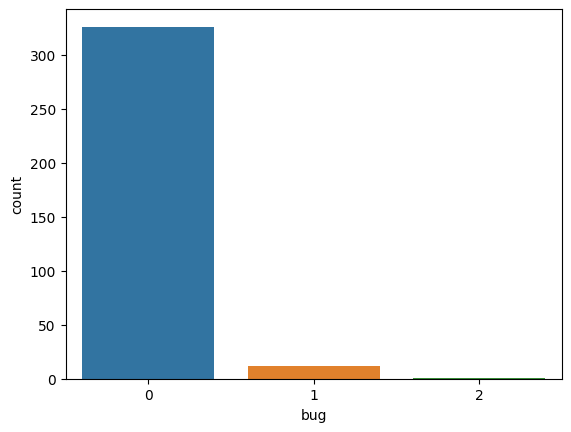

In [10]:
sns.countplot(x=df['bug'])

In [11]:
len(df['bug'].loc[df['bug']==2])

1

In [12]:
len(df['bug'].loc[df['bug']==1])

12

In [13]:
len(df['bug'].loc[df['bug']==0])

326

In [14]:
df['bug']=df['bug'].replace(2, 1)

In [15]:
df['bug'].unique()

array([0, 1], dtype=int64)

<AxesSubplot:xlabel='bug', ylabel='count'>

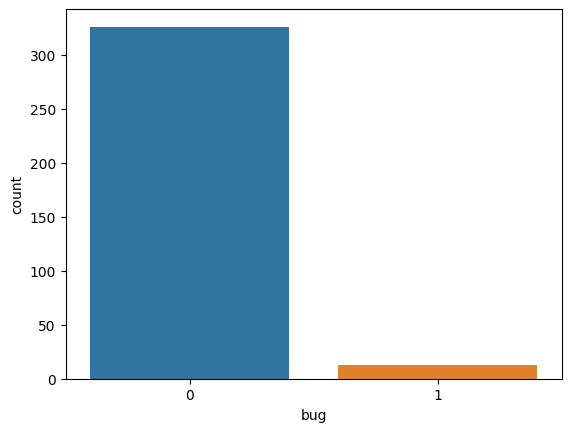

In [16]:
sns.countplot(x=df['bug'])

In [17]:
x = df.drop(columns=['bug', 'name', 'name.1'])
y = df['bug']

### No SMOTE

In [18]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42, stratify=df['bug'])
x_train.shape, y_train.shape

((271, 21), (271,))

In [154]:
knn=KNeighborsClassifier(n_neighbors=5, metric='euclidean')
knn.fit(x_train, y_train)

KNeighborsClassifier(metric='euclidean')

In [155]:
y_test_arr = np.array(y_test)
y_test_arr

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0], dtype=int64)

In [156]:
y_pred = knn.predict(x_test)
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0], dtype=int64)

In [157]:
acc=accuracy_score(y_test, y_pred)
acc

0.9558823529411765

In [158]:
prec = precision_score(y_test, y_pred)
prec

C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0

In [84]:
rec= recall_score(y_test, y_pred)
rec

0.0

In [159]:
confusion_matrix(y_test, y_pred)

array([[65,  0],
       [ 3,  0]], dtype=int64)

In [85]:
y_train.unique()

array([0, 1], dtype=int64)

In [134]:
rf.fit(x_train, y_train)

RandomForestClassifier(max_depth=5, n_estimators=5)

In [135]:
y_pred=rf.predict(x_test)
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0], dtype=int64)

In [136]:
confusion_matrix(y_test, y_pred)

array([[64,  1],
       [ 3,  0]], dtype=int64)

In [137]:
precision_score(y_test, y_pred)

0.0

In [138]:
recall_score(y_test, y_pred)

0.0

In [139]:
f1_score(y_test, y_pred)

0.0

### SMOTE

In [64]:
import imblearn
from imblearn.over_sampling import SMOTE

In [86]:
sm = SMOTE()
x_train_res, y_train_res = sm.fit_resample(x_train, y_train)
x_train_res.shape, y_train_res.shape

((522, 21), (522,))

<AxesSubplot:xlabel='bug', ylabel='count'>

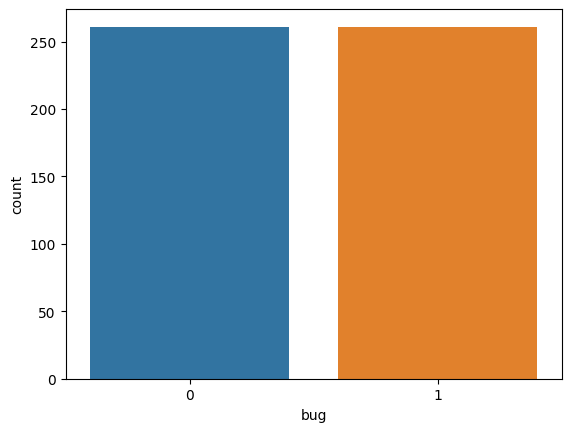

In [87]:
sns.countplot(x=y_train_res)

In [126]:
knn = KNeighborsClassifier(n_neighbors=15, metric='euclidean')

In [127]:
knn.fit(x_train_res, y_train_res)

KNeighborsClassifier(metric='euclidean', n_neighbors=15)

In [128]:
y_pred = knn.predict(x_test)
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0,
       0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0,
       1, 0], dtype=int64)

In [129]:
y_test_arr = np.array(y_test)
y_test_arr

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0], dtype=int64)

In [130]:
conf_matrix = confusion_matrix(y_test, y_pred)
conf_matrix

array([[47, 18],
       [ 2,  1]], dtype=int64)

In [131]:
accuracy_score(y_test, y_pred)

0.7058823529411765

In [132]:
precision_score(y_test, y_pred)

0.05263157894736842

In [133]:
recall_score(y_test, y_pred)

0.3333333333333333

In [125]:
f1_score(y_test, y_pred)

0.0

In [96]:
rf = RandomForestClassifier(n_estimators=5, max_depth=5)
rf.fit(x_train_res, y_train_res)

RandomForestClassifier(max_depth=5, n_estimators=5)

In [97]:
y_pred = rf.predict(x_test)
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0,
       0, 0], dtype=int64)

In [98]:
confusion_matrix(y_test, y_pred)

array([[52, 13],
       [ 2,  1]], dtype=int64)

In [99]:
accuracy_score(y_test, y_pred)

0.7794117647058824

In [100]:
precision_score(y_test, y_pred)

0.07142857142857142

In [101]:
recall_score(y_test, y_pred)

0.3333333333333333

In [102]:
f1_score(y_test, y_pred)

0.11764705882352941

In [1137]:
accu=[]
preci=[]
reca=[]
f1_=[]
auc_=[]
conf_matrix =[]

In [89]:
import smote_variants as sv

In [90]:
var_names =['NoSMOTE', 'SMOTE_TomekLinks', 'SMOTE_ENN', 'Borderline_SMOTE1', 'Borderline_SMOTE2', 'ADASYN', 'LLE_SMOTE', 'AHC', 'distance_SMOTE', 'SMMO', ' polynom_fit_SMOTE_bus', ' polynom_fit_SMOTE_mesh', ' polynom_fit_SMOTE_star', ' polynom_fit_SMOTE_poly', ' Stefanowski', ' Safe_Level_SMOTE', ' MSMOTE', ' DE_oversampling', ' SMOBD', ' SUNDO', ' MSYN', ' SVM_balance', ' TRIM_SMOTE', ' SMOTE_RSB', ' ProWSyn', ' SL_graph_SMOTE', ' NRSBoundary_SMOTE', ' LVQ_SMOTE', ' SOI_CJ', ' ROSE', ' SMOTE_OUT', ' SMOTE_Cosine', ' Selected_SMOTE', ' LN_SMOTE', ' MWMOTE', ' PDFOS', ' IPADE_ID', ' RWO_sampling', ' NEATER', ' DEAGO', ' Gazzah', ' MCT', ' ADG', ' SMOTE_IPF', ' KernelADASYN', ' MOT2LD', ' V_SYNTH', ' OUPS', ' SMOTE_D', ' SMOTE_PSO', ' CURE_SMOTE', ' SOMO', ' CE_SMOTE', ' Edge_Det_SMOTE', ' CBSO', ' DBSMOTE', ' ASMOBD', ' Assembled_SMOTE', ' SDSMOTE', ' DSMOTE', ' G_SMOTE', ' NT_SMOTE', ' Lee', ' SPY', ' SMOTE_PSOBAT', ' MDO', ' Random_SMOTE', ' ISMOTE', ' VIS_RST', ' GASMOTE', ' A_SUWO', ' SMOTE_FRST_2T', ' AND_SMOTE', ' NRAS', ' AMSCO', ' SSO', ' DSRBF', ' NDO_sampling', ' Gaussian_SMOTE', ' kmeans_SMOTE', ' Supervised_SMOTE', ' SN_SMOTE', ' CCR', ' ANS', ' cluster_SMOTE', ' ADOMS', ' SYMPROD']

In [91]:
variants =[sv.NoSMOTE(), sv.SMOTE_TomekLinks(), sv.SMOTE_ENN(), sv.Borderline_SMOTE1(), sv.Borderline_SMOTE2(), sv.ADASYN(), sv.LLE_SMOTE(), sv.AHC(), sv.distance_SMOTE(), sv.SMMO(), sv.polynom_fit_SMOTE_bus(), sv.polynom_fit_SMOTE_mesh(), sv.polynom_fit_SMOTE_star(), sv.polynom_fit_SMOTE_poly(), sv.Stefanowski(), sv.Safe_Level_SMOTE(), sv.MSMOTE(), sv.DE_oversampling(), sv.SMOBD(), sv.SUNDO(), sv.MSYN(), sv.SVM_balance(), sv.TRIM_SMOTE(), sv.SMOTE_RSB(), sv.ProWSyn(), sv.SL_graph_SMOTE(), sv.NRSBoundary_SMOTE(), sv.LVQ_SMOTE(), sv.SOI_CJ(), sv.ROSE(), sv.SMOTE_OUT(), sv.SMOTE_Cosine(), sv.Selected_SMOTE(), sv.LN_SMOTE(), sv.MWMOTE(), sv.PDFOS(), sv.IPADE_ID(), sv.RWO_sampling(), sv.NEATER(), sv.DEAGO(), sv.Gazzah(), sv.MCT(), sv.ADG(), sv.SMOTE_IPF(), sv.KernelADASYN(), sv.MOT2LD(), sv.V_SYNTH(), sv.OUPS(), sv.SMOTE_D(), sv.SMOTE_PSO(), sv.CURE_SMOTE(), sv.SOMO(), sv.CE_SMOTE(), sv.Edge_Det_SMOTE(), sv.CBSO(), sv.DBSMOTE(), sv.ASMOBD(), sv.Assembled_SMOTE(), sv.SDSMOTE(), sv.DSMOTE(), sv.G_SMOTE(), sv.NT_SMOTE(), sv.Lee(), sv.SPY(), sv.SMOTE_PSOBAT(), sv.MDO(), sv.Random_SMOTE(), sv.ISMOTE(), sv.VIS_RST(), sv.GASMOTE(), sv.A_SUWO(), sv.SMOTE_FRST_2T(), sv.AND_SMOTE(), sv.NRAS(), sv.AMSCO(), sv.SSO(), sv.DSRBF(), sv.NDO_sampling(), sv.Gaussian_SMOTE(), sv.kmeans_SMOTE(), sv.Supervised_SMOTE(), sv.SN_SMOTE(), sv.CCR(), sv.ANS(), sv.cluster_SMOTE(), sv.ADOMS(), sv.SYMPROD()]

In [1138]:
x_train_arr = np.array(x_train)
y_train_arr = np.array(y_train)

### No SMOTE

In [1139]:
for i in variants:
    x_samp, y_samp = i.sample(x_train_arr, y_train_arr)
    knn.fit(x_samp, y_samp)
    y_pred = knn.predict(x_test)
    conf= confusion_matrix(y_test, y_pred)
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred)
    conf_matrix.append(conf)
    accu.append(acc)
    preci.append(prec)
    reca.append(rec)
    f1_.append(f1)
    auc_.append(auc)

2023-06-25 20:39:51,653:INFO:NoSMOTE: Running sampling via ('NoSMOTE', "{'raise_value_error': False, 'raise_runtime_error': False, 'random_state': None, 'class_name': 'NoSMOTE'}")
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-06-25 20:39:51,676:INFO:SMOTE_TomekLinks: Running sampling via ('SMOTE_TomekLinks', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state':

2023-06-25 20:39:52,260:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:39:52,261:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:39:52,274:INFO:distance_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-25 20:39:52,306:INFO:SMMO: Running sampling via ('SMMO', "{'proportion': 1.0, 'n_neighbors': 5, 'ensemble': [('sklearn.discriminant_analysis', 'QuadraticDiscriminantAnalysis', {}), ('sklearn.tree', 'DecisionTreeClassifier', {'random_state': 2}), ('sklearn.naive_bayes', 'GaussianNB', {})], 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMMO'}")
2023-06-25 20:39:52,315:INFO:NearestNeighbo

2023-06-25 20:39:53,161:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.5, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:39:53,162:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:39:53,163:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:39:53,184:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:39:53,191:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:39:53,193:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-25 20:39:53,329:INFO:SVM_bal

2023-06-25 20:39:54,115:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:54,126:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:54,136:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:54,147:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:54,159:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:54,169:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:54,180:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:54,190:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:54,200:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:54,211:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:54,221:INFO:NearestNeig

2023-06-25 20:39:55,082:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:55,095:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:55,106:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:55,117:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:55,127:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:55,140:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:55,151:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:55,163:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:55,176:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:55,187:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:55,198:INFO:NearestNeig

2023-06-25 20:39:56,080:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:56,092:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:56,102:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:56,114:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:56,126:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:56,137:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:56,148:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:56,159:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:56,171:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:56,184:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:56,196:INFO:NearestNeig

2023-06-25 20:39:57,079:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:39:57,092:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:39:57,095:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:39:57,107:INFO:NRSBoundary_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-25 20:39:57,228:INFO:LVQ_SMOTE: Running sampling via ('LVQ_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_clusters': 10, 'n_jobs': 1, 'random_state': None, 'class_name': 'LVQ_SMOTE'}")
2023-06-25 20:39:57,337:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:39:57,338:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Py

2023-06-25 20:39:58,135:INFO:IPADE_ID: Running sampling via ('IPADE_ID', "{'F': 0.1, 'G': 0.1, 'OT': 20, 'max_it': 40, 'n_jobs': 1, 'dt_classifier': ('sklearn.tree', 'DecisionTreeClassifier', {'random_state': 2}), 'base_classifier': ('sklearn.tree', 'DecisionTreeClassifier', {'random_state': 2}), 'random_state': None, 'class_name': 'IPADE_ID'}")
2023-06-25 20:39:58,138:INFO:IPADE_ID: Initialization
2023-06-25 20:39:58,144:INFO:IPADE_ID: Size of validation set 263
2023-06-25 20:39:58,145:INFO:IPADE_ID: DE optimization
2023-06-25 20:39:58,254:INFO:IPADE_ID: Starting optimization
2023-06-25 20:39:58,363:INFO:IPADE_ID: Size of validation set 262
2023-06-25 20:39:59,116:INFO:IPADE_ID: Size of validation set 262
2023-06-25 20:39:59,363:INFO:IPADE_ID: Size of validation set 261
2023-06-25 20:39:59,604:INFO:IPADE_ID: Size of validation set 261
2023-06-25 20:40:01,251:INFO:IPADE_ID: Size of validation set 261
2023-06-25 20:40:01,527:INFO:IPADE_ID: Size of validation set 260
C:\Users\KIIT\AppDat

2023-06-25 20:40:14,614:INFO:ADG: stopping the iteration because of Early stopping.
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-25 20:40:14,641:INFO:SMOTE_IPF: Running sampling via ('SMOTE_IPF', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_folds': 9, 'k': 3, 'p': 0.01, 'voting': 'majority', 'n_jobs': 1, 'classifier': ('sklearn.tree', 'DecisionTreeClassifier', {'random_state': 2}), 'random_state': None, 'class_name': 'SMOTE_IPF'}")
2023-06-25 20:40:14,643:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random

2023-06-25 20:40:17,422:INFO:SMOTE_PSO: Iteration 11
2023-06-25 20:40:17,545:INFO:SMOTE_PSO: Iteration 12
2023-06-25 20:40:17,668:INFO:SMOTE_PSO: Iteration 13
2023-06-25 20:40:17,792:INFO:SMOTE_PSO: Iteration 14
2023-06-25 20:40:17,936:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:17,938:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:17,954:INFO:SMOTE_PSO: Iteration 0
2023-06-25 20:40:18,256:INFO:SMOTE_PSO: Iteration 1
2023-06-25 20:40:18,487:INFO:SMOTE_PSO: Iteration 2
2023-06-25 20:40:18,715:INFO:SMOTE_PSO: Iteration 3
2023-06-25 20:40:18,940:INFO:SMOTE_PSO: Iteration 4
2023-06-25 20:40:19,166:INFO:SMOTE_PSO: Iteration 5
2023-06-25 20:40:19,400:INFO:SMOTE_PSO: Iteration 6
2023-06-25 20:40:19,628:INFO:SMOTE_PSO: Iteration 7
2023-06-25 20:40:19,859:INFO:SMOTE_PSO: Iteration 8
2023-06-25 20:40:20,098:INFO:SMOTE_PSO: Iteration 9
2023-06-25 20:40:20,329:INFO:SMOTE_PSO: Iteration 10
2023-06-25 20:40:20,554:INFO:

2023-06-25 20:40:29,546:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:29,547:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:29,571:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:29,581:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:29,582:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:29,604:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:29,615:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:29,616:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:29,638:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:29,649:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:29,651:INFO:NearestNeighborsWithMetricTensor: kneighbors qu

2023-06-25 20:40:30,357:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:30,378:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:40:30,389:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:40:30,398:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:40:30,410:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:40:30,420:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:40:30,430:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:40:30,441:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:40:30,451:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:40:30,461:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 20:40:30,471:INFO:NearestNeighborsW

2023-06-25 20:40:35,885:INFO:Lee: simplex sampling with n_dim 2
2023-06-25 20:40:35,886:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:35,903:INFO:Lee: simplex sampling with n_dim 2
2023-06-25 20:40:35,905:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:35,923:INFO:Lee: simplex sampling with n_dim 2
2023-06-25 20:40:35,925:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:35,942:INFO:Lee: simplex sampling with n_dim 2
2023-06-25 20:40:35,943:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:35,961:INFO:Lee: simplex sampling with n_dim 2
2023-06-25 20:40:35,963:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:35,981:INFO:Lee: simplex sampling with n_dim 2
2023-06-25 20:40:35,982:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:36,000:INFO:Lee: simplex sampling with n_dim 2
2023-06-25 2

2023-06-25 20:40:36,881:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:36,884:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-06-25 20:40:36,926:INFO:SMOTE_PSOBAT: Running sampling via ('SMOTE_PSOBAT', "{'maxit': 50, 'c1': 0.3, 'c2': 0.1, 'c3': 0.1, 'alpha': 0.9, 'gamma': 0.9, 'method': 'bat', 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaus

2023-06-25 20:40:37,480:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:37,481:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:37,500:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:37,514:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8808361620484088, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:37,516:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:37,517:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:37,535:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:37,563:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.18065912102269552, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None

2023-06-25 20:40:37,997:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:38,017:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-25 20:40:38,029:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.32619731142511116, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:38,031:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:38,032:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:38,048:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:38,063:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2453753389980724, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling

2023-06-25 20:40:38,568:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:38,586:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:38,638:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.3958969260135884, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:38,639:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:38,641:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:38,658:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:38,675:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'g

2023-06-25 20:40:39,127:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:39,139:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.11662104529313741, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:39,140:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:39,141:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:39,160:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:39,171:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:3

2023-06-25 20:40:39,681:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:39,682:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:39,683:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:39,700:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:39,713:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4141559206992975, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:39,714:INFO:NearestNeighborsWithMetricTensor: NN fitting with metri

2023-06-25 20:40:40,242:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:40,243:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:40,262:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:40,285:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:40,287:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:40,288:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:40,307:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:40,318:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.12328885391039564, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1

2023-06-25 20:40:40,781:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:40,800:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-25 20:40:40,812:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3150130648380962, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:40,814:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:40,815:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:40,834:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:40,873:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'g

2023-06-25 20:40:41,306:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,307:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,308:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,310:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,311:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,314:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,316:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,318:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,318:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,328:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,330:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,331:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,333:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,335:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,337:INFO:GASMOTE: simplex sa

2023-06-25 20:40:41,620:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,621:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,624:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,626:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,627:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,638:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,639:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,641:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,641:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,644:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,645:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,646:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,648:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,650:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,659:INFO:GASMOTE: simplex sa

2023-06-25 20:40:41,939:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,940:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,942:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,944:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,946:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,955:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,957:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,958:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,960:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,963:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,964:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,966:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,967:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,977:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:41,978:INFO:GASMOTE: simplex sa

2023-06-25 20:40:42,266:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,275:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,277:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,278:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,281:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,282:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,284:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,287:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,288:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,297:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,299:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,300:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,302:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,304:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,306:INFO:GASMOTE: simplex sa

2023-06-25 20:40:42,587:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,598:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,599:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,601:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,602:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,604:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,606:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,608:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,610:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,611:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,620:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,621:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,624:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,626:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,628:INFO:GASMOTE: simplex sa

2023-06-25 20:40:42,921:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,922:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,925:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,927:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,928:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,930:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,939:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,942:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,944:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,945:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,947:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,948:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,950:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,951:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:42,960:INFO:GASMOTE: simplex sa

2023-06-25 20:40:43,243:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,244:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,246:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,254:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,256:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,257:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,260:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,261:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,264:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,265:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,266:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,268:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,278:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,280:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,282:INFO:GASMOTE: simplex sa

2023-06-25 20:40:43,571:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,573:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,575:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,576:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,579:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,580:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,588:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,589:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,592:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,593:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,595:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,596:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,598:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,600:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,602:INFO:GASMOTE: simplex sa

2023-06-25 20:40:43,908:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,910:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,912:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,913:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,915:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,916:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,925:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,926:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,929:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,930:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,931:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,933:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,935:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,938:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:43,939:INFO:GASMOTE: simplex sa

2023-06-25 20:40:44,237:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,239:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,241:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,242:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,252:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,253:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,256:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,258:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,260:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,261:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,263:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,265:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,267:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,278:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,279:INFO:GASMOTE: simplex sa

2023-06-25 20:40:44,557:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,559:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,568:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,570:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,571:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,573:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,575:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,576:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,578:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,582:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,584:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,592:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,593:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,595:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:44,598:INFO:GASMOTE: simplex sa

2023-06-25 20:40:44,982:INFO:SMOTE_FRST_2T: iteration: 1
2023-06-25 20:40:44,983:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.2, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:44,984:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:44,986:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:45,005:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:45,009:INFO:SMOTE_FRST_2T: minority added: 18, majority removed: 0
2023-06-25 20:40:45,010:INFO:SMOTE_FRST_2T: iteration: 2
2023-06-25 20:40:45,011:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.2, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_componen

2023-06-25 20:40:45,357:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:45,358:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:45,374:INFO:NRAS: returning copies for most minority samples indentified as noise
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-06-25 20:40:45,400:INFO:AMSCO: Running sampling via ('AMSCO', "{'n_pop': 5, 'n_iter': 12, 'omega': 0.1, 'r1': 0.1, 'r2': 0.1, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_samplin

2023-06-25 20:40:45,925:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:45,944:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:45,978:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5310343336987464, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:45,980:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:45,980:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:45,999:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:46,041:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.145412916601611, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling

2023-06-25 20:40:46,755:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:46,774:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:46,831:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.925853415917795, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:46,832:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:46,833:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:46,851:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:46,902:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2732855160076824, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling

2023-06-25 20:40:47,930:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:47,951:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:48,009:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.557561386724373, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:48,011:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:48,012:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:48,030:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:48,099:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.551391067474937, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling'

2023-06-25 20:40:49,334:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:49,354:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:49,442:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7111359448488512, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:49,443:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:49,444:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:49,463:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:49,542:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.5918643049119474, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_samplin

2023-06-25 20:40:50,726:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:50,727:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:50,746:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:50,775:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3432700849462715, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:50,776:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:50,777:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:50,797:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:50,823:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3747237091124873, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None

2023-06-25 20:40:51,582:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:51,583:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:51,600:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:51,658:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1600095170783744, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:51,659:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:51,660:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:51,679:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:51,742:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1316858258774625, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 20:40:52,845:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:52,846:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:52,864:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:52,949:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.291353742036894, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:52,951:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:52,952:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:52,971:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:53,059:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.4355777809189183, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 20:40:54,540:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:54,541:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:54,559:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:54,669:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:54,670:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:54,671:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:54,689:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:54,799:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': 

2023-06-25 20:40:56,192:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:56,193:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:56,211:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:56,231:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.866150399087134, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:56,233:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:56,234:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:56,252:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:56,273:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7722664313373406, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 20:40:56,827:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:56,828:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:56,847:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:56,879:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0648647702542564, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:56,880:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:56,881:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:56,900:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:56,921:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.31795845307973, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None},

2023-06-25 20:40:57,595:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:57,596:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:57,614:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:57,653:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4786604995067785, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:57,654:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:57,655:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:57,673:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:57,708:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5682491438852049, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 20:40:58,565:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:58,566:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:58,584:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:58,634:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0853359811995786, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:58,635:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:58,636:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:58,654:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:58,711:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9284100059939993, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 20:40:59,741:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:59,742:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:59,762:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:40:59,909:INFO:AMSCO: fitness scores: 0.800315 0.826974 0.800315 0.826974
2023-06-25 20:40:59,910:INFO:AMSCO starting iteration 3
2023-06-25 20:40:59,911:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9277687699722104, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:40:59,915:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:40:59,916:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:40:59,932:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20

2023-06-25 20:41:00,565:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:00,566:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:00,585:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:00,623:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5661260508485788, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:00,624:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:00,625:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:00,644:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:00,686:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.514247472788318, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-25 20:41:01,532:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:01,534:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:01,553:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:01,604:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.110159716766253, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:01,605:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:01,606:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:01,625:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:01,684:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.406517926214369, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-25 20:41:02,827:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:02,828:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:02,847:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:02,933:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.892043532184878, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:02,935:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:02,936:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:02,956:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:03,039:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.0682942669335143, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 20:41:04,488:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:04,489:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:04,509:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:04,613:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.8523854181942574, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:04,614:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:04,616:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:04,631:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:04,737:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.97645746308739, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-25 20:41:05,622:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:05,623:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:05,641:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:05,668:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9105712701707495, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:05,669:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:05,670:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:05,689:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:05,710:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1293093813904633, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}

2023-06-25 20:41:06,381:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:06,382:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:06,401:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:06,450:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5076130692495986, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:06,452:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:06,452:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:06,470:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:06,512:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.45836416242175, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 

2023-06-25 20:41:07,418:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:07,419:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:07,440:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:07,519:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.426683279293148, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:07,521:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:07,522:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:07,543:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:07,610:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3254572933166924, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 20:41:08,856:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:08,857:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:08,875:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:08,961:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.7276064786041117, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:08,963:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:08,964:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:08,984:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:09,088:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.7706187004828013, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 20:41:10,307:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:10,307:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:10,328:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:10,358:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.058152822396848, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:10,359:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:10,360:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:10,378:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:10,405:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3676684003711241, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None},

2023-06-25 20:41:11,129:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:11,130:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:11,148:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:11,181:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.672113745961483, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:11,183:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:11,184:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:11,202:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:11,250:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6897108453181806, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 20:41:12,236:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:12,237:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:12,257:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:12,332:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1444727505072736, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:12,333:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:12,334:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:12,352:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:12,416:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7095759556525096, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 20:41:13,733:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:13,734:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:13,755:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:13,866:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:13,867:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:13,868:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:13,885:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:13,993:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.4562552439348178, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1

2023-06-25 20:41:15,579:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:15,580:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:15,600:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:15,629:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8579552555246223, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:15,631:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:15,632:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:15,652:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:15,674:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9298347140698924, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 20:41:16,293:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:16,294:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:16,314:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:16,362:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.433758299672737, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:16,364:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:16,365:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:16,385:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:16,418:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3459415741539247, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-25 20:41:17,311:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:17,312:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:17,330:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:17,383:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.666876472537305, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:17,384:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:17,384:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:17,403:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:17,476:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.269304247068968, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-25 20:41:18,610:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:18,611:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:18,631:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:18,703:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.966404301629336, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:18,704:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:18,706:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:18,726:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:18,812:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.866355600033667, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-25 20:41:20,211:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:20,213:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:20,231:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:20,323:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.293013359207405, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:20,324:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:20,325:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:20,344:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:20,437:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.8992901211787454, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 20:41:21,151:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:21,152:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:21,170:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:21,198:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2507491110172448, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:21,199:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:21,200:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:21,218:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:21,254:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0658551868467452, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None

2023-06-25 20:41:21,967:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:21,968:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:21,988:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:22,021:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8249662385680439, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:22,022:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:22,023:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:22,042:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:22,099:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.011180857520295, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 20:41:23,057:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:23,059:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:23,076:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:23,151:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0255224013241127, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:23,153:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:23,154:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:23,174:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:23,232:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5983232973659423, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 20:41:24,456:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:24,457:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:24,480:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:24,555:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.735725403032121, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:24,556:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:24,557:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:24,578:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:24,685:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.1114938033231785, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 20:41:25,823:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:25,824:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:25,845:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:25,884:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2981954777083415, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:25,885:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:25,886:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:25,909:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:25,942:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8494654993420583, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 20:41:26,677:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:26,678:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:26,696:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:26,736:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1330853039843762, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:26,738:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:26,738:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:26,758:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:26,818:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0162519883040018, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 20:41:27,772:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:27,774:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:27,794:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:27,865:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.155219843825086, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:27,867:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:27,868:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:27,887:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:27,940:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.09308115879639, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None},

2023-06-25 20:41:29,208:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:29,209:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:29,228:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:29,312:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.272842443579625, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:29,314:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:29,315:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:29,333:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:29,423:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.003545349817092, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-25 20:41:30,711:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:30,712:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:30,734:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:30,753:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.6701546469629825, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:30,754:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:30,755:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:30,776:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:30,797:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2763485667459036, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 20:41:31,447:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:31,449:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:31,470:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:31,507:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0750181461890556, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:31,508:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:31,509:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:31,530:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:31,559:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0343054321909875, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 20:41:32,308:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:32,309:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:32,329:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:32,373:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5637130039361407, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:32,375:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:32,376:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:32,395:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:32,433:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4492825856452018, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 20:41:33,285:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:33,285:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:33,303:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:33,387:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0951800208084603, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:33,388:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:33,389:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:33,407:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:33,462:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9581696571188714, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 20:41:34,528:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:34,529:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:34,548:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:34,679:INFO:AMSCO: fitness scores: 0.812916 0.826974 0.812916 0.826974
2023-06-25 20:41:34,680:INFO:AMSCO starting iteration 10
2023-06-25 20:41:34,683:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7142966487482063, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:34,684:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:34,686:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:34,704:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 

2023-06-25 20:41:35,338:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:35,339:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:35,358:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:35,384:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.305248288880786, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:35,385:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:35,386:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:35,405:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:35,440:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0819851294960807, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-25 20:41:36,137:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:36,138:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:36,157:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:36,207:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.360441679546017, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:36,208:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:36,209:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:36,229:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:36,269:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9931967138038886, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 20:41:37,192:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:37,193:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:37,218:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:37,281:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5792951486236144, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:37,282:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:37,284:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:37,307:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:37,390:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1840304605825342, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 20:41:38,642:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:38,643:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:38,662:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:38,750:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.246106436739168, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:38,751:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:38,752:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:38,773:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:38,866:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.5845635949596315, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 20:41:39,768:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:39,770:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:39,791:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:39,818:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4641771846272926, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:39,820:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:39,821:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:39,841:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:39,881:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3274048347876555, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 20:41:40,670:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:40,671:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:40,691:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:40,748:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9320543650839805, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:40,749:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:40,750:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:40,768:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:40,817:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.254674308672849, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 20:41:41,888:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:41,890:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:41,911:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:41,982:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.780158253689378, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:41,984:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:41,985:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:42,006:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:42,088:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6129085798449956, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 20:41:43,418:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:43,420:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:43,436:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:43,537:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.580598298240746, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:43,538:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:43,539:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:43,557:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:43,656:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.4905169320252716, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 20:41:45,588:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:45,589:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:45,609:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:47,517:INFO:DSRBF: Iteration 0/40, loss: 0.899330, data size: 522
2023-06-25 20:41:47,548:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 20:41:47,550:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:41:47,551:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:41:47,573:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 20:41:50,789:INFO:DSRBF: Iteration 1/40, loss: 0.899330, data size: 522
2023-0

2023-06-25 20:42:05,282:INFO:kmeans_SMOTE: returning copies for number of clusters after filtering is 0
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-06-25 20:42:05,305:INFO:Supervised_SMOTE: Running sampling via ('Supervised_SMOTE', "{'proportion': 1.0, 'th_lower': 0.5, 'th_upper': 1.0, 'classifier': ('sklearn.ensemble', 'RandomForestClassifier', {'n_estimators': 50, 'n_jobs': 1, 'random_state': 5}), 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaus

2023-06-25 20:42:06,062:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:42:06,084:INFO:SYMPROD: Cutoff value updated from 1.250000 to 1.250000
2023-06-25 20:42:06,086:INFO:SYMPROD: returning copies for Not enough samples for m_neighbors 7
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [1143]:
accu

[0.9558823529411765,
 0.7205882352941176,
 0.9558823529411765,
 0.9264705882352942,
 0.9264705882352942,
 0.7058823529411765,
 0.8235294117647058,
 0.9558823529411765,
 0.7352941176470589,
 0.8235294117647058,
 0.8235294117647058,
 0.7352941176470589,
 0.8235294117647058,
 0.8970588235294118,
 0.9411764705882353,
 0.75,
 0.9411764705882353,
 0.7794117647058824,
 0.9558823529411765,
 0.9117647058823529,
 0.7941176470588235,
 0.7205882352941176,
 0.8676470588235294,
 0.9264705882352942,
 0.7352941176470589,
 0.9411764705882353,
 0.8382352941176471,
 0.8382352941176471,
 0.9558823529411765,
 0.8823529411764706,
 0.7647058823529411,
 0.7941176470588235,
 0.7352941176470589,
 0.9411764705882353,
 0.8235294117647058,
 0.8823529411764706,
 0.9558823529411765,
 0.8823529411764706,
 0.7647058823529411,
 0.9117647058823529,
 0.8088235294117647,
 0.7794117647058824,
 0.8529411764705882,
 0.7205882352941176,
 0.9117647058823529,
 0.9264705882352942,
 0.7058823529411765,
 0.6470588235294118,
 0.852

In [1141]:
conf_matrix

[array([[65,  0],
        [ 3,  0]], dtype=int64),
 array([[48, 17],
        [ 2,  1]], dtype=int64),
 array([[65,  0],
        [ 3,  0]], dtype=int64),
 array([[63,  2],
        [ 3,  0]], dtype=int64),
 array([[63,  2],
        [ 3,  0]], dtype=int64),
 array([[47, 18],
        [ 2,  1]], dtype=int64),
 array([[56,  9],
        [ 3,  0]], dtype=int64),
 array([[65,  0],
        [ 3,  0]], dtype=int64),
 array([[49, 16],
        [ 2,  1]], dtype=int64),
 array([[56,  9],
        [ 3,  0]], dtype=int64),
 array([[55, 10],
        [ 2,  1]], dtype=int64),
 array([[49, 16],
        [ 2,  1]], dtype=int64),
 array([[54, 11],
        [ 1,  2]], dtype=int64),
 array([[60,  5],
        [ 2,  1]], dtype=int64),
 array([[64,  1],
        [ 3,  0]], dtype=int64),
 array([[49, 16],
        [ 1,  2]], dtype=int64),
 array([[64,  1],
        [ 3,  0]], dtype=int64),
 array([[53, 12],
        [ 3,  0]], dtype=int64),
 array([[65,  0],
        [ 3,  0]], dtype=int64),
 array([[62,  3],
        [ 3, 

In [1146]:
for i in range(len(variants)):
    print("SMOTE variant :", var_names[i])
    print("confusion matrix :")
    print(conf_matrix[i])
    print("accuracy :", accu[i])
    print("precision :", preci[i])
    print("recall :", reca[i])
    print("f1_Score :", f1_[i])
    print("auc score:", auc_[i])

SMOTE variant : NoSMOTE
confusion matrix :
[[65  0]
 [ 3  0]]
accuracy : 0.9558823529411765
precision : 0.0
recall : 0.0
f1_Score : 0.0
auc score: 0.5
SMOTE variant : SMOTE_TomekLinks
confusion matrix :
[[48 17]
 [ 2  1]]
accuracy : 0.7205882352941176
precision : 0.05555555555555555
recall : 0.3333333333333333
f1_Score : 0.09523809523809525
auc score: 0.5358974358974359
SMOTE variant : SMOTE_ENN
confusion matrix :
[[65  0]
 [ 3  0]]
accuracy : 0.9558823529411765
precision : 0.0
recall : 0.0
f1_Score : 0.0
auc score: 0.5
SMOTE variant : Borderline_SMOTE1
confusion matrix :
[[63  2]
 [ 3  0]]
accuracy : 0.9264705882352942
precision : 0.0
recall : 0.0
f1_Score : 0.0
auc score: 0.4846153846153846
SMOTE variant : Borderline_SMOTE2
confusion matrix :
[[63  2]
 [ 3  0]]
accuracy : 0.9264705882352942
precision : 0.0
recall : 0.0
f1_Score : 0.0
auc score: 0.4846153846153846
SMOTE variant : ADASYN
confusion matrix :
[[47 18]
 [ 2  1]]
accuracy : 0.7058823529411765
precision : 0.05263157894736842

In [1147]:
conf_matrix[1]

array([[48, 17],
       [ 2,  1]], dtype=int64)

In [1150]:
knn_better=[]

In [1151]:
for i in range(len(variants)):
    if(conf_matrix[i][1][1] > 0):
        print("SMOTE variant :", var_names[i])
        print("confusion matrix :")
        print(conf_matrix[i])
        print("accuracy :", accu[i])
        print("precision :", preci[i])
        print("recall :", reca[i])
        print("f1_Score :", f1_[i])
        print("auc score:", auc_[i])
        knn_better.append(var_names[i])

SMOTE variant : SMOTE_TomekLinks
confusion matrix :
[[48 17]
 [ 2  1]]
accuracy : 0.7205882352941176
precision : 0.05555555555555555
recall : 0.3333333333333333
f1_Score : 0.09523809523809525
auc score: 0.5358974358974359
SMOTE variant : ADASYN
confusion matrix :
[[47 18]
 [ 2  1]]
accuracy : 0.7058823529411765
precision : 0.05263157894736842
recall : 0.3333333333333333
f1_Score : 0.09090909090909091
auc score: 0.5282051282051281
SMOTE variant : distance_SMOTE
confusion matrix :
[[49 16]
 [ 2  1]]
accuracy : 0.7352941176470589
precision : 0.058823529411764705
recall : 0.3333333333333333
f1_Score : 0.1
auc score: 0.5435897435897435
SMOTE variant :  polynom_fit_SMOTE_bus
confusion matrix :
[[55 10]
 [ 2  1]]
accuracy : 0.8235294117647058
precision : 0.09090909090909091
recall : 0.3333333333333333
f1_Score : 0.14285714285714288
auc score: 0.5897435897435898
SMOTE variant :  polynom_fit_SMOTE_mesh
confusion matrix :
[[49 16]
 [ 2  1]]
accuracy : 0.7352941176470589
precision : 0.05882352941

In [1153]:
knn_better

['SMOTE_TomekLinks',
 'ADASYN',
 'distance_SMOTE',
 ' polynom_fit_SMOTE_bus',
 ' polynom_fit_SMOTE_mesh',
 ' polynom_fit_SMOTE_star',
 ' polynom_fit_SMOTE_poly',
 ' Safe_Level_SMOTE',
 ' SVM_balance',
 ' TRIM_SMOTE',
 ' ProWSyn',
 ' NRSBoundary_SMOTE',
 ' LVQ_SMOTE',
 ' ROSE',
 ' SMOTE_OUT',
 ' SMOTE_Cosine',
 ' Selected_SMOTE',
 ' PDFOS',
 ' RWO_sampling',
 ' NEATER',
 ' DEAGO',
 ' Gazzah',
 ' MCT',
 ' ADG',
 ' SMOTE_IPF',
 ' OUPS',
 ' SMOTE_D',
 ' SMOTE_PSO',
 ' CURE_SMOTE',
 ' Edge_Det_SMOTE',
 ' CBSO',
 ' DBSMOTE',
 ' Assembled_SMOTE',
 ' SDSMOTE',
 ' G_SMOTE',
 ' NT_SMOTE',
 ' SMOTE_PSOBAT',
 ' Random_SMOTE',
 ' ISMOTE',
 ' VIS_RST',
 ' SMOTE_FRST_2T',
 ' AMSCO',
 ' SSO',
 ' DSRBF',
 ' NDO_sampling',
 ' Gaussian_SMOTE',
 ' Supervised_SMOTE',
 ' SN_SMOTE',
 ' CCR',
 ' cluster_SMOTE',
 ' ADOMS']

In [1164]:
TN=[]
FP=[]
FN=[]
TP=[]

In [1165]:
for i in range(len(conf_matrix)):
    TN.append(conf_matrix[i][0][0])
    FP.append(conf_matrix[i][0][1])
    FN.append(conf_matrix[i][1][0])
    TP.append(conf_matrix[i][1][1])

In [1156]:
camel_knn = pd.DataFrame(list(zip(var_names, TN, TP, FN, FP, accu, preci, reca, f1_, auc_)),
              columns=['Variants','TN', 'TP', 'FN', 'FP', 'Accuracy', 'Precision', 'Recall', 'F1', 'AUC'])

In [1166]:
len(var_names), len(TN), len(TP), len(FP), len(FN), len(accu), len(preci), len(f1_), len(auc_)

(87, 87, 87, 87, 87, 87, 87, 87, 87)

In [1167]:
camel_knn_val = pd.DataFrame({'variants':var_names, 'TN':TN, 'TP':TP, 'FP':FP, 'FN':FN, 'ACcuracy':accu, 'Precision':preci, 'Recall':reca, 'F1':f1_, 'AUC':auc_})

In [1168]:
camel_knn_val

,variants,TN,TP,FP,FN,ACcuracy,Precision,Recall,F1,AUC
0,NoSMOTE,65,0,0,3,0.955882,0.000000,0.000000,0.000000,0.500000
1,SMOTE_TomekLinks,48,1,17,2,0.720588,0.055556,0.333333,0.095238,0.535897
2,SMOTE_ENN,65,0,0,3,0.955882,0.000000,0.000000,0.000000,0.500000
3,Borderline_SMOTE1,63,0,2,3,0.926471,0.000000,0.000000,0.000000,0.484615
4,Borderline_SMOTE2,63,0,2,3,0.926471,0.000000,0.000000,0.000000,0.484615
...,...,...,...,...,...,...,...,...,...,...
82,CCR,51,1,14,2,0.764706,0.066667,0.333333,0.111111,0.558974
83,ANS,64,0,1,3,0.941176,0.000000,0.000000,0.000000,0.492308
84,cluster_SMOTE,57,1,8,2,0.852941,0.111111,0.333333,0.166667,0.605128
85,ADOMS,50,1,15,2,0.750000,0.062500,0.333333,0.105263,0.551282


In [1169]:
camel_knn_results = camel_knn_val.to_csv('camel_knn_results.csv')

In [1127]:
isomap = sv.G_SMOTE()
x_samp , y_samp = isomap.sample(x_train_arr, y_train_arr)

2023-06-25 20:14:36,587:INFO:G_SMOTE: Running sampling via ('G_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'method': 'linear', 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'G_SMOTE'}")
2023-06-25 20:14:36,588:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 20:14:36,590:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 20:14:36,605:INFO:G_SMOTE: simplex sampling with n_dim 2


In [1128]:
knn.fit(x_samp, y_samp)

KNeighborsClassifier(metric='euclidean', n_neighbors=15)

In [1129]:
y_pred= knn.predict(x_test)
y_pred

C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0], dtype=int64)

In [1133]:
es = sv.E_SMOTE()
x_samp, y_samp = es.sample(x_train_arr, y_train_arr)

2023-06-25 20:38:46,358:INFO:E_SMOTE: Running sampling via ('E_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'min_features': 2, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state': None, 'class_name': 'E_SMOTE'}")
2023-06-25 20:38:46,360:INFO:E_SMOTE evaluting mask selection with features 6/21
2023-06-25 20:38:46,366:INFO:E_SMOTE evaluting mask selection with features 13/21
2023-06-25 20:38:46,379:INFO:E_SMOTE evaluting mask selection with features 9/21
2023-06-25 20:38:46,388:INFO:E_SMOTE evaluting mask selection with features 2/21
2023-06-25 20:38:46,392:INFO:E_SMOTE evaluting mask selection with features 2/21
2023-06-25 20:38:46,396:INFO:E_SMOTE evaluting mask selection with features 11/21
2023-06-25 20:38:46,407:INFO:E_SMOTE evaluting mask selection with features 9/21
2023-06-25 20:38:46,420:INFO:E_SMOTE evaluting mask selection with features 5/21
2023-06-25 20:38:46,

2023-06-25 20:38:47,778:INFO:E_SMOTE evaluting mask selection with features 13/21
2023-06-25 20:38:47,798:INFO:E_SMOTE evaluting mask selection with features 14/21
2023-06-25 20:38:47,812:INFO:E_SMOTE evaluting mask selection with features 12/21
2023-06-25 20:38:47,833:INFO:E_SMOTE evaluting mask selection with features 11/21
2023-06-25 20:38:47,849:INFO:E_SMOTE evaluting mask selection with features 11/21
2023-06-25 20:38:47,861:INFO:E_SMOTE evaluting mask selection with features 14/21
2023-06-25 20:38:47,879:INFO:E_SMOTE evaluting mask selection with features 11/21
2023-06-25 20:38:47,896:INFO:E_SMOTE evaluting mask selection with features 10/21
2023-06-25 20:38:47,913:INFO:E_SMOTE evaluting mask selection with features 12/21
2023-06-25 20:38:47,930:INFO:E_SMOTE evaluting mask selection with features 12/21
2023-06-25 20:38:47,944:INFO:E_SMOTE evaluting mask selection with features 11/21
2023-06-25 20:38:47,959:INFO:E_SMOTE evaluting mask selection with features 10/21
2023-06-25 20:38

2023-06-25 20:38:49,117:INFO:E_SMOTE evaluting mask selection with features 14/21
2023-06-25 20:38:49,133:INFO:E_SMOTE evaluting mask selection with features 12/21
2023-06-25 20:38:49,146:INFO:E_SMOTE evaluting mask selection with features 11/21
2023-06-25 20:38:49,161:INFO:E_SMOTE evaluting mask selection with features 8/21
2023-06-25 20:38:49,172:INFO:E_SMOTE evaluting mask selection with features 14/21
2023-06-25 20:38:49,187:INFO:E_SMOTE evaluting mask selection with features 6/21
2023-06-25 20:38:49,195:INFO:E_SMOTE evaluting mask selection with features 13/21
2023-06-25 20:38:49,210:INFO:E_SMOTE evaluting mask selection with features 12/21
2023-06-25 20:38:49,224:INFO:E_SMOTE evaluting mask selection with features 11/21
2023-06-25 20:38:49,240:INFO:E_SMOTE evaluting mask selection with features 11/21
2023-06-25 20:38:49,256:INFO:E_SMOTE evaluting mask selection with features 10/21
2023-06-25 20:38:49,272:INFO:E_SMOTE evaluting mask selection with features 12/21
2023-06-25 20:38:4

In [1134]:
knn.fit(x_samp, y_samp)

KNeighborsClassifier(metric='euclidean', n_neighbors=15)

In [1135]:
y_pred = knn.predict(x_test)

C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(


ValueError: X has 21 features, but KNeighborsClassifier is expecting 13 features as input.

In [1182]:
rf = RandomForestClassifier(n_estimators = 50, max_depth = 5)
rf.fit(x_train, y_train)

RandomForestClassifier(max_depth=5, n_estimators=50)

In [1183]:
y_pred_rf = rf.predict(x_test)
y_pred_rf

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0], dtype=int64)

In [1184]:
accu_rf=[]
preci_rf=[]
reca_rf=[]
f1_rf=[]
auc_rf=[]
conf_matrix_rf =[]

In [1185]:
for i in variants:
    x_samp, y_samp = i.sample(x_train_arr, y_train_arr)
    rf.fit(x_samp, y_samp)
    y_pred = rf.predict(x_test)
    conf= confusion_matrix(y_test, y_pred)
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred)
    conf_matrix_rf.append(conf)
    accu_rf.append(acc)
    preci_rf.append(prec)
    reca_rf.append(rec)
    f1_rf.append(f1)
    auc_rf.append(auc)

2023-06-25 22:09:25,796:INFO:NoSMOTE: Running sampling via ('NoSMOTE', "{'raise_value_error': False, 'raise_runtime_error': False, 'random_state': None, 'class_name': 'NoSMOTE'}")
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-25 22:09:25,967:INFO:SMOTE_TomekLinks: Running sampling via ('SMOTE_TomekLinks', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state': None, 'class_name': 'SMOTE_TomekLinks'}")
2023-06-25 22:09:25,971:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, '

2023-06-25 22:09:28,054:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:09:28,056:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:09:28,082:INFO:SMMO: simplex sampling with n_dim 2
2023-06-25 22:09:28,087:INFO:SMMO: simplex sampling with n_dim 2
2023-06-25 22:09:28,090:INFO:SMMO: simplex sampling with n_dim 2
2023-06-25 22:09:28,093:INFO:SMMO: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-25 22:09:28,264:INFO:polynom_fit_SMOTE_bus: Running sampling via ('polynom_fit_SMOTE_bus', "{'proportion': 1.0, 'topology': 'bus', 'random_state': None, 'class_name': 'polynom_fit_SMOTE_bus'}")
2023-06-25 22:09:28,266:INFO:polynom_fit_SMOTE: Running sampling via ('polynom_fit_SMOTE', "{'proportion': 1.0, 'topology': 'bus', 'random_state': N

2023-06-25 22:09:30,371:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:09:30,372:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:09:30,374:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:09:30,397:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:09:30,403:INFO:SVM_balance: Evaluating SVM with C=0.010000
2023-06-25 22:09:30,531:INFO:SVM_balance: Evaluating SVM with C=0.100000
2023-06-25 22:09:30,605:INFO:SVM_balance: Evaluating SVM with C=1.000000
2023-06-25 22:09:30,650:INFO:SVM_balance: Evaluating SVM with C=10.000000
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifie

2023-06-25 22:09:31,801:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:31,811:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:31,824:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:31,837:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:31,849:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:31,861:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:31,874:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:31,888:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:31,899:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:31,911:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:31,924:INFO:NearestNeig

2023-06-25 22:09:32,893:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:32,906:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:32,918:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:32,932:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:32,944:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:32,958:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:32,972:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:32,985:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:32,997:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:33,011:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:33,025:INFO:NearestNeig

2023-06-25 22:09:33,981:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:33,995:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:34,008:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:34,020:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:34,032:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:34,045:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:34,058:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:34,069:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:34,082:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:34,093:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:34,106:INFO:NearestNeig

2023-06-25 22:09:35,491:INFO:SOI_CJ: Executing clustering
2023-06-25 22:09:35,494:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:09:35,494:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:09:35,496:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:09:35,513:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:35,527:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:09:35,540:INFO:SOI_CJ: returning copies for No clusters with at least 2 elements
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-25 22:09:35,646:INFO:ROSE: Running sampling via ('ROSE', "{'proportion': 1.0, 'random_state': None, 'class_name': 'ROSE'}")
C:\Users\KIIT\AppData\Local\Programs\

2023-06-25 22:09:39,093:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:09:39,094:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:09:39,096:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:09:39,118:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:09:39,121:INFO:ADASYN: Running sampling via ('ADASYN', "{'n_neighbors': 5, 'd_th': 0.9, 'beta': 1.0, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'proportion': 1.0, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'ADASYN'}")
2023-06-25 22:09:39,122:INFO:NearestNeighborsWithMetricTensor: NN fitti

2023-06-25 22:09:54,051:INFO:KernelADASYN: Running sampling via ('KernelADASYN', "{'proportion': 1.0, 'k': 5, 'nn_params': {}, 'h': 1.0, 'n_jobs': 1, 'random_state': None, 'class_name': 'KernelADASYN'}")
2023-06-25 22:09:54,052:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:09:54,054:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:09:54,057:INFO:KernelADASYN: reducing dimensions due to improperly conditioned covariance matrix
2023-06-25 22:09:54,059:INFO:KernelADASYN: Running sampling via ('KernelADASYN', "{'proportion': 1.0, 'k': 5, 'nn_params': {}, 'h': 1.0, 'n_jobs': 1, 'random_state': None, 'class_name': 'KernelADASYN'}")
2023-06-25 22:09:54,060:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:09:54,062:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:09:54,064:INFO:KernelADASYN: reducing dimensions due to improperly conditioned covariance matri

2023-06-25 22:10:08,734:INFO:SMOTE_PSO: Iteration 14
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-25 22:10:09,281:INFO:CURE_SMOTE: Running sampling via ('CURE_SMOTE', "{'proportion': 1.0, 'n_clusters': 5, 'noise_th': 2, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'CURE_SMOTE'}")
2023-06-25 22:10:09,285:INFO:CURE_SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:09,286:INFO:CURE_SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:09,288:INFO:CURE_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.

2023-06-25 22:10:11,198:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:10:11,208:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:10:11,217:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:10:11,227:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:10:11,236:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:10:11,246:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:10:11,258:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:10:11,271:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:10:11,301:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:11,303:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-25 22:10:11,316:INFO:NearestNeig

2023-06-25 22:10:18,847:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:18,849:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:18,860:INFO:G_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-25 22:10:18,938:INFO:NT_SMOTE: Running sampling via ('NT_SMOTE', "{'proportion': 1.0, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 3, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'NT_SMOTE'}")
2023-06-25 22:10:18,939:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:18,940:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:18,951:INFO:NT_SMOTE: simplex sampling with n

2023-06-25 22:10:19,802:INFO:Lee: simplex sampling with n_dim 2
2023-06-25 22:10:19,804:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:19,823:INFO:Lee: simplex sampling with n_dim 2
2023-06-25 22:10:19,824:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:19,841:INFO:Lee: simplex sampling with n_dim 2
2023-06-25 22:10:19,843:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:19,860:INFO:Lee: simplex sampling with n_dim 2
2023-06-25 22:10:19,863:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:19,882:INFO:Lee: simplex sampling with n_dim 2
2023-06-25 22:10:19,884:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:19,902:INFO:Lee: simplex sampling with n_dim 2
2023-06-25 22:10:19,903:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:19,920:INFO:Lee: simplex sampling with n_dim 2
2023-06-25 2

2023-06-25 22:10:20,798:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:20,799:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:20,818:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:20,888:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9071378930549497, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:20,889:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:20,890:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:20,908:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:20,939:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1,

2023-06-25 22:10:21,801:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:21,819:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-25 22:10:21,832:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5328943785666527, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:21,833:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:21,834:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:21,854:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:21,893:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.17227799238045952, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling

2023-06-25 22:10:22,731:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:22,803:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:22,804:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:22,805:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:22,826:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:22,889:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:22,891:INFO:Nea

2023-06-25 22:10:23,829:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:23,830:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:23,831:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:23,850:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:23,904:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:23,905:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023

2023-06-25 22:10:24,757:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:24,758:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:24,777:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:24,843:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:24,844:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:24,845:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:24,865:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:24,933:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6684942575338342, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1,

2023-06-25 22:10:25,847:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:25,865:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:25,896:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:25,897:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:25,898:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:25,918:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:25,971:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_compon

2023-06-25 22:10:26,828:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:26,869:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:26,870:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:26,871:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:26,891:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-25 22:10:26,905:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9376403612092088, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:26

2023-06-25 22:10:27,927:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:27,928:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:27,952:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:27,953:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:27,962:INFO:ISMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-25 22:10:28,036:INFO:VIS_RST: Running sampling via ('VIS_RST', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'VIS_RST'}")
2023-06-25 22:10:28,040:INFO:NearestNeighborsWit

2023-06-25 22:10:28,412:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,413:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,416:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,426:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,427:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,429:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,431:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,435:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,436:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,438:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,440:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,450:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,451:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,452:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,454:INFO:GASMOTE: simplex sa

2023-06-25 22:10:28,753:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,755:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,758:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,759:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,761:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,763:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,775:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,777:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,778:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,780:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,781:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,783:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,785:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,787:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:28,798:INFO:GASMOTE: simplex sa

2023-06-25 22:10:29,088:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,090:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,092:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,095:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,105:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,106:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,108:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,110:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,112:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,113:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,114:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,126:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,127:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,128:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,131:INFO:GASMOTE: simplex sa

2023-06-25 22:10:29,437:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,449:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,451:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,453:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,455:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,457:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,460:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,462:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,463:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,474:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,477:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,478:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,480:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,482:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,484:INFO:GASMOTE: simplex sa

2023-06-25 22:10:29,800:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,803:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,804:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,805:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,808:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,811:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,820:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,821:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,824:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,825:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,828:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,830:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,839:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,841:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:29,844:INFO:GASMOTE: simplex sa

2023-06-25 22:10:30,159:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,160:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,162:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,165:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,166:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,168:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,178:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,179:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,181:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,185:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,187:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,188:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,191:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,192:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,202:INFO:GASMOTE: simplex sa

2023-06-25 22:10:30,519:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,521:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,523:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,525:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,527:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,528:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,530:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,532:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,541:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,544:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,545:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,546:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,548:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,550:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,551:INFO:GASMOTE: simplex sa

2023-06-25 22:10:30,873:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,874:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,877:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,879:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,881:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,883:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,891:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,894:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,896:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,897:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,898:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,900:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,902:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,903:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:30,914:INFO:GASMOTE: simplex sa

2023-06-25 22:10:31,225:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,228:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,230:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,240:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,241:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,243:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,245:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,247:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,248:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,249:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,252:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,262:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,263:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,265:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,267:INFO:GASMOTE: simplex sa

2023-06-25 22:10:31,577:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,579:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,590:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,592:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,594:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,596:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,598:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,599:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,601:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,602:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,613:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,615:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,616:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,617:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:31,619:INFO:GASMOTE: simplex sa

2023-06-25 22:10:32,078:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:32,079:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:32,095:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:32,098:INFO:SMOTE_FRST_2T: minority added: 25, majority removed: 0
2023-06-25 22:10:32,099:INFO:SMOTE_FRST_2T: iteration: 1
2023-06-25 22:10:32,099:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.2, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:32,100:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:32,101:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:32,117:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:32,120:INFO:SMOTE_FRST_2T: minority

C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-25 22:10:32,522:INFO:NRAS: Running sampling via ('NRAS', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 't': 0.5, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'NRAS'}")
2023-06-25 22:10:32,529:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:32,530:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:32,546:INFO:NRAS: returning copies for most minority samples indentified as noise
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.war

2023-06-25 22:10:33,073:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:33,074:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:33,091:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:33,124:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0585577031017945, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:33,125:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:33,126:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:33,145:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:33,168:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.26251041363195, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 

2023-06-25 22:10:33,818:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:33,819:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:33,837:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:33,879:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.844840670060184, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:33,880:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:33,881:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:33,899:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:33,947:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7226731321731226, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}

2023-06-25 22:10:34,927:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:34,928:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:34,947:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:35,009:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.322145191064605, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:35,010:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:35,011:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:35,034:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:35,099:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.515635982243126, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-25 22:10:36,290:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:36,291:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:36,310:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:36,402:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.3473570988845247, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:36,403:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:36,404:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:36,423:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:36,510:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.606882593798635, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 22:10:38,112:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:38,113:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:38,136:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:38,177:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7393139479989763, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:38,178:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:38,180:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:38,204:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:38,226:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7232061252487927, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 22:10:38,937:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:38,937:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:38,957:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:38,998:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8776718777955095, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:38,999:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:39,000:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:39,020:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:39,077:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1126097605609144, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 22:10:39,875:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:39,876:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:39,896:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:39,952:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.527732682080587, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:39,953:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:39,954:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:39,976:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:40,046:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6687379912407496, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 22:10:41,088:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:41,090:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:41,112:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:41,168:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.82620379858618, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:41,170:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:41,171:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:41,192:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:41,270:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.538361777931148, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None},

2023-06-25 22:10:42,444:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:42,446:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:42,462:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:42,478:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7037938535437372, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:42,479:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:42,481:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:42,501:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:42,519:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8841185310391823, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 22:10:43,088:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:43,088:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:43,107:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:43,142:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2034561934255465, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:43,144:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:43,144:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:43,164:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:43,200:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1536033038461662, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 22:10:43,982:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:43,983:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:44,003:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:44,054:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8761091596354684, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:44,055:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:44,056:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:44,078:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:44,129:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7561573326864979, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 22:10:45,108:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:45,109:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:45,129:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:45,205:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7282320871853254, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:45,206:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:45,207:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:45,227:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:45,304:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.8427826832116794, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 22:10:46,584:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:46,585:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:46,606:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:47,440:INFO:AMSCO: fitness scores: 0.788339 0.786748 0.614650 0.707402
2023-06-25 22:10:47,441:INFO:AMSCO starting iteration 3
2023-06-25 22:10:47,444:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9910723922872262, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:47,445:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:47,446:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:47,467:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22

2023-06-25 22:10:48,034:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:48,034:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:48,054:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:48,095:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5229752280371922, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:48,096:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:48,097:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:48,115:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:48,157:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6055165514651941, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 22:10:49,026:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:49,027:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:49,046:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:49,104:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2139151379562474, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:49,105:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:49,106:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:49,127:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:49,186:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.379382394884784, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 22:10:50,357:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:50,358:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:50,379:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:50,473:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.852868633900568, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:50,474:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:50,475:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:50,495:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:50,574:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.0985113592671554, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 22:10:51,995:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:51,996:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:52,013:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:52,119:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:52,120:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:52,121:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:52,139:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:52,245:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': 

2023-06-25 22:10:53,128:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:53,129:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:53,148:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:53,171:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3725782300441671, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:53,172:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:53,174:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:53,194:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:53,223:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2669331452605361, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None

2023-06-25 22:10:53,926:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:53,927:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:53,945:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:53,983:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.340691580422345, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:53,984:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:53,985:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:54,005:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:54,040:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0036406387872607, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 22:10:54,961:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:54,962:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:54,981:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:55,049:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2469242182197013, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:55,051:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:55,052:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:55,071:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:55,137:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9482278754821702, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 22:10:56,330:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:56,331:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:56,350:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:56,450:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.521727747369962, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:56,452:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:56,453:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:56,471:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:56,567:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.274987171074632, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-25 22:10:57,719:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:57,721:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:57,735:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:57,765:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2243003781410104, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:57,767:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:57,768:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:57,783:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:57,815:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.040271245139673, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None},

2023-06-25 22:10:58,516:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:58,517:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:58,536:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:58,586:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7707592517454993, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:58,587:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:58,588:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:58,607:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:58,660:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7902369581835367, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}

2023-06-25 22:10:59,640:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:59,641:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:59,659:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:59,719:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7405163896573774, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:10:59,720:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:10:59,722:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:10:59,740:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:10:59,812:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.782908619389139, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 22:11:01,053:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:01,053:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:01,072:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:01,155:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.303717283459344, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:01,157:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:01,158:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:01,181:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:01,283:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.8098256837747178, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 22:11:02,875:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:02,876:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:02,892:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:02,907:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7069107791961433, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:02,908:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:02,908:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:02,922:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:02,940:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9912853621101234, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}

2023-06-25 22:11:03,552:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:03,554:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:03,574:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:03,612:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2485187306554033, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:03,613:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:03,614:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:03,635:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:03,667:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2025342477810943, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None

2023-06-25 22:11:04,487:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:04,489:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:04,510:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:04,574:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3345025901529626, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:04,575:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:04,576:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:04,595:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:04,659:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9885257598781907, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 22:11:05,774:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:05,775:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:05,796:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:05,889:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.1073057562910087, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:05,890:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:05,891:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:05,911:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:06,000:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.3678754035364307, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 22:11:07,439:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:07,440:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:07,460:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:07,564:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:07,566:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:07,567:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:07,586:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:07,694:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': 

2023-06-25 22:11:08,453:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:08,454:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:08,474:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:08,498:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.091504825735404, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:08,499:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:08,500:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:08,520:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:08,550:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2919294819429916, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-25 22:11:09,273:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:09,274:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:09,296:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:09,345:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2795441591575973, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:09,346:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:09,347:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:09,367:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:09,399:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.574242727156034, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 22:11:10,225:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:10,226:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:10,244:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:10,294:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4382222729279106, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:10,295:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:10,296:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:10,315:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:10,379:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6451745379873985, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 22:11:11,366:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:11,367:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:11,386:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:11,466:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5893420317130253, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:11,467:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:11,468:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:11,485:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:11,557:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.104054921543048, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 22:11:12,330:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:12,331:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:12,345:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:12,365:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8966116697222938, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:12,366:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:12,367:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:12,381:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:12,402:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1697025170476527, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}

2023-06-25 22:11:12,992:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:12,993:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:13,011:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:13,056:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2939141139709098, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:13,057:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:13,058:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:13,076:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:13,103:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4452020885330628, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None

2023-06-25 22:11:13,896:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:13,897:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:13,916:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:13,975:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2963824871273215, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:13,976:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:13,977:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:13,994:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:14,053:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7493961696948637, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 22:11:15,040:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:15,041:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:15,058:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:15,130:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.0475968455223286, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:15,132:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:15,132:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:15,152:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:15,232:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.0552194664759837, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 22:11:16,295:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:16,296:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:16,311:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:16,327:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7740238421692414, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:16,328:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:16,330:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:16,341:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:16,356:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8377080323111201, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None

2023-06-25 22:11:16,880:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:16,881:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:16,900:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:16,932:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2876608178127993, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:16,933:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:16,934:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:16,953:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:16,985:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2637119809648822, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 22:11:17,746:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:17,746:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:17,765:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:17,835:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.024097472372022, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:17,836:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:17,838:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:17,855:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:17,909:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9990398696015064, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 22:11:18,929:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:18,930:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:18,948:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:19,022:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.441926140781954, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:19,024:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:19,025:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:19,043:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:19,134:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.970210213028614, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-25 22:11:20,468:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:20,470:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:20,487:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:20,686:INFO:AMSCO: fitness scores: 0.792500 0.798592 0.792500 0.798592
2023-06-25 22:11:20,686:INFO:AMSCO starting iteration 10
2023-06-25 22:11:20,688:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7873333394317934, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:20,689:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:20,690:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:20,704:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 2

2023-06-25 22:11:21,167:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:21,168:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:21,187:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:21,219:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.278158068871246, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:21,220:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:21,221:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:21,239:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:21,270:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2601519797326368, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}

2023-06-25 22:11:21,977:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:21,978:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:21,996:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:22,057:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.036367964463741, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:22,059:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:22,060:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:22,089:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:22,143:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8856115136494684, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-25 22:11:23,107:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:23,109:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:23,126:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:23,196:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.3066300243242823, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:23,197:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:23,198:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:23,216:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:23,300:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.0178965255096664, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 22:11:24,566:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:24,567:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:24,584:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:24,672:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.6766231859704535, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:24,673:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:24,674:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:24,693:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:24,795:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1

2023-06-25 22:11:25,600:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:25,601:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:25,618:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:25,641:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2653856725489192, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:25,642:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:25,642:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:25,658:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:25,685:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2184234843738968, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None

2023-06-25 22:11:26,353:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:26,354:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:26,372:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:26,416:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6613183671111837, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:26,417:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:26,417:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:26,436:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:26,482:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7707549500794233, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 22:11:27,352:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:27,353:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:27,372:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:27,442:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3950648258596456, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:27,444:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:27,444:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:27,462:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:27,524:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2578859476839916, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-25 22:11:28,693:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:28,694:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:28,712:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:28,799:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.801842944678259, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:28,800:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:28,801:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:28,820:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:28,918:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.715408276906477, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-25 22:11:30,795:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:30,796:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:30,797:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:30,810:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-25 22:11:32,454:INFO:DSRBF: Iteration 0/40, loss: 0.896523, data size: 522
2023-06-25 22:11:32,484:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-25 22:11:

2023-06-25 22:11:49,551:INFO:Gaussian_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-25 22:11:49,626:INFO:kmeans_SMOTE: Running sampling via ('kmeans_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_clusters': 10, 'irt': 2.0, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'kmeans_SMOTE'}")
2023-06-25 22:11:49,710:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:49,711:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:49,723:INFO:kmeans_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X 

2023-06-25 22:11:50,652:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:50,653:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:50,670:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:50,672:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:50,684:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-25 22:11:50,685:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-25 22:11:50,698:INFO:SYMPROD: Cutoff value updated from 1.250000 to 1.250000
2023-06-25 22:11:50,699:INFO:SYMPROD: returning copies for Not enough samples for m_neighbors 7
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib

In [1186]:
for i in range(len(variants)):
    print("SMOTE variant :", var_names[i])
    print("confusion matrix :")
    print(conf_matrix_rf[i])
    print("accuracy :", accu_rf[i])
    print("precision :", preci_rf[i])
    print("recall :", reca_rf[i])
    print("f1_Score :", f1_rf[i])
    print("auc score:", auc_rf[i])

SMOTE variant : NoSMOTE
confusion matrix :
[[64  1]
 [ 3  0]]
accuracy : 0.9411764705882353
precision : 0.0
recall : 0.0
f1_Score : 0.0
auc score: 0.49230769230769234
SMOTE variant : SMOTE_TomekLinks
confusion matrix :
[[60  5]
 [ 1  2]]
accuracy : 0.9117647058823529
precision : 0.2857142857142857
recall : 0.6666666666666666
f1_Score : 0.4
auc score: 0.7948717948717948
SMOTE variant : SMOTE_ENN
confusion matrix :
[[64  1]
 [ 3  0]]
accuracy : 0.9411764705882353
precision : 0.0
recall : 0.0
f1_Score : 0.0
auc score: 0.49230769230769234
SMOTE variant : Borderline_SMOTE1
confusion matrix :
[[63  2]
 [ 3  0]]
accuracy : 0.9264705882352942
precision : 0.0
recall : 0.0
f1_Score : 0.0
auc score: 0.4846153846153846
SMOTE variant : Borderline_SMOTE2
confusion matrix :
[[64  1]
 [ 3  0]]
accuracy : 0.9411764705882353
precision : 0.0
recall : 0.0
f1_Score : 0.0
auc score: 0.49230769230769234
SMOTE variant : ADASYN
confusion matrix :
[[58  7]
 [ 1  2]]
accuracy : 0.8823529411764706
precision : 0.2

In [1187]:
rf_better = []

In [1188]:
for i in range(len(variants)):
    if(conf_matrix_rf[i][1][1] > 0):
        print("SMOTE variant :", var_names[i])
        print("confusion matrix :")
        print(conf_matrix_rf[i])
        print("accuracy :", accu_rf[i])
        print("precision :", preci_rf[i])
        print("recall :", reca_rf[i])
        print("f1_Score :", f1_rf[i])
        print("auc score:", auc_rf[i])
        rf_better.append(var_names[i])

SMOTE variant : SMOTE_TomekLinks
confusion matrix :
[[60  5]
 [ 1  2]]
accuracy : 0.9117647058823529
precision : 0.2857142857142857
recall : 0.6666666666666666
f1_Score : 0.4
auc score: 0.7948717948717948
SMOTE variant : ADASYN
confusion matrix :
[[58  7]
 [ 1  2]]
accuracy : 0.8823529411764706
precision : 0.2222222222222222
recall : 0.6666666666666666
f1_Score : 0.3333333333333333
auc score: 0.7794871794871794
SMOTE variant : LLE_SMOTE
confusion matrix :
[[64  1]
 [ 2  1]]
accuracy : 0.9558823529411765
precision : 0.5
recall : 0.3333333333333333
f1_Score : 0.4
auc score: 0.658974358974359
SMOTE variant :  polynom_fit_SMOTE_bus
confusion matrix :
[[61  4]
 [ 1  2]]
accuracy : 0.9264705882352942
precision : 0.3333333333333333
recall : 0.6666666666666666
f1_Score : 0.4444444444444444
auc score: 0.8025641025641025
SMOTE variant :  polynom_fit_SMOTE_mesh
confusion matrix :
[[60  5]
 [ 1  2]]
accuracy : 0.9117647058823529
precision : 0.2857142857142857
recall : 0.6666666666666666
f1_Score :

In [1189]:
TN_rf=[]
TP_rf=[]
FP_rf=[]
FN_rf=[]

In [1190]:
for i in range(len(conf_matrix_rf)):
    TN_rf.append(conf_matrix_rf[i][0][0])
    FP_rf.append(conf_matrix_rf[i][0][1])
    FN_rf.append(conf_matrix_rf[i][1][0])
    TP_rf.append(conf_matrix_rf[i][1][1])

In [1192]:
len(rf_better)

50

In [1193]:
camel_rf_val = pd.DataFrame({'variants':var_names, 'TN':TN_rf, 'TP':TP_rf, 'FP':FP_rf, 'FN':FN_rf, 'ACcuracy':accu_rf, 'Precision':preci_rf, 'Recall':reca_rf, 'F1':f1_rf, 'AUC':auc_rf})

In [1194]:
camel_rf_val

,variants,TN,TP,FP,FN,ACcuracy,Precision,Recall,F1,AUC
0,NoSMOTE,64,0,1,3,0.941176,0.000000,0.000000,0.000000,0.492308
1,SMOTE_TomekLinks,60,2,5,1,0.911765,0.285714,0.666667,0.400000,0.794872
2,SMOTE_ENN,64,0,1,3,0.941176,0.000000,0.000000,0.000000,0.492308
3,Borderline_SMOTE1,63,0,2,3,0.926471,0.000000,0.000000,0.000000,0.484615
4,Borderline_SMOTE2,64,0,1,3,0.941176,0.000000,0.000000,0.000000,0.492308
...,...,...,...,...,...,...,...,...,...,...
82,CCR,65,1,0,2,0.970588,1.000000,0.333333,0.500000,0.666667
83,ANS,64,0,1,3,0.941176,0.000000,0.000000,0.000000,0.492308
84,cluster_SMOTE,63,1,2,2,0.941176,0.333333,0.333333,0.333333,0.651282
85,ADOMS,63,0,2,3,0.926471,0.000000,0.000000,0.000000,0.484615


In [1195]:
camel_rf_results = camel_rf_val.to_csv('camel_rf_results.csv')

### Ivy

In [8]:
df_2 = pd.read_csv('ivy.csv')

In [9]:
df_2.head()

,name,version,name.1,wmc,dit,noc,cbo,rfc,lcom,ca,...,dam,moa,mfa,cam,ic,cbm,amc,max_cc,avg_cc,bug
0,ivy,2,org.apache.ivy.core.IvyPatternHelper,28,1,0,32,82,374,26,...,0.166667,0,0.0,0.226337,0,0,31.642857,23,2.6786,2
1,ivy,2,org.apache.ivy.plugins.lock.AbstractLockStrategy,6,1,2,3,7,3,2,...,1.000000,0,0.0,0.444444,0,0,4.666667,1,0.6667,0
2,ivy,2,org.apache.ivy.plugins.circular.ErrorCircularD...,4,2,0,5,6,4,1,...,1.000000,1,0.5,0.500000,0,0,4.000000,1,0.5000,0
3,ivy,2,org.apache.ivy.core.settings.IvyVariableContainer,4,1,0,9,4,6,9,...,0.000000,0,0.0,0.666667,0,0,0.000000,1,1.0000,0
4,ivy,2,org.apache.ivy.plugins.resolver.util.ResourceM...,1,1,0,8,1,0,6,...,0.000000,0,0.0,1.000000,0,0,0.000000,1,1.0000,0


In [10]:
df_2.shape

(352, 24)

In [11]:
df_2['bug'].unique()

array([2, 0, 1, 3], dtype=int64)

In [12]:
len(df_2.loc[df_2['bug']==2])

8

In [13]:
len(df_2.loc[df_2['bug']==3])

4

In [14]:
len(df_2.loc[df_2['bug']==1])

28

In [15]:
len(df_2.loc[df_2['bug']==0])

312

In [16]:
df_2['bug'].replace(2,1, inplace=True)

In [17]:
df_2['bug'].unique()

array([1, 0, 3], dtype=int64)

In [18]:
df_2['bug'].replace(3, 1, inplace=True)

In [19]:
df_2['bug'].unique()

array([1, 0], dtype=int64)

<AxesSubplot:xlabel='bug', ylabel='count'>

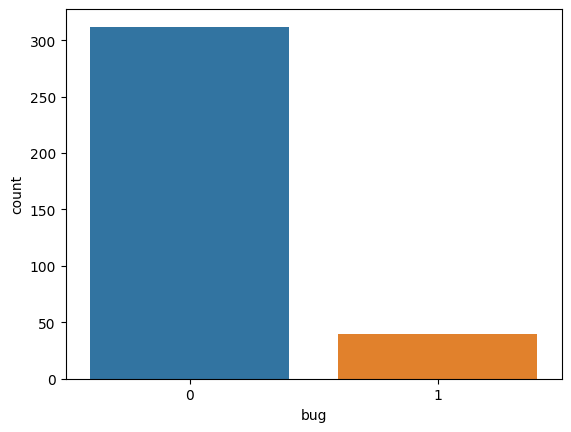

In [20]:
sns.countplot(x='bug', data= df_2)

In [21]:
df_2.isnull().sum()

name       0
version    0
name.1     0
wmc        0
dit        0
noc        0
cbo        0
rfc        0
lcom       0
ca         0
ce         0
npm        0
lcom3      0
loc        0
dam        0
moa        0
mfa        0
cam        0
ic         0
cbm        0
amc        0
max_cc     0
avg_cc     0
bug        0
dtype: int64

In [22]:
df_2.corr()

,version,wmc,dit,noc,cbo,rfc,lcom,ca,ce,npm,...,dam,moa,mfa,cam,ic,cbm,amc,max_cc,avg_cc,bug
version,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
wmc,NaN,1.000000,0.050727,0.063069,0.585885,0.848628,0.804057,0.258669,0.680396,0.958605,...,0.298425,0.664567,-0.069805,-0.564220,0.190793,0.198982,0.063122,0.443157,0.213124,0.342416
dit,NaN,0.050727,1.000000,0.046808,-0.106350,0.090194,-0.020740,-0.204710,-0.104293,0.037077,...,0.081318,-0.182149,0.849398,0.018932,0.658710,0.497898,-0.034950,-0.006728,-0.147838,-0.012275
noc,NaN,0.063069,0.046808,1.000000,0.022395,0.033627,0.013275,-0.000696,-0.009781,-0.018779,...,0.104555,-0.013593,0.053855,-0.086145,0.016102,0.017318,-0.054622,0.027308,-0.034494,-0.039254
cbo,NaN,0.585885,-0.106350,0.022395,1.000000,0.541384,0.482930,0.862692,0.565341,0.572837,...,0.004128,0.449009,-0.185308,-0.372885,0.053586,0.073538,0.130507,0.324613,0.198805,0.273550
rfc,NaN,0.848628,0.090194,0.033627,0.541384,1.000000,0.612380,0.105310,0.772776,0.740675,...,0.321828,0.569998,-0.023047,-0.589595,0.255317,0.252856,0.431946,0.652720,0.432042,0.439089
lcom,NaN,0.804057,-0.020740,0.013275,0.482930,0.612380,1.000000,0.232667,0.621052,0.803771,...,0.108847,0.639525,-0.061125,-0.247436,0.039616,0.044128,0.013258,0.215155,0.082099,0.150258
ca,NaN,0.258669,-0.204710,-0.000696,0.862692,0.105310,0.232667,1.000000,0.156577,0.299866,...,-0.132679,0.203021,-0.242663,-0.144666,-0.084132,-0.073591,-0.114398,0.070742,0.022569,0.090532
ce,NaN,0.680396,-0.104293,-0.009781,0.565341,0.772776,0.621052,0.156577,1.000000,0.620985,...,0.125982,0.660995,-0.130704,-0.419362,0.060980,0.135058,0.364446,0.465551,0.336523,0.327612
npm,NaN,0.958605,0.037077,-0.018779,0.572837,0.740675,0.803771,0.299866,0.620985,1.000000,...,0.273963,0.662866,-0.084948,-0.517516,0.161768,0.164532,-0.012427,0.336638,0.134277,0.260724


In [23]:
df_2.columns
cat_cols=[]

In [24]:
for i in df_2.columns:
    if df_2[i].dtypes=='O':
        cat_cols.append(i)

In [25]:
cat_cols

['name', 'name.1']

In [26]:
cat_cols.append('bug')

In [27]:
x = df_2.drop(columns = cat_cols)
y = df_2['bug']

In [28]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
x_train.shape, x_test.shape

((281, 21), (71, 21))

In [29]:
x_train_arr=np.array(x_train)
y_train_arr = np.array(y_train)

In [32]:
rf = RandomForestClassifier(n_estimators=50, max_depth=5)

In [33]:
acc_ivy_rf = []
prec_ivy_rf=[]
rec_ivy_rf=[]
f1_ivy_rf=[]
auc_ivy_rf=[]
conf_matrix_ivy_rf=[]

In [34]:
for i in variants:
    x_samp, y_samp = i.sample(x_train_arr, y_train_arr)
    rf.fit(x_samp, y_samp)
    y_pred = rf.predict(x_test)
    conf= confusion_matrix(y_test, y_pred)
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred)
    conf_matrix_ivy_rf.append(conf)
    acc_ivy_rf.append(acc)
    prec_ivy_rf.append(prec)
    rec_ivy_rf.append(rec)
    f1_ivy_rf.append(f1)
    auc_ivy_rf.append(auc)

2023-07-04 15:05:07,227:INFO:NoSMOTE: Running sampling via ('NoSMOTE', "{'raise_value_error': False, 'raise_runtime_error': False, 'random_state': None, 'class_name': 'NoSMOTE'}")
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-07-04 15:05:07,383:INFO:SMOTE_TomekLinks: Running sampling via ('SMOTE_TomekLinks', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state': None, 'class_name': 'SMOTE_TomekLinks'}")
2023-07-04 15:05:07,384:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, '

2023-07-04 15:05:09,069:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:05:09,070:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:05:09,082:INFO:SMMO: simplex sampling with n_dim 2
2023-07-04 15:05:09,084:INFO:SMMO: simplex sampling with n_dim 2
2023-07-04 15:05:09,087:INFO:SMMO: simplex sampling with n_dim 2
2023-07-04 15:05:09,091:INFO:SMMO: simplex sampling with n_dim 2
2023-07-04 15:05:09,093:INFO:SMMO: simplex sampling with n_dim 2
2023-07-04 15:05:09,096:INFO:SMMO: simplex sampling with n_dim 2
2023-07-04 15:05:09,099:INFO:SMMO: simplex sampling with n_dim 2
2023-07-04 15:05:09,101:INFO:SMMO: simplex sampling with n_dim 2
2023-07-04 15:05:09,104:INFO:SMMO: simplex sampling with n_dim 2
2023-07-04 15:05:09,108:INFO:SMMO: simplex sampling with n_dim 2
2023-07-04 15:05:09,111:INFO:SMMO: simplex sampling with n_dim 2
2023-07-04 15:05:09,114:INFO:SMMO: simplex sampling with n_dim 2
2023-07-04 15:05:09,116:INFO:SMMO:

2023-07-04 15:05:11,234:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:05:11,236:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:05:11,259:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:05:11,267:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:05:11,268:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-07-04 15:05:11,512:INFO:SVM_balance: Running sampling via ('SVM_balance', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state': None, 'class_name': 'SVM_balance'}")
2023-07-04 15:05:11,514:INFO:SMOTE:

2023-07-04 15:05:13,000:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,009:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,016:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,025:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,033:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,042:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,051:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,060:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,069:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,080:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,088:INFO:NearestNeig

2023-07-04 15:05:13,744:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,752:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,760:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,769:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,777:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,785:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,793:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,802:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,810:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,819:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:13,827:INFO:NearestNeig

2023-07-04 15:05:14,494:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:14,502:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:14,510:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:14,520:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:14,528:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:14,537:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:14,545:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:14,554:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:14,562:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:14,570:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:14,578:INFO:NearestNeig

2023-07-04 15:05:15,161:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:15,168:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:15,174:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:15,181:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:15,188:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:15,194:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:15,199:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:15,205:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:05:15,212:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:05:15,214:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:05:15,219:INFO:NRSBoundary_SMOTE

2023-07-04 15:05:16,215:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:05:16,216:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:05:16,229:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:05:16,232:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:05:16,238:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:05:16,241:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:05:16,249:INFO:MWMOTE: computing closeness factors
2023-07-04 15:05:16,310:INFO:MWMOTE: computing information weights
2023-07-04 15:05:16,313:INFO:MWMOTE: do clustering
2023-07-04 15:05:16,372:INFO:MWMOTE: simplex sampling with n_dim 2
2023-07-04 15:05:16,373:INFO:MWMOTE: simplex sampling with n_dim 2
2023-07-04 15:05:16,375:INFO:MWMOTE: The simplex order was updated from 2 to 1
2023-07-04 15:05:16,376:INFO:MWMOTE: simplex s

2023-07-04 15:05:41,307:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:05:41,308:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:05:41,315:INFO:MCT: simplex sampling with n_dim 1
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-07-04 15:05:41,384:INFO:ADG: Running sampling via ('ADG', "{'proportion': 1.0, 'kernel': 'inner', 'lam': 1.0, 'mu': 1.0, 'k': 12, 'gamma': 1.0, 'n_jobs': 1, 'random_state': None, 'class_name': 'ADG'}")
2023-07-04 15:05:41,460:INFO:ADG: Starting iteration with q=221
2023-07-04 15:05:42,216:WARNING:ADG: reducing dimensionality to 10
2023-07-04 15:05:42,220:INFO:ADG: Running sampling via ('ADG', "{'proportion': 1.0, 'kernel': 'inner', 'lam': 1.0, 'mu': 1.0, 'k': 12, 'gamma': 1.0, 'n_jobs': 1, 'random_state': None, 'class_name': 'ADG'}")
2

2023-07-04 15:05:46,904:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:05:46,905:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-07-04 15:05:47,024:INFO:SMOTE_PSO: Running sampling via ('SMOTE_PSO', "{'k': 3, 'nn_params': {}, 'eps': 0.01, 'n_pop': 10, 'w': 1.0, 'c1': 2.0, 'c2': 2.0, 'num_it': 15, 'n_jobs': 1, 'random_state': None, 'class_name': 'SMOTE_PSO'}")
2023-07-04 15:05:47,039:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:05:47,041:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:05:47,054:INFO:SMOTE_PSO: Iteration 0
2023-07-04 15:05:47,381:INFO:SMOTE_PSO: Iteration 1
2023-07-04 15:05:47,715:INFO:SMOTE_PSO: Iteration 2
2023-07-04 15:05:48,061:INFO:S

2023-07-04 15:06:07,674:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:07,675:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:06:07,686:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:06:07,699:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:06:07,709:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:06:07,720:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:06:07,729:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:06:07,742:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:06:07,753:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:06:07,765:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:06:07,775:INFO:NearestNeig

2023-07-04 15:06:08,565:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:06:08,578:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:06:08,590:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:06:08,600:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:06:08,610:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:06:08,622:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:06:08,633:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-07-04 15:06:08,643:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:08,644:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:08,653:INFO:ASMOBD: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\skl

2023-07-04 15:06:17,061:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:17,062:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:17,064:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:17,077:INFO:Lee: simplex sampling with n_dim 2
2023-07-04 15:06:17,079:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:17,096:INFO:Lee: simplex sampling with n_dim 2
2023-07-04 15:06:17,098:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:17,114:INFO:Lee: simplex sampling with n_dim 2
2023-07-04 15:06:17,116:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:17,130:INFO:Lee: simplex sampling with n_dim 2
2023-07-04 15:06:17,131:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:17,145:INFO:Lee: simplex sampling with n_dim 2
2023-07-04 15:06:17,147:INFO:NearestNe

2023-07-04 15:06:17,747:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:17,748:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:17,763:INFO:SMOTE: simplex sampling with n_dim 1
2023-07-04 15:06:17,775:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:17,776:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:17,776:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:17,792:INFO:SMOTE: simplex sampling with n_dim 1
2023-07-04 15:06:17,810:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.3862306269186329, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 

2023-07-04 15:06:18,252:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:18,266:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:18,277:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.26870922871640807, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:18,278:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:18,279:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:18,294:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:18,306:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8204644875605541, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling

2023-07-04 15:06:18,811:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:18,832:INFO:SMOTE: simplex sampling with n_dim 1
2023-07-04 15:06:18,847:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.2449399413650927, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:18,848:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:18,849:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:18,868:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:18,881:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'ga

2023-07-04 15:06:19,352:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:19,366:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:19,367:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:19,369:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:19,386:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:19,429:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:19,430:INFO:Nea

2023-07-04 15:06:19,912:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8531131359664649, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:19,913:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:19,914:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:19,928:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:19,948:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:19,949:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric

2023-07-04 15:06:20,375:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:20,375:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:20,391:INFO:SMOTE: simplex sampling with n_dim 1
2023-07-04 15:06:20,408:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:20,409:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:20,410:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:20,427:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:20,437:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': 

2023-07-04 15:06:20,881:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:20,882:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:20,897:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:20,909:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8268276221316162, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:20,910:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:20,911:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:20,926:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:20,948:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1,

2023-07-04 15:06:21,670:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,671:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,672:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,675:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,676:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,678:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,680:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,682:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,685:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,686:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,688:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,689:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,691:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,692:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,695:INFO:GASMOTE: simplex sa

2023-07-04 15:06:21,934:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,936:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,948:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,949:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,951:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,952:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,955:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,957:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,960:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,961:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,963:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,965:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,966:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,968:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:21,971:INFO:GASMOTE: simplex sa

2023-07-04 15:06:22,214:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,215:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,219:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,221:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,223:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,224:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,227:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,229:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,231:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,245:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,246:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,247:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,249:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,251:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,254:INFO:GASMOTE: simplex sa

2023-07-04 15:06:22,491:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,504:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,507:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,509:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,510:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,512:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,514:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,516:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,518:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,519:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,521:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,523:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,524:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,526:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,528:INFO:GASMOTE: simplex sa

2023-07-04 15:06:22,805:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,807:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,809:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,810:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,812:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,813:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,815:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,817:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,819:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,820:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,824:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,827:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,829:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,830:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:22,832:INFO:GASMOTE: simplex sa

2023-07-04 15:06:23,118:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,120:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,124:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,126:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,127:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,130:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,132:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,134:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,136:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,140:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,145:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,147:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,149:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,164:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,166:INFO:GASMOTE: simplex sa

2023-07-04 15:06:23,420:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,422:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,424:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,426:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,428:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,430:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,432:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,434:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,436:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,438:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,441:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,442:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,445:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,446:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,448:INFO:GASMOTE: simplex sa

2023-07-04 15:06:23,714:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,715:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,717:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,718:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,720:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,722:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,723:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,725:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,727:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,728:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,730:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,732:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,734:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,738:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,739:INFO:GASMOTE: simplex sa

2023-07-04 15:06:23,994:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,995:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:23,998:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,000:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,002:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,006:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,007:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,009:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,012:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,013:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,015:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,017:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,018:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,020:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,022:INFO:GASMOTE: simplex sa

2023-07-04 15:06:24,266:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,268:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,270:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,271:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,273:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,275:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,277:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,278:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,280:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,282:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,285:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,287:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,290:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,291:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,306:INFO:GASMOTE: simplex sa

2023-07-04 15:06:24,545:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,547:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,549:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,550:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,551:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,553:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,569:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,570:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,572:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,575:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,577:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,578:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,579:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,581:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,584:INFO:GASMOTE: simplex sa

2023-07-04 15:06:24,826:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,828:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,830:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,832:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,833:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,836:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,837:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,850:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,851:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,853:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,855:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,857:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,858:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,860:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:24,861:INFO:GASMOTE: simplex sa

2023-07-04 15:06:25,136:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,138:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,141:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,143:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,147:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,148:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,150:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,151:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,153:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,156:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,158:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,159:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,162:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,164:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,177:INFO:GASMOTE: simplex sa

2023-07-04 15:06:25,430:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,433:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,434:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,448:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,449:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,451:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,452:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,455:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,457:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,459:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,462:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,464:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,466:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,467:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,470:INFO:GASMOTE: simplex sa

2023-07-04 15:06:25,730:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,732:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,735:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,736:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,738:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,740:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,741:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,743:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,745:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,746:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,748:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,750:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,764:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,766:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:25,768:INFO:GASMOTE: simplex sa

2023-07-04 15:06:26,015:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,016:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,017:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,018:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,032:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,033:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,036:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,038:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,040:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,041:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,044:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,046:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,048:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,051:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,053:INFO:GASMOTE: simplex sa

2023-07-04 15:06:26,301:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,303:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,305:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,307:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,309:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,311:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,313:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,314:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,330:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,332:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,334:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,335:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,338:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,340:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,341:INFO:GASMOTE: simplex sa

2023-07-04 15:06:26,596:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,597:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,612:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,614:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,614:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,616:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,619:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,620:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,621:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,624:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,627:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,629:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,630:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,631:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,632:INFO:GASMOTE: simplex sa

2023-07-04 15:06:26,908:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,924:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,926:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,928:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,930:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,932:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,934:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,936:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,937:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,940:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,943:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,945:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,948:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,950:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:26,951:INFO:GASMOTE: simplex sa

2023-07-04 15:06:27,242:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,245:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,246:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,248:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,250:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,251:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,263:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,264:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,267:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,269:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,272:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,274:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,276:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,277:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,280:INFO:GASMOTE: simplex sa

2023-07-04 15:06:27,533:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,535:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,537:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,539:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,541:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,544:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,545:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,547:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,560:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,561:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,563:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,566:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,568:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,570:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,571:INFO:GASMOTE: simplex sa

2023-07-04 15:06:27,816:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,818:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,820:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,822:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,823:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,827:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,828:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,830:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,832:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,834:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,836:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,837:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,839:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,841:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:27,843:INFO:GASMOTE: simplex sa

2023-07-04 15:06:28,107:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,109:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,111:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,112:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,114:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,115:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,117:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,120:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,122:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,124:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,126:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,128:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,130:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,132:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,133:INFO:GASMOTE: simplex sa

2023-07-04 15:06:28,393:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,395:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,396:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,398:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,399:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,402:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,404:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,406:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,409:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,411:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,413:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,414:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,416:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,418:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,420:INFO:GASMOTE: simplex sa

2023-07-04 15:06:28,668:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,669:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,672:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,674:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,676:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,678:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,679:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,680:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,682:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,684:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,686:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,687:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,689:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,691:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,692:INFO:GASMOTE: simplex sa

2023-07-04 15:06:28,939:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,941:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,942:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,945:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,947:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,950:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,952:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,968:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,969:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,971:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,973:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,975:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,976:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,978:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:28,979:INFO:GASMOTE: simplex sa

2023-07-04 15:06:29,263:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,264:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,266:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,267:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,282:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,284:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,286:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,288:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,289:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,291:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,294:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,296:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,298:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,300:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,302:INFO:GASMOTE: simplex sa

2023-07-04 15:06:29,562:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,564:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,566:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,567:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,569:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,571:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,574:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,577:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,578:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,581:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,584:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,586:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,588:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,590:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,592:INFO:GASMOTE: simplex sa

2023-07-04 15:06:29,869:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,870:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,873:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,874:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,877:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,879:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,880:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,883:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,884:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,887:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,890:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,892:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,894:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,896:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:29,912:INFO:GASMOTE: simplex sa

2023-07-04 15:06:30,191:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,192:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,194:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,196:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,198:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,200:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,202:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,205:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,206:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,207:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,210:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,224:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,226:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,228:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,230:INFO:GASMOTE: simplex sa

2023-07-04 15:06:30,493:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,495:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,512:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,513:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,517:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,518:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,520:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,522:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,524:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,527:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,530:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,532:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,534:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,535:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,538:INFO:GASMOTE: simplex sa

2023-07-04 15:06:30,817:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,818:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,821:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,823:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,825:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,827:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,829:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,831:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,833:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,835:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,838:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,839:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,842:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,844:INFO:GASMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:30,846:INFO:GASMOTE: simplex sa

2023-07-04 15:06:31,240:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:31,243:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:31,275:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:31,276:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:31,317:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:31,318:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:31,338:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:31,339:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:31,356:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:31,357:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:31,380:INFO:NearestNeighborsWithMetricTensor: NN fitt

2023-07-04 15:06:31,882:INFO:SMOTE_FRST_2T: iteration: 2
2023-07-04 15:06:31,883:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.2, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:31,884:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:31,885:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:31,903:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:31,907:INFO:SMOTE_FRST_2T: minority added: 25, majority removed: 0
2023-07-04 15:06:31,908:INFO:SMOTE_FRST_2T: iteration: 3
2023-07-04 15:06:31,909:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.2, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_componen

2023-07-04 15:06:32,506:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:32,528:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.6203583859556042, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:32,529:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:32,531:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:32,550:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:32,566:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.960646973215084, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-

2023-07-04 15:06:33,080:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:33,103:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7580784758105785, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:33,104:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:33,104:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:33,121:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:33,150:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.134060053082012, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
202

2023-07-04 15:06:33,748:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:33,764:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:33,803:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0419683758883855, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:33,805:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:33,806:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:33,823:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:33,856:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4965685214864357, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_samplin

2023-07-04 15:06:34,600:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:34,616:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:34,669:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.373046789376581, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:34,670:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:34,671:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:34,689:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:34,744:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.917709135356162, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling'

2023-07-04 15:06:35,708:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:35,724:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:35,786:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:35,787:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:35,788:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:35,805:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:36,254:INFO:AMSCO: fitness scores: 0.790788 0.739368 0.486055 0.620800
2023-07-04 15:06:36,254:INFO:AMSCO starting iteration 1
2023-07-04 15:06:36,256:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7312648769530263, 'n_neighbors': 6, 'n

2023-07-04 15:06:36,719:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:36,720:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:36,736:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:36,764:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5104944388010735, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:36,765:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:36,766:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:36,781:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:36,807:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3204056394333277, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-07-04 15:06:37,356:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:37,357:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:37,372:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:37,405:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.227263103379282, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:37,406:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:37,407:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:37,422:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:37,462:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1862444426827192, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-07-04 15:06:38,117:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:38,118:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:38,135:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:38,174:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4855884238109, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:38,176:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:38,178:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:38,195:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:38,241:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.9323204228225794, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None},

2023-07-04 15:06:39,105:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:39,106:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:39,124:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:39,192:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.209609012171951, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:39,193:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:39,194:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:39,213:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:39,269:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.446939308620246, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-07-04 15:06:40,073:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:40,074:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:40,092:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:40,114:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9704506893152032, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:40,116:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:40,117:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:40,130:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:40,147:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.111719116773604, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None},

2023-07-04 15:06:40,645:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:40,646:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:40,661:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:40,690:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.726602350116801, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:40,691:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:40,692:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:40,708:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:40,740:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4158328788477168, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}

2023-07-04 15:06:41,327:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:41,328:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:41,346:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:41,380:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0455162744256477, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:41,382:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:41,383:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:41,401:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:41,436:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2343266743916055, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-07-04 15:06:42,155:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:42,157:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:42,173:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:42,212:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6951249747899078, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:42,214:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:42,215:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:42,231:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:42,278:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5499241901522987, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-07-04 15:06:43,040:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:43,041:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:43,058:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:43,079:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0057402037767713, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:43,080:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:43,081:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:43,093:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:43,111:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7426738047807724, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}

2023-07-04 15:06:43,566:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:43,567:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:43,583:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:43,608:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.766877622852847, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:43,609:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:43,610:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:43,625:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:43,655:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.618838130794686, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None},

2023-07-04 15:06:44,266:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:44,267:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:44,284:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:44,318:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.081766212497183, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:44,319:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:44,320:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:44,337:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:44,374:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.54915720198154, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None},

2023-07-04 15:06:45,074:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:45,074:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:45,090:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:45,133:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.338470059868333, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:45,134:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:45,135:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:45,151:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:45,189:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6751330500276658, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-07-04 15:06:46,155:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:46,156:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:46,168:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:46,188:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9248872917148405, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:46,189:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:46,190:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:46,206:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:46,224:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7294389888036392, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}

2023-07-04 15:06:46,693:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:46,694:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:46,708:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:46,736:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7050111769554497, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:46,737:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:46,738:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:46,753:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:46,785:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.430107270996035, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-07-04 15:06:47,369:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:47,370:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:47,386:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:47,426:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1355634726496806, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:47,427:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:47,428:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:47,444:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:47,479:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6974650202037984, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-07-04 15:06:48,285:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:48,286:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:48,305:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:48,352:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.4723803582213453, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:48,354:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:48,355:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:48,372:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:48,436:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.312426043419301, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-07-04 15:06:49,502:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:49,503:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:49,518:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:49,593:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:49,594:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:49,594:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:49,612:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:49,692:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': 

2023-07-04 15:06:50,476:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:50,477:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:50,493:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:50,517:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5074809435540768, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:50,519:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:50,520:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:50,536:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:50,563:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.359928537889069, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}

2023-07-04 15:06:51,125:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:51,126:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:51,142:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:51,165:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9747180842212844, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:51,166:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:51,168:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:51,185:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:51,218:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0838852558151784, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-07-04 15:06:51,872:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:51,873:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:51,890:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:51,933:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6634079460802127, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:51,934:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:51,935:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:51,952:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:51,981:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.666917572625479, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-07-04 15:06:52,782:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:52,783:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:52,799:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:52,848:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.5701086417357173, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:52,849:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:52,850:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:52,867:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:52,934:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0977532681099214, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-07-04 15:06:53,730:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:53,730:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:53,744:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:53,764:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1133273704348512, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:53,765:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:53,766:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:53,779:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:53,797:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2217756659117658, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}

2023-07-04 15:06:54,294:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:54,295:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:54,309:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:54,340:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9267719825005531, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:54,341:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:54,342:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:54,357:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:54,388:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7765725635800267, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}

2023-07-04 15:06:55,078:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:55,079:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:55,095:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:55,137:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.76415727616337, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:55,138:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:55,139:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:55,155:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:55,199:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.909152686963208, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None},

2023-07-04 15:06:56,050:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:56,051:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:56,068:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:56,129:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.977045478774073, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:56,130:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:56,130:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:56,146:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:56,217:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1,

2023-07-04 15:06:57,343:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:57,343:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:57,355:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:57,374:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.5987735902498948, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:57,375:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:57,376:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:57,387:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:57,401:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1354926695182437, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}

2023-07-04 15:06:57,830:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:57,831:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:57,845:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:57,867:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.745128389956018, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:57,868:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:57,869:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:57,884:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:57,913:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0775229669720134, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-07-04 15:06:58,474:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:58,475:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:58,490:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:58,520:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8336334451751957, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:58,521:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:58,522:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:58,538:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:58,567:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.69866990526788, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-07-04 15:06:59,296:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:59,296:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:59,312:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:59,366:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.041598012815534, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:06:59,367:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:06:59,368:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:06:59,384:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:06:59,434:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.713697169767326, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-07-04 15:07:00,396:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:00,397:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:00,413:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:00,469:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:07:00,470:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:00,471:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:00,485:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:00,693:INFO:AMSCO: fitness scores: 0.778371 0.803357 0.778371 0.803357
2023-07-04 15:07:00,693:INFO:AMSCO starting iteration 8
2023-07-04 15:07:00,695:INF

2023-07-04 15:07:01,085:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:01,086:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:01,100:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:01,124:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.288687546666698, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:07:01,125:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:01,126:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:01,140:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:01,161:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0592501148683005, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-07-04 15:07:01,663:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:01,663:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:01,677:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:01,703:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.206734359747135, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:07:01,704:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:01,705:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:01,721:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:01,756:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8809605404284815, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-07-04 15:07:02,375:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:02,376:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:02,392:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:02,434:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3667235304314445, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:07:02,435:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:02,435:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:02,451:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:02,489:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.2390490402550833, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-07-04 15:07:03,336:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:03,336:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:03,352:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:03,401:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.6184834511140327, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:07:03,402:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:03,402:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:03,418:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:03,480:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.491895134414104, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-07-04 15:07:04,202:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:04,202:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:04,216:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:04,237:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.28314549489478, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:07:04,238:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:04,239:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:04,252:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:04,274:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.544705689443771, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None},

2023-07-04 15:07:04,788:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:04,789:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:04,803:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:04,829:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8779078888622653, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:07:04,830:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:04,831:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:04,846:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:04,878:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8741560451653452, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-07-04 15:07:05,548:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:05,549:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:05,572:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:05,619:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.529358431729714, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:07:05,620:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:05,621:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:05,636:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:05,678:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7482906864830143, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-07-04 15:07:06,589:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:06,590:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:06,606:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:06,677:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:07:06,678:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:06,679:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:06,695:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:06,768:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.7709145393165837, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1

2023-07-04 15:07:07,750:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:07,751:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:07,762:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:07,778:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3521366913706405, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:07:07,779:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:07,780:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:07,792:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:07,814:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.773079737418831, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-07-04 15:07:08,250:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:08,251:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:08,265:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:08,290:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2204372191163775, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:07:08,291:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:08,292:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:08,307:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:08,329:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9967155716858185, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-07-04 15:07:08,878:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:08,878:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:08,895:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:08,926:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.063922624022747, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:07:08,927:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:08,928:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:08,945:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:08,979:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7225213241613064, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-07-04 15:07:09,670:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:09,670:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:09,686:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:09,724:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7989719062791405, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:07:09,725:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:09,726:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:09,742:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:09,789:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.0020417272621005, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-07-04 15:07:10,763:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:10,764:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:10,776:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:10,791:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.6288458925233942, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:07:10,792:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:10,793:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:10,806:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:10,821:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0873259785079339, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}

2023-07-04 15:07:11,224:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:11,224:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:11,238:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:11,259:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9138732247275366, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:07:11,260:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:11,261:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:11,276:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:11,292:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9852378680008824, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-07-04 15:07:11,785:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:11,785:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:11,801:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:11,834:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6287875118418942, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:07:11,835:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:11,836:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:11,851:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:11,879:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2358602321790053, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-07-04 15:07:12,467:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:12,468:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:12,484:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:12,530:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.905227629041336, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:07:12,531:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:12,532:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:12,548:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:12,597:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4237707797747015, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-07-04 15:07:13,406:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:13,407:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:13,424:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:13,465:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-07-04 15:07:13,466:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:13,467:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:13,483:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:13,556:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': 

2023-07-04 15:07:21,553:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:21,555:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-07-04 15:07:21,567:INFO:SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:23,597:INFO:DSRBF: Iteration 17/40, loss: 0.717506, data size: 502
2023-07-04 15:07:23,771:INFO:DSRBF: Iteration 18/40, loss: 0.717506, data size: 502
2023-07-04 15:07:23,838:INFO:DSRBF: Iteration 19/40, loss: 0.717506, data size: 502
2023-07-04 15:07:23,897:INFO:DSRBF: Iteration 20/40, loss: 0.717506, data size: 502
2023-07-04 15:07:23,955:INFO:DSRBF: Iteration 21/40, loss: 0.717506, data size: 502
2023-07-04 15:07:24,015:INFO:DSRBF: Iteration 22/40, loss: 0.717506, data size: 502
2023-07-04 15:07:24,074:INFO:DSRBF: Iteration 23/40, loss: 0.717506, data size: 502
2023-07-04 15:07:24,148:INFO:DSRBF: Iteration 24/40, loss: 0.717506, data size: 502
2023-07-04 15:07:24,206:INFO:SMOTE: Running sampling via ('SMOTE', "{'propor

2023-07-04 15:07:30,356:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:30,358:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:30,359:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:30,361:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:30,362:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:30,364:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:30,366:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:30,368:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:30,370:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:30,373:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:30,375:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:30,377:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:30,379:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-07-04 15:07:30,381:INFO:SN_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Progra

2023-07-04 15:07:31,334:INFO:SYMPROD: Cutoff value updated from 1.250000 to 1.250000
2023-07-04 15:07:31,336:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-07-04 15:07:31,337:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


In [1233]:
acc_ivy_rf

[0.8873239436619719,
 0.8873239436619719,
 0.8732394366197183,
 0.8732394366197183,
 0.9295774647887324,
 0.9014084507042254,
 0.9014084507042254,
 0.9014084507042254,
 0.8873239436619719,
 0.8873239436619719,
 0.9295774647887324,
 0.9154929577464789,
 0.8873239436619719,
 0.9014084507042254,
 0.9154929577464789,
 0.8873239436619719,
 0.8873239436619719,
 0.8591549295774648,
 0.8873239436619719,
 0.9014084507042254,
 0.8873239436619719,
 0.8732394366197183,
 0.8732394366197183,
 0.9014084507042254,
 0.9014084507042254,
 0.9014084507042254,
 0.9436619718309859,
 0.9295774647887324,
 0.9014084507042254,
 0.9014084507042254,
 0.9154929577464789,
 0.8873239436619719,
 0.9154929577464789,
 0.8591549295774648,
 0.8591549295774648,
 0.9154929577464789,
 0.8591549295774648,
 0.9295774647887324,
 0.9154929577464789,
 0.8873239436619719,
 0.8591549295774648,
 0.9154929577464789,
 0.5070422535211268,
 0.9014084507042254,
 0.8732394366197183,
 0.9014084507042254,
 0.8732394366197183,
 0.8591549295

In [1234]:
conf_matrix_ivy_rf

[array([[61,  0],
        [ 8,  2]], dtype=int64),
 array([[56,  5],
        [ 3,  7]], dtype=int64),
 array([[61,  0],
        [ 9,  1]], dtype=int64),
 array([[56,  5],
        [ 4,  6]], dtype=int64),
 array([[57,  4],
        [ 1,  9]], dtype=int64),
 array([[56,  5],
        [ 2,  8]], dtype=int64),
 array([[60,  1],
        [ 6,  4]], dtype=int64),
 array([[61,  0],
        [ 7,  3]], dtype=int64),
 array([[60,  1],
        [ 7,  3]], dtype=int64),
 array([[61,  0],
        [ 8,  2]], dtype=int64),
 array([[58,  3],
        [ 2,  8]], dtype=int64),
 array([[56,  5],
        [ 1,  9]], dtype=int64),
 array([[61,  0],
        [ 8,  2]], dtype=int64),
 array([[61,  0],
        [ 7,  3]], dtype=int64),
 array([[60,  1],
        [ 5,  5]], dtype=int64),
 array([[54,  7],
        [ 1,  9]], dtype=int64),
 array([[55,  6],
        [ 2,  8]], dtype=int64),
 array([[53,  8],
        [ 2,  8]], dtype=int64),
 array([[61,  0],
        [ 8,  2]], dtype=int64),
 array([[61,  0],
        [ 7, 

In [1236]:
np.array(y_test)

array([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0], dtype=int64)

In [1239]:
variants[0]

In [1241]:
prec_ivy_rf[0]

1.0

In [1347]:
nos = sv.Gazzah()
x_samp, y_samp = nos.sample(x_train_arr, y_train_arr)

2023-06-28 22:07:06,033:INFO:Gazzah: Running sampling via ('Gazzah', "{'proportion': 1.0, 'n_components': 2, 'n_jobs': 1, 'random_state': None, 'class_name': 'Gazzah'}")
2023-06-28 22:07:06,040:INFO:polynom_fit_SMOTE_star: Running sampling via ('polynom_fit_SMOTE_star', "{'proportion': 1.0, 'topology': 'star', 'random_state': None, 'class_name': 'polynom_fit_SMOTE_star'}")
2023-06-28 22:07:06,044:INFO:polynom_fit_SMOTE: Running sampling via ('polynom_fit_SMOTE', "{'proportion': 1.0, 'topology': 'star', 'random_state': None, 'class_name': 'polynom_fit_SMOTE'}")
2023-06-28 22:07:06,063:INFO:Gazzah: Removing 10 majority samples


In [1348]:
rf.fit(x_samp, y_samp)

RandomForestClassifier(max_depth=5, n_estimators=50)

In [1349]:
y_pred= rf.predict(x_test)
y_pred

C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0], dtype=int64)

In [1350]:
precision_score(y_test, y_pred)

C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.0

In [1249]:
confusion_matrix(y_test, y_pred)

array([[61,  0],
       [ 8,  2]], dtype=int64)

In [1247]:
np.array(y_test)

array([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0], dtype=int64)

In [1248]:
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0], dtype=int64)

In [1237]:
prec_ivy_rf

[1.0,
 0.5833333333333334,
 1.0,
 0.5454545454545454,
 0.6923076923076923,
 0.6153846153846154,
 0.8,
 1.0,
 0.75,
 1.0,
 0.7272727272727273,
 0.6428571428571429,
 1.0,
 1.0,
 0.8333333333333334,
 0.5625,
 0.5714285714285714,
 0.5,
 1.0,
 1.0,
 0.5833333333333334,
 0.5384615384615384,
 0.5384615384615384,
 1.0,
 0.6153846153846154,
 0.6153846153846154,
 0.75,
 1.0,
 1.0,
 0.8,
 0.7,
 0.5625,
 0.6666666666666666,
 0.5,
 0.5,
 1.0,
 0.5,
 0.8571428571428571,
 0.8333333333333334,
 1.0,
 0.0,
 0.6666666666666666,
 0.1951219512195122,
 0.6,
 1.0,
 0.6666666666666666,
 1.0,
 0.5,
 0.6666666666666666,
 0.5,
 0.6666666666666666,
 1.0,
 0.8333333333333334,
 0.5833333333333334,
 0.5625,
 1.0,
 1.0,
 0.5714285714285714,
 0.4,
 1.0,
 0.7,
 0.5,
 0.8333333333333334,
 0.8,
 0.6428571428571429,
 1.0,
 0.5,
 0.3181818181818182,
 0.42857142857142855,
 0.8571428571428571,
 0.6666666666666666,
 0.5625,
 0.7142857142857143,
 1.0,
 0.4444444444444444,
 1.0,
 0.5625,
 0.5,
 1.0,
 1.0,
 0.6,
 0.6363636363636

In [1313]:
TN_ivy_rf=[]
TP_ivy_rf=[]
FP_ivy_rf=[]
FN_ivy_rf=[]

In [1314]:
for i in range(len(conf_matrix_ivy_rf)):
    TN_ivy_rf.append(conf_matrix_ivy_rf[i][0][0])
    FP_ivy_rf.append(conf_matrix_ivy_rf[i][0][1])
    FN_ivy_rf.append(conf_matrix_ivy_rf[i][1][0])
    TP_ivy_rf.append(conf_matrix_ivy_rf[i][1][1])

In [1315]:
ivy_rf = pd.DataFrame({'Variants':var_names, 'TP':TP_ivy_rf, 'TN':TN_ivy_rf, 'FP':FP_ivy_rf, 'FN':FN_ivy_rf, 'Precision':prec_ivy_rf, 'Recall':rec_ivy_rf, 'F1':f1_ivy_rf, 'AUC':auc_ivy_rf})

In [1316]:
ivy_rf 

,Variants,TP,TN,FP,FN,Precision,Recall,F1,AUC
0,NoSMOTE,2,61,0,8,1.000000,0.2,0.333333,0.600000
1,SMOTE_TomekLinks,7,56,5,3,0.583333,0.7,0.636364,0.809016
2,SMOTE_ENN,1,61,0,9,1.000000,0.1,0.181818,0.550000
3,Borderline_SMOTE1,6,56,5,4,0.545455,0.6,0.571429,0.759016
4,Borderline_SMOTE2,9,57,4,1,0.692308,0.9,0.782609,0.917213
...,...,...,...,...,...,...,...,...,...
82,CCR,3,60,1,7,0.750000,0.3,0.428571,0.641803
83,ANS,8,56,5,2,0.615385,0.8,0.695652,0.859016
84,cluster_SMOTE,5,61,0,5,1.000000,0.5,0.666667,0.750000
85,ADOMS,4,56,5,6,0.444444,0.4,0.421053,0.659016


In [1343]:
ivy_rf_file = ivy_rf.to_csv('ivy_rf_file.csv')

In [1318]:
better_ivy_rf = []

In [1319]:
for i in range(len(conf_matrix_ivy_rf)):
    if(conf_matrix_ivy_rf[i][1][1]>0):
        better_ivy_rf.append(var_names[i])

In [1320]:
len(better_ivy_rf)

86

In [1321]:
better_ivy_rf_50 = []

In [1324]:
for i in range(len(conf_matrix_ivy_rf)):
    if(conf_matrix_ivy_rf[i][1][1]>=5):
        better_ivy_rf_50.append(var_names[i])

In [1332]:
len(better_ivy_rf_50)
prec_ivy_rf_100=[]

In [1333]:
for i in range(len(prec_ivy_rf)):
    if (prec_ivy_rf[i]==1.0):
        prec_ivy_rf_100.append(var_names[i])

In [1334]:
len(prec_ivy_rf_100)

26

In [1337]:
conf_matrix_ivy_knn=[]
acc_ivy_knn=[]
prec_ivy_knn=[]
rec_ivy_knn=[]
f1_ivy_knn=[]
auc_ivy_knn=[]
TP_ivy_knn=[]
TN_ivy_knn=[]
FP_ivy_knn=[]
FN_ivy_knn=[]

In [1338]:
for i in variants:
    x_samp, y_samp = i.sample(x_train_arr, y_train_arr)
    knn.fit(x_samp, y_samp)
    y_pred = knn.predict(x_test)
    conf= confusion_matrix(y_test, y_pred)
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred)
    conf_matrix_ivy_knn.append(conf)
    acc_ivy_knn.append(acc)
    prec_ivy_knn.append(prec)
    rec_ivy_knn.append(rec)
    f1_ivy_knn.append(f1)
    auc_ivy_knn.append(auc)

2023-06-28 14:57:32,697:INFO:NoSMOTE: Running sampling via ('NoSMOTE', "{'raise_value_error': False, 'raise_runtime_error': False, 'random_state': None, 'class_name': 'NoSMOTE'}")
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-06-28 14:57:32,727:INFO:SMOTE_TomekLinks: Running sampling via ('SMOTE_TomekLinks', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state':

2023-06-28 14:57:33,273:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:57:33,275:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:57:33,287:INFO:distance_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-28 14:57:33,310:INFO:SMMO: Running sampling via ('SMMO', "{'proportion': 1.0, 'n_neighbors': 5, 'ensemble': [('sklearn.discriminant_analysis', 'QuadraticDiscriminantAnalysis', {}), ('sklearn.tree', 'DecisionTreeClassifier', {'random_state': 2}), ('sklearn.naive_bayes', 'GaussianNB', {})], 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMMO'}")
2023-06-28 14:57:33,328:INFO:NearestNeighbo

2023-06-28 14:57:33,953:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:57:33,956:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-28 14:57:34,052:INFO:MSYN: Running sampling via ('MSYN', "{'pressure': 1.5, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state': None, 'class_name': 'MSYN', 'proportion': 1.5}")
2023-06-28 14:57:34,053:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.5, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': 

2023-06-28 14:57:34,850:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:34,861:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:34,871:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:34,882:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:34,893:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:34,902:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:34,914:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:34,923:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:34,932:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:34,941:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:34,950:INFO:NearestNeig

2023-06-28 14:57:35,721:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:35,730:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:35,739:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:35,749:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:35,757:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:35,766:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:35,776:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:35,784:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:35,794:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:35,803:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:35,813:INFO:NearestNeig

2023-06-28 14:57:36,491:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:36,500:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:36,508:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:36,516:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:36,525:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:36,535:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:36,543:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:36,552:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:36,560:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:36,570:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:36,578:INFO:NearestNeig

2023-06-28 14:57:37,283:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:37,292:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:37,302:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:37,311:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:37,320:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:37,329:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:37,339:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:37,348:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:37,358:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:37,366:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:57:37,376:INFO:NearestNeig

2023-06-28 14:57:38,143:INFO:Selected_SMOTE: Running sampling via ('Selected_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'perc_sign_attr': 0.5, 'n_jobs': 1, 'random_state': None, 'class_name': 'Selected_SMOTE'}")
2023-06-28 14:57:38,144:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:57:38,146:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-28 14:57:38,182:INFO:LN_SMOTE: Running sampling via ('LN_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'random_state': None, 'class_name': 'LN_SMOTE'}")
2023-06-28 14:57:38,183:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:57:38,184:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C

2023-06-28 14:57:43,917:INFO:DEAGO: Input dimension: 21, encoding dimension: 6
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-28 14:57:50,294:INFO:Gazzah: Running sampling via ('Gazzah', "{'proportion': 1.0, 'n_components': 2, 'n_jobs': 1, 'random_state': None, 'class_name': 'Gazzah'}")
2023-06-28 14:57:50,296:INFO:polynom_fit_SMOTE_star: Running sampling via ('polynom_fit_SMOTE_star', "{'proportion': 1.0, 'topology': 'star', 'random_state': None, 'class_name': 'polynom_fit_SMOTE_star'}")
2023-06-28 14:57:50,298:INFO:polynom_fit_SMOTE: Running sampling via ('polynom_fit_SMOTE', "{'proportion': 1.0, 'topology': 'star', 'random_state': None, 'class_name': 'polynom_fit_SMOTE'}")
2023-06-28 14:57:50,302:INFO:Gazzah: Removing 10 majority samples
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.p

2023-06-28 14:57:56,136:INFO:MOT2LD: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-28 14:57:56,158:INFO:V_SYNTH: Running sampling via ('V_SYNTH', "{'proportion': 1.0, 'n_components': 3, 'n_jobs': 1, 'random_state': None, 'class_name': 'V_SYNTH'}")
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-28 14:57:56,206:INFO:OUPS: Running sampling via ('OUPS', "{'proportion': 1.0, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'OUPS'}")
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_mode

2023-06-28 14:58:15,219:INFO:CBSO: The simplex order was updated from 2 to 1
2023-06-28 14:58:15,220:INFO:CBSO: simplex sampling with n_dim 1
2023-06-28 14:58:15,221:INFO:CBSO: The simplex order was updated from 2 to 1
2023-06-28 14:58:15,222:INFO:CBSO: simplex sampling with n_dim 1
2023-06-28 14:58:15,224:INFO:CBSO: The simplex order was updated from 2 to 1
2023-06-28 14:58:15,225:INFO:CBSO: simplex sampling with n_dim 1
2023-06-28 14:58:15,226:INFO:CBSO: The simplex order was updated from 2 to 1
2023-06-28 14:58:15,227:INFO:CBSO: simplex sampling with n_dim 1
2023-06-28 14:58:15,229:INFO:CBSO: The simplex order was updated from 2 to 1
2023-06-28 14:58:15,230:INFO:CBSO: simplex sampling with n_dim 1
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-28 14:58:15,251:INFO:DBSMOTE: Running sampling via ('DBSMOTE', "{'proportion': 1

2023-06-28 14:58:15,986:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:58:15,995:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:58:16,004:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:58:16,016:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:58:16,025:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:58:16,034:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:58:16,044:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:58:16,054:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:58:16,062:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:58:16,070:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:58:16,080:INFO:NearestNeig

2023-06-28 14:58:16,664:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:16,666:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-28 14:58:20,971:INFO:G_SMOTE: Running sampling via ('G_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'method': 'linear', 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'G_SMOTE'}")
2023-06-28 14:58:20,972:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:20,974:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:20,987:INFO:G_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\P

2023-06-28 14:58:21,521:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:21,523:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:21,541:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:21,553:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:21,554:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:21,555:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:21,570:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-28 14:58:21,583:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.5436629560513414, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 

2023-06-28 14:58:22,080:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:22,081:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:22,099:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-28 14:58:22,112:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:22,113:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:22,114:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:22,131:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:22,144:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9166671121322794, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1,

2023-06-28 14:58:22,579:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:22,598:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-28 14:58:22,616:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.41675914677658665, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:22,618:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:22,619:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:22,634:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-28 14:58:22,649:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', '

2023-06-28 14:58:23,108:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:23,122:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.524992782440303, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:23,123:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:23,124:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:23,142:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:23,177:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:23,

2023-06-28 14:58:23,615:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9547367825019082, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:23,617:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:23,617:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:23,638:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-28 14:58:23,659:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5122687281181366, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:23,660:INFO:NearestNeighborsWithMetricTensor: NN fitt

2023-06-28 14:58:24,137:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:24,137:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:24,153:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-28 14:58:24,165:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:24,167:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:24,167:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:24,185:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:24,197:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5439259025094794, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1,

2023-06-28 14:58:24,677:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:24,694:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:24,705:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.907047638032804, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:24,707:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:24,708:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:24,724:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-28 14:58:24,745:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gau

2023-06-28 14:58:25,275:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:25,276:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:25,293:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:25,295:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:25,310:INFO:VIS_RST: selected mode: low_complexity
2023-06-28 14:58:25,311:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:25,312:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:25,327:INFO:VIS_RST: simplex sampling with n_dim 2
2023-06-28 14:58:25,330:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:25,332:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature 

2023-06-28 14:58:25,606:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,608:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,610:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,612:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,614:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,616:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,618:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,619:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,621:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,635:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,636:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,639:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,640:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,642:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,645:INFO:GASMOTE: simplex sa

2023-06-28 14:58:25,900:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,902:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,904:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,906:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,908:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,911:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,912:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,914:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,916:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,918:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,920:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,921:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,923:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,925:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:25,927:INFO:GASMOTE: simplex sa

2023-06-28 14:58:26,185:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,187:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,189:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,191:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,193:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,195:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,197:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,199:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,200:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,203:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,205:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,206:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,208:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,210:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,211:INFO:GASMOTE: simplex sa

2023-06-28 14:58:26,458:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,461:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,462:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,463:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,465:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,467:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,470:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,471:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,473:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,475:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,477:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,479:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,495:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,496:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,498:INFO:GASMOTE: simplex sa

2023-06-28 14:58:26,751:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,752:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,754:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,756:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,759:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,761:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,763:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,764:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,766:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,767:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,769:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,770:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,772:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,774:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:26,777:INFO:GASMOTE: simplex sa

2023-06-28 14:58:27,027:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,039:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,041:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,043:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,046:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,047:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,049:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,050:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,053:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,054:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,057:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,058:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,060:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,062:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,063:INFO:GASMOTE: simplex sa

2023-06-28 14:58:27,315:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,317:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,320:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,322:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,325:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,327:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,329:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,330:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,333:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,348:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,350:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,352:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,354:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,357:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,358:INFO:GASMOTE: simplex sa

2023-06-28 14:58:27,616:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,617:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,619:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,621:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,623:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,635:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,637:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,639:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,640:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,642:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,644:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,646:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,648:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,649:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,650:INFO:GASMOTE: simplex sa

2023-06-28 14:58:27,904:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,905:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,919:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,921:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,923:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,926:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,928:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,930:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,932:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,934:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,936:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,939:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,941:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,943:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:27,945:INFO:GASMOTE: simplex sa

2023-06-28 14:58:28,236:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,237:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,241:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,243:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,245:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,248:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,251:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,256:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,259:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,261:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,262:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,265:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,280:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,282:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,284:INFO:GASMOTE: simplex sa

2023-06-28 14:58:28,536:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,538:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,540:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,542:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,544:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,546:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,547:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,550:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,552:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,553:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,555:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,557:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,559:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,562:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,572:INFO:GASMOTE: simplex sa

2023-06-28 14:58:28,834:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,835:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,837:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,839:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,840:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,843:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,859:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,861:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,862:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,864:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,866:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,867:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,869:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,871:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:28,873:INFO:GASMOTE: simplex sa

2023-06-28 14:58:29,123:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,126:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,127:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,129:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,131:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,132:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,134:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,135:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,137:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,138:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,139:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,142:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,144:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,160:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,162:INFO:GASMOTE: simplex sa

2023-06-28 14:58:29,417:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,419:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,420:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,422:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,424:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,426:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,429:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,431:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,433:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,434:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,436:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,437:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,438:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,441:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,456:INFO:GASMOTE: simplex sa

2023-06-28 14:58:29,713:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,714:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,716:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,718:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,719:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,721:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,723:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,724:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,726:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,728:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,730:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,731:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,734:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,736:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,737:INFO:GASMOTE: simplex sa

2023-06-28 14:58:29,988:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,990:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,992:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,994:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,996:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,997:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:29,999:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,001:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,014:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,016:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,018:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,019:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,022:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,024:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,025:INFO:GASMOTE: simplex sa

2023-06-28 14:58:30,277:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,279:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,281:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,283:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,285:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,286:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,288:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,290:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,292:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,294:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,296:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,298:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,299:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,301:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,303:INFO:GASMOTE: simplex sa

2023-06-28 14:58:30,559:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,560:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,562:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,565:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,566:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,567:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,570:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,571:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,573:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,574:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,576:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,592:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,594:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,596:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,597:INFO:GASMOTE: simplex sa

2023-06-28 14:58:30,848:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,850:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,851:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,853:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,855:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,856:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,858:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,860:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,862:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,864:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,866:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,867:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,868:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,871:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:30,873:INFO:GASMOTE: simplex sa

2023-06-28 14:58:31,143:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,144:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,146:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,160:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,161:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,163:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,165:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,167:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,168:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,170:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,172:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,174:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,177:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,178:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,181:INFO:GASMOTE: simplex sa

2023-06-28 14:58:31,447:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,448:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,450:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,452:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,454:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,455:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,457:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,459:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,460:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,463:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,464:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,466:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,468:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,469:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,470:INFO:GASMOTE: simplex sa

2023-06-28 14:58:31,728:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,729:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,732:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,734:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,735:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,736:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,738:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,741:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,743:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,744:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,747:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,749:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,750:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,752:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:31,754:INFO:GASMOTE: simplex sa

2023-06-28 14:58:32,006:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,008:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,010:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,012:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,014:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,016:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,018:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,032:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,033:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,035:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,037:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,038:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,040:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,042:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,044:INFO:GASMOTE: simplex sa

2023-06-28 14:58:32,305:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,307:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,309:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,310:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,313:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,314:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,316:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,318:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,320:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,322:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,324:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,326:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,328:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,330:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,331:INFO:GASMOTE: simplex sa

2023-06-28 14:58:32,577:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,579:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,593:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,594:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,595:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,597:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,600:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,601:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,602:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,605:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,606:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,608:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,610:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,611:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,614:INFO:GASMOTE: simplex sa

2023-06-28 14:58:32,875:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,878:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,880:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,882:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,884:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,885:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,887:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,889:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,891:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,893:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,896:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,897:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,899:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,913:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:32,915:INFO:GASMOTE: simplex sa

2023-06-28 14:58:33,174:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,176:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,177:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,179:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,181:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,184:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,185:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,187:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,189:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,191:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,193:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,194:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,196:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,198:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,201:INFO:GASMOTE: simplex sa

2023-06-28 14:58:33,457:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,458:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,460:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,462:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,478:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,480:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,482:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,484:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,485:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,488:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,490:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,492:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,493:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,495:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,497:INFO:GASMOTE: simplex sa

2023-06-28 14:58:33,759:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,761:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,764:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,765:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,766:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,769:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,770:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,773:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,774:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,776:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,779:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,780:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,782:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,783:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:33,785:INFO:GASMOTE: simplex sa

2023-06-28 14:58:34,052:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,054:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,056:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,058:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,060:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,061:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,063:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,065:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,066:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,068:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,069:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,070:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,072:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,075:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,076:INFO:GASMOTE: simplex sa

2023-06-28 14:58:34,339:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,341:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,354:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,356:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,357:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,359:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,360:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,362:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,364:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,366:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,367:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,369:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,370:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,373:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,375:INFO:GASMOTE: simplex sa

2023-06-28 14:58:34,635:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,637:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,638:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,640:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,642:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,644:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,646:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,647:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,649:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,650:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,653:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,655:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,657:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,659:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:34,660:INFO:GASMOTE: simplex sa

2023-06-28 14:58:35,198:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:35,199:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:35,218:INFO:A_SUWO: The simplex order was updated from 2 to 1
2023-06-28 14:58:35,219:INFO:A_SUWO: simplex sampling with n_dim 1
2023-06-28 14:58:35,220:INFO:A_SUWO: The simplex order was updated from 2 to 1
2023-06-28 14:58:35,221:INFO:A_SUWO: simplex sampling with n_dim 1
2023-06-28 14:58:35,222:INFO:A_SUWO: The simplex order was updated from 2 to 1
2023-06-28 14:58:35,223:INFO:A_SUWO: simplex sampling with n_dim 1
2023-06-28 14:58:35,225:INFO:A_SUWO: The simplex order was updated from 2 to 1
2023-06-28 14:58:35,225:INFO:A_SUWO: simplex sampling with n_dim 1
2023-06-28 14:58:35,226:INFO:A_SUWO: The simplex order was updated from 2 to 1
2023-06-28 14:58:35,227:INFO:A_SUWO: simplex sampling with n_dim 1
2023-06-28 14:58:35,229:INFO:A_SUWO: simplex sampling with n_dim 2
2023-06-28 14:58:

2023-06-28 14:58:35,472:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:35,474:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:35,490:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:35,493:INFO:SMOTE_FRST_2T: minority added: 27, majority removed: 0
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-28 14:58:35,513:INFO:AND_SMOTE: Running sampling via ('AND_SMOTE', "{'proportion': 1.0, 'K': 15, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'AND_SMOTE'}")
2023-06-28 14:58:35,515:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:35,515:INFO:NearestNeighborsWithMetricTenso

2023-06-28 14:58:36,029:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:36,030:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:36,046:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:36,073:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4694710091474503, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:36,074:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:36,075:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:36,093:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:36,121:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3381248796088774, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None

2023-06-28 14:58:36,728:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:36,729:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:36,745:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:36,785:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9816410371092963, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:36,786:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:36,787:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:36,806:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:36,843:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2454719213767875, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:58:37,623:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:37,624:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:37,640:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:37,691:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.1886872898523135, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:37,692:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:37,693:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:37,711:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:37,774:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.1131179223479766, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:58:38,848:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:38,849:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:38,868:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:38,942:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:38,943:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:38,945:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:38,962:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:39,037:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': 

2023-06-28 14:58:40,364:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:40,365:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:40,382:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:40,400:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3170632255818644, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:40,401:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:40,402:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:40,418:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:40,447:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7259714860707551, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:58:40,967:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:40,968:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:40,986:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:41,013:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2038619121082281, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:41,014:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:41,016:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:41,035:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:41,063:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8914531066969609, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:58:41,692:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:41,693:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:41,709:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:41,745:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9314562817420753, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:41,746:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:41,748:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:41,765:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:41,801:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9522196837730983, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:58:42,580:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:42,582:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:42,599:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:42,646:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7745792966334792, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:42,647:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:42,648:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:42,666:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:42,713:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.657679035582675, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-28 14:58:43,745:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:43,746:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:43,763:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:43,784:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.6400727934447696, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:43,785:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:43,786:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:43,804:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:43,821:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7153322418119723, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}

2023-06-28 14:58:44,331:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:44,332:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:44,349:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:44,373:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2948361341467574, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:44,374:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:44,375:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:44,392:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:44,420:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0121149112428176, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}

2023-06-28 14:58:44,983:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:44,984:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:45,001:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:45,037:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4455768652101764, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:45,038:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:45,039:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:45,058:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:45,084:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8442312729295611, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:58:45,729:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:45,730:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:45,747:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:45,781:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.549319246502536, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:45,783:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:45,784:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:45,802:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:45,847:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.877348281034319, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-28 14:58:46,609:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:46,610:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:46,627:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:46,674:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.148380540712328, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:46,676:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:46,676:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:46,694:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:46,736:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.3625849529329397, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-28 14:58:47,345:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:47,346:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:47,364:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:47,388:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0704126149790099, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:47,389:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:47,390:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:47,406:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:47,430:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2467462754359353, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}

2023-06-28 14:58:47,999:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:48,000:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:48,025:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:48,056:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4492238708156606, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:48,057:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:48,058:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:48,079:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:48,109:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5036365099738536, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:58:48,754:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:48,755:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:48,772:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:48,811:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.631231978954544, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:48,812:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:48,814:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:48,833:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:48,864:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0436582563878085, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-28 14:58:49,582:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:49,582:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:49,601:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:49,651:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3568344800858227, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:49,652:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:49,653:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:49,672:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:49,717:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9933564117657963, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:58:50,454:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:50,455:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:50,471:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:50,496:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1152013785732973, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:50,497:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:50,498:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:50,514:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:50,540:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9381985496202823, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}

2023-06-28 14:58:51,110:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:51,111:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:51,128:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:51,160:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7630588065939288, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:51,161:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:51,162:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:51,178:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:51,210:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.683819527240562, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None},

2023-06-28 14:58:51,908:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:51,908:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:51,926:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:51,972:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6453410340594354, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:51,973:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:51,974:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:51,992:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:52,041:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6273623061492564, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:58:52,943:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:52,944:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:52,962:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:53,014:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.5069097854051456, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:53,016:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:53,017:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:53,034:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:53,097:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.8075359180771002, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:58:54,155:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:54,156:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:54,172:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:54,191:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8917618836403403, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:54,193:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:54,193:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:54,211:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:54,232:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0010280700178962, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}

2023-06-28 14:58:54,776:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:54,777:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:54,794:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:54,824:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0512699070556333, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:54,825:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:54,826:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:54,842:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:54,866:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3978163682807316, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-28 14:58:55,498:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:55,499:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:55,517:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:55,556:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2949801488913404, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:55,557:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:55,559:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:55,575:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:55,617:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.587341701956781, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-28 14:58:56,390:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:56,391:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:56,410:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:56,471:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.5501557930817356, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:56,472:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:56,473:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:56,491:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:56,562:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.498328506624714, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-28 14:58:57,627:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:57,628:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:57,646:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:57,825:INFO:AMSCO: fitness scores: 0.786222 0.793852 0.786222 0.793852
2023-06-28 14:58:57,827:INFO:AMSCO starting iteration 6
2023-06-28 14:58:57,827:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1776221248479517, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:57,830:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:57,831:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:57,847:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14

2023-06-28 14:58:58,396:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:58,397:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:58,414:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:58,439:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.37182372993931, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:58,440:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:58,441:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:58,459:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:58,485:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7573844521493835, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None},

2023-06-28 14:58:59,124:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:59,125:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:59,142:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:59,169:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7516503905870957, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:58:59,171:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:59,172:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:58:59,188:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:58:59,224:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9201986811474778, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:58:59,985:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:58:59,986:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:00,004:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:00,050:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.38785659460831, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:00,051:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:00,052:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:00,073:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:00,116:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.809890210750437, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None},

2023-06-28 14:59:01,116:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:01,116:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:01,133:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:01,210:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.313691075330498, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:01,213:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:01,214:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:01,231:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:01,296:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.493568406144601, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-28 14:59:02,071:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:02,073:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:02,090:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:02,112:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0908496176021378, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:02,113:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:02,114:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:02,130:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:02,154:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.413106838299417, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}

2023-06-28 14:59:02,732:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:02,733:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:02,750:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:02,789:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2921207667870163, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:02,790:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:02,791:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:02,809:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:02,834:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5264724548407766, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:59:03,531:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:03,531:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:03,549:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:03,589:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4436051006679373, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:03,590:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:03,591:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:03,608:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:03,652:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7399270275239818, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:59:04,416:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:04,417:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:04,434:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:04,492:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.8524703567056493, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:04,494:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:04,495:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:04,511:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:04,561:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.0512535207021885, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:59:05,378:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:05,379:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:05,400:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:05,428:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9170037630886592, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:05,430:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:05,431:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:05,449:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:05,471:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.345876927564648, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-28 14:59:06,114:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:06,114:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:06,131:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:06,165:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.966234131245352, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:06,166:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:06,167:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:06,184:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:06,222:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4990465835506863, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-28 14:59:06,938:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:06,941:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:06,964:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:07,009:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4789624293337775, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:07,011:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:07,012:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:07,030:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:07,078:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.0513600847158764, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:59:08,019:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:08,020:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:08,037:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:08,113:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.7030143117034098, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:08,114:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:08,115:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:08,133:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:08,200:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.621564843782307, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-28 14:59:09,449:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:09,450:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:09,467:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:09,486:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7142343095447392, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:09,487:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:09,488:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:09,507:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:09,526:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7041961308454159, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-28 14:59:10,029:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:10,029:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:10,046:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:10,072:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2858214381760653, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:10,074:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:10,075:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:10,094:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:10,119:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2221100198031019, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:59:10,718:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:10,719:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:10,736:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:10,773:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0133770477419994, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:10,774:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:10,775:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:10,795:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:10,834:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.037647721612249, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-28 14:59:11,571:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:11,572:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:11,589:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:11,634:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.8369833295837816, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:11,635:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:11,636:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:11,655:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:11,703:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7289937816941765, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:59:12,626:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:12,627:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:12,645:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:12,707:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.5153925174463603, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:12,708:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:12,709:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:12,727:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:12,798:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.729464998912011, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-28 14:59:13,467:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:13,468:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:13,487:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:13,512:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9526757407988611, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:13,514:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:13,514:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:13,533:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:13,555:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1781155431569745, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-28 14:59:14,171:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:14,171:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:14,190:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:14,222:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7762386089976043, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:14,225:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:14,226:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:14,244:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:14,277:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6606593431773216, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:59:15,005:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:15,006:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:15,023:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:15,078:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5881347500691936, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:15,079:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:15,080:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:15,097:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:15,146:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.445651372860371, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-28 14:59:16,059:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:16,061:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:16,076:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:16,140:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.7459904474309016, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:16,142:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:16,142:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:16,161:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:16,239:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.6628311828176425, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:59:17,130:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:17,131:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:17,150:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:17,170:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3075282253039442, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:17,172:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:17,173:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:17,189:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:17,216:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.106407071393744, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-28 14:59:17,789:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:17,790:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:17,808:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:17,847:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2731485045739606, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:17,848:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:17,849:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:17,865:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:17,891:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9566349156029292, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-28 14:59:18,592:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:18,593:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:18,610:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:18,651:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.954872705020227, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:18,653:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:18,653:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:18,671:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:18,727:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.015390838913341, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-28 14:59:19,648:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:19,649:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:19,666:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:19,730:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.334686242861031, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-28 14:59:19,731:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:19,733:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:19,749:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-28 14:59:19,813:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1,

2023-06-28 14:59:21,658:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:21,659:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-28 14:59:21,729:INFO:DSRBF: Running sampling via ('DSRBF', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'hidden_range': (4, 10), 'i_b': 2, 'o_b': 2, 'n_pop': 100, 'n_init_pop': 1000, 'n_iter': 40, 'n_sampling_epoch': 5, 'n_jobs': 1, 'random_state': None, 'class_name': 'DSRBF'}")
2023-06-28 14:59:21,731:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex

2023-06-28 14:59:46,260:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-28 14:59:46,305:INFO:Gaussian_SMOTE: Running sampling via ('Gaussian_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'sigma': 1.0, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {'sigma': 1.0}}, 'random_state': None, 'class_name': 'Gaussian_SMOTE'}")
2023-06-28 14:59:46,308:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-28 14:59:46,308:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-28 14:59:46,322:INFO:Gaussian_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443

2023-06-28 14:59:46,900:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:59:46,910:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:59:46,920:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:59:46,929:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:59:46,939:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:59:46,951:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:59:46,960:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:59:46,970:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:59:46,979:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:59:46,990:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-28 14:59:47,000:INFO:NearestNeig

In [1339]:
for i in range(len(conf_matrix_ivy_knn)):
    TN_ivy_knn.append(conf_matrix_ivy_knn[i][0][0])
    FP_ivy_knn.append(conf_matrix_ivy_knn[i][0][1])
    FN_ivy_knn.append(conf_matrix_ivy_knn[i][1][0])
    TP_ivy_knn.append(conf_matrix_ivy_knn[i][1][1])

In [1340]:
ivy_knn = pd.DataFrame({'Variants':var_names, 'TP':TP_ivy_knn, 'TN':TN_ivy_knn, 'FP':FP_ivy_knn, 'FN':FN_ivy_knn, 'Precision':prec_ivy_knn, 'Recall':rec_ivy_knn, 'F1':f1_ivy_knn, 'AUC':auc_ivy_knn})

In [1341]:
ivy_knn

,Variants,TP,TN,FP,FN,Precision,Recall,F1,AUC
0,NoSMOTE,0,61,0,10,0.000000,0.0,0.000000,0.500000
1,SMOTE_TomekLinks,9,48,13,1,0.409091,0.9,0.562500,0.843443
2,SMOTE_ENN,0,61,0,10,0.000000,0.0,0.000000,0.500000
3,Borderline_SMOTE1,9,50,11,1,0.450000,0.9,0.600000,0.859836
4,Borderline_SMOTE2,9,51,10,1,0.473684,0.9,0.620690,0.868033
...,...,...,...,...,...,...,...,...,...
82,CCR,10,39,22,0,0.312500,1.0,0.476190,0.819672
83,ANS,9,49,12,1,0.428571,0.9,0.580645,0.851639
84,cluster_SMOTE,9,47,14,1,0.391304,0.9,0.545455,0.835246
85,ADOMS,9,47,14,1,0.391304,0.9,0.545455,0.835246


In [1342]:
ivy_knn_results = ivy_knn.to_csv('ivy_knn_results.csv')

In [1361]:
better_ivy_knn=[]

In [1362]:
for i in range(len(conf_matrix_ivy_knn)):
    if(conf_matrix_ivy_knn[i][1][1]>=7):
        better_ivy_knn.append(var_names[i])

In [1363]:
len(better_ivy_knn)

61

### Redaktor

In [27]:
df_3 = pd.read_csv('redaktor.csv')

In [28]:
df_3.head()

,name,version,name.1,wmc,dit,noc,cbo,rfc,lcom,ca,...,dam,moa,mfa,cam,ic,cbm,amc,max_cc,avg_cc,bug
0,Redaktor,1,redaktor.util.Util,13,1,0,18,47,0,17,...,1.000000,0,0.000000,0.200000,0,0,60.615385,5,2.6154,0
1,Redaktor,1,redaktor.web.dispatch.actions.article.EditArti...,6,2,0,22,50,0,1,...,0.222222,0,0.857143,0.500000,1,11,58.666667,3,1.6667,1
2,Redaktor,1,redaktor.web.SessionKeys,0,1,0,0,0,0,0,...,0.000000,0,0.000000,0.000000,0,0,0.000000,0,0.0000,0
3,Redaktor,1,redaktor.web.dispatch.actions.topic.ShowTopicA...,9,1,0,15,32,0,1,...,1.000000,0,0.000000,0.458333,0,0,32.333333,3,1.3333,0
4,Redaktor,1,redaktor.web.dispatch.actions.topic.EditTopicA...,13,1,0,13,52,0,1,...,1.000000,0,0.000000,0.291667,0,0,38.846154,4,1.4615,0


In [29]:
df_3['bug'].unique()

array([0, 1, 2], dtype=int64)

In [30]:
df_3.shape

(176, 24)

In [31]:
len(df_3['bug'].loc[df_3['bug']==2])

1

In [32]:
len(df_3['bug'].loc[df_3['bug']==0])

149

In [33]:
len(df_3['bug'].loc[df_3['bug']==1])

26

In [34]:
df_3['bug'].replace(2, 1, inplace=True)

In [35]:
cat_cols =[]
for i in df_3.columns:
    if df_3[i].dtypes=='O':
        cat_cols.append(i)

In [36]:
cat_cols.append('bug')

In [37]:
x = df_3.drop(columns=cat_cols)
y = df_3['bug']

In [38]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.2, random_state=42)
x_train.shape, y_train.shape

((140, 21), (140,))

In [39]:
x_train_arr = np.array(x_train)
y_train_arr = np.array(y_train)

In [43]:
knn = KNeighborsClassifier(metric='euclidean', n_neighbors = 15)

In [44]:
conf_matrix_red_knn = []
prec_red_knn=[]
acc_red_knn=[]
rec_red_knn=[]
f1_red_knn=[]
auc_red_knn=[]
TP_red_knn=[]
TN_red_knn=[]
FP_red_knn=[]
FN_red_knn=[]

In [45]:
for i in variants:
    x_samp, y_samp = i.sample(x_train_arr, y_train_arr)
    knn.fit(x_samp, y_samp)
    y_pred = knn.predict(x_test)
    conf= confusion_matrix(y_test, y_pred)
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred)
    conf_matrix_red_knn.append(conf)
    acc_red_knn.append(acc)
    prec_red_knn.append(prec)
    rec_red_knn.append(rec)
    f1_red_knn.append(f1)
    auc_red_knn.append(auc)

2023-06-29 13:04:02,273:INFO:NoSMOTE: Running sampling via ('NoSMOTE', "{'raise_value_error': False, 'raise_runtime_error': False, 'random_state': None, 'class_name': 'NoSMOTE'}")
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-06-29 13:04:02,483:INFO:SMOTE_TomekLinks: Running sampling via ('SMOTE_TomekLinks', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state':

2023-06-29 13:04:02,894:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:02,897:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:02,907:INFO:distance_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:04:02,929:INFO:SMMO: Running sampling via ('SMMO', "{'proportion': 1.0, 'n_neighbors': 5, 'ensemble': [('sklearn.discriminant_analysis', 'QuadraticDiscriminantAnalysis', {}), ('sklearn.tree', 'DecisionTreeClassifier', {'random_state': 2}), ('sklearn.naive_bayes', 'GaussianNB', {})], 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMMO'}")
2023-06-29 13:04:02,945:INFO:SMMO: returnin

2023-06-29 13:04:03,493:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.5, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:04:03,495:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:03,497:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:03,515:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:03,519:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:03,521:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:04:03,575:INFO:SVM_bal

2023-06-29 13:04:04,055:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,062:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,069:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,077:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,085:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,091:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,100:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,109:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,116:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,124:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,132:INFO:NearestNeig

2023-06-29 13:04:04,717:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,725:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,732:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,740:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,748:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,755:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,764:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,771:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,778:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,785:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:04,793:INFO:NearestNeig

C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:04:05,553:INFO:SMOTE_OUT: Running sampling via ('SMOTE_OUT', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'random_state': None, 'class_name': 'SMOTE_OUT'}")
2023-06-29 13:04:05,555:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:05,556:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:05,566:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:05,567:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:04:05,598:INFO:

2023-06-29 13:04:14,369:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:14,370:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:14,377:INFO:ADASYN: simplex sampling with n_dim 2
2023-06-29 13:04:14,383:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:14,384:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:04:14,428:INFO:DEAGO: Running sampling via ('DEAGO', "{'proportion': 1.0, 'n_neighbors': 5, 'e': 100, 'h': 0.3, 'sigma': 0.1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state': None, 'class_name': 'DEAGO'}")
2023-06-29 13:04:25,681:INFO:SMOTE: R

2023-06-29 13:04:40,877:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:40,879:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:40,881:INFO:KernelADASYN: reducing dimensions due to improperly conditioned covariance matrix
2023-06-29 13:04:40,882:INFO:KernelADASYN: Running sampling via ('KernelADASYN', "{'proportion': 1.0, 'k': 5, 'nn_params': {}, 'h': 1.0, 'n_jobs': 1, 'random_state': None, 'class_name': 'KernelADASYN'}")
2023-06-29 13:04:40,884:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:40,885:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:40,887:INFO:KernelADASYN: reducing dimensions due to improperly conditioned covariance matrix
2023-06-29 13:04:40,888:INFO:KernelADASYN: returning copies for matrix is ill conditioned
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has 

2023-06-29 13:04:46,273:INFO:SOMO: returning copies for all clusters filtered
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-06-29 13:04:46,292:INFO:CE_SMOTE: Running sampling via ('CE_SMOTE', "{'proportion': 1.0, 'h': 10, 'k': 5, 'nn_params': {}, 'alpha': 0.5, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'CE_SMOTE'}")
2023-06-29 13:04:46,966:INFO:NearestNeighborsWithMetricTensor: NN fittin

2023-06-29 13:04:47,488:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:47,489:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:47,511:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:47,520:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:47,529:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:47,538:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:47,547:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:47,556:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:47,564:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:47,573:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:04:47,584:INFO:NearestNeighborsW

2023-06-29 13:04:50,051:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:50,052:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:50,068:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:50,074:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.952545265846888, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:04:50,076:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:50,077:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:50,091:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:50,099:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.5064018873921075, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 13:04:50,406:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:50,407:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:50,423:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:50,437:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9406162724054894, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:04:50,438:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:50,439:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:50,455:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 13:04:50,464:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 

2023-06-29 13:04:50,779:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:50,780:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:50,795:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:50,805:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:04:50,806:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:50,807:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:50,821:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 13:04:50,831:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {

2023-06-29 13:04:51,143:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:51,157:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:51,164:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:04:51,165:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:51,166:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:51,182:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 13:04:51,189:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_compone

2023-06-29 13:04:51,524:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 13:04:51,532:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:04:51,533:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:51,534:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:51,548:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:51,555:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:04:51,556:INFO:Near

2023-06-29 13:04:51,889:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:04:51,890:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:51,891:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:51,905:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:51,918:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:04:51,919:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
20

2023-06-29 13:04:52,266:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:52,266:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:52,283:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 13:04:52,292:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.38110155598963, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:04:52,294:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:52,294:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:52,310:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 13:04:52,318:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, '

2023-06-29 13:04:52,633:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:52,649:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 13:04:52,658:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:04:52,659:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:52,660:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:52,677:INFO:SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-pa

2023-06-29 13:04:53,006:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,008:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,009:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,011:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,013:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,016:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,018:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,025:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,027:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,028:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,030:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,032:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,033:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,034:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,036:INFO:GASMOTE: simplex sa

2023-06-29 13:04:53,293:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,296:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,297:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,299:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,302:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,303:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,305:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,307:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,310:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,312:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,313:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,315:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,317:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,319:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,320:INFO:GASMOTE: simplex sa

2023-06-29 13:04:53,561:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,563:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,566:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,567:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,569:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,570:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,572:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,573:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,575:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,578:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,580:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,581:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,583:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,586:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,587:INFO:GASMOTE: simplex sa

2023-06-29 13:04:53,827:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,829:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,839:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,841:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,842:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,843:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,846:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,847:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,849:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,851:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,851:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,854:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,856:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,858:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:53,860:INFO:GASMOTE: simplex sa

2023-06-29 13:04:54,108:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,109:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,113:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,115:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,117:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,119:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,120:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,122:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,123:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,124:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,127:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,129:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,130:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,133:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,142:INFO:GASMOTE: simplex sa

2023-06-29 13:04:54,381:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,386:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,387:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,388:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,390:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,392:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,393:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,395:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,397:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,399:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,400:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,410:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,411:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,413:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,414:INFO:GASMOTE: simplex sa

2023-06-29 13:04:54,652:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,654:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,655:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,656:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,665:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,667:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,669:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,671:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,672:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,673:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,676:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,677:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,679:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,682:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,684:INFO:GASMOTE: simplex sa

2023-06-29 13:04:54,930:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,932:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,933:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,935:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,936:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,937:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,939:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,940:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,941:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,942:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,945:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,948:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,956:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,957:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:54,959:INFO:GASMOTE: simplex sa

2023-06-29 13:04:55,205:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,206:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,208:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,209:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,211:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,214:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,216:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,218:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,219:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,227:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,230:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,232:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,233:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,235:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,237:INFO:GASMOTE: simplex sa

2023-06-29 13:04:55,481:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,482:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,485:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,487:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,488:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,490:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,491:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,492:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,495:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,496:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,504:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,506:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,507:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,510:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,511:INFO:GASMOTE: simplex sa

2023-06-29 13:04:55,762:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,764:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,766:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,768:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,770:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,771:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,773:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,776:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,778:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,780:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,788:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,790:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,791:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,793:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:55,795:INFO:GASMOTE: simplex sa

2023-06-29 13:04:56,037:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,044:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,045:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,048:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,049:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,051:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,053:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,055:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,063:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,064:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,066:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,067:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,069:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,070:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,072:INFO:GASMOTE: simplex sa

2023-06-29 13:04:56,319:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,320:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,322:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,323:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,325:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,328:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,329:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,331:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,339:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,340:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,342:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,343:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,346:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,348:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,350:INFO:GASMOTE: simplex sa

2023-06-29 13:04:56,606:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,609:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,610:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,618:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,620:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,623:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,624:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,626:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,627:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,629:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,631:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,633:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,635:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,636:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,639:INFO:GASMOTE: simplex sa

2023-06-29 13:04:56,879:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,880:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,881:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,883:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,885:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,886:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,888:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,897:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,898:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,900:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,902:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,904:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,905:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,907:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:56,909:INFO:GASMOTE: simplex sa

2023-06-29 13:04:57,157:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,159:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,160:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,161:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,164:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,167:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,168:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,170:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,172:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,174:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,176:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,177:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,180:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,188:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,189:INFO:GASMOTE: simplex sa

2023-06-29 13:04:57,431:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,432:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,434:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,435:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,446:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,448:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,449:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,451:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,452:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,455:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,456:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,459:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,461:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,463:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,465:INFO:GASMOTE: simplex sa

2023-06-29 13:04:57,722:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,725:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,726:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,729:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,730:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,731:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,733:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,734:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,735:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,739:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,742:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,750:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,752:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,754:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,755:INFO:GASMOTE: simplex sa

2023-06-29 13:04:57,995:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,997:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:57,999:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:58,000:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:58,003:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:58,005:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:58,007:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:58,009:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:58,010:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:58,012:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:58,014:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:58,016:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:58,019:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:58,020:INFO:GASMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Pyth

2023-06-29 13:04:58,321:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:58,335:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:58,337:INFO:SMOTE_FRST_2T: minority added: 15, majority removed: 0
2023-06-29 13:04:58,337:INFO:SMOTE_FRST_2T: iteration: 6
2023-06-29 13:04:58,338:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.2, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:04:58,339:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:58,340:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:58,352:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:58,355:INFO:SMOTE_FRST_2T: minority added: 17, majority removed: 0
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-p

2023-06-29 13:04:58,696:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:58,696:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:58,713:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:58,720:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1476151245763857, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:04:58,721:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:58,722:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:58,737:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:58,746:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.474107062930839, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None},

2023-06-29 13:04:59,088:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:59,089:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:59,104:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:59,116:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3671209998407958, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:04:59,117:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:59,118:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:59,133:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:59,145:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8336290544646887, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:04:59,509:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:59,510:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:59,522:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:59,538:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2651475268670707, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:04:59,539:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:59,539:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:59,555:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:59,568:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.920188764636369, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:04:59,951:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:59,952:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:04:59,969:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:04:59,984:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.547109346785903, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:04:59,985:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:04:59,986:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:00,001:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:00,021:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.2555642177041744, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:05:00,682:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:00,682:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:00,695:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:00,704:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.354048554098682, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:00,705:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:00,707:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:00,721:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:00,732:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1880444517977848, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}

2023-06-29 13:05:01,046:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:01,047:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:01,062:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:01,073:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3657743671352596, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:01,074:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:01,074:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:01,090:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:01,102:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.012456465002477, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:05:01,464:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:01,464:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:01,479:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:01,490:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.444979085290874, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:01,491:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:01,492:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:01,509:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:01,524:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.117621888263553, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 13:05:01,908:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:01,909:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:01,924:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:01,940:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4296477929027964, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:01,942:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:01,943:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:01,959:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:01,973:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.138118035795028, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:05:02,428:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:02,429:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:02,444:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:02,454:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1116526472856443, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:02,455:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:02,456:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:02,471:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:02,480:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9871635317639731, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}

2023-06-29 13:05:02,807:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:02,808:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:02,823:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:02,836:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6394036818201918, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:02,837:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:02,837:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:02,853:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:02,864:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7065177688906892, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}

2023-06-29 13:05:03,219:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:03,220:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:03,235:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:03,246:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.87420732627962, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:03,247:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:03,248:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:03,264:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:03,276:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.387113093708942, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 

2023-06-29 13:05:03,662:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:03,663:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:03,680:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:03,694:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9260834428340392, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:03,695:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:03,696:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:03,711:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:03,724:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4646014793446462, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:05:04,127:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:04,128:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:04,143:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:04,160:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.3315930120047796, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:04,161:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:04,162:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:04,179:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:04,195:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.406508552349082, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:05:04,574:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:04,575:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:04,590:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:04,600:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.022394262219179, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:04,601:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:04,602:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:04,620:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:04,630:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3041499970889863, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 13:05:04,971:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:04,971:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:04,987:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:05,000:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8729537811159565, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:05,002:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:05,003:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:05,019:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:05,031:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.50279098826012, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 13:05:05,404:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:05,405:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:05,420:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:05,433:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.8404761697199956, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:05,433:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:05,434:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:05,450:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:05,466:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.466721499910963, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:05:05,859:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:05,859:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:05,877:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:05,894:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5402774298977095, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:05,895:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:05,896:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:05,912:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:05,925:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.641770672675284, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:05:06,333:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:06,334:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:06,350:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:06,360:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8997971628288706, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:06,362:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:06,362:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:06,378:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:06,387:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8929868355413437, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}

2023-06-29 13:05:06,732:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:06,733:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:06,748:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:06,760:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5658417227619923, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:06,761:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:06,762:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:06,778:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:06,791:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4582971552007313, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None

2023-06-29 13:05:07,157:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:07,157:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:07,173:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:07,185:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2522154684285294, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:07,186:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:07,187:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:07,201:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:07,213:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1171657088668767, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:05:07,594:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:07,594:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:07,611:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:07,626:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.354378667949841, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:07,627:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:07,627:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:07,644:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:07,657:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.827364899613525, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 13:05:08,078:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:08,079:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:08,096:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:08,105:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8923361058133886, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:08,105:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:08,106:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:08,123:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:08,131:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9835870150789567, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}

2023-06-29 13:05:08,465:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:08,466:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:08,482:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:08,493:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2318163711228005, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:08,494:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:08,495:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:08,510:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:08,520:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4351363952953127, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None

2023-06-29 13:05:08,887:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:08,888:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:08,905:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:08,919:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4215672675208357, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:08,920:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:08,921:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:08,936:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:08,950:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8182893436706196, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:05:09,339:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:09,340:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:09,354:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:09,368:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.1795255886565603, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:09,370:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:09,371:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:09,388:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:09,406:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.183729766843022, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:05:09,816:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:09,817:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:09,833:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:09,854:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:09,855:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:09,856:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:09,872:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:09,929:INFO:AMSCO: fitness scores: 0.842213 0.865091 0.842213 0.865091
2023-06-29 13:05:09,930:INFO:AMSCO starting iteration 6
2023-06-29 13:05:09,932:INF

2023-06-29 13:05:10,256:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:10,256:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:10,274:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:10,284:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0376866168216192, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:10,285:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:10,285:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:10,302:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:10,312:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9834829919010251, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None

2023-06-29 13:05:10,665:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:10,666:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:10,682:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:10,692:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.795952362757979, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:10,693:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:10,694:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:10,709:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:10,721:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5626520751570476, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:05:11,085:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:11,086:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:11,100:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:11,113:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2984258239039916, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:11,114:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:11,115:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:11,130:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:11,144:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.477014926729603, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:05:11,533:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:11,534:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:11,551:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:11,567:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.717489081197665, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:11,568:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:11,569:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:11,583:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:11,598:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.3526032708821516, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:05:12,003:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:12,004:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:12,019:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:12,030:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0986458890906656, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:12,031:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:12,032:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:12,048:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:12,059:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4381356855574434, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:05:12,407:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:12,408:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:12,425:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:12,437:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.892807330087736, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:12,438:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:12,438:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:12,454:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:12,466:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7651485277384817, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:05:12,848:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:12,849:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:12,864:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:12,879:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3349788254575423, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:12,880:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:12,880:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:12,897:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:12,911:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5371207305910186, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:05:13,329:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:13,330:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:13,345:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:13,362:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:13,363:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:13,363:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:13,379:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:13,400:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.391522480969945, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1,

2023-06-29 13:05:13,863:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:13,864:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:13,881:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:13,892:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3071591367426274, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:13,892:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:13,893:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:13,908:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:13,918:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0318629547725715, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}

2023-06-29 13:05:14,263:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:14,263:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:14,278:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:14,290:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6572452755290752, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:14,291:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:14,291:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:14,308:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:14,319:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.92768368713845, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None},

2023-06-29 13:05:14,705:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:14,706:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:14,722:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:14,735:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3429618722892798, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:14,737:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:14,738:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:14,753:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:14,767:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.41423612783802, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 13:05:15,185:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:15,186:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:15,203:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:15,218:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.5494227361134087, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:15,219:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:15,220:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:15,235:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:15,255:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.3564586116182653, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:05:15,771:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:15,772:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:15,788:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:15,799:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9929720485124078, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:15,800:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:15,800:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:15,816:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:15,827:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9429812628967428, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None

2023-06-29 13:05:16,171:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:16,172:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:16,186:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:16,196:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1287599651284472, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:16,197:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:16,198:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:16,213:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:16,224:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5678098929673667, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:05:16,591:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:16,592:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:16,608:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:16,620:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2210794201003408, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:16,621:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:16,622:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:16,638:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:16,653:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6243267879502776, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:05:17,042:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:17,043:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:17,058:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:17,074:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.1264547865597923, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:17,075:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:17,075:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:17,092:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:17,108:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.1453795143826406, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:05:17,520:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:17,520:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:17,536:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:17,553:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.5044173360545585, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:17,554:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:17,555:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:17,570:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:17,589:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.9805988723201393, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:05:17,973:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:17,974:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:17,991:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:18,001:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.308300871307173, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:18,003:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:18,004:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:18,020:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:18,032:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4844481201705098, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:05:18,386:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:18,387:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:18,403:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:18,416:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4772487574875048, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:18,417:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:18,417:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:18,432:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:18,444:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9150715267828753, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:05:18,817:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:18,817:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:18,832:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:18,846:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7066577599802684, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:18,847:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:18,848:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:18,862:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:18,878:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2572025396907955, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:05:19,290:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:19,291:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:19,306:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:19,328:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.5871896553398743, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:19,329:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:19,330:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:19,346:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:19,364:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.722771020718094, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:05:19,797:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:19,799:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:19,813:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:19,823:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9178960973905239, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:19,824:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:19,825:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:19,840:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:19,849:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.144165931139276, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None},

2023-06-29 13:05:20,190:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:20,191:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:20,208:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:20,218:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.211395757301982, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:20,219:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:20,219:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:20,236:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:20,247:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4347446502426495, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:05:20,603:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:20,604:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:20,622:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:20,634:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.743015517231766, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:20,636:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:20,636:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:20,651:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:20,664:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.694840762578677, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 13:05:21,043:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:21,044:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:21,061:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:21,077:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4916408158798, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:05:21,079:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:21,079:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:21,096:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:05:21,111:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.435155489342716, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 

2023-06-29 13:05:21,849:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:21,958:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:21,959:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:21,975:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:21,976:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:22,089:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:22,089:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:22,107:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:22,108:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted wit

C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:05:33,841:INFO:NDO_sampling: Running sampling via ('NDO_sampling', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'T': 0.5, 'n_jobs': 1, 'random_state': None, 'class_name': 'NDO_sampling'}")
2023-06-29 13:05:33,841:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:33,843:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:33,858:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}},

2023-06-29 13:05:34,288:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:05:34,297:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:05:34,305:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:05:34,313:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:05:34,321:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:05:34,330:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:05:34,338:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:05:34,339:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:05:34,348:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:05:34,356:INFO:ANS: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklear

In [46]:
for i in range(len(conf_matrix_red_knn)):
    TN_red_knn.append(conf_matrix_red_knn[i][0][0])
    FP_red_knn.append(conf_matrix_red_knn[i][0][1])
    FN_red_knn.append(conf_matrix_red_knn[i][1][0])
    TP_red_knn.append(conf_matrix_red_knn[i][1][1])

In [47]:
red_knn = pd.DataFrame({'Variants':var_names, 'TP':TP_red_knn, 'TN':TN_red_knn, 'FP':FP_red_knn, 'FN':FN_red_knn, 'Precision':prec_red_knn, 'Recall':rec_red_knn, 'F1':f1_red_knn, 'AUC':auc_red_knn})

In [48]:
red_knn

,Variants,TP,TN,FP,FN,Precision,Recall,F1,AUC
0,NoSMOTE,0,28,0,8,0.000000,0.000,0.000000,0.500000
1,SMOTE_TomekLinks,3,15,13,5,0.187500,0.375,0.250000,0.455357
2,SMOTE_ENN,0,28,0,8,0.000000,0.000,0.000000,0.500000
3,Borderline_SMOTE1,3,16,12,5,0.200000,0.375,0.260870,0.473214
4,Borderline_SMOTE2,2,20,8,6,0.200000,0.250,0.222222,0.482143
...,...,...,...,...,...,...,...,...,...
82,CCR,3,17,11,5,0.214286,0.375,0.272727,0.491071
83,ANS,3,15,13,5,0.187500,0.375,0.250000,0.455357
84,cluster_SMOTE,2,19,9,6,0.181818,0.250,0.210526,0.464286
85,ADOMS,2,16,12,6,0.142857,0.250,0.181818,0.410714


In [49]:
red_knn_results = red_knn.to_csv('red_knn_results.csv')

In [50]:
conf_matrix_red_rf= []
prec_red_rf=[]
acc_red_rf=[]
rec_red_rf=[]
f1_red_rf=[]
auc_red_rf=[]
TP_red_rf=[]
TN_red_rf=[]
FP_red_rf=[]
FN_red_rf=[]

In [52]:
rf = RandomForestClassifier(n_estimators = 50, max_depth = 5)

In [53]:
for i in variants:
    x_samp, y_samp = i.sample(x_train_arr, y_train_arr)
    rf.fit(x_samp, y_samp)
    y_pred = rf.predict(x_test)
    conf= confusion_matrix(y_test, y_pred)
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred)
    conf_matrix_red_rf.append(conf)
    acc_red_rf.append(acc)
    prec_red_rf.append(prec)
    rec_red_rf.append(rec)
    f1_red_rf.append(f1)
    auc_red_rf.append(auc)

2023-06-29 13:09:54,075:INFO:NoSMOTE: Running sampling via ('NoSMOTE', "{'raise_value_error': False, 'raise_runtime_error': False, 'random_state': None, 'class_name': 'NoSMOTE'}")
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:09:54,212:INFO:SMOTE_TomekLinks: Running sampling via ('SMOTE_TomekLinks', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state': None, 'class_name': 'SMOTE_TomekLinks'}")
2023-06-29 13:09:54,213:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, '

2023-06-29 13:09:55,645:INFO:SMMO: returning copies for Not enough minority samples selected 1
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:09:55,787:INFO:polynom_fit_SMOTE_bus: Running sampling via ('polynom_fit_SMOTE_bus', "{'proportion': 1.0, 'topology': 'bus', 'random_state': None, 'class_name': 'polynom_fit_SMOTE_bus'}")
2023-06-29 13:09:55,788:INFO:polynom_fit_SMOTE: Running sampling via ('polynom_fit_SMOTE', "{'proportion': 1.0, 'topology': 'bus', 'random_state': None, 'class_name': 'polynom_fit_SMOTE'}")
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:09:55,927:INFO:polynom_fit_SMOTE_mesh: Running sampling via ('polynom_fit_SMOTE_mesh', "{'p

2023-06-29 13:09:57,682:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:09:57,684:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:09:57,685:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:09:57,708:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:09:57,713:INFO:SVM_balance: Evaluating SVM with C=0.010000
2023-06-29 13:09:57,755:INFO:SVM_balance: Evaluating SVM with C=0.100000
2023-06-29 13:09:57,788:INFO:SVM_balance: Evaluating SVM with C=1.000000
2023-06-29 13:09:57,817:INFO:SVM_balance: Evaluating SVM with C=10.000000
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifie

2023-06-29 13:09:58,924:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:58,934:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:58,944:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:58,954:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:58,966:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:58,976:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:58,985:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:58,997:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:59,008:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:59,018:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:59,028:INFO:NearestNeig

2023-06-29 13:09:59,761:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:59,770:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:59,780:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:59,789:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:59,800:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:59,809:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:59,818:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:59,828:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:59,837:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:59,848:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:09:59,859:INFO:NearestNeig

2023-06-29 13:10:00,912:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:00,913:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:10:00,995:INFO:LN_SMOTE: Running sampling via ('LN_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'random_state': None, 'class_name': 'LN_SMOTE'}")
2023-06-29 13:10:00,996:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:00,997:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:10:01,066:INFO

2023-06-29 13:10:11,340:INFO:polynom_fit_SMOTE_star: Running sampling via ('polynom_fit_SMOTE_star', "{'proportion': 1.0, 'topology': 'star', 'random_state': None, 'class_name': 'polynom_fit_SMOTE_star'}")
2023-06-29 13:10:11,342:INFO:polynom_fit_SMOTE: Running sampling via ('polynom_fit_SMOTE', "{'proportion': 1.0, 'topology': 'star', 'random_state': None, 'class_name': 'polynom_fit_SMOTE'}")
2023-06-29 13:10:11,346:INFO:Gazzah: Removing 13 majority samples
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-06-29

2023-06-29 13:10:16,879:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:16,880:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:16,881:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:16,882:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:16,883:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:10:16,888:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:16,889:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:16,890:INFO:MOT2LD: simplex sampling with n_dim 2
2023-06-29 13:10:16,892:INFO:MOT2LD: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-

2023-06-29 13:10:23,149:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:23,151:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:23,164:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:23,165:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:23,186:INFO:CBSO: simplex sampling with n_dim 2
2023-06-29 13:10:23,188:INFO:CBSO: The simplex order was updated from 2 to 1
2023-06-29 13:10:23,189:INFO:CBSO: simplex sampling with n_dim 1
2023-06-29 13:10:23,191:INFO:CBSO: The simplex order was updated from 2 to 1
2023-06-29 13:10:23,191:INFO:CBSO: simplex sampling with n_dim 1
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:10:23,278:INFO:DBSMOTE: Running sampling via ('DBSMOTE', "{'p

2023-06-29 13:10:23,977:INFO:DSMOTE: Running sampling via ('DSMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'rate': 0.1, 'n_step': 50, 'n_jobs': 1, 'random_state': None, 'class_name': 'DSMOTE'}")
2023-06-29 13:10:23,979:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:23,980:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:10:26,104:INFO:G_SMOTE: Running sampling via ('G_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'method': 'linear', 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'G_SMOTE'}")
2023-06-29 13:10:26,106:INFO:NearestNeighborsWithMetricTensor: NN fi

2023-06-29 13:10:26,670:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:26,671:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:26,672:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:26,687:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:26,701:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:26,702:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
20

2023-06-29 13:10:27,034:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:27,035:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:27,051:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 13:10:27,060:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8496216075396654, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:27,061:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:27,061:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:27,076:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 13:10:27,084:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.925924330322991, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 13:10:27,404:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:27,405:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:27,419:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:27,428:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:27,429:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:27,430:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:27,446:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:27,458:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': 

2023-06-29 13:10:27,781:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:27,795:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:27,802:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:27,803:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:27,805:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:27,819:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:27,828:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.13415240938025483, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', '

2023-06-29 13:10:28,168:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:28,181:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:28,182:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:28,182:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:28,197:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:28,210:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5827390877360201, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:2

2023-06-29 13:10:28,563:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:28,564:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:28,565:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:28,580:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:28,588:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.14362953646566703, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:28,589:INFO:NearestNeighborsWithMetricTensor: NN fitting with metr

2023-06-29 13:10:28,944:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8694561013432534, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:28,945:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:28,946:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:28,962:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 13:10:28,970:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:28,971:INFO:NearestNeighborsWithMetricTensor: NN fitting with metri

2023-06-29 13:10:29,526:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:29,526:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:29,533:INFO:ISMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:10:29,604:INFO:VIS_RST: Running sampling via ('VIS_RST', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'VIS_RST'}")
2023-06-29 13:10:29,607:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:29,608:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:29,618:INFO:NearestNeighborsWit

2023-06-29 13:10:29,911:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:29,919:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:29,920:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:29,923:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:29,924:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:29,927:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:29,930:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:29,931:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:29,932:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:29,933:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:29,936:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:29,937:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:29,939:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:29,941:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:29,942:INFO:GASMOTE: simplex sa

2023-06-29 13:10:30,173:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,176:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,178:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,180:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,182:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,185:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,187:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,189:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,190:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,193:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,195:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,196:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,199:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,200:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,201:INFO:GASMOTE: simplex sa

2023-06-29 13:10:30,448:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,451:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,454:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,456:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,457:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,460:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,461:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,463:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,465:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,466:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,468:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,469:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,479:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,480:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,482:INFO:GASMOTE: simplex sa

2023-06-29 13:10:30,715:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,724:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,725:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,727:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,729:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,731:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,732:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,734:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,735:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,738:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,739:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,741:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,742:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,744:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,745:INFO:GASMOTE: simplex sa

2023-06-29 13:10:30,979:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,981:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,983:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,991:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,993:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,994:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,996:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:30,998:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,000:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,002:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,005:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,007:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,008:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,010:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,012:INFO:GASMOTE: simplex sa

2023-06-29 13:10:31,255:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,257:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,259:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,261:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,263:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,265:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,267:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,269:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,270:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,271:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,273:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,282:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,285:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,287:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,289:INFO:GASMOTE: simplex sa

2023-06-29 13:10:31,525:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,527:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,529:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,531:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,532:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,534:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,535:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,538:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,540:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,549:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,552:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,555:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,557:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,558:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,560:INFO:GASMOTE: simplex sa

2023-06-29 13:10:31,801:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,803:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,806:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,807:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,809:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,812:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,814:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,815:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,818:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,820:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,822:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,824:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,826:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,828:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:31,829:INFO:GASMOTE: simplex sa

2023-06-29 13:10:32,074:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,076:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,077:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,079:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,081:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,083:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,085:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,087:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,088:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,091:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,093:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,094:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,095:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,097:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,098:INFO:GASMOTE: simplex sa

2023-06-29 13:10:32,339:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,347:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,348:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,350:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,351:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,354:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,356:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,358:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,359:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,361:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,363:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,365:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,366:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,369:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,370:INFO:GASMOTE: simplex sa

2023-06-29 13:10:32,608:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,610:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,611:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,614:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,615:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,616:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,619:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,620:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,622:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,624:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,625:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,627:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,630:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,632:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,634:INFO:GASMOTE: simplex sa

2023-06-29 13:10:32,881:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,885:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,887:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,889:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,890:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,891:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,894:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,895:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,896:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,908:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,924:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,926:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,928:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,929:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:32,931:INFO:GASMOTE: simplex sa

2023-06-29 13:10:33,170:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,173:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,175:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,177:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,178:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,181:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,183:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,190:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,192:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,195:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,198:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,199:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,200:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,202:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,204:INFO:GASMOTE: simplex sa

2023-06-29 13:10:33,449:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,458:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,459:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,462:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,463:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,464:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,466:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,467:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,470:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,471:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,475:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,476:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,478:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,480:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,482:INFO:GASMOTE: simplex sa

2023-06-29 13:10:33,719:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,721:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,724:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,725:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,727:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,729:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,730:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,732:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,733:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,735:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,737:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,738:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,741:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,743:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,745:INFO:GASMOTE: simplex sa

2023-06-29 13:10:33,993:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:33,995:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,004:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,005:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,007:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,009:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,011:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,012:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,014:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,017:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,020:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,020:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,022:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,024:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,026:INFO:GASMOTE: simplex sa

2023-06-29 13:10:34,264:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,267:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,268:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,270:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,272:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,273:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,275:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,277:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,279:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,281:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,283:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,285:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,286:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,289:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,290:INFO:GASMOTE: simplex sa

2023-06-29 13:10:34,533:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,534:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,543:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,544:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,546:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,548:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,550:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,553:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,554:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,556:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,558:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,560:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,562:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,564:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,566:INFO:GASMOTE: simplex sa

2023-06-29 13:10:34,808:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,810:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,812:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,814:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,816:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,817:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,818:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,820:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,821:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,823:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,824:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,825:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,828:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,838:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:34,840:INFO:GASMOTE: simplex sa

2023-06-29 13:10:35,079:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,080:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,087:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,090:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,091:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,093:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,096:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,097:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,099:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,100:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,102:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,104:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,106:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,108:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,109:INFO:GASMOTE: simplex sa

2023-06-29 13:10:35,348:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,349:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,351:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,355:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,357:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,359:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,360:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,363:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,370:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,372:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,374:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,375:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,377:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,378:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,380:INFO:GASMOTE: simplex sa

2023-06-29 13:10:35,803:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:35,804:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:35,818:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,820:INFO:SMOTE_FRST_2T: minority added: 16, majority removed: 0
2023-06-29 13:10:35,820:INFO:SMOTE_FRST_2T: iteration: 1
2023-06-29 13:10:35,821:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.2, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:35,822:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:35,823:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:35,837:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:35,839:INFO:SMOTE_FRST_2T: minority

2023-06-29 13:10:36,250:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:36,250:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:36,266:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:36,275:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0300841323345902, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:36,276:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:36,277:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:36,292:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:36,301:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9605148286339862, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}

2023-06-29 13:10:36,633:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:36,634:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:36,648:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:36,658:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8362827080349624, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:36,659:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:36,660:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:36,674:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:36,686:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6834325715276734, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:37,036:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:37,037:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:37,051:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:37,065:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.579120187902744, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:37,067:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:37,067:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:37,082:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:37,096:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.631290851188177, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None},

2023-06-29 13:10:37,486:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:37,487:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:37,502:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:37,518:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.1380530974234087, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:37,519:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:37,520:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:37,536:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:37,553:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.314691827997796, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:37,977:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:37,978:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:37,996:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:38,016:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.561766158008387, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:38,017:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:38,018:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:38,034:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:38,316:INFO:AMSCO: fitness scores: 0.856926 0.853116 0.705150 0.809491
2023-06-29 13:10:38,318:INFO:AMSCO starting iteration 1
2023-06-29 13

2023-06-29 13:10:38,613:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:38,613:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:38,628:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:38,637:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.115099882783753, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:38,638:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:38,639:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:38,653:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:38,663:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1680566065119065, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:38,985:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:38,986:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:39,000:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:39,012:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0028139151919695, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:39,013:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:39,014:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:39,031:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:39,043:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6110846421585456, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:10:39,389:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:39,390:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:39,405:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:39,419:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.116439485207254, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:39,420:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:39,421:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:39,437:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:39,450:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.8278095019014193, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:39,837:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:39,838:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:39,852:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:39,868:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.033710401707889, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:39,869:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:39,869:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:39,886:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:39,903:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.012108605028385, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 13:10:40,308:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:40,308:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:40,324:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:40,334:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1789004907403855, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:40,335:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:40,336:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:40,351:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:40,362:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2929225829215043, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}

2023-06-29 13:10:40,716:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:40,717:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:40,733:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:40,744:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.684954461099564, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:40,746:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:40,747:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:40,763:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:40,775:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.903545299351594, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None},

2023-06-29 13:10:41,147:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:41,148:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:41,163:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:41,177:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5039158805584862, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:41,179:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:41,179:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:41,194:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:41,208:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4069316877839215, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:10:41,612:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:41,612:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:41,628:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:41,645:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:41,646:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:41,647:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:41,662:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:41,682:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.4510824736709607, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1

2023-06-29 13:10:42,145:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:42,146:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:42,161:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:42,170:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8087146111804561, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:42,171:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:42,172:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:42,188:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:42,197:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8028117352223779, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}

2023-06-29 13:10:42,527:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:42,527:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:42,550:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:42,561:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7653246277240038, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:42,562:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:42,563:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:42,578:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:42,590:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3211574426994934, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:10:42,950:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:42,950:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:42,965:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:42,979:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1820980621907675, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:42,980:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:42,981:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:42,997:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:43,010:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4741130112641425, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:10:43,394:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:43,395:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:43,411:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:43,425:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.904386797106569, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:43,426:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:43,427:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:43,443:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:43,458:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.1942343697272526, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:43,934:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:43,935:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:43,950:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:43,960:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.6126652977065339, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:43,961:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:43,962:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:43,978:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:43,987:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.6877618903218903, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:44,320:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:44,321:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:44,337:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:44,347:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.255530979046597, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:44,348:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:44,349:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:44,366:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:44,377:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.999193967130019, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 13:10:44,713:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:44,714:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:44,730:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:44,740:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8751876045812308, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:44,741:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:44,742:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:44,757:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:44,769:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8011882112727757, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:10:45,125:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:45,127:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:45,142:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:45,156:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8302186580610236, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:45,157:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:45,158:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:45,176:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:45,188:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4759570728988454, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:10:45,564:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:45,565:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:45,583:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:45,596:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7689619627912934, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:45,598:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:45,599:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:45,613:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:45,629:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.8450980989683154, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:10:46,013:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:46,014:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:46,029:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:46,039:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8364715094240852, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:46,039:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:46,040:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:46,057:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:46,066:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.141373924109773, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None},

2023-06-29 13:10:46,405:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:46,405:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:46,421:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:46,431:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6200742370585328, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:46,432:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:46,433:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:46,451:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:46,462:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1710705735796767, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}

2023-06-29 13:10:46,818:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:46,819:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:46,834:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:46,846:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0949696777340954, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:46,847:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:46,848:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:46,863:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:46,875:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.134970348954705, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:47,240:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:47,241:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:47,258:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:47,272:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6839679290382294, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:47,273:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:47,273:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:47,290:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:47,305:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.770858326572116, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:47,696:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:47,697:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:47,712:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:47,720:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9166866125201442, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:47,721:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:47,722:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:47,736:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:47,745:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1893632744797236, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:48,088:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:48,089:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:48,106:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:48,119:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6321090916196404, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:48,120:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:48,121:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:48,138:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:48,152:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5541202764063622, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:10:48,514:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:48,515:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:48,529:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:48,542:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1053359975172192, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:48,543:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:48,544:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:48,559:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:48,572:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.457951492836483, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:48,962:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:48,963:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:48,978:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:48,992:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6320112206758037, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:48,993:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:48,994:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:49,013:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:49,027:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7572846290990274, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:10:49,462:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:49,463:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:49,479:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:49,487:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0974590611043824, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:49,488:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:49,489:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:49,505:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:49,515:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.6320776721849575, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:49,856:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:49,857:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:49,874:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:49,885:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1959875780208085, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:49,886:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:49,886:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:49,904:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:49,915:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6202822279206468, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}

2023-06-29 13:10:50,268:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:50,269:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:50,285:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:50,297:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2493647147332765, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:50,298:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:50,299:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:50,315:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:50,328:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.72827814985836, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 13:10:50,702:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:50,703:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:50,718:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:50,729:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5348976014537206, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:50,730:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:50,731:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:50,746:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:50,762:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.996073639904988, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:51,161:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:51,162:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:51,178:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:51,196:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.105854697588771, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:51,197:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:51,198:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:51,212:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:51,257:INFO:AMSCO: fitness scores: 0.848856 0.863911 0.848856 0.863911
2023-06-29 13:10:51,258:INFO:AMSCO starting iteration 8
2023-06-29 13

2023-06-29 13:10:51,594:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:51,595:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:51,611:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:51,620:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2194446986140313, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:51,622:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:51,622:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:51,638:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:51,647:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0703806924862624, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:10:51,995:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:51,996:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:52,014:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:52,027:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3494129290908021, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:52,028:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:52,029:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:52,044:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:52,056:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7764773154463862, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:10:52,424:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:52,425:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:52,440:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:52,452:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.572216123331061, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:52,453:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:52,454:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:52,470:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:52,483:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9427838374060793, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:52,866:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:52,867:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:52,883:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:52,900:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1447514369846403, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:52,901:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:52,902:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:52,919:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:52,933:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.296701361200927, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:53,321:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:53,321:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:53,338:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:53,347:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0352306258015123, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:53,348:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:53,349:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:53,364:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:53,374:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3567352736974854, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:53,732:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:53,732:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:53,748:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:53,759:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.754624069562757, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:53,760:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:53,761:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:53,778:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:53,789:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6300904234116744, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:54,171:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:54,172:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:54,188:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:54,200:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4971884094702084, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:54,201:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:54,202:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:54,218:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:54,232:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4803019120153174, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:10:54,637:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:54,638:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:54,653:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:54,670:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6470178725371176, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:54,671:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:54,672:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:54,688:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:54,702:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.3079491183163197, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:10:55,141:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:55,142:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:55,158:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:55,169:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9681398019073928, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:55,169:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:55,170:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:55,187:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:55,197:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3004929827787457, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:10:55,534:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:55,535:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:55,551:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:55,561:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6376569579465001, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:55,563:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:55,563:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:55,579:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:55,592:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5813489904253408, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:10:55,962:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:55,962:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:55,978:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:55,988:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1229695609745045, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:55,989:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:55,990:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:56,007:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:56,019:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.541640031353178, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:56,417:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:56,418:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:56,434:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:56,454:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5700094594250356, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:56,455:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:56,456:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:56,473:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:56,489:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.9266365449906844, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:10:56,958:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:56,959:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:56,974:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:56,984:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0845369806015912, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:56,985:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:56,985:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:57,000:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:57,009:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1212605727641383, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:57,343:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:57,344:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:57,358:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:57,370:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0947884749809575, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:57,371:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:57,372:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:57,388:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:57,398:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7327727108546191, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:57,766:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:57,767:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:57,784:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:57,798:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3881075436247867, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:57,799:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:57,799:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:57,817:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:57,832:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9283518083978013, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:10:58,227:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:58,228:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:58,243:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:58,257:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.950727064689789, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:58,258:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:58,259:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:58,276:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:58,292:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.3406551102672255, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:10:58,723:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:58,724:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:58,740:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:58,760:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.8294083567753265, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:10:58,761:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:10:58,762:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:10:58,779:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:10:58,797:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1

2023-06-29 13:11:05,064:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:11:05,067:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:11:05,080:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:11:06,692:INFO:DSRBF: Iteration 17/40, loss: 0.580318, data size: 242
2023-06-29 13:11:06,837:INFO:DSRBF: Iteration 18/40, loss: 0.580318, data size: 242
2023-06-29 13:11:06,892:INFO:DSRBF: Iteration 19/40, loss: 0.580318, data size: 242
2023-06-29 13:11:06,945:INFO:DSRBF: Iteration 20/40, loss: 0.580318, data size: 242
2023-06-29 13:11:06,998:INFO:DSRBF: Iteration 21/40, loss: 0.580318, data size: 242
2023-06-29 13:11:07,054:INFO:DSRBF: Iteration 22/40, loss: 0.580318, data size: 242
2023-06-29 13:11:07,113:INFO:DSRBF: Iteration 23/40, loss: 0.580318, data size: 242
2023-06-29 13:11:07,165:INFO:DSRBF: Iteration 24/40, loss: 0.580318, data size: 242
2023-06-29 13:11:07,221:INFO:SMOTE: Running sampling via ('SMOTE', "{'propor

2023-06-29 13:11:12,042:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-06-29 13:11:12,044:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-06-29 13:11:12,045:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-06-29 13:11:12,048:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-06-29 13:11:12,049:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-06-29 13:11:12,051:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-06-29 13:11:12,053:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-06-29 13:11:12,054:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-06-29 13:11:12,056:INFO:SN_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:11:12,114:INFO:CCR: Running sampling via ('CCR', "{'proportion': 1.0, 'energy': 1.0, 'scaling': 0.0, 'n_jobs': 1, 'random_state': None, 'class_name': 'CCR'}")
C:

In [35]:
for i in range(len(conf_matrix_red_rf)):
    TN_red_rf.append(conf_matrix_red_rf[i][0][0])
    FP_red_rf.append(conf_matrix_red_rf[i][0][1])
    FN_red_rf.append(conf_matrix_red_rf[i][1][0])
    TP_red_rf.append(conf_matrix_red_rf[i][1][1])

NameError: name 'conf_matrix_red_rf' is not defined

In [55]:
red_rf = pd.DataFrame({'Variants':var_names, 'TP':TP_red_rf, 'TN':TN_red_rf, 'FP':FP_red_rf, 'FN':FN_red_rf, 'Precision':prec_red_rf, 'Recall':rec_red_rf, 'F1':f1_red_rf, 'AUC':auc_red_rf})

In [56]:
red_rf

,Variants,TP,TN,FP,FN,Precision,Recall,F1,AUC
0,NoSMOTE,2,27,1,6,0.666667,0.25,0.363636,0.607143
1,SMOTE_TomekLinks,2,26,2,6,0.500000,0.25,0.333333,0.589286
2,SMOTE_ENN,2,27,1,6,0.666667,0.25,0.363636,0.607143
3,Borderline_SMOTE1,2,27,1,6,0.666667,0.25,0.363636,0.607143
4,Borderline_SMOTE2,2,27,1,6,0.666667,0.25,0.363636,0.607143
...,...,...,...,...,...,...,...,...,...
82,CCR,2,27,1,6,0.666667,0.25,0.363636,0.607143
83,ANS,2,26,2,6,0.500000,0.25,0.333333,0.589286
84,cluster_SMOTE,2,27,1,6,0.666667,0.25,0.363636,0.607143
85,ADOMS,2,27,1,6,0.666667,0.25,0.363636,0.607143


In [57]:
red_rf_results = red_rf.to_csv('red_rf_results.csv')

### Jedit

In [58]:
df_4 = pd.read_csv('jedit.csv')

In [59]:
df_4.head()

,name,version,name.1,wmc,dit,noc,cbo,rfc,lcom,ca,...,dam,moa,mfa,cam,ic,cbm,amc,max_cc,avg_cc,bug
0,jEdit,4.3,org.gjt.sp.jedit.bufferio.BufferAutosaveRequest,2,3,0,9,16,1,1,...,0.0000,0,0.933333,0.583333,0,0,55.500000,9,4.5000,0
1,jEdit,4.3,org.gjt.sp.jedit.bsh.CommandLineReader,4,3,0,1,8,4,1,...,0.0000,0,0.857143,0.350000,2,2,18.500000,1,0.7500,0
2,jEdit,4.3,org.gjt.sp.jedit.bufferset.BufferSet,18,1,0,16,55,0,11,...,1.0000,0,0.000000,0.426471,0,0,36.888889,12,2.5000,1
3,jEdit,4.3,org.gjt.sp.jedit.options.GeneralOptionPane,6,6,0,4,36,1,1,...,0.6875,0,0.992582,0.500000,3,5,73.666667,7,2.1667,0
4,jEdit,4.3,org.gjt.sp.util.XMLUtilities,4,1,0,26,29,6,25,...,0.0000,0,0.000000,0.291667,0,0,52.250000,15,4.7500,0


In [60]:
df_4.shape

(492, 24)

In [61]:
df_4['bug'].unique()

array([0, 1, 2], dtype=int64)

In [62]:
len(df_4['bug'].loc[df_4['bug']==2])

1

In [63]:
len(df_4['bug'].loc[df_4['bug']==0])

481

In [64]:
len(df_4['bug'].loc[df_4['bug']==1])

10

In [65]:
df_4['bug'].replace(2, 1, inplace=True)

In [66]:
df_4.isnull().sum()

name       0
version    0
name.1     0
wmc        0
dit        0
noc        0
cbo        0
rfc        0
lcom       0
ca         0
ce         0
npm        0
lcom3      0
loc        0
dam        0
moa        0
mfa        0
cam        0
ic         0
cbm        0
amc        0
max_cc     0
avg_cc     0
bug        0
dtype: int64

<AxesSubplot:xlabel='bug', ylabel='count'>

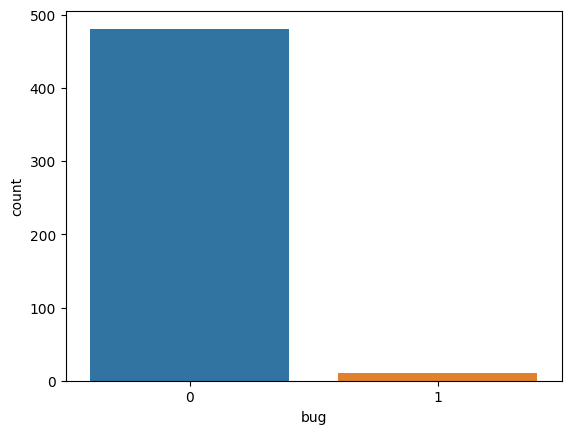

In [72]:
sns.countplot(x='bug', data=df_4)

In [67]:
cat_cols=[]
for i in df_4.columns:
    if df_4[i].dtypes=='O':
        cat_cols.append(i)

In [68]:
cat_cols.append('bug')
cat_cols

['name', 'name.1', 'bug']

In [94]:
knn_n = KNeighborsClassifier(n_neighbors=10, metric='euclidean')

In [69]:
x = df_4.drop(columns = cat_cols)
y = df_4['bug']

In [70]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
x_train.shape, y_train.shape

((393, 21), (393,))

In [73]:
x_train_arr= np.array(x_train)
y_train_arr = np.array(y_train)

In [74]:
conf_matrix_jd_rf=[]
acc_jd_rf=[]
prec_jd_rf=[]
rec_jd_rf=[]
f1_jd_rf=[]
auc_jd_rf=[]
TP_jd_rf=[]
TN_jd_rf=[]
FP_jd_rf=[]
FN_jd_rf=[]

In [75]:
for i in variants:
    x_samp, y_samp = i.sample(x_train_arr, y_train_arr)
    rf.fit(x_samp, y_samp)
    y_pred = rf.predict(x_test)
    conf= confusion_matrix(y_test, y_pred)
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred)
    conf_matrix_jd_rf.append(conf)
    acc_jd_rf.append(acc)
    prec_jd_rf.append(prec)
    rec_jd_rf.append(rec)
    f1_jd_rf.append(f1)
    auc_jd_rf.append(auc)

2023-06-29 13:28:05,096:INFO:NoSMOTE: Running sampling via ('NoSMOTE', "{'raise_value_error': False, 'raise_runtime_error': False, 'random_state': None, 'class_name': 'NoSMOTE'}")
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-06-29 13:28:05,211:INFO:SMOTE_TomekLinks: Running sampling via ('SMOTE_TomekLinks', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state

2023-06-29 13:28:06,633:INFO:AHC: Running sampling via ('AHC', "{'strategy': 'min', 'n_jobs': 1, 'random_state': None, 'class_name': 'AHC'}")
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-06-29 13:28:06,760:INFO:distance_SMOTE: Running sampling via ('distance_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'distance_SMOTE'}")
2

2023-06-29 13:28:08,870:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:28:08,871:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:28:08,886:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:08,910:INFO:SMOBD: returning copies for factor_1 or factor_2 is not suitable
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-06-29 13:28:09,058:INFO:SUNDO: Running sampling via ('SUNDO', "{'nn_params': {}, 'n_jobs': 1

2023-06-29 13:28:11,369:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:28:11,371:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:11,383:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:11,394:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:11,404:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:11,415:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:11,424:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:11,434:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:11,445:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:11,456:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:11,467:INFO:NearestNeig

2023-06-29 13:28:12,361:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:12,373:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:12,386:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:12,399:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:12,411:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:12,422:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:12,433:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:12,444:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:12,455:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:12,469:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:12,481:INFO:NearestNeig

2023-06-29 13:28:13,311:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:13,321:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:13,331:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:13,340:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:13,350:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:13,360:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:13,368:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:13,378:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:13,387:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:13,398:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:13,407:INFO:NearestNeig

2023-06-29 13:28:14,089:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,098:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,107:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,117:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,127:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,136:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,146:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,155:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,165:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,174:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,183:INFO:NearestNeig

2023-06-29 13:28:14,858:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,867:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,876:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,885:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,892:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,901:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,911:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,919:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,928:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,937:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 13:28:14,946:INFO:NearestNeig

2023-06-29 13:28:15,968:INFO:SMOTE_Cosine: Running sampling via ('SMOTE_Cosine', "{'proportion': 1.0, 'n_neighbors': 5, 'n_jobs': 1, 'random_state': None, 'class_name': 'SMOTE_Cosine'}")
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:28:16,071:INFO:Selected_SMOTE: Running sampling via ('Selected_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'perc_sign_attr': 0.5, 'n_jobs': 1, 'random_state': None, 'class_name': 'Selected_SMOTE'}")
2023-06-29 13:28:16,072:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:28:16,073:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  w

2023-06-29 13:28:20,598:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:28:20,600:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:28:20,601:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:28:20,616:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:28:20,620:INFO:DEAGO: Input dimension: 21, encoding dimension: 6
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined 

2023-06-29 13:28:32,263:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:28:32,275:INFO:KernelADASYN: reducing dimensions due to improperly conditioned covariance matrix
2023-06-29 13:28:32,277:INFO:KernelADASYN: Running sampling via ('KernelADASYN', "{'proportion': 1.0, 'k': 5, 'nn_params': {}, 'h': 1.0, 'n_jobs': 1, 'random_state': None, 'class_name': 'KernelADASYN'}")
2023-06-29 13:28:32,278:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:28:32,280:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:28:32,282:INFO:KernelADASYN: reducing dimensions due to improperly conditioned covariance matrix
2023-06-29 13:28:32,283:INFO:KernelADASYN: Running sampling via ('KernelADASYN', "{'proportion': 1.0, 'k': 5, 'nn_params': {}, 'h': 1.0, 'n_jobs': 1, 'random_state': None, 'class_name': 'KernelADASYN'}")
2023-06-29 13:28:32,285:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowsk

2023-06-29 13:28:47,869:INFO:SMOTE_PSO: Iteration 6
2023-06-29 13:28:48,648:INFO:SMOTE_PSO: Iteration 7
2023-06-29 13:28:49,408:INFO:SMOTE_PSO: Iteration 8
2023-06-29 13:28:50,168:INFO:SMOTE_PSO: Iteration 9
2023-06-29 13:28:50,946:INFO:SMOTE_PSO: Iteration 10
2023-06-29 13:28:51,695:INFO:SMOTE_PSO: Iteration 11
2023-06-29 13:28:52,421:INFO:SMOTE_PSO: Iteration 12
2023-06-29 13:28:53,187:INFO:SMOTE_PSO: Iteration 13
2023-06-29 13:28:53,999:INFO:SMOTE_PSO: Iteration 14
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:28:54,945:INFO:CURE_SMOTE: Running sampling via ('CURE_SMOTE', "{'proportion': 1.0, 'n_clusters': 5, 'noise_th': 2, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'CURE_S

2023-06-29 13:28:56,553:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:28:56,566:INFO:Assembled_SMOTE: simplex sampling with n_dim 2
2023-06-29 13:28:56,568:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:28:56,569:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:28:56,581:INFO:Assembled_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:28:56,653:INFO:SDSMOTE: Running sampling via ('SDSMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SDSMOTE'}")
2023-06-29 13:28:56,653:INFO:NearestNeighborsWithMetricTens

2023-06-29 13:29:06,527:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4027315214148999, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:06,527:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:06,529:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:06,545:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 13:29:06,557:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.106212926848189, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:06,559:INFO:NearestNeighborsWithMetricTensor: NN fitti

2023-06-29 13:29:07,119:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3961439559341478, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:07,120:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:07,121:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:07,135:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 13:29:07,150:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.19094396605700817, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:07,151:INFO:NearestNeighborsWithMetricTensor: NN fit

2023-06-29 13:29:07,603:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:07,604:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:07,619:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:07,631:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9188064597829319, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:07,632:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:07,633:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:07,648:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:07,671:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 

2023-06-29 13:29:08,064:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:08,078:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:08,142:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:08,143:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:08,144:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:08,159:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:08,173:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3272536217025486, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'ga

2023-06-29 13:29:08,668:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 13:29:08,678:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:08,679:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:08,680:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:08,694:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 13:29:08,703:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:08,704:INFO:Neare

2023-06-29 13:29:09,157:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:09,158:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:09,159:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:09,174:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 13:29:09,183:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:09,184:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023

2023-06-29 13:29:09,757:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:09,758:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:09,775:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:09,786:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:09,787:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:09,788:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:09,804:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 13:29:09,814:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'

2023-06-29 13:29:10,214:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:10,228:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:10,253:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9509878197926467, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:10,255:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:10,256:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:10,271:INFO:SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:29:10,402:INFO:MDO: Running samplin

2023-06-29 13:29:11,008:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,009:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,010:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,012:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,015:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,023:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,025:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,026:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,028:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,030:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,032:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,035:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,043:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,044:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,046:INFO:GASMOTE: simplex sa

2023-06-29 13:29:11,362:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,364:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,367:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,369:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,378:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,380:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,381:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,390:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,391:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,394:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,396:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,398:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,400:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,402:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,412:INFO:GASMOTE: simplex sa

2023-06-29 13:29:11,737:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,739:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,740:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,744:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,757:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,759:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,762:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,764:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,766:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,769:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,771:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,772:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,784:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,786:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:11,789:INFO:GASMOTE: simplex sa

2023-06-29 13:29:12,141:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,142:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,150:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,151:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,154:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,156:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,166:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,168:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,170:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,172:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,181:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,182:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,184:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,185:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,187:INFO:GASMOTE: simplex sa

2023-06-29 13:29:12,547:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,559:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,561:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,564:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,566:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,575:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,577:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,579:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,581:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,591:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,591:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,594:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,597:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,607:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:12,608:INFO:GASMOTE: simplex sa

2023-06-29 13:29:13,001:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,002:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,004:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,015:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,018:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,019:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,022:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,033:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,035:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,037:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,039:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,048:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,049:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,050:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,059:INFO:GASMOTE: simplex sa

2023-06-29 13:29:13,462:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,473:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,474:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,475:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,477:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,487:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,488:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,490:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,491:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,501:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,503:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,505:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,506:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,515:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:13,517:INFO:GASMOTE: simplex sa

2023-06-29 13:29:13,983:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:13,984:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:13,999:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:14,002:INFO:SMOTE_FRST_2T: minority added: 32, majority removed: 0
2023-06-29 13:29:14,003:INFO:SMOTE_FRST_2T: iteration: 4
2023-06-29 13:29:14,004:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.2, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:14,004:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:14,005:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:14,018:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:14,021:INFO:SMOTE_FRST_2T: minority

2023-06-29 13:29:14,474:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:14,474:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:14,490:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:14,511:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8557232171815023, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:14,513:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:14,513:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:14,527:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:14,548:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7818710480632171, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None

2023-06-29 13:29:15,019:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:15,020:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:15,035:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:15,062:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4148962919092765, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:15,063:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:15,063:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:15,079:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:15,108:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.325286514173724, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 13:29:15,699:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:15,700:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:15,714:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:15,751:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.865526072873853, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:15,752:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:15,753:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:15,769:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:15,813:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1040730070063676, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None},

2023-06-29 13:29:16,652:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:16,653:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:16,669:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:16,771:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3840079943139223, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:16,773:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:16,774:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:16,789:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:16,849:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5181742717631255, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:29:18,005:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:18,006:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:18,021:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:18,107:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.4788915007600028, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:18,109:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:18,109:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:18,125:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:18,224:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.221931826505379, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:29:19,071:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:19,071:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:19,085:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:19,107:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2161380069298804, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:19,109:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:19,110:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:19,125:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:19,152:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.167003590638768, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 13:29:19,696:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:19,697:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:19,713:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:19,742:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.405103492451889, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:19,744:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:19,744:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:19,758:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:19,791:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7766358482207614, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}

2023-06-29 13:29:20,522:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:20,523:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:20,540:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:20,592:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7624080539744598, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:20,592:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:20,593:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:20,608:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:20,653:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9094728287491898, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:29:21,576:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:21,577:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:21,594:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:21,667:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.882774637825155, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:21,668:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:21,669:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:21,685:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:21,762:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.185089628581609, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 13:29:22,643:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:22,644:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:22,657:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:22,674:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.010517456215031, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:22,675:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:22,676:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:22,689:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:22,708:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3149290605366484, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None},

2023-06-29 13:29:23,304:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:23,304:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:23,319:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:23,371:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4413810692218396, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:23,372:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:23,373:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:23,387:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:23,420:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6832717582416752, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:29:24,300:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:24,300:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:24,316:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:24,381:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.0427512906766125, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:24,382:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:24,382:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:24,400:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:24,478:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0988424200944085, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:29:25,604:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:25,605:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:25,620:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:25,719:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.3336157996315774, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:25,720:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:25,720:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:25,736:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:25,824:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.910020680764271, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:29:27,146:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:27,147:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:27,161:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:27,182:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9274192789251354, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:27,182:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:27,184:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:27,197:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:27,217:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.186751839053758, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None},

2023-06-29 13:29:27,745:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:27,745:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:27,759:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:27,800:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4604176276405254, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:27,801:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:27,802:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:27,816:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:27,849:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5625509935096529, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:29:28,644:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:28,645:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:28,662:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:28,718:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.486418319805671, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:28,719:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:28,720:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:28,735:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:28,796:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0944056052075957, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:29:29,822:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:29,823:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:29,840:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:29,937:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.9621798314895025, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:29,939:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:29,940:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:29,955:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:30,027:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.269587501500231, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:29:31,390:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:31,391:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:31,405:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:31,773:INFO:AMSCO: fitness scores: 0.608046 0.608046 0.608046 0.608046
2023-06-29 13:29:31,773:INFO:AMSCO starting iteration 4
2023-06-29 13:29:31,774:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.6557523168934829, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:31,777:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:31,778:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:31,790:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13

2023-06-29 13:29:32,211:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:32,212:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:32,226:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:32,248:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.257099914693418, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:32,250:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:32,251:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:32,266:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:32,293:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0657703882972895, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None},

2023-06-29 13:29:32,842:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:32,843:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:32,857:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:32,887:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.341204345979031, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:32,888:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:32,889:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:32,903:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:32,933:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7796620219438852, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None},

2023-06-29 13:29:33,656:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:33,657:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:33,672:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:33,722:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8547265289271857, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:33,723:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:33,724:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:33,740:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:33,783:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8335008014267875, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:29:34,721:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:34,722:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:34,737:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:34,811:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.0119999776757274, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:34,813:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:34,813:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:34,828:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:34,902:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.848037973464537, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:29:35,773:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:35,774:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:35,787:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:35,815:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.226098587844848, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:35,816:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:35,817:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:35,831:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:35,856:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1771426848127124, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 13:29:36,464:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:36,465:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:36,480:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:36,530:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7315515774036656, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:36,531:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:36,532:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:36,546:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:36,586:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8648184888213544, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None

2023-06-29 13:29:37,467:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:37,467:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:37,483:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:37,547:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.9883979430053182, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:37,549:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:37,549:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:37,566:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:37,648:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6993629697504993, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:29:38,872:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:38,873:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:38,889:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:38,986:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.407033246827424, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:38,987:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:38,987:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:39,005:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:39,102:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1,

2023-06-29 13:29:40,430:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:40,431:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:40,443:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:40,458:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1806725030712326, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:40,460:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:40,460:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:40,473:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:40,496:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9330042548349377, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:29:41,016:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:41,016:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:41,031:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:41,070:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2076028682290374, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:41,071:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:41,072:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:41,086:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:41,116:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6839638241417936, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:29:41,805:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:41,806:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:41,822:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:41,862:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.34437035759, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:41,863:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:41,864:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:41,880:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:41,939:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7616202406775592, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, '

2023-06-29 13:29:42,865:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:42,866:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:42,882:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:42,955:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5405682622371044, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:42,957:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:42,957:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:42,974:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:43,041:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.4149898074805765, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:29:44,369:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:44,370:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:44,380:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:44,398:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9327551127615236, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:44,400:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:44,401:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:44,413:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:44,432:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9648809799232657, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}

2023-06-29 13:29:44,924:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:44,925:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:44,940:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:44,973:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.469554715508148, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:44,974:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:44,975:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:44,991:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:45,023:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4746193157726528, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None},

2023-06-29 13:29:45,728:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:45,728:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:45,745:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:45,791:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1502114445801754, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:45,792:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:45,793:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:45,808:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:45,865:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2109183645986126, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:29:46,838:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:46,839:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:46,855:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:46,936:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5170442588016586, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:46,937:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:46,938:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:46,953:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:47,021:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.0221626349593187, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:29:48,304:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:48,306:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:48,321:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:48,427:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:48,428:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:48,429:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:48,446:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:48,558:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.453076823299741, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1,

2023-06-29 13:29:49,373:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:49,374:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:49,388:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:49,413:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5900961229878188, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:49,414:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:49,415:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:49,430:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:49,471:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0187407399167978, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:29:50,112:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:50,113:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:50,129:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:50,185:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5227780884900808, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:50,187:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:50,187:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:50,202:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:50,237:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.225211561077842, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:29:51,110:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:51,111:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:51,126:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:51,194:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.852794022606649, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:51,196:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:51,196:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:51,211:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:51,288:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.026163289796038, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 13:29:52,361:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:52,362:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:52,379:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:52,442:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.4787787087111566, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:52,443:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:52,444:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:52,461:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:52,556:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.698240973894112, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:29:53,517:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:53,517:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:53,530:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:53,555:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9154637458058247, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:53,556:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:53,557:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:53,570:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:53,589:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9377250969053723, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}

2023-06-29 13:29:54,151:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:54,152:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:54,167:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:54,212:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7744224572616103, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:54,213:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:54,214:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:54,228:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:54,271:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4568818869231959, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:29:55,030:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:55,031:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:55,048:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:55,105:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7192473492355753, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:55,106:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:55,107:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:55,121:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:55,200:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6158982554315733, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:29:56,263:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:56,264:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:56,280:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:56,337:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.136042016154009, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:56,338:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:56,339:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:56,357:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:56,443:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.5645658517857335, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:29:57,805:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:57,805:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:57,817:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:57,839:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8206790799653501, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:57,841:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:57,842:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:57,853:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:57,870:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8699662058159466, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}

2023-06-29 13:29:58,374:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:58,375:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:58,389:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:58,416:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6952293938489107, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:58,418:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:58,419:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:58,433:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:58,477:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.325369212119133, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 13:29:59,166:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:59,167:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:59,184:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:59,237:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6611563581114506, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:29:59,239:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:29:59,239:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:29:59,254:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:29:59,294:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4653441076855334, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:30:00,207:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:30:00,208:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:30:00,223:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:30:00,293:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7365346891340154, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:30:00,294:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:30:00,295:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:30:00,311:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:30:00,381:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1632430963973124, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:30:01,538:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:30:01,540:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:30:01,555:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:30:01,787:INFO:AMSCO: fitness scores: 0.587859 0.608046 0.587859 0.608046
2023-06-29 13:30:01,788:INFO:AMSCO starting iteration 11
2023-06-29 13:30:01,790:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.6404171333639578, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:30:01,791:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:30:01,792:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:30:01,805:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 

2023-06-29 13:30:02,249:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:30:02,249:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:30:02,264:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:30:02,291:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9411325949274564, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:30:02,292:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:30:02,293:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:30:02,308:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:30:02,330:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0623854516625968, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:30:02,878:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:30:02,879:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:30:02,895:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:30:02,926:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6581272672001426, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:30:02,927:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:30:02,928:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:30:02,944:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:30:02,981:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4461042439685503, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:30:03,725:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:30:03,726:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:30:03,742:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:30:03,787:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.023835128804864, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:30:03,789:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:30:03,790:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:30:03,806:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:30:03,857:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.490777794859829, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 13:30:04,859:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:30:04,860:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:30:04,876:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:30:04,948:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.8244687609270174, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:30:04,949:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:30:04,951:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:30:04,967:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 13:30:05,041:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6917745814859764, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 13:30:15,099:INFO:DSRBF: Iteration 11/40, loss: 0.717147, data size: 770
2023-06-29 13:30:15,189:INFO:DSRBF: Iteration 12/40, loss: 0.717147, data size: 770
2023-06-29 13:30:15,283:INFO:DSRBF: Iteration 13/40, loss: 0.717147, data size: 770
2023-06-29 13:30:15,380:INFO:DSRBF: Iteration 14/40, loss: 0.717147, data size: 770
2023-06-29 13:30:15,472:INFO:DSRBF: Iteration 15/40, loss: 0.717147, data size: 770
2023-06-29 13:30:15,563:INFO:DSRBF: Iteration 16/40, loss: 0.717147, data size: 770
2023-06-29 13:30:15,662:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 13:30:15,663:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:30:15,665:INFO:NearestNeighborsWithMetricTensor: kneighbors qu

2023-06-29 13:30:26,942:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 13:30:26,943:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 13:30:26,954:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-06-29 13:30:26,957:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-06-29 13:30:26,958:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-06-29 13:30:26,960:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-06-29 13:30:26,962:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-06-29 13:30:26,964:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-06-29 13:30:26,966:INFO:SN_SMOTE: simplex sampling with n_dim 2
2023-06-29 13:30:26,968:INFO:SN_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-29 13:30:27,046:INFO:CCR: Running sampling via ('C

In [86]:
for i in range(len(conf_matrix_jd_rf)):
    TN_jd_rf.append(conf_matrix_jd_rf[i][0][0])
    FP_jd_rf.append(conf_matrix_jd_rf[i][0][1])
    FN_jd_rf.append(conf_matrix_jd_rf[i][1][0])
    TP_jd_rf.append(conf_matrix_jd_rf[i][1][1])

In [81]:
len(acc_jd_rf), len(prec_jd_rf), len(rec_jd_rf), len(f1_jd_rf), len(auc_jd_rf), len(conf_matrix_jd_rf)

(87, 87, 87, 87, 87, 87)

In [82]:
len(TP_jd_rf), len(TN_jd_rf), len(FN_jd_rf), len(FP_jd_rf)

(87, 87, 87, 87)

In [83]:
rjd_rf = pd.DataFrame({'Variants':var_names, 'TP':TP_jd_rf, 'TN':TN_jd_rf, 'FP':FP_jd_rf, 'FN':FN_jd_rf, 'Precision':prec_jd_rf, 'Recall':rec_jd_rf, 'F1':f1_jd_rf, 'AUC':auc_jd_rf})

In [85]:
jd_rf_results = rjd_rf.to_csv('jd_rf_results.csv')

In [99]:
conf_matrix_jd_knn=[]
acc_jd_knn=[]
prec_jd_knn=[]
rec_jd_knn=[]
f1_jd_knn=[]
auc_jd_knn=[]
TP_jd_knn=[]
TN_jd_knn=[]
FP_jd_knn=[]
FN_jd_knn=[]

In [100]:
for i in variants:
    x_samp, y_samp = i.sample(x_train_arr, y_train_arr)
    knn_n.fit(x_samp, y_samp)
    y_pred = knn_n.predict(x_test)
    conf= confusion_matrix(y_test, y_pred)
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred)
    conf_matrix_jd_knn.append(conf)
    acc_jd_knn.append(acc)
    prec_jd_knn.append(prec)
    rec_jd_knn.append(rec)
    f1_jd_knn.append(f1)
    auc_jd_knn.append(auc)

2023-06-29 16:55:53,504:INFO:NoSMOTE: Running sampling via ('NoSMOTE', "{'raise_value_error': False, 'raise_runtime_error': False, 'random_state': None, 'class_name': 'NoSMOTE'}")
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-06-29 16:55:53,529:INFO:SMOTE_TomekLinks: Running sampling via ('SMOTE_TomekLinks', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state':

C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 16:55:54,070:INFO:distance_SMOTE: Running sampling via ('distance_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'distance_SMOTE'}")
2023-06-29 16:55:54,071:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:55:54,072:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:55:54,085:INFO:distance_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-

C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-06-29 16:55:54,741:INFO:SUNDO: Running sampling via ('SUNDO', "{'nn_params': {}, 'n_jobs': 1, 'random_state': None, 'class_name': 'SUNDO'}")
2023-06-29 16:55:54,742:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:55:54,745:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsCl

2023-06-29 16:55:55,811:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:55:55,812:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:55,828:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:55,838:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:55,847:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:55,857:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:55,868:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:55,877:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:55,890:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:55,900:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:55,911:INFO:NearestNeig

2023-06-29 16:55:56,640:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:56,649:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:56,657:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:56,667:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:56,675:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:56,684:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:56,693:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:56,702:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:56,711:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:56,720:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:56,729:INFO:NearestNeig

2023-06-29 16:55:57,422:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:57,431:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:57,440:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:57,448:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:57,457:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:57,466:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:57,474:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:57,484:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:57,492:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:57,501:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:57,510:INFO:NearestNeig

2023-06-29 16:55:58,183:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:58,191:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:58,199:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:58,209:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:58,219:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:58,228:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:58,237:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:58,246:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:58,255:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:58,263:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:58,272:INFO:NearestNeig

2023-06-29 16:55:58,926:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:58,934:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:58,943:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:58,952:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:58,961:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:58,974:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:58,983:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:58,993:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:59,004:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:59,014:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:55:59,023:INFO:NearestNeig

C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 16:55:59,956:INFO:Selected_SMOTE: Running sampling via ('Selected_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'perc_sign_attr': 0.5, 'n_jobs': 1, 'random_state': None, 'class_name': 'Selected_SMOTE'}")
2023-06-29 16:55:59,957:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:55:59,958:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 16:55:59,999:INFO:LN_SMOTE: Running sampling via ('LN_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'random_state': None, 'class_name':

2023-06-29 16:56:04,611:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:56:04,612:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:04,613:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:04,632:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:04,636:INFO:DEAGO: Input dimension: 21, encoding dimension: 6
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 16:56:06,471:INFO:Gazzah: Running sampling via ('Gazzah', "{'proportion': 1.0, 'n_components': 2, 'n_jobs': 1, 'random_state': None, 'class_name': 'Gazza

2023-06-29 16:56:19,484:INFO:KernelADASYN: Running sampling via ('KernelADASYN', "{'proportion': 1.0, 'k': 5, 'nn_params': {}, 'h': 1.0, 'n_jobs': 1, 'random_state': None, 'class_name': 'KernelADASYN'}")
2023-06-29 16:56:19,486:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:19,488:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:19,489:INFO:KernelADASYN: reducing dimensions due to improperly conditioned covariance matrix
2023-06-29 16:56:19,492:INFO:KernelADASYN: Running sampling via ('KernelADASYN', "{'proportion': 1.0, 'k': 5, 'nn_params': {}, 'h': 1.0, 'n_jobs': 1, 'random_state': None, 'class_name': 'KernelADASYN'}")
2023-06-29 16:56:19,493:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:19,495:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X h

C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 16:56:38,479:INFO:SOMO: Running sampling via ('SOMO', "{'proportion': 1.0, 'n_grid': 10, 'sigma': 0.2, 'learning_rate': 0.5, 'n_iter': 100, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SOMO'}")
2023-06-29 16:56:38,493:INFO:SOMO: returning copies for all clusters filtered
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due t

2023-06-29 16:56:39,886:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:56:39,896:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:56:39,905:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:56:39,914:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:56:39,923:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:56:39,932:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:56:39,941:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:56:39,951:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 16:56:39,959:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:39,960:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:39,968:INFO:SDSMOTE: simplex 

2023-06-29 16:56:47,502:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:47,559:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:56:47,561:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:47,562:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:47,576:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:47,640:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5956021938440819, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:56:47

2023-06-29 16:56:48,257:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:56:48,258:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:48,258:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:48,273:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:48,286:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:56:48,287:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023

2023-06-29 16:56:48,949:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:48,950:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:48,966:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 16:56:48,984:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:56:48,986:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:48,987:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:49,002:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:49,068:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'

2023-06-29 16:56:49,680:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:49,697:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:49,710:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:56:49,711:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:49,712:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:49,728:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:49,740:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.634863705128522, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gau

2023-06-29 16:56:50,348:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:50,407:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.3896270325855177, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:56:50,408:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:50,408:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:50,423:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:50,440:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4839840220523837, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023

2023-06-29 16:56:51,142:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:56:51,144:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:51,145:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:51,160:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:51,217:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:56:51,218:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023

2023-06-29 16:56:51,810:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:51,811:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:51,827:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 16:56:51,849:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:56:51,850:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:51,851:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:51,866:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:51,924:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.4450441819800568, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 

2023-06-29 16:56:52,507:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:52,509:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\decomposition\_pca.py:527: RuntimeWarning: invalid value encountered in divide
  explained_variance_ratio_ = explained_variance_ / total_var
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 16:56:52,569:INFO:Random_SMOTE: Running sampling via ('Random_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'random_state': None, 'class_name': 'Random_SMOTE'}")
2023-06-29 16:56:52,570:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:52,570:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C

2023-06-29 16:56:52,944:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:52,947:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:52,948:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:52,949:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:52,951:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:52,952:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:52,962:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:52,963:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:52,965:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:52,966:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:52,975:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:52,976:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:52,979:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:52,981:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:52,982:INFO:GASMOTE: simplex sa

2023-06-29 16:56:53,292:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,293:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,294:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,296:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,297:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,298:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,299:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,308:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,310:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,310:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,312:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,313:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,314:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,316:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,325:INFO:GASMOTE: simplex sa

2023-06-29 16:56:53,643:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,644:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,646:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,648:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,656:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,658:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,660:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,662:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,664:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,665:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,668:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,678:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,680:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,681:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,684:INFO:GASMOTE: simplex sa

2023-06-29 16:56:53,995:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,996:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:53,997:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,001:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,002:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,005:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,007:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,017:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,018:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,021:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,022:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,023:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,024:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,033:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,034:INFO:GASMOTE: simplex sa

2023-06-29 16:56:54,379:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,380:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,382:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,384:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,386:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,394:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,395:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,398:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,400:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,401:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,402:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,411:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,412:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,414:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,416:INFO:GASMOTE: simplex sa

2023-06-29 16:56:54,731:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,739:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,741:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,743:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,744:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,745:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,747:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,755:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,757:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,759:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,769:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,771:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,773:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,775:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:54,776:INFO:GASMOTE: simplex sa

2023-06-29 16:56:55,101:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:55,124:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:55,125:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:55,127:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:55,129:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:55,132:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:55,143:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:55,145:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:55,148:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:55,150:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:55,153:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:55,162:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:55,163:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:55,165:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:55,167:INFO:GASMOTE: simplex sa

2023-06-29 16:56:55,521:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:55,522:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:55,550:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:55,551:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:55,579:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:55,580:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:55,596:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:55,597:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:55,613:INFO:A_SUWO: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  wa

2023-06-29 16:56:55,872:INFO:SMOTE_FRST_2T: minority added: 39, majority removed: 0
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 16:56:55,892:INFO:AND_SMOTE: Running sampling via ('AND_SMOTE', "{'proportion': 1.0, 'K': 15, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'AND_SMOTE'}")
2023-06-29 16:56:55,893:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:55,894:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:55,916:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:55,917:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:55,929:INFO:AND_SMO

2023-06-29 16:56:56,376:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:56,391:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:56,416:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0669481060585122, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:56:56,417:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:56,417:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:56,433:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:56,459:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4523410952646096, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling'

2023-06-29 16:56:57,056:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:57,072:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:57,107:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3429265315308252, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:56:57,108:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:57,109:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:57,125:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:57,158:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6136276837337835, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_samplin

2023-06-29 16:56:57,956:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:57,973:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:58,031:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.069213667004386, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:56:58,032:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:58,032:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:58,049:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:58,101:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.020997673748985, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling'

2023-06-29 16:56:59,141:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:59,157:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:59,254:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.037851485813036, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:56:59,256:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:56:59,256:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:56:59,271:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:56:59,359:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7551560123704153, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling

2023-06-29 16:57:00,689:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:00,690:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:00,705:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:00,729:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0090212080926175, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:00,730:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:00,731:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:00,746:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:00,772:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.121162000481342, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}

2023-06-29 16:57:01,343:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:01,344:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:01,360:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:01,404:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5084539528481842, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:01,406:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:01,407:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:01,422:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:01,460:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6047803031216006, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 16:57:02,238:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:02,238:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:02,254:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:02,299:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3243169441567293, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:02,300:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:02,301:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:02,317:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:02,375:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2282548280191947, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 16:57:03,360:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:03,361:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:03,377:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:03,455:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2096079341266424, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:03,456:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:03,457:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:03,473:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:03,528:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.9295208491437075, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 16:57:04,935:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:04,935:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:04,950:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:04,970:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0029087209936174, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:04,971:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:04,972:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:04,987:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:05,010:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.6412847569011167, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}

2023-06-29 16:57:05,557:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:05,558:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:05,580:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:05,628:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3145707871519847, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:05,630:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:05,630:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:05,645:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:05,677:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6207224150025867, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 16:57:06,403:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:06,403:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:06,420:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:06,474:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3363986739897613, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:06,475:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:06,476:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:06,492:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:06,552:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9807618720068503, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 16:57:07,506:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:07,508:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:07,524:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:07,579:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.825136192862481, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:07,580:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:07,581:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:07,595:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:07,668:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.206681351757686, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 16:57:09,004:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:09,005:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:09,020:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:09,133:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.4179205915409288, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:09,134:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:09,135:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:09,150:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:09,248:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1

2023-06-29 16:57:10,060:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:10,060:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:10,076:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:10,101:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9401418436768376, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:10,102:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:10,103:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:10,118:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:10,141:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3123458881816261, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 16:57:10,752:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:10,753:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:10,769:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:10,815:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3756088113062173, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:10,816:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:10,817:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:10,833:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:10,868:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3548841589304097, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 16:57:11,615:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:11,617:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:11,633:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:11,690:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1049244391668287, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:11,691:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:11,691:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:11,707:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:11,760:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7685231889970952, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 16:57:12,672:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:12,673:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:12,688:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:12,771:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.8054171192147264, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:12,772:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:12,773:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:12,790:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:12,860:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5509548078194957, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 16:57:13,771:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:13,772:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:13,788:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:13,817:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0795219833719674, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:13,818:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:13,819:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:13,834:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:13,862:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.155497509412967, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}

2023-06-29 16:57:14,454:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:14,455:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:14,472:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:14,506:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7648310945856358, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:14,507:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:14,507:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:14,524:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:14,564:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.663143416311925, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 16:57:15,357:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:15,359:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:15,374:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:15,419:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1018690648060354, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:15,420:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:15,420:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:15,435:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:15,489:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4355944018211586, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 16:57:16,473:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:16,473:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:16,488:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:16,563:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3531414088189835, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:16,565:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:16,565:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:16,581:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:16,642:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.605292350607582, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 16:57:17,819:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:17,819:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:17,835:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:17,863:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.832446984299366, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:17,864:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:17,865:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:17,880:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:17,904:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3034503158878445, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 16:57:18,495:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:18,496:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:18,512:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:18,540:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6205114635934954, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:18,541:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:18,542:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:18,557:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:18,600:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2863942741307648, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 16:57:19,336:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:19,337:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:19,354:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:19,406:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.548575461816904, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:19,407:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:19,408:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:19,424:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:19,463:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.233768406853123, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 16:57:20,374:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:20,375:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:20,390:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:20,462:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5498795177986655, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:20,464:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:20,465:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:20,481:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:20,545:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9948039050697803, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 16:57:21,661:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:21,661:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:21,677:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:21,878:INFO:AMSCO: fitness scores: 0.594455 0.608046 0.594455 0.608046
2023-06-29 16:57:21,878:INFO:AMSCO starting iteration 6
2023-06-29 16:57:21,881:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7465531474632132, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:21,882:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:21,883:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:21,898:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16

2023-06-29 16:57:22,455:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:22,456:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:22,472:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:22,500:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.305931282951264, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:22,502:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:22,502:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:22,518:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:22,549:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2371096307695508, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 16:57:23,229:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:23,229:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:23,247:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:23,283:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7785390382397679, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:23,284:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:23,284:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:23,301:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:23,346:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9450397485880588, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 16:57:24,261:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:24,262:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:24,279:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:24,353:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.138829767438416, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:24,354:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:24,354:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:24,370:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:24,423:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.339161943034536, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 16:57:25,556:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:25,557:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:25,573:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:25,668:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.7020303707693487, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:25,669:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:25,670:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:25,685:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:25,790:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6660776987805272, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 16:57:26,651:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:26,652:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:26,667:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:26,693:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.940114125730922, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:26,694:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:26,695:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:26,709:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:26,734:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4717177378655812, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 16:57:27,382:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:27,385:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:27,400:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:27,449:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.623172322490369, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:27,451:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:27,452:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:27,468:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:27,507:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.370313143691849, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 16:57:28,327:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:28,328:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:28,343:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:28,394:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6665951036927122, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:28,395:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:28,395:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:28,411:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:28,487:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.317961472651878, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 16:57:29,499:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:29,500:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:29,516:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:29,617:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.394556422182476, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:29,618:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:29,619:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:29,634:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:29,698:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.380675114388125, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 16:57:30,802:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:30,803:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:30,817:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:30,847:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1513169874285438, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:30,849:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:30,849:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:30,864:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:30,892:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0037730814187897, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}

2023-06-29 16:57:31,499:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:31,500:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:31,515:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:31,550:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9601309787854997, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:31,550:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:31,552:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:31,570:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:31,623:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7631961874241382, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 16:57:32,445:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:32,446:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:32,463:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:32,521:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0747883066070583, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:32,522:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:32,524:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:32,539:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:32,592:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.9356067378921136, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 16:57:33,758:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:33,758:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:33,774:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:33,863:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.2142893026026798, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:33,864:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:33,865:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:33,882:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:33,972:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.1358065654210265, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 16:57:35,529:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:35,530:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:35,546:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:35,574:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.09339160080026, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:35,575:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:35,576:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:35,591:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:35,618:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7450361623059918, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 16:57:36,173:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:36,174:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:36,187:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:36,227:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6137297747716899, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:36,228:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:36,229:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:36,243:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:36,281:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6450604221561225, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 16:57:37,033:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:37,034:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:37,050:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:37,107:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.235792727162296, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:37,108:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:37,109:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:37,125:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:37,180:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.43703356506747, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None},

2023-06-29 16:57:38,250:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:38,253:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:38,269:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:38,328:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.0671247313640144, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:38,329:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:38,330:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:38,347:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:38,434:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.527166677049052, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 16:57:39,902:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:39,917:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:40,029:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.2988962326346445, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:40,030:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:40,032:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:40,047:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:40,143:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', '

2023-06-29 16:57:40,969:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:40,971:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:40,985:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:41,012:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1201281444313178, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:41,013:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:41,014:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:41,030:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:41,056:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4442124060769503, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 16:57:41,737:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:41,737:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:41,753:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:41,790:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6986007475735185, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:41,791:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:41,792:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:41,807:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:41,845:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7544825840124383, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 16:57:42,723:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:42,724:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:42,740:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:42,811:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9790182564008119, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:42,812:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:42,813:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:42,830:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:42,881:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3334897631480556, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 16:57:43,978:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:43,978:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:43,996:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:44,079:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.7353033726479676, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:44,081:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:44,082:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:44,097:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:44,203:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6867040256029115, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 16:57:45,272:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:45,273:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:45,288:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:45,314:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7276004007344492, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:45,315:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:45,315:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:45,332:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:45,352:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7548475768855915, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 16:57:45,923:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:45,924:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:45,940:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:45,988:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7641336876308538, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:45,989:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:45,990:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:46,006:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:46,051:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.202155687736758, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 16:57:46,832:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:46,833:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:46,849:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:46,910:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6786906592667443, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:46,912:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:46,913:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:46,928:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:46,996:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.57374946309302, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 16:57:48,025:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:48,026:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:48,043:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:48,110:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.679142805854798, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:57:48,111:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:48,112:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:48,127:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 16:57:48,235:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.672555684187924, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 16:57:50,322:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:57:50,338:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:57:50,339:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 16:57:50,424:INFO:DSRBF: Running sampling via ('DSRBF', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'hidden_range': (4, 10), 'i_b': 2, 'o_b': 2, 'n_pop': 100, 'n_init_pop': 1000, 'n_iter': 40, 'n_sampling_epoch': 5, 'n_jobs': 1, 'random_state': None, 'class_name': 'DSRBF'}")
2023-06-29 16:57:50,427:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors'

2023-06-29 16:58:27,366:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:58:27,367:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:58:27,386:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 16:58:27,387:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:58:27,388:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 16:58:27,401:INFO:SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 16:58:27,426:INFO:Gaussia

2023-06-29 16:58:28,036:INFO:cluster_SMOTE: simplex sampling with n_dim 1
2023-06-29 16:58:28,037:INFO:cluster_SMOTE: simplex sampling with n_dim 2
2023-06-29 16:58:28,039:INFO:cluster_SMOTE: The simplex order was updated from 2 to 1
2023-06-29 16:58:28,040:INFO:cluster_SMOTE: simplex sampling with n_dim 1
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 16:58:28,068:INFO:ADOMS: Running sampling via ('ADOMS', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'random_state': None, 'class_name': 'ADOMS'}")
2023-06-29 16:58:28,069:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 16:58:28,071:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature n

In [101]:
for i in range(len(conf_matrix_jd_knn)):
    TN_jd_knn.append(conf_matrix_jd_knn[i][0][0])
    FP_jd_knn.append(conf_matrix_jd_knn[i][0][1])
    FN_jd_knn.append(conf_matrix_jd_knn[i][1][0])
    TP_jd_knn.append(conf_matrix_jd_knn[i][1][1])

In [102]:
len(acc_jd_knn), len(prec_jd_knn), len(rec_jd_knn), len(f1_jd_knn), len(auc_jd_knn), len(conf_matrix_jd_knn)

(87, 87, 87, 87, 87, 87)

In [103]:
len(TP_jd_knn), len(TN_jd_knn), len(FN_jd_knn), len(FP_jd_knn)

(87, 87, 87, 87)

In [104]:
jd_knn = pd.DataFrame({'Variants':var_names, 'TP':TP_jd_knn, 'TN':TN_jd_knn, 'FP':FP_jd_knn, 'FN':FN_jd_knn, 'Precision':prec_jd_knn, 'Recall':rec_jd_knn, 'F1':f1_jd_knn, 'AUC':auc_jd_knn})

In [105]:
jd_knn_results = jd_knn.to_csv('jd_knn_results.csv')

### Synapse

In [1274]:
df_5 = pd.read_csv('synapse.csv')

In [1275]:
df_5.head()

,name,version,name.1,wmc,dit,noc,cbo,rfc,lcom,ca,...,dam,moa,mfa,cam,ic,cbm,amc,max_cc,avg_cc,bug
0,synapse,1.2,org.apache.synapse.endpoints.LoadbalanceEndpoint,15,1,0,18,52,37,3,...,1.0,4,0.0,0.255102,0,0,16.533333,13,2.0667,1
1,synapse,1.2,org.apache.synapse.util.concurrent.SynapseThre...,3,3,0,2,8,3,1,...,0.0,0,1.0,0.555556,0,0,15.000000,0,0.0000,0
2,synapse,1.2,org.apache.synapse.mediators.AbstractMediator,15,1,18,23,33,7,18,...,1.0,0,0.0,0.380952,0,0,14.066667,4,2.3333,4
3,synapse,1.2,org.apache.synapse.config.xml.AnonymousListMed...,2,3,0,6,5,1,2,...,0.0,0,0.8,0.500000,0,0,6.000000,1,0.5000,0
4,synapse,1.2,org.apache.synapse.endpoints.algorithms.Loadba...,2,1,0,11,2,1,8,...,0.0,0,0.0,0.833333,0,0,0.000000,1,1.0000,1


In [1276]:
df_5.shape

(256, 24)

In [1277]:
df_5['bug'].unique()

array([1, 0, 4, 6, 2, 9, 3], dtype=int64)

In [1278]:
len(df_5['bug'].loc[df_5['bug']==0])

170

In [1279]:
len(df_5['bug'].loc[df_5['bug']==1])

52

In [1280]:
len(df_5['bug'].loc[df_5['bug']==2])

22

In [1281]:
len(df_5['bug'].loc[df_5['bug']==3])

6

In [1282]:
len(df_5['bug'].loc[df_5['bug']==4])

4

In [1283]:
len(df_5['bug'].loc[df_5['bug']==6])

1

In [1284]:
len(df_5['bug'].loc[df_5['bug']==9])

1

### Tomcat

In [167]:
df_6 = pd.read_csv('tomcat.csv')

In [168]:
df_6.head()

,name,version,name.1,wmc,dit,noc,cbo,rfc,lcom,ca,...,dam,moa,mfa,cam,ic,cbm,amc,max_cc,avg_cc,bug
0,Tomcat,6.0.389418,org.apache.coyote.http11.filters.VoidOutputFilter,8,1,0,6,14,26,2,...,1.0,2,0.00000,0.392857,0,0,3.500000,1,0.7500,0
1,Tomcat,6.0.389418,org.apache.el.parser.AstGreaterThan,2,4,0,4,5,1,1,...,0.0,0,0.97561,0.666667,1,1,17.000000,1,0.5000,0
2,Tomcat,6.0.389418,org.apache.coyote.Request,56,1,0,49,89,1310,40,...,1.0,24,0.00000,0.137500,0,0,8.821429,5,1.1964,0
3,Tomcat,6.0.389418,javax.el.MethodNotFoundException,4,5,1,0,8,6,0,...,0.0,0,1.00000,0.666667,0,0,4.000000,0,0.0000,0
4,Tomcat,6.0.389418,org.apache.naming.EjbRef,3,2,0,3,8,3,3,...,0.0,0,0.93750,0.833333,0,0,22.000000,3,1.0000,0


In [169]:
df_6['bug'].unique()

array([0, 1, 2, 4, 6, 3], dtype=int64)

In [170]:
df_6.shape

(858, 24)

In [171]:
len(df_6['bug'].loc[df_6['bug']==0])

781

In [172]:
len(df_6['bug'].loc[df_6['bug']==1])

55

In [173]:
len(df_6['bug'].loc[df_6['bug']==2])

15

In [174]:
len(df_6['bug'].loc[df_6['bug']==3])

1

In [175]:
len(df_6['bug'].loc[df_6['bug']==4])

5

In [176]:
len(df_6['bug'].loc[df_6['bug']==6])

1

In [177]:
df_6['bug'].replace(2, 1, inplace=True)

In [178]:
df_6['bug'].replace(3, 1, inplace=True)

In [179]:
df_6['bug'].replace(4, 1, inplace=True)

In [180]:
df_6['bug'].replace(6, 1, inplace=True)

<AxesSubplot:xlabel='bug', ylabel='count'>

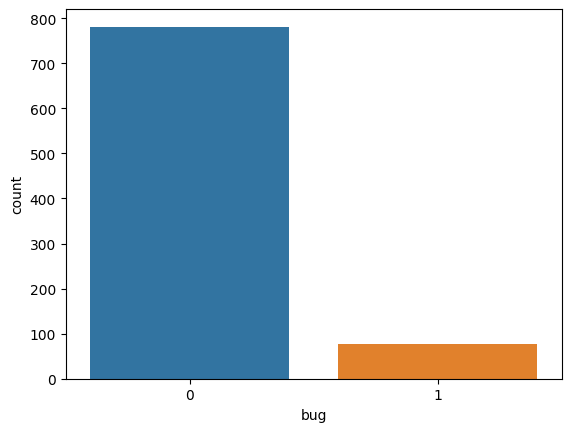

In [181]:
sns.countplot(x='bug', data=df_6)

In [182]:
cat_cols=[]
for i in df_6.columns:
    if df_6[i].dtypes=='O':
        cat_cols.append(i)
cat_cols.append('bug')
cat_cols

['name', 'version', 'name.1', 'bug']

In [183]:
x = df_6.drop(columns=cat_cols)
y = df_6['bug']

In [184]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((686, 20), (686,), (172, 20), (172,))

In [185]:
x_train_arr = np.array(x_train)
y_train_arr = np.array(y_train)

In [133]:
conf_matrix_tom_knn=[]
prec_tom_knn=[]
acc_tom_knn=[]
rec_tom_knn=[]
f1_tom_knn=[]
auc_tom_knn=[]
TP_tom_knn=[]
TN_tom_knn=[]
FP_tom_knn=[]
FN_tom_knn=[]

In [135]:
knn = KNeighborsClassifier(n_neighbors=15, metric='euclidean')

In [136]:
for i in variants:
    x_samp, y_samp = i.sample(x_train_arr, y_train_arr)
    knn.fit(x_samp, y_samp)
    y_pred= knn.predict(x_test)
    conf = confusion_matrix(y_test, y_pred)
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred)
    conf_matrix_tom_knn.append(conf)
    acc_tom_knn.append(acc)
    prec_tom_knn.append(prec)
    rec_tom_knn.append(rec)
    f1_tom_knn.append(f1)
    auc_tom_knn.append(auc)

for i in range(len(conf_matrix_tom_knn)):
    TN_tom_knn.append(conf_matrix_tom_knn[i][0][0])
    FP_tom_knn.append(conf_matrix_tom_knn[i][0][1])
    FN_tom_knn.append(conf_matrix_tom_knn[i][1][0])
    TP_tom_knn.append(conf_matrix_tom_knn[i][1][1])

2023-06-29 21:50:32,419:INFO:NoSMOTE: Running sampling via ('NoSMOTE', "{'raise_value_error': False, 'raise_runtime_error': False, 'random_state': None, 'class_name': 'NoSMOTE'}")
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 21:50:32,463:INFO:SMOTE_TomekLinks: Running sampling via ('SMOTE_TomekLinks', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state': None, 'class_name': 'SMOTE_TomekLinks'}")
2023-06-29 21:50:32,464:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'ra

2023-06-29 21:50:33,556:INFO:SMMO: Running sampling via ('SMMO', "{'proportion': 1.0, 'n_neighbors': 5, 'ensemble': [('sklearn.discriminant_analysis', 'QuadraticDiscriminantAnalysis', {}), ('sklearn.tree', 'DecisionTreeClassifier', {'random_state': 2}), ('sklearn.naive_bayes', 'GaussianNB', {})], 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMMO'}")
2023-06-29 21:50:33,582:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:50:33,583:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:50:33,605:INFO:SMMO: simplex sampling with n_dim 2
2023-06-29 21:50:33,607:INFO:SMMO: simplex sampling with n_dim 2
2023-06-29 21:50:33,611:INFO:SMMO: simplex sampling with n_dim 2
2023-06-29 21:50:33,613:INFO:SMMO: simplex sampling with n_dim 2
2023-06-29 21:50:33,616:INFO:SMMO: simplex sampling with n_d

2023-06-29 21:50:35,139:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:50:35,141:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:50:35,171:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:50:35,185:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:50:35,186:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 21:50:35,691:INFO:SVM_balance: Running sampling via ('SVM_balance', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state': None, 'class_name': 'SVM_balance'}")
2023-06-29 21:50:35,693:INFO:SMOTE: R

2023-06-29 21:50:37,984:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:37,996:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:38,008:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:38,019:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:38,029:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:38,039:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:38,051:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:38,061:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:38,071:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:38,081:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:38,092:INFO:NearestNeig

2023-06-29 21:50:38,912:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:38,921:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:38,932:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:38,942:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:38,955:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:38,979:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:38,988:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:39,003:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:39,014:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:39,027:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:39,038:INFO:NearestNeig

2023-06-29 21:50:39,859:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:39,870:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:39,880:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:39,891:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:39,902:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:39,913:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:39,924:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:39,936:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:39,948:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:39,959:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:39,971:INFO:NearestNeig

2023-06-29 21:50:40,802:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:40,814:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:40,824:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:40,834:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:40,846:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:40,856:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:40,867:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:40,878:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:40,889:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:40,901:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:40,911:INFO:NearestNeig

2023-06-29 21:50:41,730:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:41,740:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:41,751:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:41,761:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:41,773:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:41,784:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:41,794:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:41,807:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:41,817:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:41,830:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:41,840:INFO:NearestNeig

2023-06-29 21:50:42,659:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:42,670:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:42,680:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:42,693:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:42,704:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:42,714:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:42,725:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:42,735:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:42,745:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:42,757:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:42,769:INFO:NearestNeig

2023-06-29 21:50:43,583:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:43,594:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:43,605:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:43,616:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:43,627:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:43,639:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:43,650:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:43,661:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:43,670:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:43,681:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:43,693:INFO:NearestNeig

2023-06-29 21:50:44,530:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:44,542:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:44,553:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:44,563:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:44,576:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:44,589:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:44,599:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:44,610:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:44,622:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:44,633:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:44,644:INFO:NearestNeig

2023-06-29 21:50:45,824:INFO:SOI_CJ: Executing clustering
2023-06-29 21:50:45,825:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:50:45,827:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:50:45,828:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:50:45,853:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:45,868:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:45,883:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:45,895:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:45,906:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:45,920:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:50:45,931:INFO:NearestNeighborsWithMetricTensor: radius neighbors quer

2023-06-29 21:50:46,715:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:50:46,716:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:50:46,751:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:50:46,752:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:50:46,768:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:50:46,770:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:50:46,783:INFO:MWMOTE: computing closeness factors
2023-06-29 21:50:46,956:INFO:MWMOTE: computing information weights
2023-06-29 21:50:46,962:INFO:MWMOTE: do clustering
2023-06-29 21:50:47,054:INFO:MWMOTE: simplex sampling with n_dim 2
2023-06-29 21:50:47,056:INFO:MWMOTE: simplex sampling with n_dim 2
2023-06-29 21:50:47,057:INFO:MWMOTE: simplex sampling with n_dim 2
2023-06-29 21:50:47,059:INFO:MWMOTE: The simplex order was

2023-06-29 21:50:59,373:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:50:59,374:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:50:59,385:INFO:MCT: simplex sampling with n_dim 1
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 21:50:59,411:INFO:ADG: Running sampling via ('ADG', "{'proportion': 1.0, 'kernel': 'inner', 'lam': 1.0, 'mu': 1.0, 'k': 12, 'gamma': 1.0, 'n_jobs': 1, 'random_state': None, 'class_name': 'ADG'}")
2023-06-29 21:50:59,872:INFO:ADG: Starting iteration with q=554
2023-06-29 21:51:00,578:WARNING:ADG: reducing dimensionality to 10
2023-06-29 21:51:00,597:INFO:ADG: Running sampling via ('ADG', "{'proportion': 1.0, 'kernel': 'inner', 'lam': 1.0, 'mu': 1.0, 'k': 12, 'gamma': 1.0, 'n_jobs': 1, 'random_state': None, 'class_name': 'ADG'}")
202

C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
2023-06-29 21:51:18,953:INFO:OUPS: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 21:51:18,978:INFO:SMOTE_D: Running sampling via ('SMOTE_D', "{'proportion': 1.0, 'k': 3, 'nn_params': {}, 'n_jobs': 1, 'random_state': None, 'class_name': 'SMOTE_D'}")
2023-06-29 

2023-06-29 21:52:29,849:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:29,850:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:29,868:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:29,878:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:29,880:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:29,903:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:29,913:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:29,914:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:29,938:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:29,948:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:29,949:INFO:NearestNeighborsWithMetricTensor: kneighbors qu

2023-06-29 21:52:30,770:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:52:30,777:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:52:30,786:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:52:30,797:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:52:30,807:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:52:30,817:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:52:30,825:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:52:30,835:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:52:30,845:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:52:30,856:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:52:30,867:INFO:NearestNeig

2023-06-29 21:52:31,548:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:31,573:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:52:31,582:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:52:31,591:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:52:31,601:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:52:31,611:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:52:31,622:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:52:31,632:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:52:31,641:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:52:31,650:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:52:31,660:INFO:NearestNeighborsW

2023-06-29 21:52:48,082:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:48,084:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:48,099:INFO:NT_SMOTE: simplex sampling with n_dim 3
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 21:52:48,134:INFO:Lee: Running sampling via ('Lee', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'rejection_level': 0.5, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'Lee'}")
2023-06-29 21:52:48,136:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:48,137:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:48,140:INFO:N

2023-06-29 21:52:49,238:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:49,238:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:49,257:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:52:49,289:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.690591447476386, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:52:49,291:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:49,292:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:49,312:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:52:49,368:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5698532348640337, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None},

2023-06-29 21:52:50,377:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:50,378:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:50,395:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:52:50,512:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:52:50,513:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:50,515:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:50,532:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:52:50,577:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9281034088475169, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 

2023-06-29 21:52:51,403:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:51,404:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:51,418:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:52:51,465:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:52:51,467:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:51,468:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:51,481:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:52:51,527:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.15139149134532376, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1,

2023-06-29 21:52:52,369:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:52,382:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:52:52,483:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.2045985542067864, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:52:52,484:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:52,485:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:52,499:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:52:52,525:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'ga

2023-06-29 21:52:53,488:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:52:53,541:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:52:53,543:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:53,543:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:53,559:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:52:53,610:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:52:53,612:INFO:Neare

2023-06-29 21:52:54,532:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:52:54,533:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:54,534:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:54,551:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:52:54,598:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5922214876494358, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:52:54,599:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric

2023-06-29 21:52:55,640:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:55,642:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:55,657:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:52:55,702:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8652219215286405, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:52:55,704:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:55,705:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:55,719:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:52:55,772:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9922186316779477, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}

2023-06-29 21:52:56,606:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:56,607:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:56,621:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:52:56,682:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1609608004545802, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:52:56,683:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:56,684:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:56,701:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:52:56,726:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 

2023-06-29 21:52:57,657:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:57,658:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:57,674:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:52:57,698:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:52:57,700:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:57,701:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:57,716:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:52:57,835:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'

2023-06-29 21:52:58,709:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:58,725:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:52:58,776:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:52:58,777:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:58,777:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:58,794:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:52:58,846:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9903232095011625, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'ga

2023-06-29 21:52:59,745:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:52:59,795:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5802479102755125, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:52:59,796:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:52:59,797:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:52:59,813:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:52:59,909:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.21729243440105236, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
202

2023-06-29 21:53:00,873:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:53:00,921:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8740337891640033, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:00,922:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:00,923:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:00,938:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:00,993:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:00

2023-06-29 21:53:01,870:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:01,936:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1521304831799415, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:01,937:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:01,938:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:01,953:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:01,978:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6659499249469767, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023

2023-06-29 21:53:02,893:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:02,922:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:02,924:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:02,925:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:02,941:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:03,058:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9728983950304209, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:03

2023-06-29 21:53:03,989:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:03,990:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:03,991:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:04,007:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:53:04,057:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0241461325542542, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:04,059:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric

2023-06-29 21:53:05,009:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5612925187977866, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:05,011:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:05,012:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:05,029:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:05,129:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.19593725004565515, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:05,131:INFO:NearestNeighborsWithMetricTensor: NN fit

2023-06-29 21:53:06,154:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9381680993390636, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:06,155:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:06,156:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:06,170:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:06,229:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9762502048337776, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:06,230:INFO:NearestNeighborsWithMetricTensor: NN fitt

2023-06-29 21:53:07,171:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:07,172:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:07,173:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:07,189:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:07,214:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:07,216:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023

2023-06-29 21:53:08,182:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:08,184:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:08,185:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:08,200:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:08,314:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:08,315:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023

2023-06-29 21:53:09,259:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:09,261:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:09,276:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:53:09,323:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0286964330950996, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:09,324:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:09,325:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:09,341:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:09,404:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.11519390523505366, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None

2023-06-29 21:53:10,300:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:10,301:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:10,316:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:10,414:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1762164394506585, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:10,415:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:10,416:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:10,434:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:10,461:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 

2023-06-29 21:53:11,443:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:11,445:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:11,460:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:53:11,517:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9935621442368684, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:11,519:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:11,520:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:11,545:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:11,606:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 

2023-06-29 21:53:12,512:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:12,528:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:12,551:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6721599224432204, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:12,552:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:12,553:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:12,570:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:53:12,615:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'ga

2023-06-29 21:53:13,468:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:13,483:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:13,595:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:13,596:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:13,597:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:13,612:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:53:13,660:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8847976785822563, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'ga

2023-06-29 21:53:14,547:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:14,561:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:53:14,612:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0188557630697324, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:14,614:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:14,614:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:14,629:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:14,695:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1840884349004322, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling'

2023-06-29 21:53:15,534:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:15,550:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:15,646:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:15,647:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:15,648:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:15,664:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:15,685:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_componen

2023-06-29 21:53:16,660:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:53:16,708:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0046778749344234, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:16,710:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:16,710:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:16,725:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:16,784:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:16

2023-06-29 21:53:17,687:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:17,712:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:17,714:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:17,715:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:17,730:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:53:17,780:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.572988744104228, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:17,

2023-06-29 21:53:18,849:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:18,850:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:18,851:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:18,867:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:53:18,914:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8775400396012049, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:18,916:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric

2023-06-29 21:53:19,837:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:19,838:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:19,854:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:19,918:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.11960357410229061, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:19,919:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:19,920:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:19,937:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:19,960:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1,

2023-06-29 21:53:20,888:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:20,904:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:20,932:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:20,934:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:20,935:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:20,951:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:21,066:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_componen

2023-06-29 21:53:21,984:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:22,043:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:22,045:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:22,045:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:22,061:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-29 21:53:22,112:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.998951327549643, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:22,

2023-06-29 21:53:23,042:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5436206290717127, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:23,044:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:23,044:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:23,061:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:23,152:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.23525027352716424, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:23,154:INFO:NearestNeighborsWithMetricTensor: NN fit

2023-06-29 21:53:24,160:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8575760354971573, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:24,161:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:24,161:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:24,177:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:24,232:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9641358771230966, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:24,233:INFO:NearestNeighborsWithMetricTensor: NN fitt

2023-06-29 21:53:25,189:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.11843410047138195, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:25,190:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:25,191:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:25,207:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:25,232:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:25,233:INFO:NearestNeighborsWithMetricTensor: NN fitting with metri

C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 21:53:26,240:INFO:MDO: Running sampling via ('MDO', "{'proportion': 1.0, 'K2': 5, 'K1_frac': 0.5, 'nn_params': {}, 'n_jobs': 1, 'random_state': None, 'class_name': 'MDO'}")
2023-06-29 21:53:26,242:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:26,243:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 21:53:26,335:INFO:Random_SMOTE: Running sampling via ('Random_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'random_state': None, 'class_name': 'Random_SMOTE'}")
2023-06-29 21:53:26,33

2023-06-29 21:53:26,686:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,688:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,689:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,714:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,717:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,719:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,721:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,723:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,725:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,726:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,727:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,729:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,732:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,735:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,737:INFO:GASMOTE: simplex sa

2023-06-29 21:53:26,975:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,977:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,979:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,981:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,984:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,986:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,987:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,989:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,991:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,993:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,994:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,996:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,997:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:26,999:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,001:INFO:GASMOTE: simplex sa

2023-06-29 21:53:27,242:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,244:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,246:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,247:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,249:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,251:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,253:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,254:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,256:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,258:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,260:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,261:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,262:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,264:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,267:INFO:GASMOTE: simplex sa

2023-06-29 21:53:27,513:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,515:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,516:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,518:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,519:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,521:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,523:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,524:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,525:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,527:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,529:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,530:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,532:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,533:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,536:INFO:GASMOTE: simplex sa

2023-06-29 21:53:27,782:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,783:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,785:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,787:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,788:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,792:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,794:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,796:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,797:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,799:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,801:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,802:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,804:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,806:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:27,809:INFO:GASMOTE: simplex sa

2023-06-29 21:53:28,051:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,053:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,056:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,057:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,060:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,061:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,063:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,065:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,067:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,070:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,071:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,073:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,074:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,076:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,101:INFO:GASMOTE: simplex sa

2023-06-29 21:53:28,322:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,324:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,326:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,328:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,330:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,331:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,332:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,333:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,336:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,338:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,339:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,342:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,344:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,346:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,376:INFO:GASMOTE: simplex sa

2023-06-29 21:53:28,593:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,595:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,596:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,598:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,599:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,601:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,603:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,606:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,607:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,609:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,611:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,614:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,615:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,617:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,619:INFO:GASMOTE: simplex sa

2023-06-29 21:53:28,893:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,896:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,898:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,900:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,901:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,904:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,905:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,907:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,908:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,911:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,913:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,915:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,917:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,919:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:28,921:INFO:GASMOTE: simplex sa

2023-06-29 21:53:29,161:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,163:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,165:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,167:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,169:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,171:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,173:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,174:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,177:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,179:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,181:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,183:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,185:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,186:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,188:INFO:GASMOTE: simplex sa

2023-06-29 21:53:29,457:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,461:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,463:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,464:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,466:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,468:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,469:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,471:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,472:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,473:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,476:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,477:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,479:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,480:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,483:INFO:GASMOTE: simplex sa

2023-06-29 21:53:29,753:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,755:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,756:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,757:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,758:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,761:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,763:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,765:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,767:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,768:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,771:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,773:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,774:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,777:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:29,779:INFO:GASMOTE: simplex sa

2023-06-29 21:53:30,024:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,025:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,027:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,029:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,030:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,032:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,033:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,035:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,037:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,039:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,042:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,044:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,046:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,048:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,050:INFO:GASMOTE: simplex sa

2023-06-29 21:53:30,298:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,299:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,303:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,304:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,305:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,308:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,309:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,310:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,313:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,315:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,316:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,317:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,319:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,322:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,323:INFO:GASMOTE: simplex sa

2023-06-29 21:53:30,565:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,566:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,567:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,568:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,570:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,573:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,574:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,576:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,577:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,578:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,580:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,581:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,584:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,586:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,587:INFO:GASMOTE: simplex sa

2023-06-29 21:53:30,832:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,835:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,837:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,838:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,839:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,842:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,844:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,846:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,847:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,849:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,851:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,852:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,853:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,856:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:30,857:INFO:GASMOTE: simplex sa

2023-06-29 21:53:31,108:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,109:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,112:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,113:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,115:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,117:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,119:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,120:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,122:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,124:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,126:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,129:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,131:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,132:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,135:INFO:GASMOTE: simplex sa

2023-06-29 21:53:31,373:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,375:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,376:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,378:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,379:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,381:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,383:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,386:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,388:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,391:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,392:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,393:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,394:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,396:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,397:INFO:GASMOTE: simplex sa

2023-06-29 21:53:31,666:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,668:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,669:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,671:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,672:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,674:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,677:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,679:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,681:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,682:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,685:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,686:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,688:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,689:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,690:INFO:GASMOTE: simplex sa

2023-06-29 21:53:31,939:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,941:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,942:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,944:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,946:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,948:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,949:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,952:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,953:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,955:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,958:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,959:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,961:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,963:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:31,964:INFO:GASMOTE: simplex sa

2023-06-29 21:53:32,215:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,217:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,219:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,220:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,222:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,224:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,226:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,228:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,230:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,231:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,233:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,236:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,238:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,239:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,240:INFO:GASMOTE: simplex sa

2023-06-29 21:53:32,479:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,482:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,483:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,485:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,488:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,489:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,491:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,492:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,494:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,495:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,497:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,498:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,500:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,502:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,503:INFO:GASMOTE: simplex sa

2023-06-29 21:53:32,753:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,755:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,757:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,758:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,761:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,762:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,764:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,765:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,767:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,769:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,771:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,772:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,773:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,775:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:32,777:INFO:GASMOTE: simplex sa

2023-06-29 21:53:33,014:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,015:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,018:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,019:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,021:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,022:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,025:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,027:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,029:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,031:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,032:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,034:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,035:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,036:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,038:INFO:GASMOTE: simplex sa

2023-06-29 21:53:33,280:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,282:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,284:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,286:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,288:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,290:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,293:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,295:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,296:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,298:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,322:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,324:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,326:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,329:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,331:INFO:GASMOTE: simplex sa

2023-06-29 21:53:33,573:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,576:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,578:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,579:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,581:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,584:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,585:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,587:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,589:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,590:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,592:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,594:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,596:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,597:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,599:INFO:GASMOTE: simplex sa

2023-06-29 21:53:33,844:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,845:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,846:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,848:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,850:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,851:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,852:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,855:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,857:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,858:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,861:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,862:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,865:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,866:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:33,868:INFO:GASMOTE: simplex sa

2023-06-29 21:53:34,107:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,109:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,111:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,113:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,114:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,117:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,118:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,119:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,122:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,124:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,125:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,127:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,129:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,131:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,134:INFO:GASMOTE: simplex sa

2023-06-29 21:53:34,375:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,376:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,377:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,381:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,382:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,385:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,386:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,388:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,390:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,391:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,394:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,396:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,397:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,398:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,401:INFO:GASMOTE: simplex sa

2023-06-29 21:53:34,648:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,650:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,652:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,653:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,655:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,656:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,658:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,659:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,661:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,662:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,665:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,666:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,668:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,670:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,672:INFO:GASMOTE: simplex sa

2023-06-29 21:53:34,919:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,921:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,923:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,925:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,929:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,932:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,945:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,947:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,950:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,951:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,954:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,955:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,956:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,959:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:34,961:INFO:GASMOTE: simplex sa

2023-06-29 21:53:35,231:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,233:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,234:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,236:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,240:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,242:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,243:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,245:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,247:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,248:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,250:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,251:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,253:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,255:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,257:INFO:GASMOTE: simplex sa

2023-06-29 21:53:35,509:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,512:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,513:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,515:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,516:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,519:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,521:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,522:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,524:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,526:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,527:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,530:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,531:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,532:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,534:INFO:GASMOTE: simplex sa

2023-06-29 21:53:35,773:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,774:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,775:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,778:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,780:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,781:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,783:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,784:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,788:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,790:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,792:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,794:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,796:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,797:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:35,800:INFO:GASMOTE: simplex sa

2023-06-29 21:53:36,046:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,048:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,050:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,052:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,053:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,055:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,057:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,059:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,061:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,063:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,065:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,066:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,068:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,070:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,101:INFO:GASMOTE: simplex sa

2023-06-29 21:53:36,320:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,321:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,324:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,326:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,327:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,329:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,331:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,333:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,334:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,335:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,338:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,340:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,363:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,365:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,366:INFO:GASMOTE: simplex sa

2023-06-29 21:53:36,582:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,585:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,586:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,588:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,589:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,591:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,593:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,594:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,597:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,622:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,623:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,625:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,627:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,629:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,631:INFO:GASMOTE: simplex sa

2023-06-29 21:53:36,849:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,850:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,853:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,855:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,882:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,884:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,885:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,887:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,889:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,890:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,892:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,894:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,895:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,898:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:36,899:INFO:GASMOTE: simplex sa

2023-06-29 21:53:37,144:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,146:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,147:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,149:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,150:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,153:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,154:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,156:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,157:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,159:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,161:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,163:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,164:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,167:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,168:INFO:GASMOTE: simplex sa

2023-06-29 21:53:37,413:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,414:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,416:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,418:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,420:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,421:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,423:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,426:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,427:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,430:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,432:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,433:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,435:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,437:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,438:INFO:GASMOTE: simplex sa

2023-06-29 21:53:37,685:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,686:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,689:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,691:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,693:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,694:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,697:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,699:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,700:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,702:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,704:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,705:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,707:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,708:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,711:INFO:GASMOTE: simplex sa

2023-06-29 21:53:37,962:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,964:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,967:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,968:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,969:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,971:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,973:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,974:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,976:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,978:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,980:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,982:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,984:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,986:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:37,987:INFO:GASMOTE: simplex sa

2023-06-29 21:53:38,232:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,234:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,235:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,238:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,239:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,241:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,243:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,244:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,246:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,247:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,249:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,250:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,252:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,254:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,255:INFO:GASMOTE: simplex sa

2023-06-29 21:53:38,498:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,505:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,507:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,510:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,512:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,513:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,516:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,518:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,519:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,520:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,522:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,524:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,525:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,526:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,528:INFO:GASMOTE: simplex sa

2023-06-29 21:53:38,777:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,779:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,780:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,783:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,784:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,786:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,788:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,790:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,791:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,792:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,796:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,798:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,800:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,802:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:38,803:INFO:GASMOTE: simplex sa

2023-06-29 21:53:39,079:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,082:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,083:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,085:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,088:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,089:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,090:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,092:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,094:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,095:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,097:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,099:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,100:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,104:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,105:INFO:GASMOTE: simplex sa

2023-06-29 21:53:39,351:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,353:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,355:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,356:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,359:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,361:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,363:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,365:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,366:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,368:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,371:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,373:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,375:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,376:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,378:INFO:GASMOTE: simplex sa

2023-06-29 21:53:39,624:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,625:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,627:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,629:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,632:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,633:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,635:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,637:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,638:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,641:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,643:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,644:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,645:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,647:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,649:INFO:GASMOTE: simplex sa

2023-06-29 21:53:39,895:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,897:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,899:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,902:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,904:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,906:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,908:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,909:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,911:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,912:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,914:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,915:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,917:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,917:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:39,924:INFO:GASMOTE: simplex sa

2023-06-29 21:53:40,165:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,166:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,167:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,168:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,171:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,173:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,175:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,176:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,178:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,180:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,182:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,184:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,185:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,188:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,189:INFO:GASMOTE: simplex sa

2023-06-29 21:53:40,451:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,454:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,457:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,458:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,460:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,462:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,463:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,466:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,467:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,469:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,470:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,472:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,474:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,475:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,477:INFO:GASMOTE: simplex sa

2023-06-29 21:53:40,725:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,726:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,728:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,729:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,732:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,733:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,735:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,737:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,738:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,739:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,741:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,742:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,745:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,747:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,749:INFO:GASMOTE: simplex sa

2023-06-29 21:53:40,998:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:40,999:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,002:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,003:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,004:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,007:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,008:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,010:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,011:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,013:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,016:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,045:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,048:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,050:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,051:INFO:GASMOTE: simplex sa

2023-06-29 21:53:41,302:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,304:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,306:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,309:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,310:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,312:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,313:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,316:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,318:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,320:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,322:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,324:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,325:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,328:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,329:INFO:GASMOTE: simplex sa

2023-06-29 21:53:41,572:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,573:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,576:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,578:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,581:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,582:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,584:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,586:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,588:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,590:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,592:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,594:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,596:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,597:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,600:INFO:GASMOTE: simplex sa

2023-06-29 21:53:41,849:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,850:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,852:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,854:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,855:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,858:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,859:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,861:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,862:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,864:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,865:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,867:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,869:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,872:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:41,875:INFO:GASMOTE: simplex sa

2023-06-29 21:53:42,122:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,125:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,126:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,127:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,128:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,131:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,133:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,134:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,135:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,137:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,140:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,142:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,144:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,145:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,147:INFO:GASMOTE: simplex sa

2023-06-29 21:53:42,387:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,389:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,391:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,393:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,394:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,397:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,398:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,400:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,403:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,404:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,406:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,407:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,409:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,410:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,413:INFO:GASMOTE: simplex sa

2023-06-29 21:53:42,675:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,678:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,679:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,681:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,682:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,684:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,686:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,687:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,689:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,691:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,693:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,694:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,696:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,698:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:42,699:INFO:GASMOTE: simplex sa

2023-06-29 21:53:43,008:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,010:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,012:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,013:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,015:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,017:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,018:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,020:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,022:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,024:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,027:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,029:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,031:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,033:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,034:INFO:GASMOTE: simplex sa

2023-06-29 21:53:43,295:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,296:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,299:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,301:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,303:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,305:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,307:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,308:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,311:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,312:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,314:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,316:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,317:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,319:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,321:INFO:GASMOTE: simplex sa

2023-06-29 21:53:43,569:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,570:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,572:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,573:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,576:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,579:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,581:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,583:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,585:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,586:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,589:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,591:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,592:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,594:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,597:INFO:GASMOTE: simplex sa

2023-06-29 21:53:43,860:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,862:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,863:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,866:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,867:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,869:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,871:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,872:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,873:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,875:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,876:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,877:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,880:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,882:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:43,883:INFO:GASMOTE: simplex sa

2023-06-29 21:53:44,107:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,135:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,136:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,138:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,139:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,141:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,144:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,145:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,146:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,150:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,151:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,152:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,154:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,155:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,158:INFO:GASMOTE: simplex sa

2023-06-29 21:53:44,376:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,378:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,405:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,408:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,410:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,412:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,414:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,415:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,417:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,419:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,421:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,422:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,424:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,427:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,428:INFO:GASMOTE: simplex sa

2023-06-29 21:53:44,678:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,681:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,682:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,683:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,684:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,687:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,689:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,692:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,694:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,696:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,697:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,699:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,701:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,702:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,704:INFO:GASMOTE: simplex sa

2023-06-29 21:53:44,973:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,976:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,977:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,979:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,981:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,983:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,985:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,986:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,988:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,990:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,992:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,994:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,995:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,996:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:44,999:INFO:GASMOTE: simplex sa

2023-06-29 21:53:45,243:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,244:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,246:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,248:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,249:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,251:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,253:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,255:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,258:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,259:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,261:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,263:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,265:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,267:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,268:INFO:GASMOTE: simplex sa

2023-06-29 21:53:45,514:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,515:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,517:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,518:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,521:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,521:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,524:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,526:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,527:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,529:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,530:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,533:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,535:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,537:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,538:INFO:GASMOTE: simplex sa

2023-06-29 21:53:45,782:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,784:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,786:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,787:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,789:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,792:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,794:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,795:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,797:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,798:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,800:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,801:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,802:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,804:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:45,807:INFO:GASMOTE: simplex sa

2023-06-29 21:53:46,056:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,058:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,059:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,060:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,063:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,065:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,067:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,070:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,071:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,073:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,074:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,077:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,078:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,080:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,081:INFO:GASMOTE: simplex sa

2023-06-29 21:53:46,322:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,325:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,327:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,329:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,330:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,332:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,333:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,335:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,336:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,338:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,339:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,364:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,366:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,369:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,370:INFO:GASMOTE: simplex sa

2023-06-29 21:53:46,615:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,616:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,618:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,621:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,622:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,623:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,625:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,627:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,629:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,630:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,633:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,635:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,637:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,639:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:46,641:INFO:GASMOTE: simplex sa

2023-06-29 21:53:46,896:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:46,897:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:46,947:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:46,948:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:47,024:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:47,025:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:47,041:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:47,042:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:47,055:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:47,056:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:47,070:INFO:NearestNeighborsWithMetricTensor: NN fitt

2023-06-29 21:53:47,605:INFO:A_SUWO: simplex sampling with n_dim 1
2023-06-29 21:53:47,606:INFO:A_SUWO: The simplex order was updated from 2 to 1
2023-06-29 21:53:47,607:INFO:A_SUWO: simplex sampling with n_dim 1
2023-06-29 21:53:47,608:INFO:A_SUWO: The simplex order was updated from 2 to 1
2023-06-29 21:53:47,609:INFO:A_SUWO: simplex sampling with n_dim 1
2023-06-29 21:53:47,610:INFO:A_SUWO: The simplex order was updated from 2 to 1
2023-06-29 21:53:47,610:INFO:A_SUWO: simplex sampling with n_dim 1
2023-06-29 21:53:47,611:INFO:A_SUWO: The simplex order was updated from 2 to 1
2023-06-29 21:53:47,612:INFO:A_SUWO: simplex sampling with n_dim 1
2023-06-29 21:53:47,613:INFO:A_SUWO: The simplex order was updated from 2 to 1
2023-06-29 21:53:47,614:INFO:A_SUWO: simplex sampling with n_dim 1
2023-06-29 21:53:47,615:INFO:A_SUWO: The simplex order was updated from 2 to 1
2023-06-29 21:53:47,615:INFO:A_SUWO: simplex sampling with n_dim 1
2023-06-29 21:53:47,616:INFO:A_SUWO: The simplex order wa

2023-06-29 21:53:47,862:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:47,863:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:47,909:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:47,911:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:47,926:INFO:AND_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 21:53:47,956:INFO:NRAS: Running sampling via ('NRAS', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 't': 0.5, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'NRAS'}")
2023-06-29 21:53:47,982:INFO:NearestNeighborsW

2023-06-29 21:53:48,669:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:48,684:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:48,735:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2306756097256528, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:48,736:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:48,737:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:48,752:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:48,808:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5160189505806052, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling'

2023-06-29 21:53:49,790:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:49,806:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:49,876:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6487617851302285, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:49,877:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:49,878:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:49,894:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:49,974:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.721786066221061, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling

2023-06-29 21:53:51,287:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:51,301:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:51,380:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1456485632255067, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:51,381:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:51,381:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:51,397:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:51,499:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2849097085378354, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_samplin

2023-06-29 21:53:53,019:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:53,034:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:53,201:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3634706232832614, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:53,203:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:53,204:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:53,219:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:53,317:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.716258198175605, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling

2023-06-29 21:53:55,088:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:55,089:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:55,102:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:55,150:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9699670663147122, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:55,152:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:55,153:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:55,165:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:55,215:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9640508989302278, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}

2023-06-29 21:53:56,139:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:56,140:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:56,154:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:56,237:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6000207493177614, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:56,238:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:56,239:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:56,254:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:56,324:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5556776125976095, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 21:53:57,572:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:57,572:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:57,589:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:57,678:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7490593242870363, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:57,679:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:57,680:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:57,696:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:57,814:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.196661613968523, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:53:59,392:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:59,392:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:59,408:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:59,526:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7192461693303462, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:53:59,527:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:53:59,528:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:53:59,546:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:53:59,674:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.614915015347559, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:03,299:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:03,300:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:03,318:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:03,354:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9579422768647692, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:03,355:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:03,355:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:03,370:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:03,409:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7675580163273427, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}

2023-06-29 21:54:04,161:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:04,163:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:04,177:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:04,221:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4305422587863386, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:04,222:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:04,223:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:04,237:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:04,296:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.394244531505356, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:05,257:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:05,259:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:05,273:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:05,362:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3501740171017635, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:05,363:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:05,364:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:05,379:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:05,434:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.000634255417228, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:06,647:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:06,648:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:06,664:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:06,746:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.8922633872778967, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:06,747:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:06,748:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:06,763:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:06,877:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.702712272838571, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:08,251:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:08,252:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:08,268:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:08,374:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5038391381353025, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:08,375:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:08,376:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:08,391:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:10,456:INFO:AMSCO: fitness scores: 0.644869 0.646819 0.654113 0.644203
2023-06-29 21:54:10,456:INFO:AMSCO starting iteration 3
2023-06-29 2

2023-06-29 21:54:11,142:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:11,143:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:11,159:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:11,217:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.390492777389209, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:11,217:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:11,218:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:11,233:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:11,289:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9026643741751742, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:12,226:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:12,227:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:12,242:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:12,307:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1037493679283465, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:12,308:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:12,309:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:12,324:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:12,410:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.023185071055292, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:13,635:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:13,636:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:13,651:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:13,751:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1975704535362026, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:13,752:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:13,753:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:13,769:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:13,856:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.8535476988980784, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 21:54:15,417:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:15,418:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:15,431:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:15,507:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.9791566818107076, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:15,508:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:15,509:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:15,522:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:15,638:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7161137553862345, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 21:54:17,967:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:17,968:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:17,982:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:18,036:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7939295016173513, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:18,037:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:18,038:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:18,056:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:18,095:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2953296249819304, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:19,047:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:19,047:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:19,061:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:19,145:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8879743973410283, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:19,146:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:19,147:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:19,163:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:19,246:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.302697920115964, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:20,479:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:20,480:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:20,495:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:20,582:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4864621429246183, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:20,583:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:20,584:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:20,600:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:20,708:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4534369834942598, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 21:54:22,193:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:22,194:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:22,209:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:22,345:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5208642821928957, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:22,346:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:22,347:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:22,361:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:22,469:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.0574272237921094, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 21:54:25,097:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:25,098:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:25,113:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:25,140:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2738266600491128, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:25,141:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:25,142:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:25,156:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:25,191:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9168530229874472, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:25,879:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:25,881:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:25,896:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:25,951:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2037857593762722, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:25,953:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:25,954:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:25,969:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:26,012:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8526322150315429, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:26,879:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:26,880:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:26,895:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:26,947:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3774507294382388, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:26,948:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:26,948:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:26,965:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:27,035:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8902075451937632, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 21:54:28,161:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:28,161:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:28,177:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:28,268:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4863400797613537, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:28,269:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:28,270:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:28,285:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:28,365:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.0299233217054384, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 21:54:31,077:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:31,078:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:31,089:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:31,122:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7841608723640858, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:31,124:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:31,125:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:31,138:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:31,167:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7588189356789351, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:31,780:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:31,781:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:31,798:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:31,842:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4547932800946088, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:31,844:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:31,845:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:31,859:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:31,913:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2796428551608825, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:32,774:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:32,774:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:32,790:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:32,843:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.849501513704499, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:32,844:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:32,845:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:32,862:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:32,933:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0057041119225483, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:34,028:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:34,028:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:34,043:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:34,122:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0381420470150307, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:34,123:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:34,124:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:34,141:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:34,220:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4732801846583397, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 21:54:35,583:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:35,584:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:35,599:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:35,707:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5323114074035566, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:35,708:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:35,709:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:35,724:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:35,822:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6198422065231934, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 21:54:37,879:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:37,880:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:37,894:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:37,939:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1739609482865463, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:37,940:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:37,941:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:37,955:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:37,999:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9433315526838253, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 21:54:38,821:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:38,822:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:38,838:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:38,898:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.445552427508491, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:38,900:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:38,900:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:38,915:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:38,979:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6423389419379149, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:40,057:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:40,057:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:40,074:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:40,159:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3446835905132293, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:40,160:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:40,161:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:40,176:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:40,278:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.192947250999742, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:41,712:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:41,713:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:41,728:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:41,833:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.923815643363383, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:41,834:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:41,835:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:41,850:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:41,972:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.2156376847928554, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:44,534:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:44,535:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:44,548:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:44,595:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.018537371718941, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:44,597:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:44,597:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:44,610:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:44,648:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8679374660444499, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None},

2023-06-29 21:54:45,488:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:45,489:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:45,503:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:45,570:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9543705248605319, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:45,571:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:45,572:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:45,587:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:45,666:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4880466185660057, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}

2023-06-29 21:54:46,777:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:46,778:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:46,794:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:46,884:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1907551120146436, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:46,886:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:46,886:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:46,902:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:46,996:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.727281076119149, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:48,436:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:48,437:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:48,450:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:48,549:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.904221740776548, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:48,550:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:48,552:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:48,568:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:48,680:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6992111620060233, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:50,364:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:50,366:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:50,379:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:50,418:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9367842335280534, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:50,420:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:50,425:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:50,438:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:50,482:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9440142145418832, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}

2023-06-29 21:54:51,260:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:51,261:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:51,277:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:51,343:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4385837199838467, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:51,344:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:51,345:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:51,360:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:51,422:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.421395271316291, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:52,453:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:52,454:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:52,469:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:52,539:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1411452623464484, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:52,540:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:52,541:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:52,557:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:52,647:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.962574541976956, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:54:53,928:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:53,929:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:53,945:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:54,043:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1983398618804224, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:54,045:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:54,046:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:54,061:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:54,150:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6985907392760606, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 21:54:55,711:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:55,712:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:55,726:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:55,848:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.221588089265147, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:55,849:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:55,850:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:55,866:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:57,656:INFO:AMSCO: fitness scores: 0.687591 0.688536 0.591357 0.657442
2023-06-29 21:54:57,657:INFO:AMSCO starting iteration 10
2023-06-29 2

2023-06-29 21:54:58,374:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:58,375:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:58,389:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:58,435:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.177411571935261, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:58,437:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:58,438:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:58,452:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:58,503:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.526970373200234, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None},

2023-06-29 21:54:59,539:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:59,540:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:59,555:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:59,650:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7517618811414595, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:54:59,651:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:54:59,652:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:54:59,667:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:54:59,736:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7681115996707648, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:55:01,124:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:55:01,125:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:55:01,141:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:55:01,246:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.2285383458212817, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:55:01,247:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:55:01,248:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:55:01,265:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:55:01,397:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6426913464392303, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 21:55:03,054:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:55:03,055:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:55:03,071:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:55:03,218:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.1806938190763954, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:55:03,220:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:55:03,221:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:55:03,239:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:55:03,363:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1

2023-06-29 21:55:06,326:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:55:06,327:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:55:06,344:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:55:06,388:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0604401016026181, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:55:06,390:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:55:06,391:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:55:06,407:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:55:06,455:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3374337137967374, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:55:07,408:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:55:07,410:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:55:07,424:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:55:07,485:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.526534850763499, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:55:07,487:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:55:07,488:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:55:07,504:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:55:07,567:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6403562780590066, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-29 21:55:08,787:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:55:08,788:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:55:08,806:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:55:08,909:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.05573707181907, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:55:08,910:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:55:08,911:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:55:08,929:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:55:09,028:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0805781900962894, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-29 21:55:10,621:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:55:10,622:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:55:10,639:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:55:10,768:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.9187283644002497, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:55:10,769:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:55:10,770:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:55:10,787:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:55:10,925:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6781650299969177, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-29 21:55:14,843:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:55:14,845:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:55:14,846:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:55:14,877:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-29 21:55:17,097:INFO:DSRBF: Iteration 0/40, loss: 0.821164, data size: 1240
2023-06-29 21:55:17,132:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-29 21:55

2023-06-29 21:55:36,280:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:55:36,291:INFO:Gaussian_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 21:55:36,322:INFO:kmeans_SMOTE: Running sampling via ('kmeans_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_clusters': 10, 'irt': 2.0, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'kmeans_SMOTE'}")
2023-06-29 21:55:36,426:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:55:36,427:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:55:36,444:INFO:kmeans_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppDat

2023-06-29 21:55:36,842:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:55:36,851:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:55:36,863:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:55:36,871:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:55:36,879:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:55:36,888:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:55:36,896:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:55:36,904:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:55:36,917:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:55:36,925:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-29 21:55:36,934:INFO:NearestNeig

2023-06-29 21:55:37,680:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:55:37,681:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-29 21:55:37,827:INFO:SYMPROD: Running sampling via ('SYMPROD', "{'proportion': 1.0, 'std_outliers': 3, 'k_neighbors': 7, 'm_neighbors': 7, 'cutoff_threshold': 1.25, 'nn_params': {}, 'random_state': None, 'class_name': 'SYMPROD'}")
2023-06-29 21:55:37,830:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:55:37,831:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-29 21:55:37,863:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-29 21:55:37,864:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2

In [138]:
tom_knn = pd.DataFrame({'Variants':var_names, 'TP':TP_tom_knn, 'TN':TN_tom_knn, 'FP':FP_tom_knn, 'FN':FN_tom_knn, 'Precision':prec_tom_knn, 'Recall':rec_tom_knn, 'F1':f1_tom_knn, 'AUC':auc_tom_knn})

In [139]:
tom_knn_results = tom_knn.to_csv('tom_knn_results.csv')

In [140]:
np.array(y_test)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int64)

In [141]:
conf_matrix_tom_knn

[array([[159,   2],
        [ 11,   0]], dtype=int64),
 array([[121,  40],
        [  5,   6]], dtype=int64),
 array([[159,   2],
        [ 11,   0]], dtype=int64),
 array([[135,  26],
        [  6,   5]], dtype=int64),
 array([[133,  28],
        [  5,   6]], dtype=int64),
 array([[114,  47],
        [  5,   6]], dtype=int64),
 array([[130,  31],
        [  6,   5]], dtype=int64),
 array([[143,  18],
        [  8,   3]], dtype=int64),
 array([[123,  38],
        [  6,   5]], dtype=int64),
 array([[136,  25],
        [ 10,   1]], dtype=int64),
 array([[128,  33],
        [  5,   6]], dtype=int64),
 array([[126,  35],
        [  5,   6]], dtype=int64),
 array([[137,  24],
        [  6,   5]], dtype=int64),
 array([[146,  15],
        [  7,   4]], dtype=int64),
 array([[137,  24],
        [  6,   5]], dtype=int64),
 array([[126,  35],
        [  6,   5]], dtype=int64),
 array([[135,  26],
        [  5,   6]], dtype=int64),
 array([[126,  35],
        [  4,   7]], dtype=int64),
 array([[1

In [142]:
tom_knn = pd.DataFrame({'Variant':var_names, 'TP':TP_tom_knn, 'TN':TN_tom_knn, 'FP':FP_tom_knn, 'FN':FN_tom_knn, 'Accuracy':acc_tom_knn, 'Precision':prec_tom_knn, 'Recall':rec_tom_knn, 'F1':f1_tom_knn, 'AUC':auc_tom_knn})

In [143]:
tom_knn_results = tom_knn.to_csv('tom_knn_results.csv')

In [186]:
conf_matrix_tom_rf=[]
prec_tom_rf=[]
acc_tom_rf=[]
rec_tom_rf=[]
f1_tom_rf=[]
auc_tom_rf=[]
TP_tom_rf=[]
TN_tom_rf=[]
FP_tom_rf=[]
FN_tom_rf=[]

In [187]:
for i in variants:
    x_samp, y_samp = i.sample(x_train_arr, y_train_arr)
    rf.fit(x_samp, y_samp)
    y_pred= rf.predict(x_test)
    conf = confusion_matrix(y_test, y_pred)
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred)
    conf_matrix_tom_rf.append(conf)
    acc_tom_rf.append(acc)
    prec_tom_rf.append(prec)
    rec_tom_rf.append(rec)
    f1_tom_rf.append(f1)
    auc_tom_rf.append(auc)

for i in range(len(conf_matrix_tom_rf)):
    TN_tom_rf.append(conf_matrix_tom_rf[i][0][0])
    FP_tom_rf.append(conf_matrix_tom_rf[i][0][1])
    FN_tom_rf.append(conf_matrix_tom_rf[i][1][0])
    TP_tom_rf.append(conf_matrix_tom_rf[i][1][1])

2023-06-30 12:27:52,767:INFO:NoSMOTE: Running sampling via ('NoSMOTE', "{'raise_value_error': False, 'raise_runtime_error': False, 'random_state': None, 'class_name': 'NoSMOTE'}")
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-30 12:27:52,903:INFO:SMOTE_TomekLinks: Running sampling via ('SMOTE_TomekLinks', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state': None, 'class_name': 'SMOTE_TomekLinks'}")
2023-06-30 12:27:52,905:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, '

2023-06-30 12:27:54,786:INFO:SMMO: Running sampling via ('SMMO', "{'proportion': 1.0, 'n_neighbors': 5, 'ensemble': [('sklearn.discriminant_analysis', 'QuadraticDiscriminantAnalysis', {}), ('sklearn.tree', 'DecisionTreeClassifier', {'random_state': 2}), ('sklearn.naive_bayes', 'GaussianNB', {})], 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMMO'}")
2023-06-30 12:27:54,801:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:27:54,803:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:27:54,820:INFO:SMMO: simplex sampling with n_dim 2
2023-06-30 12:27:54,822:INFO:SMMO: simplex sampling with n_dim 2
2023-06-30 12:27:54,826:INFO:SMMO: simplex sampling with n_dim 2
2023-06-30 12:27:54,830:INFO:SMMO: simplex sampling with n_dim 2
2023-06-30 12:27:54,833:INFO:SMMO: simplex sampling with n_d

2023-06-30 12:27:57,616:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:27:57,617:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:27:57,644:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:27:57,658:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:27:57,661:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-30 12:27:58,280:INFO:SVM_balance: Running sampling via ('SVM_balance', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state': None, 'class_name': 'SVM_balance'}")
2023-06-30 12:27:58,282:INFO:SMOTE:

2023-06-30 12:28:01,080:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:01,092:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:01,104:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:01,120:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:01,134:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:01,146:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:01,159:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:01,171:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:01,184:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:01,197:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:01,209:INFO:NearestNeig

2023-06-30 12:28:02,064:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,073:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,084:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,093:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,103:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,114:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,124:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,133:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,143:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,152:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,163:INFO:NearestNeig

2023-06-30 12:28:02,901:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,911:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,921:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,931:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,941:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,950:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,960:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,970:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,979:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,987:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:02,997:INFO:NearestNeig

2023-06-30 12:28:03,732:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:03,741:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:03,750:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:03,760:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:03,770:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:03,779:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:03,789:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:03,800:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:03,808:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:03,819:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:03,829:INFO:NearestNeig

2023-06-30 12:28:04,566:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:04,577:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:04,587:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:04,598:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:04,609:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:04,620:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:04,633:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:04,643:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:04,654:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:04,664:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:04,675:INFO:NearestNeig

2023-06-30 12:28:05,534:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:05,547:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:05,561:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:05,576:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:05,589:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:05,600:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:05,614:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:05,625:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:05,639:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:05,653:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:05,663:INFO:NearestNeig

2023-06-30 12:28:06,559:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:06,572:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:06,584:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:06,595:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:06,607:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:06,618:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:06,627:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:06,639:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:06,651:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:06,660:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:06,669:INFO:NearestNeig

2023-06-30 12:28:07,431:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:07,441:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:07,451:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:07,460:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:07,470:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:07,480:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:07,491:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:07,501:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:07,510:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:07,520:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:07,529:INFO:NearestNeig

2023-06-30 12:28:08,719:INFO:SOI_CJ: Executing clustering
2023-06-30 12:28:08,720:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:28:08,722:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:28:08,723:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:28:08,738:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:08,749:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:08,758:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:08,768:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:08,776:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:08,784:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:28:08,792:INFO:NearestNeighborsWithMetricTensor: radius neighbors quer

2023-06-30 12:28:10,004:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:28:10,006:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:28:10,041:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:28:10,043:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:28:10,063:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:28:10,066:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:28:10,077:INFO:MWMOTE: computing closeness factors
2023-06-30 12:28:10,220:INFO:MWMOTE: computing information weights
2023-06-30 12:28:10,226:INFO:MWMOTE: do clustering
2023-06-30 12:28:10,312:INFO:MWMOTE: simplex sampling with n_dim 2
2023-06-30 12:28:10,314:INFO:MWMOTE: simplex sampling with n_dim 2
2023-06-30 12:28:10,316:INFO:MWMOTE: simplex sampling with n_dim 2
2023-06-30 12:28:10,319:INFO:MWMOTE: simplex sampling with

2023-06-30 12:28:21,196:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:28:21,207:INFO:MCT: simplex sampling with n_dim 1
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-30 12:28:21,326:INFO:ADG: Running sampling via ('ADG', "{'proportion': 1.0, 'kernel': 'inner', 'lam': 1.0, 'mu': 1.0, 'k': 12, 'gamma': 1.0, 'n_jobs': 1, 'random_state': None, 'class_name': 'ADG'}")
2023-06-30 12:28:21,824:INFO:ADG: Starting iteration with q=554
2023-06-30 12:28:22,648:WARNING:ADG: reducing dimensionality to 10
2023-06-30 12:28:22,660:INFO:ADG: Running sampling via ('ADG', "{'proportion': 1.0, 'kernel': 'inner', 'lam': 1.0, 'mu': 1.0, 'k': 12, 'gamma': 1.0, 'n_jobs': 1, 'random_state': None, 'class_name': 'ADG'}")
2023-06-30 12:28:23,111:INFO:ADG: Starting iteration with q=554
2023-06-30 12:28:24,827:INFO:ADG:

2023-06-30 12:28:42,413:INFO:OUPS: Running sampling via ('OUPS', "{'proportion': 1.0, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'OUPS'}")
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
2023-06-30 12:28:42,483:INFO:OUPS: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, 

C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-30 12:29:57,451:INFO:DBSMOTE: Running sampling via ('DBSMOTE', "{'proportion': 1.0, 'eps': 0.8, 'min_samples': 3, 'db_iter_limit': 3, 'nn_params': {}, 'n_jobs': 1, 'random_state': None, 'class_name': 'DBSMOTE'}")
2023-06-30 12:29:57,470:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:29:57,471:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:29:57,487:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:29:57,496:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:29:57,497:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:29:57,515:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:29:57,525

2023-06-30 12:29:58,283:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:29:58,294:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:29:58,304:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:29:58,350:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:29:58,351:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:29:58,360:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:29:58,370:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:29:58,380:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:29:58,389:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:29:58,398:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:29:58,408:INFO:NearestNeig

2023-06-30 12:29:59,271:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:29:59,273:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:29:59,293:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:29:59,301:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:29:59,309:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:29:59,318:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:29:59,327:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:29:59,336:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:29:59,343:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:29:59,352:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:29:59,361:INFO:NearestNeighborsW

2023-06-30 12:30:18,414:INFO:NT_SMOTE: Running sampling via ('NT_SMOTE', "{'proportion': 1.0, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 3, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'NT_SMOTE'}")
2023-06-30 12:30:18,416:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:18,418:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:18,431:INFO:NT_SMOTE: simplex sampling with n_dim 3
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-30 12:30:18,600:INFO:Lee: Running sampling via ('Lee', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'rejection_level': 0.5, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random'

2023-06-30 12:30:19,859:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:19,879:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:19,951:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7411777174532673, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:19,953:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:19,956:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:19,982:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:20,046:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0402807147882998, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling'

2023-06-30 12:30:21,081:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:21,097:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:21,120:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2997691097163433, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:21,121:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:21,122:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:21,137:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:21,213:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'ga

2023-06-30 12:30:21,959:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:21,983:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.289213231784438, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:21,984:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:21,986:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:22,001:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:22,076:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:22,

2023-06-30 12:30:22,870:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3129703627419385, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:22,871:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:22,872:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:22,888:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:22,972:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:22,974:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric

2023-06-30 12:30:23,766:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:23,767:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:23,783:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:23,834:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6371719289126891, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:23,835:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:23,836:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:23,851:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:23,958:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3269505845309626, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}

2023-06-30 12:30:24,742:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:24,743:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:24,760:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:24,808:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:24,810:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:24,810:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:24,826:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:24,849:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3225528262888377, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 

2023-06-30 12:30:25,736:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:25,737:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:25,754:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:25,827:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:25,828:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:25,830:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:25,846:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:25,872:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'

2023-06-30 12:30:26,670:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:26,687:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:26,736:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:26,737:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:26,738:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:26,758:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:26,809:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.686901166709678, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gau

2023-06-30 12:30:27,640:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:27,655:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:27,696:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.548044005291279, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:27,697:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:27,698:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:27,714:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:27,754:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2722696030512175, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling':

2023-06-30 12:30:28,667:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:28,711:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6306636708515945, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:28,712:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:28,713:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:28,727:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:28,822:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.330736087647757, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-

2023-06-30 12:30:29,767:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.01785047529065, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:29,768:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:29,770:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:29,788:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:29,852:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2638043505013852, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:29,853:INFO:NearestNeighborsWithMetricTensor: NN fittin

2023-06-30 12:30:30,786:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:30,787:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:30,802:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:30,824:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9607754964897561, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:30,825:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:30,826:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:30,841:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:30,888:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5987504433217359, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}

2023-06-30 12:30:31,749:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:31,769:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:31,826:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.770098638034765, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:31,828:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:31,829:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:31,911:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:31,966:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gau

2023-06-30 12:30:32,871:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:32,894:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:32,920:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.206105591223988, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:32,921:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:32,922:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:32,948:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:33,030:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gau

2023-06-30 12:30:34,157:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:34,276:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3031517143494316, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:34,278:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:34,280:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:34,314:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:34,355:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9946004501813255, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023

2023-06-30 12:30:35,266:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:35,338:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:35,340:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:35,343:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:35,366:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:35,424:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:35,425:INFO:Neare

2023-06-30 12:30:36,408:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:36,411:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:36,412:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:36,429:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:36,484:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6377491963160027, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:36,485:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric

2023-06-30 12:30:37,524:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:37,526:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:37,543:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:37,660:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0612226186810814, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:37,662:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:37,663:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:37,679:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:37,741:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.264233687748073, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None},

2023-06-30 12:30:38,580:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:38,595:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:38,676:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:38,677:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:38,678:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:38,693:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:38,714:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9608127596322766, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'ga

2023-06-30 12:30:39,649:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:39,687:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:39,688:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:39,689:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:39,704:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:39,752:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7603063172273068, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:39

2023-06-30 12:30:40,688:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:40,767:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:40,768:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:40,769:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:40,785:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:40,808:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.226738249464319, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:40,

2023-06-30 12:30:41,794:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:41,842:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6388325629965865, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:41,844:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:41,845:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:41,863:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:41,963:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3597987504130433, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023

2023-06-30 12:30:42,915:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:42,964:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9916794610318952, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:42,965:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:42,966:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:42,984:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:43,051:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:43

2023-06-30 12:30:44,049:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:44,050:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:44,052:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:44,069:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:44,093:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:44,095:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023

2023-06-30 12:30:45,163:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:45,164:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:45,180:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:45,230:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.711280990254814, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:45,231:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:45,232:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:45,250:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:45,302:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0397257961841349, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None},

2023-06-30 12:30:46,263:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:46,281:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:46,304:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2989157774842577, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:46,305:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:46,306:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:46,320:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:46,402:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'ga

2023-06-30 12:30:47,295:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:47,416:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2675122879850138, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:47,418:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:47,419:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:47,434:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:47,470:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9883093554131077, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023

2023-06-30 12:30:48,351:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:48,417:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:48,418:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:48,419:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:48,434:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:48,488:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:48,489:INFO:Neare

2023-06-30 12:30:49,395:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:49,396:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:49,397:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:49,413:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:49,462:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5404437201592134, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:49,463:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric

2023-06-30 12:30:50,490:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.6911289670862723, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:50,491:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:50,491:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:50,506:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:50,550:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0537831879840132, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:50,552:INFO:NearestNeighborsWithMetricTensor: NN fitt

2023-06-30 12:30:51,471:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:51,472:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:51,488:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:51,568:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:51,570:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:51,570:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:51,586:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:51,606:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'

2023-06-30 12:30:52,579:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:52,596:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:52,646:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:52,648:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:52,649:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:52,665:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:52,714:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7098687651225168, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'ga

2023-06-30 12:30:53,597:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:53,614:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:53,654:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:53,655:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:53,656:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:53,671:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:53,694:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.299082035253264, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gau

2023-06-30 12:30:54,604:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 12:30:54,658:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:54,660:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:54,660:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:54,676:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:54,796:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.350561110179262, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:54,

2023-06-30 12:30:55,711:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0282279507191576, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:55,712:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:55,713:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:55,733:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:55,798:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2668614892559733, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:30:55,799:INFO:NearestNeighborsWithMetricTensor: NN fitt

2023-06-30 12:30:56,941:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:56,943:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-30 12:30:57,072:INFO:ISMOTE: Running sampling via ('ISMOTE', "{'n_neighbors': 5, 'nn_params': {}, 'minority_weight': 0.5, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'ISMOTE'}")
2023-06-30 12:30:57,074:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:57,074:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:30:57,102:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:30:

2023-06-30 12:30:57,580:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,582:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,584:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,587:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,588:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,591:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,593:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,594:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,596:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,598:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,600:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,602:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,604:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,607:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,609:INFO:GASMOTE: simplex sa

2023-06-30 12:30:57,867:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,868:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,870:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,873:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,874:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,877:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,878:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,880:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,883:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,885:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,886:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,889:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,890:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,892:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:57,893:INFO:GASMOTE: simplex sa

2023-06-30 12:30:58,157:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,159:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,161:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,164:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,166:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,167:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,169:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,171:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,174:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,176:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,177:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,179:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,181:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,183:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,184:INFO:GASMOTE: simplex sa

2023-06-30 12:30:58,458:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,461:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,463:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,464:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,466:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,468:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,470:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,471:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,475:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,476:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,478:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,479:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,481:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,483:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,485:INFO:GASMOTE: simplex sa

2023-06-30 12:30:58,736:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,739:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,740:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,743:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,745:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,746:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,749:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,751:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,752:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,754:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,755:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,758:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,759:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,785:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:58,788:INFO:GASMOTE: simplex sa

2023-06-30 12:30:59,029:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,031:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,032:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,035:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,037:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,039:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,042:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,043:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,045:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,046:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,047:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,050:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,076:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,078:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,079:INFO:GASMOTE: simplex sa

2023-06-30 12:30:59,318:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,320:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,323:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,325:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,327:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,329:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,330:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,333:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,335:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,337:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,339:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,364:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,366:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,368:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,371:INFO:GASMOTE: simplex sa

2023-06-30 12:30:59,596:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,599:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,600:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,602:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,627:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,628:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,629:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,632:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,634:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,636:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,638:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,640:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,642:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,643:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,644:INFO:GASMOTE: simplex sa

2023-06-30 12:30:59,877:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,880:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,908:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,910:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,912:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,914:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,915:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,918:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,920:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,922:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,924:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,926:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,929:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,930:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:30:59,932:INFO:GASMOTE: simplex sa

2023-06-30 12:31:00,186:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,188:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,191:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,193:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,195:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,196:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,198:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,202:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,203:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,206:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,208:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,210:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,212:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,214:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,215:INFO:GASMOTE: simplex sa

2023-06-30 12:31:00,478:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,480:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,483:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,485:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,487:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,488:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,490:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,492:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,494:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,496:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,498:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,499:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,501:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,502:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,504:INFO:GASMOTE: simplex sa

2023-06-30 12:31:00,763:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,764:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,766:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,768:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,769:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,771:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,773:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,775:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,778:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,780:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,782:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,782:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,784:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,786:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:00,789:INFO:GASMOTE: simplex sa

2023-06-30 12:31:01,036:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,038:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,041:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,043:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,044:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,046:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,048:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,049:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,050:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,054:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,055:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,057:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,060:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,061:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,063:INFO:GASMOTE: simplex sa

2023-06-30 12:31:01,349:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,351:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,352:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,354:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,356:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,359:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,361:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,363:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,365:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,368:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,369:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,373:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,375:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,378:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,379:INFO:GASMOTE: simplex sa

2023-06-30 12:31:01,655:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,657:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,659:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,662:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,664:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,666:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,668:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,670:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,673:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,676:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,678:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,680:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,682:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,684:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,686:INFO:GASMOTE: simplex sa

2023-06-30 12:31:01,961:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,963:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,965:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,966:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,969:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,972:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,973:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,974:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,976:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,978:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,979:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,981:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,983:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,984:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:01,985:INFO:GASMOTE: simplex sa

2023-06-30 12:31:02,238:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,240:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,241:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,243:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,246:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,247:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,249:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,251:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,253:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,255:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,259:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,260:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,262:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,263:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,266:INFO:GASMOTE: simplex sa

2023-06-30 12:31:02,559:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,561:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,563:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,566:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,567:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,570:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,572:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,575:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,576:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,577:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,580:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,581:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,583:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,585:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,587:INFO:GASMOTE: simplex sa

2023-06-30 12:31:02,887:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,889:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,892:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,893:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,896:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,897:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,899:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,901:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,902:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,904:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,907:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,909:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,910:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,913:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:02,914:INFO:GASMOTE: simplex sa

2023-06-30 12:31:03,159:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,160:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,162:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,164:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,165:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,168:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,170:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,171:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,174:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,176:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,177:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,179:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,181:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,182:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,184:INFO:GASMOTE: simplex sa

2023-06-30 12:31:03,448:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,449:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,451:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,454:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,455:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,458:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,461:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,463:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,464:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,466:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,467:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,469:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,471:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,473:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,475:INFO:GASMOTE: simplex sa

2023-06-30 12:31:03,737:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,739:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,742:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,743:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,745:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,747:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,749:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,751:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,752:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,755:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,757:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,758:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,760:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,763:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:03,764:INFO:GASMOTE: simplex sa

2023-06-30 12:31:04,019:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,020:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,021:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,023:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,025:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,027:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,029:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,031:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,033:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,035:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,037:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,039:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,042:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,043:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,045:INFO:GASMOTE: simplex sa

2023-06-30 12:31:04,301:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,303:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,305:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,306:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,308:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,311:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,312:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,314:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,316:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,318:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,319:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,321:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,322:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,324:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,326:INFO:GASMOTE: simplex sa

2023-06-30 12:31:04,584:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,586:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,589:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,590:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,593:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,594:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,596:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,598:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,623:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,625:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,627:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,630:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,631:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,633:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,635:INFO:GASMOTE: simplex sa

2023-06-30 12:31:04,883:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,885:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,887:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,889:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,891:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,893:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,895:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,898:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,899:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,901:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,903:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,905:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,907:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,909:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:04,912:INFO:GASMOTE: simplex sa

2023-06-30 12:31:05,167:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,169:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,172:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,173:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,175:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,177:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,178:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,181:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,182:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,184:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,186:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,188:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,191:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,192:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,193:INFO:GASMOTE: simplex sa

2023-06-30 12:31:05,446:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,447:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,450:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,451:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,453:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,456:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,457:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,458:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,460:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,462:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,464:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,466:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,468:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,471:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,472:INFO:GASMOTE: simplex sa

2023-06-30 12:31:05,716:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,719:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,721:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,725:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,727:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,729:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,731:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,733:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,736:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,739:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,741:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,744:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,745:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,747:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:05,748:INFO:GASMOTE: simplex sa

2023-06-30 12:31:06,006:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,007:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,010:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,012:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,013:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,014:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,019:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,020:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,022:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,023:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,025:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,027:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,029:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,030:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,032:INFO:GASMOTE: simplex sa

2023-06-30 12:31:06,300:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,302:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,306:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,307:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,309:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,312:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,313:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,315:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,318:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,321:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,324:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,326:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,329:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,331:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,332:INFO:GASMOTE: simplex sa

2023-06-30 12:31:06,600:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,602:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,604:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,606:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,608:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,611:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,613:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,614:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,615:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,617:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,619:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,620:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,623:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,648:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,650:INFO:GASMOTE: simplex sa

2023-06-30 12:31:06,913:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,915:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,919:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,922:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,924:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,926:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,927:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,930:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,932:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,933:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,936:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,938:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,940:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,942:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:06,945:INFO:GASMOTE: simplex sa

2023-06-30 12:31:07,203:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,204:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,207:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,209:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,210:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,211:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,213:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,215:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,216:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,218:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,219:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,223:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,224:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,226:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,228:INFO:GASMOTE: simplex sa

2023-06-30 12:31:07,485:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,488:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,489:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,492:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,493:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,495:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,497:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,499:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,501:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,504:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,506:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,507:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,510:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,512:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,514:INFO:GASMOTE: simplex sa

2023-06-30 12:31:07,776:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,777:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,779:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,780:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,782:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,784:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,785:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,788:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,790:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,792:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,793:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,796:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,797:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,800:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:07,802:INFO:GASMOTE: simplex sa

2023-06-30 12:31:08,037:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,039:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,042:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,043:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,045:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,046:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,048:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,049:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,051:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,053:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,054:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,056:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,058:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,059:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,061:INFO:GASMOTE: simplex sa

2023-06-30 12:31:08,314:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,315:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,317:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,318:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,319:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,320:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,321:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,323:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,324:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,327:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,328:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,330:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,331:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,333:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,334:INFO:GASMOTE: simplex sa

2023-06-30 12:31:08,627:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,628:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,630:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,632:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,634:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,635:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,636:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,639:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,640:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,643:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,644:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,647:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,648:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,649:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,652:INFO:GASMOTE: simplex sa

2023-06-30 12:31:08,975:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,977:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,980:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,982:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,984:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,986:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,990:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,992:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,994:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,996:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:08,999:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,001:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,004:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,007:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,009:INFO:GASMOTE: simplex sa

2023-06-30 12:31:09,333:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,336:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,338:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,340:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,341:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,344:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,345:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,348:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,351:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,352:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,356:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,359:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,361:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,363:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,366:INFO:GASMOTE: simplex sa

2023-06-30 12:31:09,632:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,634:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,637:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,639:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,641:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,642:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,644:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,646:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,647:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,650:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,652:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,653:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,655:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,657:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,658:INFO:GASMOTE: simplex sa

2023-06-30 12:31:09,898:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,900:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,902:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,905:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,908:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,910:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,913:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,915:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,918:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,921:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,923:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,925:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,927:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,929:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:09,931:INFO:GASMOTE: simplex sa

2023-06-30 12:31:10,186:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,190:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,192:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,193:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,195:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,197:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,199:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,201:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,203:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,204:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,207:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,208:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,210:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,212:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,214:INFO:GASMOTE: simplex sa

2023-06-30 12:31:10,495:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,496:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,498:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,499:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,501:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,503:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,504:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,506:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,508:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,509:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,511:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,513:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,514:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,515:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,517:INFO:GASMOTE: simplex sa

2023-06-30 12:31:10,776:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,779:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,781:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,782:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,784:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,787:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,788:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,790:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,792:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,794:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,796:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,821:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,823:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,825:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:10,826:INFO:GASMOTE: simplex sa

2023-06-30 12:31:11,037:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,038:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,062:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,063:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,066:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,068:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,069:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,070:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,073:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,074:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,077:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,078:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,079:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,081:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,083:INFO:GASMOTE: simplex sa

2023-06-30 12:31:11,333:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,334:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,335:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,338:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,339:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,341:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,343:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,345:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,348:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,349:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,351:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,353:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,354:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,356:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,358:INFO:GASMOTE: simplex sa

2023-06-30 12:31:11,640:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,642:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,643:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,646:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,649:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,651:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,653:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,656:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,657:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,658:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,660:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,663:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,664:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,667:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,669:INFO:GASMOTE: simplex sa

2023-06-30 12:31:11,955:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,957:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,959:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,961:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,964:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,966:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,968:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,969:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,970:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,973:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,974:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,975:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,976:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,978:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:11,979:INFO:GASMOTE: simplex sa

2023-06-30 12:31:12,216:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,218:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,219:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,222:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,223:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,225:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,227:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,229:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,229:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,231:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,233:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,234:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,236:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,238:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,239:INFO:GASMOTE: simplex sa

2023-06-30 12:31:12,532:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,535:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,536:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,537:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,538:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,541:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,545:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,547:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,550:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,577:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,579:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,581:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,582:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,584:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,585:INFO:GASMOTE: simplex sa

2023-06-30 12:31:12,826:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,828:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,831:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,832:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,833:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,836:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,861:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,863:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,865:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,867:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,868:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,871:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,872:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,876:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:12,877:INFO:GASMOTE: simplex sa

2023-06-30 12:31:13,161:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,164:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,166:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,168:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,170:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,173:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,175:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,178:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,180:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,183:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,184:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,186:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,188:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,190:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,191:INFO:GASMOTE: simplex sa

2023-06-30 12:31:13,490:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,491:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,494:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,495:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,497:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,499:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,500:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,502:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,503:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,505:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,506:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,508:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,510:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,512:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,515:INFO:GASMOTE: simplex sa

2023-06-30 12:31:13,790:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,794:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,795:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,797:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,798:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,800:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,802:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,803:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,806:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,807:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,809:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,810:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,813:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,816:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:13,818:INFO:GASMOTE: simplex sa

2023-06-30 12:31:14,096:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,097:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,099:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,102:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,104:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,106:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,108:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,109:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,111:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,114:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,115:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,117:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,118:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,121:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,122:INFO:GASMOTE: simplex sa

2023-06-30 12:31:14,366:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,367:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,369:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,370:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,372:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,376:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,377:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,403:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,404:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,406:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,408:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,410:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,412:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,413:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,415:INFO:GASMOTE: simplex sa

2023-06-30 12:31:14,633:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,634:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,635:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,637:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,638:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,639:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,640:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,642:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,643:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,644:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,646:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,647:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,649:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,651:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,652:INFO:GASMOTE: simplex sa

2023-06-30 12:31:14,897:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,898:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,899:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,903:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,905:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,907:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,908:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,910:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,912:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,915:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,916:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,918:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,921:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,923:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:14,926:INFO:GASMOTE: simplex sa

2023-06-30 12:31:15,201:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,204:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,208:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,210:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,214:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,218:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,220:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,222:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,224:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,225:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,227:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,230:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,231:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,233:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,237:INFO:GASMOTE: simplex sa

2023-06-30 12:31:15,565:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,568:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,569:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,571:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,574:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,575:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,579:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,580:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,582:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,583:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,585:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,588:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,590:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,592:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,619:INFO:GASMOTE: simplex sa

2023-06-30 12:31:15,919:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,922:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,925:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,928:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,929:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,933:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,936:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,940:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,944:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,947:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,950:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,955:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,956:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,959:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:15,961:INFO:GASMOTE: simplex sa

2023-06-30 12:31:16,270:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,271:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,273:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,276:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,278:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,279:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,281:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,282:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,285:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,287:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,290:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,292:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,294:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,295:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,298:INFO:GASMOTE: simplex sa

2023-06-30 12:31:16,573:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,574:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,577:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,581:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,582:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,584:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,585:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,587:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,616:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,619:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,621:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,624:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,625:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,627:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,630:INFO:GASMOTE: simplex sa

2023-06-30 12:31:16,909:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,912:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,914:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,917:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,919:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,946:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,947:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,948:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,951:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,954:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,958:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,960:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,962:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,964:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:16,965:INFO:GASMOTE: simplex sa

2023-06-30 12:31:17,211:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,213:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,214:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,215:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,218:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,220:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,221:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,224:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,226:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,227:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,230:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,231:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,234:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,235:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,236:INFO:GASMOTE: simplex sa

2023-06-30 12:31:17,501:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,504:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,505:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,506:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,510:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,511:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,513:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,515:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,517:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,518:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,520:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,521:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,522:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,526:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,528:INFO:GASMOTE: simplex sa

2023-06-30 12:31:17,783:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,784:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,787:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,788:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,789:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,792:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,794:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,795:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,798:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,800:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,801:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,803:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,804:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,808:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:17,809:INFO:GASMOTE: simplex sa

2023-06-30 12:31:18,049:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,051:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,054:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,055:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,058:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,059:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,062:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,063:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,065:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,067:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,068:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,071:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,073:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,075:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,076:INFO:GASMOTE: simplex sa

2023-06-30 12:31:18,363:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,364:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,367:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,391:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,393:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,395:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,396:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,398:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,401:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,402:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,404:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,406:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,407:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,408:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:18,411:INFO:GASMOTE: simplex sa

2023-06-30 12:31:18,879:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:18,893:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:18,894:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:18,906:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:18,907:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:18,919:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:18,921:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:18,935:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:18,936:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:18,950:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:18,950:INFO:NearestNeighborsWithMetricTensor: kneighb

2023-06-30 12:31:19,415:INFO:A_SUWO: The simplex order was updated from 2 to 1
2023-06-30 12:31:19,415:INFO:A_SUWO: simplex sampling with n_dim 1
2023-06-30 12:31:19,417:INFO:A_SUWO: simplex sampling with n_dim 2
2023-06-30 12:31:19,419:INFO:A_SUWO: The simplex order was updated from 2 to 1
2023-06-30 12:31:19,420:INFO:A_SUWO: simplex sampling with n_dim 1
2023-06-30 12:31:19,421:INFO:A_SUWO: The simplex order was updated from 2 to 1
2023-06-30 12:31:19,422:INFO:A_SUWO: simplex sampling with n_dim 1
2023-06-30 12:31:19,424:INFO:A_SUWO: The simplex order was updated from 2 to 1
2023-06-30 12:31:19,424:INFO:A_SUWO: simplex sampling with n_dim 1
2023-06-30 12:31:19,426:INFO:A_SUWO: The simplex order was updated from 2 to 1
2023-06-30 12:31:19,426:INFO:A_SUWO: simplex sampling with n_dim 1
2023-06-30 12:31:19,428:INFO:A_SUWO: simplex sampling with n_dim 2
2023-06-30 12:31:19,430:INFO:A_SUWO: The simplex order was updated from 2 to 1
2023-06-30 12:31:19,431:INFO:A_SUWO: simplex sampling wit

2023-06-30 12:31:19,992:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:20,008:INFO:NRAS: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-30 12:31:20,111:INFO:AMSCO: Running sampling via ('AMSCO', "{'n_pop': 5, 'n_iter': 12, 'omega': 0.1, 'r1': 0.1, 'r2': 0.1, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'classifier': ('sklearn.tree', 'DecisionTreeClassifier', {'random_state': 2}), 'random_state': None, 'class_name': 'AMSCO'}")
2023-06-30 12:31:20,113:INFO:AMSCO starting iteration 0
2023-06-30 12:31:20,115:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8502940893809185, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_

2023-06-30 12:31:20,930:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:20,931:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:20,949:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:21,025:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0189834657893289, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:21,026:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:21,028:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:21,044:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:21,097:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2470904570132662, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 12:31:22,208:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:22,209:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:22,227:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:22,325:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.119215928508766, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:22,326:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:22,327:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:22,347:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:22,440:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4642358243712548, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 12:31:23,825:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:23,825:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:23,844:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:23,949:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.595401063833302, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:23,950:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:23,951:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:23,967:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:24,079:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.8179082227616603, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 12:31:25,730:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:25,731:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:25,747:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:25,860:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6157911132517127, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:25,861:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:25,862:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:25,878:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:26,003:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.1489348499816714, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 12:31:27,854:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:27,854:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:27,869:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:27,921:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3349337196425817, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:27,922:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:27,923:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:27,938:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:28,004:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0936790423843732, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}

2023-06-30 12:31:29,042:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:29,043:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:29,057:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:29,143:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6066090366165333, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:29,144:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:29,146:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:29,160:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:29,237:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0670400735737178, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}

2023-06-30 12:31:30,723:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:30,723:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:30,741:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:30,850:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.8479021102635276, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:30,852:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:30,853:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:30,868:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:31,000:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.555894940392798, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 12:31:32,825:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:32,825:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:32,842:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:32,978:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.4501651434290768, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:32,982:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:32,983:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:32,999:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:33,161:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.8491527034513497, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 12:31:37,130:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:37,131:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:37,147:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:37,195:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8228062071179636, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:37,197:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:37,199:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:37,215:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:37,259:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9116540020128241, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 12:31:38,154:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:38,155:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:38,173:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:38,237:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.452575899190629, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:38,238:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:38,239:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:38,253:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:38,327:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2015209436065926, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}

2023-06-30 12:31:39,424:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:39,424:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:39,441:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:39,520:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8306487560536442, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:39,520:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:39,522:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:39,538:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:39,627:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.912320923646519, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 12:31:40,985:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:40,986:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:41,001:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:41,117:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2042536479549315, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:41,118:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:41,119:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:41,134:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:41,240:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.412375105015925, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 12:31:43,026:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:43,027:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:43,046:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:43,087:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.72368132365223, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:43,088:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:43,090:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:43,109:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:43,153:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0075720063551807, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 

2023-06-30 12:31:43,958:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:43,959:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:43,974:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:44,020:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2461163355897724, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:44,021:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:44,022:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:44,037:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:44,096:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1714142624265014, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None

2023-06-30 12:31:45,171:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:45,172:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:45,188:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:45,256:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.321834030377453, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:45,257:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:45,258:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:45,275:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:45,335:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7433046705395732, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 12:31:46,610:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:46,611:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:46,628:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:46,749:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7780006337425125, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:46,750:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:46,751:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:46,766:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:46,842:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.74467499464131, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-30 12:31:48,352:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:48,352:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:48,367:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:48,499:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.0427076686530765, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:48,500:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:48,501:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:48,516:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:48,659:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3466177914758033, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 12:31:51,615:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:51,616:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:51,633:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:51,702:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5599892278570415, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:51,704:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:51,705:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:51,722:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:51,806:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.348166532906056, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}

2023-06-30 12:31:53,078:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:53,079:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:53,111:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:53,205:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9316158157616508, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:53,207:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:53,209:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:53,228:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:53,338:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.182626889013097, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 12:31:54,913:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:54,915:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:54,930:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:55,018:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3956549890814363, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:55,019:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:55,022:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:55,039:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:55,154:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5071536472463185, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 12:31:56,952:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:56,954:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:56,968:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:57,117:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.629205794060965, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:31:57,117:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:31:57,119:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:31:57,134:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:31:57,257:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.058566808921551, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-30 12:32:00,862:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:00,863:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:00,880:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:00,928:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2627762315054167, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:00,930:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:00,931:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:00,950:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:01,009:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9516977851391679, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None

2023-06-30 12:32:01,895:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:01,896:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:01,914:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:01,979:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5216016809091117, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:01,980:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:01,981:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:01,998:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:02,064:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7791073523151577, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 12:32:03,141:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:03,142:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:03,158:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:03,227:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.179806948275772, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:03,229:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:03,232:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:03,249:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:03,359:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.074391664619987, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-30 12:32:04,757:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:04,758:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:04,775:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:04,872:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4560895316323372, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:04,874:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:04,875:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:04,891:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:04,992:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.9295475983811654, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 12:32:08,707:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:08,708:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:08,724:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:08,771:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0742116132564772, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:08,772:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:08,773:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:08,787:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:08,830:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.808733472156125, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None},

2023-06-30 12:32:09,743:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:09,744:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:09,761:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:09,817:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.662780946989249, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:09,818:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:09,819:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:09,837:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:09,915:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6489335594093908, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}

2023-06-30 12:32:11,172:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:11,173:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:11,192:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:11,295:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6292760101889798, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:11,296:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:11,297:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:11,315:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:11,397:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2024047450665183, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 12:32:12,904:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:12,906:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:12,924:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:13,017:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.816030343412758, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:13,020:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:13,021:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:13,039:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:13,170:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.09437542464092, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None},

2023-06-30 12:32:14,884:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:14,886:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:14,902:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:15,045:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4673837562688354, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:15,047:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:15,050:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:15,067:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:17,415:INFO:AMSCO: fitness scores: 0.661965 0.675287 0.622965 0.620794
2023-06-30 12:32:17,415:INFO:AMSCO starting iteration 7
2023-06-30 1

2023-06-30 12:32:18,151:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:18,152:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:18,168:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:18,225:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9617661243860159, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:18,226:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:18,227:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:18,242:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:18,289:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1347265570587985, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None

2023-06-30 12:32:19,318:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:19,319:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:19,337:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:19,397:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.902127884519648, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:19,400:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:19,401:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:19,418:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:19,501:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4075242679947257, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 12:32:20,824:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:20,826:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:20,847:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:20,967:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8415878744341905, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:20,968:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:20,969:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:20,987:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:21,070:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.561201511873975, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 12:32:22,599:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:22,600:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:22,619:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:22,731:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.2714706734877774, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:22,733:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:22,733:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:22,750:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:22,890:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.432343933268468, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 12:32:26,148:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:26,149:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:26,162:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:26,204:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1545333142496943, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:26,206:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:26,207:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:26,221:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:26,276:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.45597030175596, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 

2023-06-30 12:32:27,313:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:27,314:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:27,329:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:27,407:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4444865067689758, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:27,408:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:27,409:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:27,424:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:27,487:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7555811927492477, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None

2023-06-30 12:32:28,879:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:28,880:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:28,895:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:29,019:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2227056571993784, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:29,020:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:29,021:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:29,035:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:29,135:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.01684707743134, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-30 12:32:30,723:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:30,724:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:30,738:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:30,873:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.2562653964399515, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:30,874:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:30,876:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:30,891:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:31,042:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.175181447050531, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 12:32:34,710:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:34,710:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:34,723:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:34,764:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3725435421939487, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:34,765:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:34,766:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:34,778:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:34,832:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0791941010540456, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None

2023-06-30 12:32:35,694:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:35,695:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:35,710:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:35,775:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.714824660856199, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:35,776:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:35,777:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:35,792:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:35,859:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0959488098388706, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 12:32:37,031:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:37,032:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:37,047:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:37,139:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.2529890497281646, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:37,139:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:37,140:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:37,157:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:37,241:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3193830773114006, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 12:32:38,712:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:38,713:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:38,727:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:38,839:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.886206513446471, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:38,840:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:38,841:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:38,856:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:38,974:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.8829764883516305, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 12:32:42,888:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:42,890:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:42,915:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:42,950:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0175057876924707, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:42,951:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:42,952:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:42,968:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:43,010:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0290814790623006, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}

2023-06-30 12:32:43,822:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:43,828:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:43,858:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:43,916:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2264624047066282, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:43,917:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:43,918:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:43,934:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:43,993:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5820915259979786, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 12:32:45,137:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:45,138:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:45,154:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:45,229:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7098225464230146, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:45,231:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:45,231:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:45,246:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:45,329:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7906073004980412, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 12:32:46,745:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:46,745:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:46,761:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:46,892:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1854953658681673, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:46,892:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:46,893:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:46,908:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:47,012:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5141670153053077, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 12:32:48,658:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:48,659:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:48,673:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:48,813:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.514359246316406, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:48,814:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:48,816:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:48,830:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:48,985:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7232036247138813, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 12:32:52,219:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:52,220:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:52,236:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:52,306:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.155330631077396, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:52,307:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:52,307:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:52,323:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:52,376:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1321419165972038, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-30 12:32:53,475:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:53,475:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:53,489:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:53,562:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1309742067921995, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:53,563:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:53,564:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:53,579:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:53,680:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.734303961303946, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 12:32:55,052:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:55,053:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:55,069:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:55,189:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0399188514310898, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:55,191:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:55,191:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:55,207:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:55,300:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.843220954534882, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 12:32:56,896:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:56,897:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:56,911:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:57,024:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.1415013649815258, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 12:32:57,026:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:32:57,027:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:32:57,041:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:32:57,178:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.536096951965323, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 12:33:01,643:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:33:01,644:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:33:01,660:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 12:33:04,690:INFO:DSRBF: Iteration 1/40, loss: 0.855077, data size: 1240
2023-06-30 12:33:04,965:INFO:DSRBF: Iteration 2/40, loss: 0.631273, data size: 1240
2023-06-30 12:33:05,065:INFO:DSRBF: Iteration 3/40, loss: 0.631273, data size: 1240
2023-06-30 12:33:05,167:INFO:DSRBF: Iteration 4/40, loss: 0.631273, data size: 1240
2023-06-30 12:33:05,274:INFO:DSRBF: Iteration 5/40, loss: 0.631273, data size: 1240
2023-06-30 12:33:05,387:INFO:DSRBF: Iteration 6/40, loss: 0.631273, data size: 1240
2023-06-30 12:33:05,509:INFO:DSRBF: Iteration 7/40, loss: 0.631273, data size: 1240
2023-06-30 12:33:05,626:INFO:DSRBF: Iteration 8/40, loss: 0.631273, data size: 1240
2023-06-30 12:33:05,743:INFO:SMOTE: Running sampling via ('SMOTE', "{'propor

C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-30 12:33:23,046:INFO:Supervised_SMOTE: Running sampling via ('Supervised_SMOTE', "{'proportion': 1.0, 'th_lower': 0.5, 'th_upper': 1.0, 'classifier': ('sklearn.ensemble', 'RandomForestClassifier', {'n_estimators': 50, 'n_jobs': 1, 'random_state': 5}), 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'Supervised_SMOTE'}")
2023-06-30 12:33:23,115:INFO:Supervised_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-30 12:33:23,228:INFO:SN_SMOTE: Running sampling via ('SN

2023-06-30 12:33:23,770:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:33:23,782:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:33:23,792:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:33:23,805:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:33:23,813:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:33:23,824:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:33:23,833:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:33:23,843:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:33:23,857:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:33:23,868:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 12:33:23,879:INFO:NearestNeig

2023-06-30 12:33:25,063:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:33:25,082:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:33:25,083:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 12:33:25,101:INFO:SYMPROD: Cutoff value updated from 1.250000 to 1.250000
2023-06-30 12:33:25,102:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 12:33:25,103:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


In [188]:
conf_matrix_tom_rf

[array([[158,   3],
        [ 10,   1]], dtype=int64),
 array([[141,  20],
        [  5,   6]], dtype=int64),
 array([[159,   2],
        [  8,   3]], dtype=int64),
 array([[145,  16],
        [  6,   5]], dtype=int64),
 array([[142,  19],
        [  4,   7]], dtype=int64),
 array([[136,  25],
        [  5,   6]], dtype=int64),
 array([[159,   2],
        [  9,   2]], dtype=int64),
 array([[156,   5],
        [  9,   2]], dtype=int64),
 array([[157,   4],
        [  9,   2]], dtype=int64),
 array([[158,   3],
        [  9,   2]], dtype=int64),
 array([[137,  24],
        [  4,   7]], dtype=int64),
 array([[136,  25],
        [  4,   7]], dtype=int64),
 array([[157,   4],
        [  9,   2]], dtype=int64),
 array([[158,   3],
        [  9,   2]], dtype=int64),
 array([[151,  10],
        [  6,   5]], dtype=int64),
 array([[133,  28],
        [  4,   7]], dtype=int64),
 array([[145,  16],
        [  5,   6]], dtype=int64),
 array([[131,  30],
        [  4,   7]], dtype=int64),
 array([[1

In [189]:
tom_rf = pd.DataFrame({'Variant':var_names, 'TP':TP_tom_rf, 'TN':TN_tom_rf, 'FP':FP_tom_rf, 'FN':FN_tom_rf, 'Accuracy':acc_tom_rf, 'Precision':prec_tom_rf, 'Recall':rec_tom_rf, 'F1':f1_tom_rf, 'AUC':auc_tom_rf})

In [192]:
tom_rf_results_2 = tom_rf.to_csv('tom_rf_results_2.csv')

### Velocity

In [1295]:
df_7= pd.read_csv('velocity.csv')

In [1296]:
df_7.head()

,name,version,name.1,wmc,dit,noc,cbo,rfc,lcom,ca,...,dam,moa,mfa,cam,ic,cbm,amc,max_cc,avg_cc,bug
0,velocity,1.6.1,org.apache.velocity.runtime.resource.loader.St...,14,2,0,11,52,43,0,...,0.166667,1,0.500000,0.276923,2,3,31.500000,12,2.2143,1
1,velocity,1.6.1,org.apache.velocity.runtime.parser.node.ASTMul...,3,3,0,7,6,3,4,...,0.000000,0,0.972222,0.533333,1,1,4.333333,1,0.3333,0
2,velocity,1.6.1,org.apache.velocity.texen.Generator,25,1,0,7,78,194,2,...,0.727273,3,0.000000,0.261905,0,0,19.760000,3,1.0400,0
3,velocity,1.6.1,org.apache.velocity.servlet.VelocityServlet,18,3,0,10,62,149,0,...,0.444444,1,0.600000,0.338235,1,2,21.666667,5,1.1111,0
4,velocity,1.6.1,org.apache.velocity.runtime.log.LogDisplayWrapper,16,2,0,3,24,106,1,...,1.000000,1,0.605263,0.500000,1,6,8.250000,2,1.0625,0


In [1297]:
df_7.shape

(229, 24)

In [1300]:
df_7['bug'].unique()

array([ 1,  0,  2,  3, 11,  5,  9, 12,  4,  6,  7,  8], dtype=int64)

In [1301]:
len(df_7['bug'].loc[df_7['bug']==0])

151

In [1302]:
len(df_7['bug'].loc[df_7['bug']==1])

34

In [1303]:
len(df_7['bug'].loc[df_7['bug']==2])

25

In [1304]:
len(df_7['bug'].loc[df_7['bug']==3])

6

In [1305]:
len(df_7['bug'].loc[df_7['bug']==5])

3

In [1306]:
len(df_7['bug'].loc[df_7['bug']==6])

3

In [1307]:
len(df_7['bug'].loc[df_7['bug']==7])

1

In [1308]:
len(df_7['bug'].loc[df_7['bug']==8])

1

In [1309]:
len(df_7['bug'].loc[df_7['bug']==9])

1

In [1310]:
len(df_7['bug'].loc[df_7['bug']==11])

1

In [1311]:
len(df_7['bug'].loc[df_7['bug']==12])

1

### Arcilook

In [193]:
df_8 = pd.read_csv('arcilook.csv')

In [194]:
df_8.head()

,name,version,name.1,wmc,dit,noc,cbo,rfc,lcom,ca,...,dam,moa,mfa,cam,ic,cbm,amc,max_cc,avg_cc,bug
0,ArcPlatform,1,pl.arcilook.controller.JabberAccountController,7,1,0,6,19,7,0,...,1.000000,2,0.000000,0.366667,0,0,15.142857,3,1.1429,0
1,ArcPlatform,1,pl.arcilook.controller.settings.TaskController...,13,1,0,1,17,64,0,...,1.000000,0,0.000000,0.461538,0,0,7.461538,3,1.3846,0
2,ArcPlatform,1,pl.arcilook.exception.ServiceLogicException,7,4,4,48,12,19,47,...,0.333333,0,0.866667,0.458333,0,0,4.857143,1,0.2857,0
3,ArcPlatform,1,pl.arcilook.service.ContactService,4,1,0,4,4,6,2,...,0.000000,0,0.000000,1.000000,0,0,0.000000,1,1.0000,0
4,ArcPlatform,1,pl.arcilook.exception.NotProjectManagerException,4,5,0,2,8,6,1,...,0.000000,0,1.000000,0.666667,0,0,4.000000,0,0.0000,0


In [195]:
df_8.isnull().sum()

name       0
version    0
name.1     0
wmc        0
dit        0
noc        0
cbo        0
rfc        0
lcom       0
ca         0
ce         0
npm        0
lcom3      0
loc        0
dam        0
moa        0
mfa        0
cam        0
ic         0
cbm        0
amc        0
max_cc     0
avg_cc     0
bug        0
dtype: int64

In [196]:
df_8['bug'].unique()

array([0, 1, 2], dtype=int64)

In [197]:
len(df_8.loc[df_8['bug']==2])

6

In [198]:
df_8.shape

(234, 24)

In [199]:
len(df_8.loc[df_8['bug']==1])

21

In [200]:
27/234

0.11538461538461539

In [201]:
df_8['bug'].replace(2, 1, inplace=True)

<AxesSubplot:xlabel='bug', ylabel='count'>

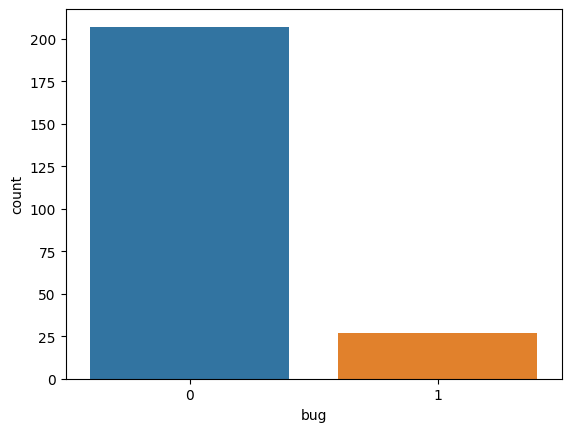

In [202]:
sns.countplot(x='bug', data=df_8)

In [203]:
cat_cols=[]
for i in df_8.columns :
    if df_8[i].dtypes=='O':
        cat_cols.append(i)
        
cat_cols.append('bug')
cat_cols

['name', 'name.1', 'bug']

In [204]:
x = df_8.drop(columns=cat_cols)
y= df_8['bug']

In [205]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
x_train.shape, y_train.shape

((187, 21), (187,))

In [206]:
x_train_arr = np.array(x_train)
y_train_arr = np.array(y_train)

In [207]:
conf_matrix_arc_rf=[]
prec_arc_rf=[]
acc_arc_rf=[]
rec_arc_rf=[]
f1_arc_rf=[]
auc_arc_rf=[]
TP_arc_rf=[]
TN_arc_rf=[]
FP_arc_rf=[]
FN_arc_rf=[]

In [208]:
for i in variants:
    x_samp, y_samp = i.sample(x_train_arr, y_train_arr)
    rf.fit(x_samp, y_samp)
    y_pred= rf.predict(x_test)
    conf = confusion_matrix(y_test, y_pred)
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred)
    conf_matrix_arc_rf.append(conf)
    acc_arc_rf.append(acc)
    prec_arc_rf.append(prec)
    rec_arc_rf.append(rec)
    f1_arc_rf.append(f1)
    auc_arc_rf.append(auc)

for i in range(len(conf_matrix_arc_rf)):
    TN_arc_rf.append(conf_matrix_arc_rf[i][0][0])
    FP_arc_rf.append(conf_matrix_arc_rf[i][0][1])
    FN_arc_rf.append(conf_matrix_arc_rf[i][1][0])
    TP_arc_rf.append(conf_matrix_arc_rf[i][1][1])

2023-06-30 13:00:10,917:INFO:NoSMOTE: Running sampling via ('NoSMOTE', "{'raise_value_error': False, 'raise_runtime_error': False, 'random_state': None, 'class_name': 'NoSMOTE'}")
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-30 13:00:11,038:INFO:SMOTE_TomekLinks: Running sampling via ('SMOTE_TomekLinks', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state': None, 'class_name': 'SMOTE_TomekLinks'}")
2023-06-30 13:00:11,039:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, '

2023-06-30 13:00:12,248:INFO:distance_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-30 13:00:12,407:INFO:SMMO: Running sampling via ('SMMO', "{'proportion': 1.0, 'n_neighbors': 5, 'ensemble': [('sklearn.discriminant_analysis', 'QuadraticDiscriminantAnalysis', {}), ('sklearn.tree', 'DecisionTreeClassifier', {'random_state': 2}), ('sklearn.naive_bayes', 'GaussianNB', {})], 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMMO'}")
2023-06-30 13:00:12,416:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:00:12,416:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:00:12,441:INFO:SMMO: simple

2023-06-30 13:00:14,169:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.5, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:00:14,171:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:00:14,172:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:00:14,193:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:14,198:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:00:14,201:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-30 13:00:14,363:INFO:SVM_b

2023-06-30 13:00:15,486:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:15,497:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:15,510:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:15,522:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:15,534:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:15,546:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:15,558:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:15,570:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:15,582:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:15,592:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:15,604:INFO:NearestNeig

2023-06-30 13:00:16,519:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:16,532:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:16,543:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:16,556:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:16,566:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:16,579:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:16,590:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:16,602:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:16,614:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:16,628:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:16,640:INFO:NearestNeig

2023-06-30 13:00:17,534:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:17,543:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:17,553:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:17,566:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:00:17,568:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:00:17,579:INFO:NRSBoundary_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-30 13:00:17,682:INFO:LVQ_SMOTE: Running sampling via ('LVQ_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_clusters': 10, 'n_jobs': 1, 'random_state': None, 'class_name': 'LVQ_SMOTE'}")
2023-06-30 13:00:17,777:INFO:Ne

C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-30 13:00:18,912:INFO:PDFOS: Running sampling via ('PDFOS', "{'proportion': 1.0, 'n_jobs': 1, 'random_state': None, 'class_name': 'PDFOS'}")
2023-06-30 13:00:18,916:INFO:MetricTensor: executing metric learning with cov_min
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-30 13:00:18,997:INFO:IPADE_ID: Running sampling via ('IPADE_ID', "{'F': 0.1, 'G': 0.1, 'OT': 20, 'max_it': 40, 'n_jobs': 1, 'dt_classifier': ('sklearn.tree', 'DecisionTreeClassifier', {'random_state': 2}), 'base_classifier': ('sklearn.tree', 'DecisionTreeClassifier', {'random_state': 2}), 'random_state': None, 'class_name': 'IPADE_ID'}")
2023-06-30 13:

2023-06-30 13:00:31,947:INFO:ADG: Starting iteration with q=143
2023-06-30 13:00:32,754:WARNING:ADG: reducing dimensionality to 5
2023-06-30 13:00:32,756:INFO:ADG: Running sampling via ('ADG', "{'proportion': 1.0, 'kernel': 'inner', 'lam': 1.0, 'mu': 1.0, 'k': 12, 'gamma': 1.0, 'n_jobs': 1, 'random_state': None, 'class_name': 'ADG'}")
2023-06-30 13:00:32,793:INFO:ADG: Starting iteration with q=143
2023-06-30 13:00:33,673:WARNING:ADG: reducing dimensionality to 2
2023-06-30 13:00:33,675:INFO:ADG: Running sampling via ('ADG', "{'proportion': 1.0, 'kernel': 'inner', 'lam': 1.0, 'mu': 1.0, 'k': 12, 'gamma': 1.0, 'n_jobs': 1, 'random_state': None, 'class_name': 'ADG'}")
2023-06-30 13:00:33,710:INFO:ADG: Starting iteration with q=143
2023-06-30 13:00:34,477:WARNING:ADG: reducing dimensionality to 1
2023-06-30 13:00:34,479:INFO:ADG: Running sampling via ('ADG', "{'proportion': 1.0, 'kernel': 'inner', 'lam': 1.0, 'mu': 1.0, 'k': 12, 'gamma': 1.0, 'n_jobs': 1, 'random_state': None, 'class_name'

2023-06-30 13:00:36,454:INFO:SMOTE_PSO: Running sampling via ('SMOTE_PSO', "{'k': 3, 'nn_params': {}, 'eps': 0.01, 'n_pop': 10, 'w': 1.0, 'c1': 2.0, 'c2': 2.0, 'num_it': 15, 'n_jobs': 1, 'random_state': None, 'class_name': 'SMOTE_PSO'}")
2023-06-30 13:00:36,466:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:00:36,467:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:00:36,481:INFO:SMOTE_PSO: Iteration 0
2023-06-30 13:00:36,682:INFO:SMOTE_PSO: Iteration 1
2023-06-30 13:00:36,860:INFO:SMOTE_PSO: Iteration 2
2023-06-30 13:00:37,047:INFO:SMOTE_PSO: Iteration 3
2023-06-30 13:00:37,218:INFO:SMOTE_PSO: Iteration 4
2023-06-30 13:00:37,379:INFO:SMOTE_PSO: Iteration 5
2023-06-30 13:00:37,542:INFO:SMOTE_PSO: Iteration 6
2023-06-30 13:00:37,704:INFO:SMOTE_PSO: Iteration 7
2023-06-30 13:00:37,879:INFO:SMOTE_PSO: Iteration 8
2023-06-30 13:00:38,055:INFO:SMOTE_PSO: Iteration 9
2023-06-30 13:00:38,221:INFO:SMOTE_PSO: Iteration 10
202

2023-06-30 13:00:47,694:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:00:47,695:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:47,702:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:47,709:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:47,716:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:47,724:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:47,732:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:47,738:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:47,746:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:47,754:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:00:47,761:INFO:NearestNeig

2023-06-30 13:00:51,861:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:00:51,864:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:00:51,874:INFO:NT_SMOTE: simplex sampling with n_dim 3
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-30 13:00:51,944:INFO:Lee: Running sampling via ('Lee', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'rejection_level': 0.5, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'Lee'}")
2023-06-30 13:00:51,945:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:00:51,946:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:00:51,947:INFO

2023-06-30 13:00:52,477:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:00:52,478:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:00:52,492:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:52,511:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5859503342725356, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:00:52,512:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:00:52,513:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:00:52,528:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:52,546:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 

2023-06-30 13:00:52,950:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:00:52,964:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 13:00:52,975:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:00:52,976:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:00:52,977:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:00:52,992:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:53,016:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.988930053068842, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gau

2023-06-30 13:00:53,452:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:53,476:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:00:53,476:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:00:53,478:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:00:53,494:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:53,520:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:00:53,521:INFO:Neare

2023-06-30 13:00:53,989:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:00:53,990:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:00:54,005:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 13:00:54,013:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:00:54,013:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:00:54,014:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:00:54,028:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 13:00:54,038:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'

2023-06-30 13:00:54,468:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:00:54,481:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:54,489:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:00:54,490:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:00:54,490:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:00:54,507:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:54,532:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7398671873879952, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'ga

2023-06-30 13:00:54,997:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:55,021:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:00:55,023:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:00:55,024:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:00:55,038:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 13:00:55,047:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.5195242441339716, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:00:55

2023-06-30 13:00:55,527:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:00:55,528:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:00:55,529:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:00:55,544:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:55,567:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.13718187166926138, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:00:55,568:INFO:NearestNeighborsWithMetricTensor: NN fitting with metri

2023-06-30 13:00:56,273:INFO:GASMOTE: Running sampling via ('GASMOTE', "{'n_neighbors': 5, 'nn_params': {}, 'maxn': 7, 'n_pop': 10, 'popl3': 5, 'pm': 0.3, 'pr': 0.2, 'Ge': 10, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'GASMOTE'}")
2023-06-30 13:00:56,273:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:00:56,274:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:00:56,285:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,287:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,288:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,289:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,290:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,293:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,295:INFO:GASMOTE: simplex sa

2023-06-30 13:00:56,517:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,519:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,520:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,522:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,525:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,526:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,528:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,529:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,530:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,533:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,534:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,536:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,538:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,540:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,541:INFO:GASMOTE: simplex sa

2023-06-30 13:00:56,776:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,777:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,778:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,781:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,783:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,784:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,787:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,790:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,791:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,792:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,793:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,796:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,797:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,799:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:56,807:INFO:GASMOTE: simplex sa

2023-06-30 13:00:57,034:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,035:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,045:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,047:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,048:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,051:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,053:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,054:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,056:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,057:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,058:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,061:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,062:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,065:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,066:INFO:GASMOTE: simplex sa

2023-06-30 13:00:57,297:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,299:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,301:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,302:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,304:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,305:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,307:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,309:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,311:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,322:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,323:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,325:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,326:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,328:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,329:INFO:GASMOTE: simplex sa

2023-06-30 13:00:57,549:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,551:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,553:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,563:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,565:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,566:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,568:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,570:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,571:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,573:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,575:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,576:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,578:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,579:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,581:INFO:GASMOTE: simplex sa

2023-06-30 13:00:57,807:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,808:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,811:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,812:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,814:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,816:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,818:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,820:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,828:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,829:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,830:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,832:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,835:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,836:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:57,838:INFO:GASMOTE: simplex sa

2023-06-30 13:00:58,063:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,072:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,074:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,076:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,077:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,079:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,081:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,082:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,084:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,086:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,087:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,090:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,091:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,093:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,094:INFO:GASMOTE: simplex sa

2023-06-30 13:00:58,341:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,343:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,345:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,346:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,348:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,349:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,352:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,353:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,354:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,357:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,358:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,360:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,361:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,362:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,365:INFO:GASMOTE: simplex sa

2023-06-30 13:00:58,592:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,593:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,595:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,596:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,597:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,607:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,608:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,609:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,611:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,612:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,615:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,615:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,617:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,619:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,622:INFO:GASMOTE: simplex sa

2023-06-30 13:00:58,845:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,847:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,849:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,850:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,852:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,853:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,855:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,857:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,865:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,866:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,868:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,871:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,872:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,873:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:58,875:INFO:GASMOTE: simplex sa

2023-06-30 13:00:59,105:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,107:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,109:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,117:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,119:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,121:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,122:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,124:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,126:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,127:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,128:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,131:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,132:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,133:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,136:INFO:GASMOTE: simplex sa

2023-06-30 13:00:59,371:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,373:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,375:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,377:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,378:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,379:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,382:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,384:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,386:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,387:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,388:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,390:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,391:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,393:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,395:INFO:GASMOTE: simplex sa

2023-06-30 13:00:59,619:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,621:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,630:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,631:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,632:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,634:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,636:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,638:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,640:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,641:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,643:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,644:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,647:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,649:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,651:INFO:GASMOTE: simplex sa

2023-06-30 13:00:59,874:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,875:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,877:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,879:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,880:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,881:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,884:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,885:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,887:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,889:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,891:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,893:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,894:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,895:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:00:59,904:INFO:GASMOTE: simplex sa

2023-06-30 13:01:00,145:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,148:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,150:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,152:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,154:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,156:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,158:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,159:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,161:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,162:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,164:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,166:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,168:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,177:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,178:INFO:GASMOTE: simplex sa

2023-06-30 13:01:00,402:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,405:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,407:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,408:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,410:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,411:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,420:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,421:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,424:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,426:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,427:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,429:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,430:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,432:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,434:INFO:GASMOTE: simplex sa

2023-06-30 13:01:00,678:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,680:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,683:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,684:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,685:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,687:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,689:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,690:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,692:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,695:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,696:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,698:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,711:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,712:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,714:INFO:GASMOTE: simplex sa

2023-06-30 13:01:00,939:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,940:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,943:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,945:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,946:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,956:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,958:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,960:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,961:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,963:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,964:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,967:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,969:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,970:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:00,972:INFO:GASMOTE: simplex sa

2023-06-30 13:01:01,209:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,212:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,213:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,215:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,216:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,217:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,218:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,228:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,230:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,232:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,233:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,235:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,238:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,239:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,241:INFO:GASMOTE: simplex sa

2023-06-30 13:01:01,467:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,468:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,470:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,471:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,473:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,474:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,476:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,478:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,480:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,482:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,483:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,485:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,489:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,490:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,492:INFO:GASMOTE: simplex sa

2023-06-30 13:01:01,735:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,737:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,738:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,739:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,747:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,749:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,751:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,752:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,755:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,757:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,759:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,760:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,762:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,765:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:01,767:INFO:GASMOTE: simplex sa

2023-06-30 13:01:02,011:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,013:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,015:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,017:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,018:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,020:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,021:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,023:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,025:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,027:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,030:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,031:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,033:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,034:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,036:INFO:GASMOTE: simplex sa

2023-06-30 13:01:02,268:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,270:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,272:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,274:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,275:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,276:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,278:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,281:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,283:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,285:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,293:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,294:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,295:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,299:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,300:INFO:GASMOTE: simplex sa

2023-06-30 13:01:02,715:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:02,716:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:02,731:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,733:INFO:SMOTE_FRST_2T: minority added: 24, majority removed: 0
2023-06-30 13:01:02,734:INFO:SMOTE_FRST_2T: iteration: 3
2023-06-30 13:01:02,734:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.2, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:02,735:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:02,736:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:02,750:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:02,753:INFO:SMOTE_FRST_2T: minority

2023-06-30 13:01:03,234:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:03,234:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:03,247:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:03,258:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9562262711983612, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:03,258:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:03,259:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:03,272:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:03,283:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0402027056968783, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None

2023-06-30 13:01:03,639:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:03,640:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:03,656:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:03,671:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4808507364996215, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:03,672:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:03,673:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:03,689:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:03,706:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.481581275526888, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 13:01:04,153:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:04,154:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:04,171:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:04,190:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0737546256245816, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:04,191:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:04,192:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:04,209:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:04,232:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.263220228441656, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 13:01:04,749:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:04,750:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:04,764:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:04,798:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.606702986568755, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:04,799:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:04,800:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:04,814:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:04,841:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.001637937579967, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-30 13:01:05,787:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:05,788:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:05,802:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:05,815:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.086902433318986, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:05,816:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:05,817:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:05,828:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:05,841:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9240557099662955, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None},

2023-06-30 13:01:06,171:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:06,172:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:06,186:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:06,202:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7414789598305902, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:06,203:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:06,204:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:06,223:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:06,240:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6956688065813614, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 13:01:06,659:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:06,661:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:06,676:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:06,694:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.983122924526138, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:06,695:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:06,696:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:06,711:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:06,733:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6266265385343943, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 13:01:07,252:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:07,253:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:07,270:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:07,295:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.799416680229491, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:07,296:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:07,297:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:07,312:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:07,341:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7735200721471283, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 13:01:07,986:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:07,987:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:08,001:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:08,045:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.6650215098657735, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:08,046:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:08,047:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:08,063:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:08,100:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.7784073563009533, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 13:01:08,563:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:08,564:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:08,579:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:08,595:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9112829623767459, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:08,596:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:08,596:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:08,613:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:08,627:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0432944749930642, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 13:01:09,011:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:09,011:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:09,028:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:09,044:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9192676899573886, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:09,045:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:09,046:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:09,061:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:09,080:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3511331252500585, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 13:01:09,519:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:09,520:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:09,534:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:09,558:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6933200416140237, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:09,559:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:09,559:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:09,574:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:09,594:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6266053950883648, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 13:01:10,116:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:10,116:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:10,130:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:10,162:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.047949744859999, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:10,163:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:10,164:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:10,178:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:10,211:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.25009824186786, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None},

2023-06-30 13:01:10,740:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:10,741:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:10,756:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:10,770:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3341720347915171, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:10,771:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:10,772:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:10,786:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:10,802:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.022481594997584, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None},

2023-06-30 13:01:11,196:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:11,197:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:11,212:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:11,229:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7751270905525607, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:11,230:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:11,231:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:11,249:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:11,268:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9995217727280374, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 13:01:11,726:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:11,726:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:11,741:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:11,761:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.19326751856464, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:11,762:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:11,763:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:11,777:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:11,800:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.427825483149511, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None},

2023-06-30 13:01:12,343:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:12,344:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:12,359:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:12,385:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3340588559954947, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:12,386:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:12,387:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:12,402:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:12,426:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.782504721377504, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 13:01:13,051:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:13,052:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:13,067:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:13,078:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0256990089902918, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:13,079:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:13,080:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:13,097:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:13,109:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7386493736079208, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None

2023-06-30 13:01:13,488:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:13,490:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:13,509:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:13,528:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3523957885482787, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:13,529:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:13,531:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:13,545:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:13,562:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.653038773208437, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 13:01:14,010:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:14,011:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:14,026:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:14,051:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6084932583597205, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:14,053:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:14,053:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:14,068:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:14,096:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8934711006430502, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 13:01:14,617:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:14,618:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:14,634:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:14,659:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.0425936837641143, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:14,660:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:14,661:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:14,675:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:14,708:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.5753342574577682, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 13:01:15,323:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:15,324:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:15,347:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:15,386:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.2175637702866866, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:15,387:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:15,388:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:15,404:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:15,484:INFO:AMSCO: fitness scores: 0.768448 0.759036 0.768448 0.759036
2023-06-30 13:01:15,485:INFO:AMSCO starting iteration 5
2023-06-30 1

2023-06-30 13:01:15,848:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:15,849:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:15,863:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:15,877:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.471967470354389, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:15,879:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:15,880:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:15,894:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:15,911:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0422219478195547, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None},

2023-06-30 13:01:16,316:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:16,317:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:16,332:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:16,356:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6453908513460513, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:16,357:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:16,357:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:16,374:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:16,392:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.054577838081775, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-30 13:01:16,860:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:16,861:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:16,876:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:16,896:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6739981002817896, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:16,897:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:16,898:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:16,914:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:16,943:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.114622657919717, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 13:01:17,471:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:17,472:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:17,487:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:17,511:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7317582500854782, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:17,512:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:17,513:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:17,529:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:17,557:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.262840062071032, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 13:01:18,539:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:18,540:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:18,553:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:18,566:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0206119607640929, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:18,567:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:18,568:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:18,579:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:18,590:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.08852745888885, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-30 13:01:18,969:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:18,970:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:18,986:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:19,009:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7718192478824528, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:19,010:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:19,010:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:19,024:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:19,045:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6512007767025112, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 13:01:19,489:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:19,489:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:19,502:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:19,531:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.792775075556598, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:19,532:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:19,533:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:19,547:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:19,575:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.640871808915456, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-30 13:01:20,118:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:20,119:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:20,134:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:20,165:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.6409096249411106, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:20,166:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:20,167:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:20,182:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:20,220:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.5424916539779456, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 13:01:21,277:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:21,278:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:21,290:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:21,299:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8305043328859492, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:21,301:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:21,302:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:21,313:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:21,324:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0386345027862234, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 13:01:21,653:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:21,654:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:21,667:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:21,681:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.220240859045549, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:21,683:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:21,683:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:21,697:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:21,712:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.30689072664735, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 

2023-06-30 13:01:22,120:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:22,120:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:22,134:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:22,155:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7114077951739382, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:22,156:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:22,156:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:22,171:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:22,192:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9075931023140702, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 13:01:22,657:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:22,658:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:22,670:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:22,696:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.524582396078362, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:22,697:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:22,698:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:22,712:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:22,737:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3197845020670624, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 13:01:23,904:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:23,905:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:23,917:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:23,930:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1160168231179803, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:23,931:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:23,932:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:23,945:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:23,959:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.991564216199977, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None},

2023-06-30 13:01:24,309:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:24,310:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:24,324:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:24,339:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2174839540781912, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:24,340:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:24,340:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:24,354:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:24,371:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7356907745011507, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 13:01:24,824:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:24,825:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:24,838:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:24,861:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6996223529741945, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:24,862:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:24,863:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:24,876:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:24,897:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.962302500653986, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 13:01:25,455:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:25,456:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:25,471:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:25,511:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.9132541784249932, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:25,513:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:25,513:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:25,527:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:25,561:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7485684389544427, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 13:01:26,294:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:26,295:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:26,309:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:26,364:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:26,365:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:26,365:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:26,380:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:26,429:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.9389788095463296, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1

2023-06-30 13:01:27,417:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:27,418:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:27,431:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:27,442:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9087238017613953, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:27,443:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:27,443:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:27,457:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:27,471:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3370625465975954, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 13:01:27,889:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:27,889:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:27,903:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:27,924:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5657420925752445, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:27,925:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:27,926:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:27,939:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:27,958:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5266684035701126, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 13:01:28,469:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:28,470:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:28,487:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:28,521:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.362572335700504, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:28,522:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:28,523:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:28,537:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:28,566:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3629697629375412, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 13:01:29,178:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:29,179:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:29,199:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:29,240:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.5203797190008097, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:29,241:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:29,241:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:29,257:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:29,301:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.3735626078009373, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 13:01:29,951:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:29,952:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:29,964:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:29,978:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3309006120943476, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:29,988:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:29,991:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:30,009:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:30,023:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0658313933220542, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None

2023-06-30 13:01:30,385:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:30,386:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:30,400:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:30,420:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6825010441616453, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:30,421:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:30,422:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:30,435:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:30,457:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.059964807303931, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-30 13:01:30,919:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:30,919:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:30,935:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:30,958:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7959378705981703, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:30,959:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:30,960:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:30,976:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:31,007:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.642896499998458, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 13:01:31,595:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:31,596:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:31,612:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:31,645:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.091497133531792, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:31,646:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:31,647:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:31,661:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:31,698:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.908721922828743, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-30 13:01:32,428:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:32,429:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:32,444:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:32,457:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7129960472161435, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:32,458:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:32,459:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:32,475:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:32,488:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7720139170235893, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}

2023-06-30 13:01:32,882:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:32,883:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:32,900:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:32,919:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6853531393973247, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:32,920:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:32,921:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:32,937:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:32,953:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3124235607235877, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 13:01:33,410:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:33,411:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:33,425:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:33,455:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4982095394248502, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:33,457:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:33,457:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:33,473:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:33,501:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.467243860981017, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 13:01:34,082:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:34,083:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:34,099:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:34,133:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:34,134:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:34,134:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:34,159:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:34,206:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.7864894335525676, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1

2023-06-30 13:01:34,917:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:34,931:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:34,976:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 13:01:34,978:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:34,978:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:34,992:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:35,141:INFO:AMSCO: fitness scores: 0.757948 0.760821 0.757948 0.760821
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without featur

2023-06-30 13:01:45,163:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:45,164:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:45,176:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 13:01:47,092:INFO:DSRBF: Iteration 25/40, loss: 0.820270, data size: 330
2023-06-30 13:01:47,240:INFO:DSRBF: Iteration 26/40, loss: 0.820270, data size: 330
2023-06-30 13:01:47,298:INFO:DSRBF: Iteration 27/40, loss: 0.820270, data size: 330
2023-06-30 13:01:47,356:INFO:DSRBF: Iteration 28/40, loss: 0.820270, data size: 330
2023-06-30 13:01:47,414:INFO:DSRBF: Iteration 29/40, loss: 0.820270, data size: 330
2023-06-30 13:01:47,474:INFO:DSRBF: Iteration 30/40, loss: 0.818883, data size: 330
2023-06-30 13:01:47,533:INFO:DSRBF: Iteration 31/40, loss: 0.818883, data size: 330
2023-06-30 13:01:47,591:INFO:DSRBF: Iteration 32/40, loss: 0.818883, data size: 330
2023-06-30 13:01:47,650:INFO:SMOTE: Running sampling via ('SMOTE', "{'propor

C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
2023-06-30 13:01:50,846:INFO:ANS: Running sampling via ('ANS', "{'proportion': 1.0, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'ANS'}")
2023-06-30 13:01:50,849:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:50,850:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 13:01:50,864:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 13:01:50,866:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:01:50,874:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 13:01:50,881:INFO:NearestNeighbo

In [210]:
conf_matrix_arc_rf

[array([[39,  3],
        [ 3,  2]], dtype=int64),
 array([[35,  7],
        [ 1,  4]], dtype=int64),
 array([[39,  3],
        [ 3,  2]], dtype=int64),
 array([[40,  2],
        [ 2,  3]], dtype=int64),
 array([[40,  2],
        [ 1,  4]], dtype=int64),
 array([[35,  7],
        [ 1,  4]], dtype=int64),
 array([[42,  0],
        [ 5,  0]], dtype=int64),
 array([[39,  3],
        [ 3,  2]], dtype=int64),
 array([[42,  0],
        [ 3,  2]], dtype=int64),
 array([[42,  0],
        [ 5,  0]], dtype=int64),
 array([[38,  4],
        [ 2,  3]], dtype=int64),
 array([[38,  4],
        [ 2,  3]], dtype=int64),
 array([[39,  3],
        [ 2,  3]], dtype=int64),
 array([[39,  3],
        [ 4,  1]], dtype=int64),
 array([[39,  3],
        [ 2,  3]], dtype=int64),
 array([[37,  5],
        [ 2,  3]], dtype=int64),
 array([[39,  3],
        [ 4,  1]], dtype=int64),
 array([[38,  4],
        [ 2,  3]], dtype=int64),
 array([[39,  3],
        [ 3,  2]], dtype=int64),
 array([[39,  3],
        [ 3, 

In [211]:
np.array(y_test)

array([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0], dtype=int64)

In [212]:
arc_rf = pd.DataFrame({'variants':var_names, 'TP':TP_arc_rf, 'TN':TN_arc_rf, 'FP':FP_arc_rf, 'FN':FN_arc_rf, 'Accuracy':acc_arc_rf, 'Precision':prec_arc_rf, 'Recall':rec_arc_rf, 'F1':f1_arc_rf, 'AUC':auc_arc_rf})

In [213]:
arc_rf_results = arc_rf.to_csv('arc_rf_results.csv')

In [214]:
conf_matrix_arc_knn=[]
prec_arc_knn=[]
acc_arc_knn=[]
rec_arc_knn=[]
f1_arc_knn=[]
auc_arc_knn=[]
TP_arc_knn=[]
TN_arc_knn=[]
FP_arc_knn=[]
FN_arc_knn=[]

In [215]:
for i in variants:
    x_samp, y_samp = i.sample(x_train_arr, y_train_arr)
    knn.fit(x_samp, y_samp)
    y_pred= knn.predict(x_test)
    conf = confusion_matrix(y_test, y_pred)
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred)
    conf_matrix_arc_knn.append(conf)
    acc_arc_knn.append(acc)
    prec_arc_knn.append(prec)
    rec_arc_knn.append(rec)
    f1_arc_knn.append(f1)
    auc_arc_knn.append(auc)

for i in range(len(conf_matrix_arc_knn)):
    TN_arc_knn.append(conf_matrix_arc_knn[i][0][0])
    FP_arc_knn.append(conf_matrix_arc_knn[i][0][1])
    FN_arc_knn.append(conf_matrix_arc_knn[i][1][0])
    TP_arc_knn.append(conf_matrix_arc_knn[i][1][1])

2023-06-30 17:29:39,584:INFO:NoSMOTE: Running sampling via ('NoSMOTE', "{'raise_value_error': False, 'raise_runtime_error': False, 'random_state': None, 'class_name': 'NoSMOTE'}")
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-06-30 17:29:39,639:INFO:SMOTE_TomekLinks: Running sampling via ('SMOTE_TomekLinks', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state':

2023-06-30 17:29:40,104:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:29:40,104:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:29:40,118:INFO:distance_SMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-30 17:29:40,145:INFO:SMMO: Running sampling via ('SMMO', "{'proportion': 1.0, 'n_neighbors': 5, 'ensemble': [('sklearn.discriminant_analysis', 'QuadraticDiscriminantAnalysis', {}), ('sklearn.tree', 'DecisionTreeClassifier', {'random_state': 2}), ('sklearn.naive_bayes', 'GaussianNB', {})], 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMMO'}")
2023-06-30 17:29:40,154:INFO:NearestNeighbo

2023-06-30 17:29:40,744:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-30 17:29:40,805:INFO:MSYN: Running sampling via ('MSYN', "{'pressure': 1.5, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state': None, 'class_name': 'MSYN', 'proportion': 1.5}")
2023-06-30 17:29:40,807:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.5, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:29:40,808:INFO:NearestNeighborsWithMetricTensor: NN

2023-06-30 17:29:41,426:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:41,435:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:41,444:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:41,454:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:41,463:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:41,472:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:41,482:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:41,492:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:41,499:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:41,509:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:41,518:INFO:NearestNeig

2023-06-30 17:29:42,238:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:42,248:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:42,255:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:42,265:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:42,275:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:42,285:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:42,295:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:42,304:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:42,313:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:42,324:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:42,333:INFO:NearestNeig

2023-06-30 17:29:43,060:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:43,069:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:43,078:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:43,086:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:43,095:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:43,104:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:43,114:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:43,123:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:43,131:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:43,141:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:29:43,151:INFO:NearestNeig

2023-06-30 17:29:43,861:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:29:43,862:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:29:43,877:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:29:43,879:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:29:43,892:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:29:43,893:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:29:43,907:INFO:MWMOTE: computing closeness factors
2023-06-30 17:29:43,918:INFO:MWMOTE: computing information weights
2023-06-30 17:29:43,920:INFO:MWMOTE: do clustering
2023-06-30 17:29:44,009:INFO:MWMOTE: The simplex order was updated from 2 to 1
2023-06-30 17:29:44,010:INFO:MWMOTE: simplex sampling with n_dim 1
2023-06-30 17:29:44,011:INFO:MWMOTE: simplex sampling with n_dim 2
2023-06-30 17:29:44,014:INFO:MWMOTE: The simpl

2023-06-30 17:29:53,971:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:29:53,973:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:29:53,985:INFO:MCT: simplex sampling with n_dim 1
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-30 17:29:54,009:INFO:ADG: Running sampling via ('ADG', "{'proportion': 1.0, 'kernel': 'inner', 'lam': 1.0, 'mu': 1.0, 'k': 12, 'gamma': 1.0, 'n_jobs': 1, 'random_state': None, 'class_name': 'ADG'}")
2023-06-30 17:29:54,042:INFO:ADG: Starting iteration with q=143
2023-06-30 17:29:54,835:WARNING:ADG: reducing dimensionality to 10
2023-06-30 17:29:54,837:INFO:ADG: Running sampling via ('ADG', "{'proportion': 1.0, 'kernel': 'inner', 'lam': 1.0, 'mu': 1.0, 'k': 12, 'gamma': 1.0, 'n_jobs': 1, 'random_state': None, 'class_name': 'ADG'}")
202

C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
2023-06-30 17:29:58,818:INFO:OUPS: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-30 17:29:58,837:INFO:SMOTE_D: Running sampling via ('SMOTE_D', "{'proportion': 1.0, 'k': 3, 'nn_params': {}, 'n_jobs': 1, 'random_state': None, 'class_name': 'SMOTE_D'}")
2023-06-30 

2023-06-30 17:30:07,978:INFO:CBSO: simplex sampling with n_dim 1
2023-06-30 17:30:07,979:INFO:CBSO: The simplex order was updated from 2 to 1
2023-06-30 17:30:07,980:INFO:CBSO: simplex sampling with n_dim 1
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-30 17:30:07,999:INFO:DBSMOTE: Running sampling via ('DBSMOTE', "{'proportion': 1.0, 'eps': 0.8, 'min_samples': 3, 'db_iter_limit': 3, 'nn_params': {}, 'n_jobs': 1, 'random_state': None, 'class_name': 'DBSMOTE'}")
2023-06-30 17:30:08,013:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:08,014:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:08,029:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: U

2023-06-30 17:30:08,614:INFO:DSMOTE: Running sampling via ('DSMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'rate': 0.1, 'n_step': 50, 'n_jobs': 1, 'random_state': None, 'class_name': 'DSMOTE'}")
2023-06-30 17:30:08,616:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:08,619:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
2023-06-30 17:30:11,522:INFO:G_SMOTE: Running sampling via ('G_SMOTE', "{'pr

2023-06-30 17:30:11,900:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:11,915:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 17:30:11,927:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:11,928:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:11,929:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:11,946:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:11,972:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4098159061896418, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'ga

2023-06-30 17:30:12,421:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:12,449:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8840057946645377, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:12,451:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:12,451:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:12,465:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:12,489:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9050202849956711, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023

2023-06-30 17:30:12,931:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:12,932:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:12,933:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:12,947:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 17:30:12,956:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:12,957:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023

2023-06-30 17:30:13,424:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:13,425:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:13,439:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:13,468:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9954374392015268, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:13,469:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:13,470:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:13,484:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:13,509:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8931928245058924, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}

2023-06-30 17:30:13,955:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:13,972:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:13,983:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.965516588762743, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:13,984:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:13,985:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:14,000:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 17:30:14,012:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gau

2023-06-30 17:30:14,472:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:14,502:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:14,503:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:14,503:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:14,519:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:14,545:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:14,546:INFO:Neare

2023-06-30 17:30:15,051:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:15,052:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:15,067:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 17:30:15,077:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:15,078:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:15,079:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:15,094:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:15,103:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'

2023-06-30 17:30:15,531:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:15,546:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:15,573:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:15,575:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:15,575:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:15,591:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:15,617:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.372346307565149, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gau

2023-06-30 17:30:16,074:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:16,101:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.855336298075018, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:16,102:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:16,103:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:16,119:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:16,145:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:16,

2023-06-30 17:30:16,587:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:16,588:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:16,589:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:16,605:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 17:30:16,614:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:16,615:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023

2023-06-30 17:30:17,105:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:17,105:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:17,121:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:17,147:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:17,149:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:17,149:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:17,164:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:17,190:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8738809837411947, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 

2023-06-30 17:30:17,637:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:17,654:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:17,664:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:17,666:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:17,667:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:17,682:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 17:30:17,697:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_componen

2023-06-30 17:30:18,180:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3934737407519115, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:18,181:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:18,182:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:18,198:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:18,215:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:18,217:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric

2023-06-30 17:30:18,724:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:18,725:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:18,740:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 17:30:18,750:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:18,751:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:18,752:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:18,767:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:18,775:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9627580077535456, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 

2023-06-30 17:30:19,200:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:19,216:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:19,240:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:19,242:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:19,242:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:19,259:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:19,286:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_componen

2023-06-30 17:30:19,751:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:19,777:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8938889716811484, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:19,779:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:19,779:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:19,796:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:19,820:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:19

2023-06-30 17:30:20,278:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:20,279:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:20,280:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:20,296:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 17:30:20,304:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:20,305:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023

2023-06-30 17:30:20,802:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:20,803:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:20,820:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:20,848:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:20,849:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:20,849:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:20,866:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:20,895:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.889951458623061, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, '

2023-06-30 17:30:21,339:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:21,354:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:21,362:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:21,363:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:21,364:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:21,380:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 17:30:21,393:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_componen

2023-06-30 17:30:21,829:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:21,859:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.424608307743806, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:21,860:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:21,861:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:21,877:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:21,895:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:21,

2023-06-30 17:30:22,391:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9584444031977573, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:22,392:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:22,393:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:22,408:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 17:30:22,419:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:22,420:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric

2023-06-30 17:30:22,884:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:22,885:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:22,900:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:22,926:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:22,928:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:22,928:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:22,945:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:22,970:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3845881350075449, 'n_neighbors': 3, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 

2023-06-30 17:30:23,441:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:23,457:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:23,487:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9005773654395732, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:23,488:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:23,489:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:23,505:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:23,528:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9113573585927138, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling'

2023-06-30 17:30:24,017:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 17:30:24,032:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.5259445014743138, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:24,033:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:24,034:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:24,051:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 17:30:24,063:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:24

2023-06-30 17:30:24,681:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:24,683:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:24,683:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:24,699:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:24,727:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:24,728:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023

2023-06-30 17:30:25,246:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:25,247:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:25,263:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:25,271:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:25,273:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:25,274:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:25,290:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 17:30:25,301:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'

2023-06-30 17:30:25,769:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:25,785:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:25,815:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:25,822:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:25,833:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:25,849:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 17:30:25,863:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_componen

2023-06-30 17:30:26,373:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:26,398:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9226583458373985, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:26,400:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:26,401:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:26,417:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 17:30:26,429:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:26

2023-06-30 17:30:26,911:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:26,913:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:26,913:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:26,930:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:26,959:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:26,960:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023

2023-06-30 17:30:27,487:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:27,488:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:27,504:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:27,532:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.873062683802402, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:27,533:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:27,533:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:27,550:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:27,574:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, '

2023-06-30 17:30:28,037:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:28,056:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 17:30:28,071:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:28,072:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:28,073:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:28,090:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 17:30:28,100:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_componen

2023-06-30 17:30:28,632:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:28,651:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:28,653:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:28,654:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:28,670:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:28,701:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:28,702:INFO:Neare

2023-06-30 17:30:29,253:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:29,254:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:29,269:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:29,280:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:29,281:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:29,281:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:29,296:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 17:30:29,312:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'

2023-06-30 17:30:29,798:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:29,816:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:29,846:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4024119682500844, 'n_neighbors': 2, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:29,847:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:29,848:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:29,865:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:29,886:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'ga

2023-06-30 17:30:30,403:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:30,430:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9166444120610555, 'n_neighbors': 1, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 1, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:30,431:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:30,432:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:30,450:INFO:SMOTE: simplex sampling with n_dim 1
2023-06-30 17:30:30,461:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.1, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:30

2023-06-30 17:30:30,954:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:30,977:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:30,977:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:30,987:INFO:ISMOTE: simplex sampling with n_dim 2
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-06-30 17:30:31,014:INFO:VIS_RST: Running sampling via ('VIS_RST', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'VIS_RST'}")
2023-06-30 17:30:31,017:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:31,018:INFO:NearestNeighborsWithM

2023-06-30 17:30:31,302:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,311:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,312:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,313:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,315:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,317:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,319:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,320:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,322:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,324:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,326:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,327:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,329:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,331:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,333:INFO:GASMOTE: simplex sa

2023-06-30 17:30:31,575:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,576:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,578:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,579:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,583:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,584:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,585:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,587:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,588:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,598:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,600:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,602:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,603:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,605:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,606:INFO:GASMOTE: simplex sa

2023-06-30 17:30:31,845:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,847:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,848:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,851:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,852:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,853:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,855:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,858:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,859:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,861:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,863:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,865:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,867:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,868:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:31,877:INFO:GASMOTE: simplex sa

2023-06-30 17:30:32,110:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,112:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,113:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,115:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,116:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,118:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,120:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,121:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,124:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,126:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,128:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,137:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,138:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,141:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,143:INFO:GASMOTE: simplex sa

2023-06-30 17:30:32,388:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,389:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,392:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,394:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,396:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,397:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,400:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,401:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,403:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,405:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,406:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,408:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,410:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,411:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,412:INFO:GASMOTE: simplex sa

2023-06-30 17:30:32,652:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,654:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,656:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,658:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,659:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,661:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,663:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,665:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,666:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,668:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,670:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,671:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,673:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,676:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,678:INFO:GASMOTE: simplex sa

2023-06-30 17:30:32,924:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,926:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,928:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,929:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,930:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,933:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,935:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,936:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,937:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,939:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,941:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,942:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,944:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,945:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:32,947:INFO:GASMOTE: simplex sa

2023-06-30 17:30:33,187:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,189:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,190:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,191:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,200:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,201:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,203:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,205:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,207:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,210:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,211:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,213:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,215:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,217:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,218:INFO:GASMOTE: simplex sa

2023-06-30 17:30:33,451:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,455:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,455:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,459:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,460:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,461:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,464:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,465:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,467:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,468:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,469:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,479:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,481:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,483:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,484:INFO:GASMOTE: simplex sa

2023-06-30 17:30:33,750:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,751:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,760:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,761:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,763:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,764:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,765:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,767:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,768:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,770:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,772:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,773:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,777:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,779:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:33,779:INFO:GASMOTE: simplex sa

2023-06-30 17:30:34,013:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,015:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,016:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,019:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,020:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,022:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,023:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,025:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,027:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,029:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,031:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,032:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,033:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,034:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,036:INFO:GASMOTE: simplex sa

2023-06-30 17:30:34,273:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,277:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,279:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,287:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,289:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,290:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,293:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,294:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,296:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,298:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,300:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,301:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,303:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,304:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,307:INFO:GASMOTE: simplex sa

2023-06-30 17:30:34,545:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,547:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,549:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,550:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,553:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,555:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,556:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,558:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,560:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,562:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,563:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,565:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,567:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,569:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,571:INFO:GASMOTE: simplex sa

2023-06-30 17:30:34,816:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,818:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,819:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,821:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,823:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,835:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,837:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,838:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,840:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,842:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,845:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,847:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,849:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,850:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:34,852:INFO:GASMOTE: simplex sa

2023-06-30 17:30:35,073:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,075:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,084:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,084:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,087:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,089:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,090:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,091:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,093:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,095:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,096:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,098:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,100:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,101:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,103:INFO:GASMOTE: simplex sa

2023-06-30 17:30:35,353:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,356:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,357:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,359:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,361:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,363:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,364:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,365:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,367:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,370:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,371:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,372:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,381:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,382:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,385:INFO:GASMOTE: simplex sa

2023-06-30 17:30:35,611:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,612:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,614:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,615:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,617:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,618:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,619:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,621:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,624:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,625:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,634:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,636:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,637:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,639:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,640:INFO:GASMOTE: simplex sa

2023-06-30 17:30:35,886:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,888:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,890:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,892:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,894:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,895:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,897:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,899:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,900:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,901:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,903:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,904:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,905:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,907:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:35,909:INFO:GASMOTE: simplex sa

2023-06-30 17:30:36,148:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,150:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,152:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,153:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,155:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,156:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,158:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,160:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,163:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,165:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,166:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,168:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,169:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,180:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,182:INFO:GASMOTE: simplex sa

2023-06-30 17:30:36,410:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,412:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,415:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,424:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,427:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,429:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,430:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,433:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,434:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,436:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,438:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,440:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,442:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,445:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,447:INFO:GASMOTE: simplex sa

2023-06-30 17:30:36,676:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,684:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,686:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,688:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,689:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,691:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,692:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,694:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,696:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,697:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,699:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,700:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,702:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,704:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,705:INFO:GASMOTE: simplex sa

2023-06-30 17:30:36,938:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,939:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,940:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,941:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,943:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,945:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,947:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,956:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,958:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,960:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,963:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,964:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,966:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,968:INFO:GASMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:36,969:INFO:GASMOTE: simplex sa

2023-06-30 17:30:37,343:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:37,344:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:37,360:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:37,363:INFO:SMOTE_FRST_2T: minority added: 18, majority removed: 0
2023-06-30 17:30:37,364:INFO:SMOTE_FRST_2T: iteration: 5
2023-06-30 17:30:37,365:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.2, 'n_neighbors': 5, 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:37,366:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:37,367:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:37,385:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:37,388:INFO:SMOTE_FRST_2T: minority

2023-06-30 17:30:37,783:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3880818092874996, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:37,784:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:37,785:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:37,800:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:37,818:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3496606089633971, 'n_neighbors': 4, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:37,819:INFO:NearestNeighborsWithMetricTensor: NN fit

2023-06-30 17:30:38,321:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:38,347:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9064734317645011, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:38,348:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:38,348:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:38,366:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:38,393:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1161299131661586, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
20

2023-06-30 17:30:39,007:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:39,035:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7287223461196004, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:39,036:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:39,037:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:39,055:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:39,086:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.759779414280952, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
202

2023-06-30 17:30:39,885:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:39,936:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.0515481529506516, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:39,937:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:39,938:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:39,958:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:40,001:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:

2023-06-30 17:30:41,050:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:41,067:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:41,081:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.6228525064614143, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:41,082:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:41,084:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:41,099:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:41,114:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9879471204485709, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling'

2023-06-30 17:30:41,526:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:41,542:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:41,559:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0697245603694017, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:41,559:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:41,561:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:41,576:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:41,593:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0263486100372696, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_samplin

2023-06-30 17:30:42,068:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:42,085:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:42,110:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.617999815100898, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:42,112:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:42,113:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:42,129:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:42,152:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6397645306046136, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling

2023-06-30 17:30:42,694:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:42,711:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:42,744:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5354392044342107, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:42,745:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:42,748:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:42,766:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:42,797:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1707324298870088, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_samplin

2023-06-30 17:30:43,414:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:43,430:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:43,460:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.6060125727502, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:43,461:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:43,462:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:43,482:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:43,600:INFO:AMSCO: fitness scores: 0.756756 0.758509 0.756756 0.758509
2023-06-30 17:30:43,601:INFO:AMSCO starting iteration 2
2023-06-30 17:30:43,602:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.708622447707653, 'n_neighb

2023-06-30 17:30:44,016:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:44,017:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:44,034:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:44,047:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5588482240288866, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:44,048:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:44,049:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:44,064:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:44,084:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3325924285318262, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 17:30:44,554:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:44,555:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:44,571:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:44,596:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.608608512663853, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:44,598:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:44,599:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:44,616:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:44,638:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.269474237996911, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-30 17:30:45,182:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:45,183:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:45,200:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:45,226:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7589962159489367, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:45,227:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:45,228:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:45,247:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:45,282:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1765355713538135, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 17:30:45,904:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:45,904:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:45,923:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:45,965:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.9896673016715605, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:45,966:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:45,967:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:45,984:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:46,019:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.3887675586395933, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 17:30:46,589:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:46,590:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:46,607:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:46,623:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9564502761607339, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:46,624:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:46,625:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:46,642:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:46,656:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1364026945105121, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}

2023-06-30 17:30:47,092:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:47,093:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:47,108:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:47,126:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8348231565609416, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:47,127:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:47,129:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:47,145:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:47,169:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.535358184616852, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 17:30:47,686:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:47,687:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:47,703:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:47,730:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.9648214269173283, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:47,732:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:47,733:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:47,749:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:47,772:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4398146025815057, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 17:30:48,366:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:48,368:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:48,385:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:48,420:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6711558000024227, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:48,421:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:48,422:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:48,437:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:48,472:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.584816562225488, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 17:30:49,178:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:49,179:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:49,197:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:49,213:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9037250918087316, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:49,215:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:49,216:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:49,233:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:49,248:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0803854024215034, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None

2023-06-30 17:30:49,710:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:49,711:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:49,728:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:49,746:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6665672916166852, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:49,748:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:49,748:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:49,770:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:49,791:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.487277848377669, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-30 17:30:50,347:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:50,348:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:50,368:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:50,393:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7288670390630476, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:50,395:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:50,397:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:50,413:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:50,436:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3312782682681554, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 17:30:51,024:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:51,024:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:51,041:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:51,077:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.9112500077699464, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:51,079:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:51,080:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:51,100:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:51,136:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.4976584154198824, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 17:30:51,920:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:51,921:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:51,937:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:51,950:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8277994833514977, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:51,952:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:51,953:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:51,970:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:51,984:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0952313128496356, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None}

2023-06-30 17:30:52,434:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:52,435:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:52,453:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:52,470:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4400984296895558, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:52,471:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:52,473:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:52,490:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:52,510:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.280527563576836, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-30 17:30:53,021:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:53,022:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:53,038:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:53,060:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.74056042163418, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:53,062:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:53,063:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:53,081:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:53,105:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.138185789528879, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None},

2023-06-30 17:30:53,667:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:53,668:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:53,683:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:53,717:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.835260849807951, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:53,718:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:53,719:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:53,736:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:53,770:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.52454164958976, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None},

2023-06-30 17:30:54,462:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:54,463:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:54,481:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:54,526:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:54,527:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:54,528:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:54,545:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:54,592:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': 

2023-06-30 17:30:55,105:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:55,106:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:55,123:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:55,138:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.9448128255547147, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:55,139:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:55,140:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:55,158:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:55,174:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2362065053094702, 'n_neighbors': 6, 'nn_params': {'metric_tensor': None

2023-06-30 17:30:55,615:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:55,616:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:55,631:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:55,652:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.811239947237961, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:55,653:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:55,653:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:55,670:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:55,692:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5180174886014237, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 17:30:56,216:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:56,216:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:56,232:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:56,265:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1646586333286333, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:56,266:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:56,267:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:56,283:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:56,308:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6591514217409524, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 17:30:56,950:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:56,951:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:56,967:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:57,014:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.484175031748046, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:57,015:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:57,015:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:57,032:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:57,073:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.3590776285687642, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 17:30:57,750:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:57,751:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:57,768:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:57,785:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0371956545428458, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:57,786:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:57,787:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:57,804:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:57,818:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.7436861464568616, 'n_neighbors': 7, 'nn_params': {'metric_tensor': None}

2023-06-30 17:30:58,274:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:58,276:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:58,294:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:58,316:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8661979534598563, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:58,319:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:58,319:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:58,336:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:58,361:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.5938724459815377, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 17:30:58,997:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:58,999:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:59,017:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:59,040:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3410754238787, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:59,041:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:59,042:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:59,059:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:59,089:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.496846236508376, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 

2023-06-30 17:30:59,704:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:59,706:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:59,725:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:59,750:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.1362373057509374, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:30:59,752:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:30:59,753:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:30:59,773:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:30:59,802:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.9828236523659526, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 17:31:00,501:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:00,503:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:00,522:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:00,539:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8309722112993105, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:31:00,540:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:00,542:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:00,560:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:00,575:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8319292584360996, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}

2023-06-30 17:31:01,039:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:01,040:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:01,058:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:01,077:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6881064677044297, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:31:01,078:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:01,079:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:01,096:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:01,118:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3498023440216471, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None

2023-06-30 17:31:01,653:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:01,654:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:01,673:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:01,703:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8852888867913233, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:31:01,706:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:01,707:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:01,725:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:01,750:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.3601124481563938, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 17:31:02,376:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:02,377:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:02,394:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:02,428:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.0669124463576134, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:31:02,429:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:02,430:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:02,449:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:02,488:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.6385948812285576, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 17:31:03,188:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:03,189:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:03,206:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:03,240:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.0963536994848195, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:31:03,241:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:03,242:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:03,259:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:03,352:INFO:AMSCO: fitness scores: 0.773422 0.764295 0.773422 0.764295
2023-06-30 17:31:03,354:INFO:AMSCO starting iteration 9
2023-06-30 1

2023-06-30 17:31:03,780:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:03,782:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:03,798:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:03,817:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.1521171366474687, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:31:03,818:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:03,819:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:03,835:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:03,853:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.4790924684569398, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None

2023-06-30 17:31:04,363:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:04,364:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:04,381:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:04,400:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.8473069702393379, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:31:04,401:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:04,402:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:04,418:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:04,443:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6519762655751482, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 17:31:04,966:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:04,966:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:04,985:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:05,011:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6618214637843984, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:31:05,012:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:05,013:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:05,029:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:05,050:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5572478179849667, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 17:31:05,641:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:05,642:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:05,658:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:05,694:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.5188450688046307, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:31:05,695:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:05,696:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:05,714:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:05,746:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0307771642434465, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 17:31:06,379:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:06,381:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:06,404:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:06,422:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 0.8265525890343539, 'n_neighbors': 9, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:31:06,424:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:06,426:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:06,447:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:06,466:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.169554903371906, 'n_neighbors': 8, 'nn_params': {'metric_tensor': None},

2023-06-30 17:31:07,032:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:07,033:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:07,055:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:07,082:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.3633709035886332, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:31:07,084:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:07,085:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:07,108:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:07,129:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.2446411514180118, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 17:31:07,750:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:07,751:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:07,774:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:07,806:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.7674035710785576, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:31:07,808:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:07,809:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:07,829:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:07,864:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.0052423306096205, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 17:31:08,559:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:08,561:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:08,583:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:08,630:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.557974403782949, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:31:08,631:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:08,632:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:08,652:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:08,700:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1,

2023-06-30 17:31:09,516:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:09,517:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:09,538:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:09,557:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.004410698233987, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:31:09,559:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:09,560:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:09,582:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:09,599:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0306666359928223, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}

2023-06-30 17:31:10,144:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:10,146:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:10,167:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:10,193:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.7697796079120582, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:31:10,196:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:10,197:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:10,216:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:10,242:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.6311772505637718, 'n_neighbors': 10, 'nn_params': {'metric_tensor': Non

2023-06-30 17:31:10,870:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:10,872:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:10,892:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:10,939:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.752700061616439, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:31:10,944:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:10,945:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:10,970:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:11,006:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 2.666052403082531, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}

2023-06-30 17:31:11,805:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:11,806:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:11,830:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:11,879:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 3.584462598716509, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMOTE'}")
2023-06-30 17:31:11,881:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:11,882:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:11,904:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:11,948:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 4.0, 'n_neighbors': 10, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1,

2023-06-30 17:31:13,127:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:13,128:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:13,152:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:13,153:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:13,303:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:13,304:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:13,328:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:13,330:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:13,475:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:13,476:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:13,498:INFO:NearestNeighborsWithMetricTensor: NN fitt

2023-06-30 17:31:34,902:INFO:NearestNeighborsWithMetricTensor: NN fitting with metric minkowski
2023-06-30 17:31:34,910:INFO:NearestNeighborsWithMetricTensor: kneighbors query minkowski
2023-06-30 17:31:35,029:INFO:SMOTE: simplex sampling with n_dim 2
2023-06-30 17:31:37,792:INFO:DSRBF: Iteration 33/40, loss: 0.845261, data size: 330
2023-06-30 17:31:37,963:INFO:DSRBF: Iteration 34/40, loss: 0.845261, data size: 330
2023-06-30 17:31:38,020:INFO:DSRBF: Iteration 35/40, loss: 0.845261, data size: 330
2023-06-30 17:31:38,073:INFO:DSRBF: Iteration 36/40, loss: 0.845261, data size: 330
2023-06-30 17:31:38,126:INFO:DSRBF: Iteration 37/40, loss: 0.845261, data size: 330
2023-06-30 17:31:38,182:INFO:DSRBF: Iteration 38/40, loss: 0.845261, data size: 330
2023-06-30 17:31:38,237:INFO:DSRBF: Iteration 39/40, loss: 0.845261, data size: 330
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitt

2023-06-30 17:31:38,873:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:31:38,882:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:31:38,893:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:31:38,902:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:31:38,912:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:31:38,921:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:31:38,932:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:31:38,941:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:31:38,951:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:31:38,967:INFO:NearestNeighborsWithMetricTensor: radius neighbors query minkowski
2023-06-30 17:31:38,976:INFO:NearestNeig

In [216]:
arc_knn = pd.DataFrame({'variants':var_names, 'TP':TP_arc_knn, 'TN':TN_arc_knn, 'FP':FP_arc_knn, 'FN':FN_arc_knn, 'Accuracy':acc_arc_knn, 'Precision':prec_arc_knn, 'Recall':rec_arc_knn, 'F1':f1_arc_knn, 'AUC':auc_arc_knn})

In [217]:
arc_knn_results = arc_knn.to_csv('arc_knn_results.csv')

### Apache Ant

In [218]:
df_9 = pd.read_csv('ant.csv')

In [219]:
df_9.head()

,name,version,name.1,wmc,dit,noc,cbo,rfc,lcom,ca,...,dam,moa,mfa,cam,ic,cbm,amc,max_cc,avg_cc,bug
0,ant,1.7,org.apache.tools.ant.taskdefs.rmic.RmicAdapter...,3,1,0,10,18,3,1,...,0.0,0,0.0,0.444444,0,0,32.666667,1,0.6667,0
1,ant,1.7,org.apache.tools.ant.taskdefs.optional.perforc...,5,2,0,4,13,0,1,...,1.0,1,0.7,0.500000,0,0,13.400000,1,0.6000,0
2,ant,1.7,org.apache.tools.ant.taskdefs.optional.junit.O...,1,2,0,1,3,0,0,...,0.0,0,1.0,1.000000,0,0,6.000000,0,0.0000,0
3,ant,1.7,org.apache.tools.ant.taskdefs.optional.perforc...,8,1,9,13,20,12,9,...,0.2,1,0.0,0.406250,0,0,11.000000,1,0.8750,0
4,ant,1.7,org.apache.tools.ant.taskdefs.WaitFor,9,3,0,5,26,16,0,...,1.0,0,0.8,0.388889,0,0,19.000000,2,1.0000,1


In [220]:
df_9['bug'].unique()

array([ 0,  1,  3,  2,  6,  4,  8,  5, 10,  7], dtype=int64)

In [221]:
df_9.shape

(745, 24)

In [230]:
len(df_9.loc[df_9['bug']==0])

579

In [222]:
len(df_9.loc[df_9['bug']==2])

30

In [223]:
len(df_9.loc[df_9['bug']==1])

93

In [231]:
len(df_9.loc[df_9['bug']==3])

16

In [224]:
len(df_9.loc[df_9['bug']==4])

15

In [225]:
len(df_9.loc[df_9['bug']==5])

4

In [226]:
len(df_9.loc[df_9['bug']==6])

4

In [227]:
len(df_9.loc[df_9['bug']==7])

1

In [228]:
len(df_9.loc[df_9['bug']==8])

2

In [229]:
len(df_9.loc[df_9['bug']==10])

1

### FNR calculation

In [3]:
cam_knn = pd.read_csv('camel_knn_results.csv')
cam_rf = pd.read_csv('camel_rf_results.csv')

In [4]:
tom_rf = pd.read_csv('tom_rf_results_2.csv')
tom_knn = pd.read_csv('tom_knn_results.csv')

In [5]:
red_rf = pd.read_csv('red_rf_results.csv')
red_knn = pd.read_csv('red_knn_results.csv')

In [6]:
jd_rf = pd.read_csv('jd_rf_results.csv')
jd_knn = pd.read_csv('jd_knn_results.csv')

In [7]:
ivy_rf = pd.read_csv('ivy_rf_file.csv')
ivy_knn = pd.read_csv('ivy_knn_results.csv')

In [8]:
arc_rf = pd.read_csv('arc_rf_results.csv')
arc_knn = pd.read_csv('arc_knn_results.csv')

In [43]:
cam_knn

,Unnamed: 0,variants,TN,TP,FP,FN,Accuracy,Precision,Recall,F1,AUC
0,0,NoSMOTE,65,0,0,3,0.955882,0.000000,0.000000,0.000000,0.500000
1,1,SMOTE_TomekLinks,48,1,17,2,0.720588,0.055556,0.333333,0.095238,0.535897
2,2,SMOTE_ENN,65,0,0,3,0.955882,0.000000,0.000000,0.000000,0.500000
3,3,Borderline_SMOTE1,63,0,2,3,0.926471,0.000000,0.000000,0.000000,0.484615
4,4,Borderline_SMOTE2,63,0,2,3,0.926471,0.000000,0.000000,0.000000,0.484615
5,5,ADASYN,47,1,18,2,0.705882,0.052632,0.333333,0.090909,0.528205
6,6,LLE_SMOTE,56,0,9,3,0.823529,0.000000,0.000000,0.000000,0.430769
7,7,AHC,65,0,0,3,0.955882,0.000000,0.000000,0.000000,0.500000
8,8,distance_SMOTE,49,1,16,2,0.735294,0.058824,0.333333,0.100000,0.543590
9,9,SMMO,56,0,9,3,0.823529,0.000000,0.000000,0.000000,0.430769


In [9]:
ivy_rf

,Unnamed: 0,Variants,TP,TN,FP,FN,Precision,Recall,F1,AUC
0,0,NoSMOTE,2,61,0,8,1.000000,0.2,0.333333,0.600000
1,1,SMOTE_TomekLinks,7,56,5,3,0.583333,0.7,0.636364,0.809016
2,2,SMOTE_ENN,1,61,0,9,1.000000,0.1,0.181818,0.550000
3,3,Borderline_SMOTE1,6,56,5,4,0.545455,0.6,0.571429,0.759016
4,4,Borderline_SMOTE2,9,57,4,1,0.692308,0.9,0.782609,0.917213
...,...,...,...,...,...,...,...,...,...,...
82,82,CCR,3,60,1,7,0.750000,0.3,0.428571,0.641803
83,83,ANS,8,56,5,2,0.615385,0.8,0.695652,0.859016
84,84,cluster_SMOTE,5,61,0,5,1.000000,0.5,0.666667,0.750000
85,85,ADOMS,4,56,5,6,0.444444,0.4,0.421053,0.659016


In [10]:
ivy_rf_sort_auc = ivy_rf.sort_values(by=['AUC'], ascending=False)

In [11]:
ivy_rf_sort_auc

,Unnamed: 0,Variants,TP,TN,FP,FN,Precision,Recall,F1,AUC
26,26,NRSBoundary_SMOTE,9,58,3,1,0.750000,0.9,0.818182,0.925410
4,4,Borderline_SMOTE2,9,57,4,1,0.692308,0.9,0.782609,0.917213
64,64,SMOTE_PSOBAT,9,56,5,1,0.642857,0.9,0.750000,0.909016
11,11,polynom_fit_SMOTE_mesh,9,56,5,1,0.642857,0.9,0.750000,0.909016
43,43,SMOTE_IPF,9,55,6,1,0.600000,0.9,0.720000,0.900820
...,...,...,...,...,...,...,...,...,...,...
0,0,NoSMOTE,2,61,0,8,1.000000,0.2,0.333333,0.600000
44,44,KernelADASYN,1,61,0,9,1.000000,0.1,0.181818,0.550000
46,46,V_SYNTH,1,61,0,9,1.000000,0.1,0.181818,0.550000
2,2,SMOTE_ENN,1,61,0,9,1.000000,0.1,0.181818,0.550000


In [9]:
cam_knn['FNR'] = cam_knn['FN']/ (cam_knn['FN']+cam_knn['TP'])

In [10]:
cam_rf['FNR'] = cam_rf['FN']/ (cam_rf['FN']+cam_rf['TP'])

In [11]:
tom_knn['FNR'] = tom_knn['FN']/ (tom_knn['FN']+tom_knn['TP'])

In [12]:
tom_rf['FNR'] = tom_rf['FN']/ (tom_rf['FN']+tom_rf['TP'])

In [13]:
red_knn['FNR'] = red_knn['FN']/ (red_knn['FN']+red_knn['TP'])

In [14]:
red_rf['FNR'] = red_rf['FN']/ (red_rf['FN']+red_rf['TP'])

In [15]:
jd_knn['FNR'] = jd_knn['FN']/ (jd_knn['FN']+jd_knn['TP'])

In [16]:
jd_rf['FNR'] = jd_rf['FN']/ (jd_rf['FN']+jd_rf['TP'])

In [17]:
ivy_knn['FNR'] = ivy_knn['FN']/ (ivy_knn['FN']+ivy_knn['TP'])

In [18]:
ivy_rf['FNR'] = ivy_rf['FN']/ (ivy_rf['FN']+ivy_rf['TP'])

In [19]:
arc_knn['FNR'] = arc_knn['FN']/ (arc_knn['FN']+arc_knn['TP'])

In [20]:
arc_rf['FNR'] = arc_rf['FN']/ (arc_rf['FN']+arc_rf['TP'])

In [21]:
len(cam_knn['FNR'])

87

### Metric Calc : (2* recall *FNR)/(FNR+recall)

In [78]:
cam_knn['metric'] = (2*cam_knn['Recall']*cam_knn['FNR'])/(cam_knn['Recall']+(cam_knn['FNR']))

In [79]:
cam_rf['metric'] = (2*cam_rf['Recall']*cam_rf['FNR'])/(cam_rf['Recall']+(cam_rf['FNR']))

In [80]:
tom_knn['metric'] = (2*tom_knn['Recall']*tom_knn['FNR'])/(tom_knn['Recall']+(tom_knn['FNR']))

In [81]:
tom_rf['metric'] = (2*tom_rf['Recall']*tom_rf['FNR'])/(tom_rf['Recall']+(tom_rf['FNR']))

In [82]:
red_knn['metric'] = (2*red_knn['Recall']*red_knn['FNR'])/(red_knn['Recall']+(red_knn['FNR']))

In [83]:
red_rf['metric'] = (2*red_rf['Recall']*red_rf['FNR'])/(red_rf['Recall']+(red_rf['FNR']))

In [84]:
jd_knn['metric'] = (2*jd_knn['Recall']*jd_knn['FNR'])/(jd_knn['Recall']+(jd_knn['FNR']))

In [85]:
jd_rf['metric'] = (2*jd_rf['Recall']*jd_rf['FNR'])/(jd_rf['Recall']+(jd_rf['FNR']))

In [86]:
ivy_knn['metric'] = (2*ivy_knn['Recall']*ivy_knn['FNR'])/(ivy_knn['Recall']+(ivy_knn['FNR']))

In [87]:
ivy_rf['metric'] = (2*ivy_rf['Recall']*ivy_rf['FNR'])/(ivy_rf['Recall']+ivy_rf['FNR'])

In [88]:
arc_knn['metric'] = (2*arc_knn['Recall']*arc_knn['FNR'])/(arc_knn['Recall']+(arc_knn['FNR']))

In [89]:
arc_rf['metric'] = (2*arc_rf['Recall']*arc_rf['FNR'])/(arc_rf['Recall']+(arc_rf['FNR']))

In [90]:
cam_knn

,Unnamed: 0,variants,TN,TP,FP,FN,Accuracy,Precision,Recall,F1,AUC,FNR,metric
0,0,NoSMOTE,65,0,0,3,0.955882,0.000000,0.000000,0.000000,0.500000,1.000000,0.000000
1,1,SMOTE_TomekLinks,48,1,17,2,0.720588,0.055556,0.333333,0.095238,0.535897,0.666667,0.444444
2,2,SMOTE_ENN,65,0,0,3,0.955882,0.000000,0.000000,0.000000,0.500000,1.000000,0.000000
3,3,Borderline_SMOTE1,63,0,2,3,0.926471,0.000000,0.000000,0.000000,0.484615,1.000000,0.000000
4,4,Borderline_SMOTE2,63,0,2,3,0.926471,0.000000,0.000000,0.000000,0.484615,1.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
82,82,CCR,51,1,14,2,0.764706,0.066667,0.333333,0.111111,0.558974,0.666667,0.444444
83,83,ANS,64,0,1,3,0.941176,0.000000,0.000000,0.000000,0.492308,1.000000,0.000000
84,84,cluster_SMOTE,57,1,8,2,0.852941,0.111111,0.333333,0.166667,0.605128,0.666667,0.444444
85,85,ADOMS,50,1,15,2,0.750000,0.062500,0.333333,0.105263,0.551282,0.666667,0.444444


In [104]:
arc_rf

,Unnamed: 0,variants,TP,TN,FP,FN,Accuracy,Precision,Recall,F1,AUC,FNR,metric
0,0,NoSMOTE,2,39,3,3,0.872340,0.400000,0.4,0.400000,0.664286,0.6,0.48
1,1,SMOTE_TomekLinks,4,35,7,1,0.829787,0.363636,0.8,0.500000,0.816667,0.2,0.32
2,2,SMOTE_ENN,2,39,3,3,0.872340,0.400000,0.4,0.400000,0.664286,0.6,0.48
3,3,Borderline_SMOTE1,3,40,2,2,0.914894,0.600000,0.6,0.600000,0.776190,0.4,0.48
4,4,Borderline_SMOTE2,4,40,2,1,0.936170,0.666667,0.8,0.727273,0.876190,0.2,0.32
...,...,...,...,...,...,...,...,...,...,...,...,...,...
82,82,CCR,0,39,3,5,0.829787,0.000000,0.0,0.000000,0.464286,1.0,0.00
83,83,ANS,2,40,2,3,0.893617,0.500000,0.4,0.444444,0.676190,0.6,0.48
84,84,cluster_SMOTE,3,37,5,2,0.851064,0.375000,0.6,0.461538,0.740476,0.4,0.48
85,85,ADOMS,3,38,4,2,0.872340,0.428571,0.6,0.500000,0.752381,0.4,0.48


In [91]:
cam_rf

,Unnamed: 0,variants,TN,TP,FP,FN,ACcuracy,Precision,Recall,F1,AUC,FNR,metric
0,0,NoSMOTE,64,0,1,3,0.941176,0.000000,0.000000,0.000000,0.492308,1.000000,0.000000
1,1,SMOTE_TomekLinks,60,2,5,1,0.911765,0.285714,0.666667,0.400000,0.794872,0.333333,0.444444
2,2,SMOTE_ENN,64,0,1,3,0.941176,0.000000,0.000000,0.000000,0.492308,1.000000,0.000000
3,3,Borderline_SMOTE1,63,0,2,3,0.926471,0.000000,0.000000,0.000000,0.484615,1.000000,0.000000
4,4,Borderline_SMOTE2,64,0,1,3,0.941176,0.000000,0.000000,0.000000,0.492308,1.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
82,82,CCR,65,1,0,2,0.970588,1.000000,0.333333,0.500000,0.666667,0.666667,0.444444
83,83,ANS,64,0,1,3,0.941176,0.000000,0.000000,0.000000,0.492308,1.000000,0.000000
84,84,cluster_SMOTE,63,1,2,2,0.941176,0.333333,0.333333,0.333333,0.651282,0.666667,0.444444
85,85,ADOMS,63,0,2,3,0.926471,0.000000,0.000000,0.000000,0.484615,1.000000,0.000000


In [105]:
cam_knn_metrics = cam_knn.to_csv('cam_knn_matrics_2.csv')

In [106]:
cam_rf_metrics = cam_rf.to_csv('cam_rf_matrics_2.csv')

In [107]:
tom_knn_metrics = tom_knn.to_csv('tom_knn_matrics_2.csv')

In [108]:
tom_rf_metrics = tom_rf.to_csv('tom_rf_matrics_2.csv')

In [109]:
red_knn_metrics = red_knn.to_csv('red_knn_matrics_2.csv')

In [110]:
red_rf_metrics = red_rf.to_csv('red_rf_matrics_2.csv')

In [111]:
jd_knn_metrics = jd_knn.to_csv('jd_knn_matrics_2.csv')

In [112]:
jd_rf_metrics = jd_rf.to_csv('jd_rf_matrics_2.csv')

In [113]:
ivy_knn_metrics = ivy_knn.to_csv('ivy_knn_matrics_2.csv')

In [114]:
ivy_rf_metrics = ivy_rf.to_csv('ivy_rf_matrics_2.csv')

In [115]:
arc_knn_metrics = arc_knn.to_csv('arc_knn_matrics_2.csv')

In [116]:
arc_rf_metrics = arc_rf.to_csv('arc_rf_matrics_2.csv')

### Maximum and best variants analysis

In [66]:
cam_knn_2 = cam_knn.copy()

In [67]:
cam_knn_2['metric'] = cam_knn['metric'].sort_values(ascending=False)

In [70]:
li=cam_knn['metric'].sort_values(ascending=False)

In [72]:
sorted_cam_knn = cam_knn.sort_values(by=['metric'], ascending=False)

In [75]:
sorted_cam_knn

,Unnamed: 0,variants,TN,TP,FP,FN,Accuracy,Precision,Recall,F1,AUC,FNR,metric
39,39,DEAGO,61,1,4,2,0.911765,0.200000,0.333333,0.250000,0.635897,0.666667,0.307692
68,68,VIS_RST,61,1,4,2,0.911765,0.200000,0.333333,0.250000,0.635897,0.666667,0.307692
75,75,SSO,60,1,5,2,0.897059,0.166667,0.333333,0.222222,0.628205,0.666667,0.266667
13,13,polynom_fit_SMOTE_poly,60,1,5,2,0.897059,0.166667,0.333333,0.222222,0.628205,0.666667,0.266667
29,29,ROSE,59,1,6,2,0.882353,0.142857,0.333333,0.200000,0.620513,0.666667,0.235294
...,...,...,...,...,...,...,...,...,...,...,...,...,...
46,46,V_SYNTH,48,0,17,3,0.705882,0.000000,0.000000,0.000000,0.369231,1.000000,0.000000
49,49,SMOTE_PSO,43,3,22,0,0.676471,0.120000,1.000000,0.214286,0.830769,0.000000,0.000000
51,51,SOMO,64,0,1,3,0.941176,0.000000,0.000000,0.000000,0.492308,1.000000,0.000000
52,52,CE_SMOTE,65,0,0,3,0.955882,0.000000,0.000000,0.000000,0.500000,1.000000,0.000000


In [117]:
sorted_cam_knn_fnr = cam_knn.sort_values(by=['FNR'], ascending=True)

In [137]:
cam_knn

,Unnamed: 0,variants,TN,TP,FP,FN,Accuracy,Precision,Recall,F1,AUC,FNR
0,0,NoSMOTE,65,0,0,3,0.955882,0.000000,0.000000,0.000000,0.500000,1.000000
1,1,SMOTE_TomekLinks,48,1,17,2,0.720588,0.055556,0.333333,0.095238,0.535897,0.666667
2,2,SMOTE_ENN,65,0,0,3,0.955882,0.000000,0.000000,0.000000,0.500000,1.000000
3,3,Borderline_SMOTE1,63,0,2,3,0.926471,0.000000,0.000000,0.000000,0.484615,1.000000
4,4,Borderline_SMOTE2,63,0,2,3,0.926471,0.000000,0.000000,0.000000,0.484615,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
82,82,CCR,51,1,14,2,0.764706,0.066667,0.333333,0.111111,0.558974,0.666667
83,83,ANS,64,0,1,3,0.941176,0.000000,0.000000,0.000000,0.492308,1.000000
84,84,cluster_SMOTE,57,1,8,2,0.852941,0.111111,0.333333,0.166667,0.605128,0.666667
85,85,ADOMS,50,1,15,2,0.750000,0.062500,0.333333,0.105263,0.551282,0.666667


In [118]:
sorted_cam_knn_fnr

,Unnamed: 0,variants,TN,TP,FP,FN,Accuracy,Precision,Recall,F1,AUC,FNR,metric
49,49,SMOTE_PSO,43,3,22,0,0.676471,0.120000,1.000000,0.214286,0.830769,0.000000,0.000000
21,21,SVM_balance,47,2,18,1,0.720588,0.100000,0.666667,0.173913,0.694872,0.333333,0.444444
40,40,Gazzah,53,2,12,1,0.808824,0.142857,0.666667,0.235294,0.741026,0.333333,0.444444
12,12,polynom_fit_SMOTE_star,54,2,11,1,0.823529,0.153846,0.666667,0.250000,0.748718,0.333333,0.444444
77,77,NDO_sampling,51,2,14,1,0.779412,0.125000,0.666667,0.210526,0.725641,0.333333,0.444444
...,...,...,...,...,...,...,...,...,...,...,...,...,...
46,46,V_SYNTH,48,0,17,3,0.705882,0.000000,0.000000,0.000000,0.369231,1.000000,0.000000
51,51,SOMO,64,0,1,3,0.941176,0.000000,0.000000,0.000000,0.492308,1.000000,0.000000
52,52,CE_SMOTE,65,0,0,3,0.955882,0.000000,0.000000,0.000000,0.500000,1.000000,0.000000
59,59,DSMOTE,63,0,2,3,0.926471,0.000000,0.000000,0.000000,0.484615,1.000000,0.000000


### Sort by F1-scores:-

In [55]:
cam_knn_f1 = cam_knn['F1']
cam_rf_f1 = cam_rf['F1']

In [56]:
ivy_knn_f1 = ivy_knn['F1']
ivy_rf_f1 = ivy_rf['F1']

In [57]:
arc_knn_f1 = arc_knn['F1']
arc_rf_f1 = arc_rf['F1']

In [58]:
tom_knn_f1 = tom_knn['F1']
tom_rf_f1 = tom_rf['F1']

In [59]:
red_knn_f1 = red_knn['F1']
red_rf_f1 = red_rf['F1']

In [60]:
jd_knn_f1 = jd_knn['F1']
jd_rf_f1 = jd_rf['F1']

In [57]:
sorted_cam_knn = cam_knn.sort_values(by=['F1'], ascending=False)

In [58]:
sorted_cam_knn

,Unnamed: 0,variants,TN,TP,FP,FN,Accuracy,Precision,Recall,F1,AUC,FNR
12,12,polynom_fit_SMOTE_star,54,2,11,1,0.823529,0.153846,0.666667,0.250000,0.748718,0.333333
39,39,DEAGO,61,1,4,2,0.911765,0.200000,0.333333,0.250000,0.635897,0.666667
68,68,VIS_RST,61,1,4,2,0.911765,0.200000,0.333333,0.250000,0.635897,0.666667
40,40,Gazzah,53,2,12,1,0.808824,0.142857,0.666667,0.235294,0.741026,0.333333
13,13,polynom_fit_SMOTE_poly,60,1,5,2,0.897059,0.166667,0.333333,0.222222,0.628205,0.666667
75,75,SSO,60,1,5,2,0.897059,0.166667,0.333333,0.222222,0.628205,0.666667
49,49,SMOTE_PSO,43,3,22,0,0.676471,0.120000,1.000000,0.214286,0.830769,0.000000
77,77,NDO_sampling,51,2,14,1,0.779412,0.125000,0.666667,0.210526,0.725641,0.333333
37,37,RWO_sampling,59,1,6,2,0.882353,0.142857,0.333333,0.200000,0.620513,0.666667
35,35,PDFOS,59,1,6,2,0.882353,0.142857,0.333333,0.200000,0.620513,0.666667


In [59]:
sorted_cam_rf = cam_rf.sort_values(by=['F1'], ascending=False)

In [60]:
sorted_cam_rf

,Unnamed: 0,variants,TN,TP,FP,FN,ACcuracy,Precision,Recall,F1,AUC,FNR
52,52,CE_SMOTE,63,2,2,1,0.955882,0.500000,0.666667,0.571429,0.817949,0.333333
55,55,DBSMOTE,62,2,3,1,0.941176,0.400000,0.666667,0.500000,0.810256,0.333333
82,82,CCR,65,1,0,2,0.970588,1.000000,0.333333,0.500000,0.666667,0.666667
78,78,Gaussian_SMOTE,65,1,0,2,0.970588,1.000000,0.333333,0.500000,0.666667,0.666667
77,77,NDO_sampling,61,2,4,1,0.926471,0.333333,0.666667,0.444444,0.802564,0.333333
48,48,SMOTE_D,61,2,4,1,0.926471,0.333333,0.666667,0.444444,0.802564,0.333333
68,68,VIS_RST,61,2,4,1,0.926471,0.333333,0.666667,0.444444,0.802564,0.333333
10,10,polynom_fit_SMOTE_bus,61,2,4,1,0.926471,0.333333,0.666667,0.444444,0.802564,0.333333
26,26,NRSBoundary_SMOTE,60,2,5,1,0.911765,0.285714,0.666667,0.400000,0.794872,0.333333
31,31,SMOTE_Cosine,60,2,5,1,0.911765,0.285714,0.666667,0.400000,0.794872,0.333333


In [61]:
sorted_ivy_knn = ivy_knn.sort_values(by=['F1'], ascending=False)

In [62]:
sorted_ivy_knn

,Unnamed: 0,Variants,TP,TN,FP,FN,Precision,Recall,F1,AUC,FNR
52,52,CE_SMOTE,9,52,9,1,0.500000,0.9,0.642857,0.876230,0.1
25,25,SL_graph_SMOTE,9,52,9,1,0.500000,0.9,0.642857,0.876230,0.1
80,80,Supervised_SMOTE,9,52,9,1,0.500000,0.9,0.642857,0.876230,0.1
4,4,Borderline_SMOTE2,9,51,10,1,0.473684,0.9,0.620690,0.868033,0.1
27,27,LVQ_SMOTE,8,53,8,2,0.500000,0.8,0.615385,0.834426,0.2
62,62,Lee,8,53,8,2,0.500000,0.8,0.615385,0.834426,0.2
86,86,SYMPROD,6,57,4,4,0.600000,0.6,0.600000,0.767213,0.4
3,3,Borderline_SMOTE1,9,50,11,1,0.450000,0.9,0.600000,0.859836,0.1
72,72,AND_SMOTE,9,50,11,1,0.450000,0.9,0.600000,0.859836,0.1
20,20,MSYN,9,50,11,1,0.450000,0.9,0.600000,0.859836,0.1


In [63]:
sorted_ivy_rf = ivy_rf.sort_values(by=['F1'], ascending=False)

In [64]:
sorted_ivy_rf

,Unnamed: 0,Variants,TP,TN,FP,FN,Precision,Recall,F1,AUC,FNR
26,26,NRSBoundary_SMOTE,9,58,3,1,0.750000,0.9,0.818182,0.925410,0.1
4,4,Borderline_SMOTE2,9,57,4,1,0.692308,0.9,0.782609,0.917213,0.1
10,10,polynom_fit_SMOTE_bus,8,58,3,2,0.727273,0.8,0.761905,0.875410,0.2
64,64,SMOTE_PSOBAT,9,56,5,1,0.642857,0.9,0.750000,0.909016,0.1
11,11,polynom_fit_SMOTE_mesh,9,56,5,1,0.642857,0.9,0.750000,0.909016,0.1
41,41,MCT,8,57,4,2,0.666667,0.8,0.727273,0.867213,0.2
32,32,Selected_SMOTE,8,57,4,2,0.666667,0.8,0.727273,0.867213,0.2
43,43,SMOTE_IPF,9,55,6,1,0.600000,0.9,0.720000,0.900820,0.1
69,69,GASMOTE,6,60,1,4,0.857143,0.6,0.705882,0.791803,0.4
37,37,RWO_sampling,6,60,1,4,0.857143,0.6,0.705882,0.791803,0.4


In [65]:
sorted_tom_knn = tom_knn.sort_values(by=['F1'], ascending=False)

In [66]:
sorted_tom_knn

,Unnamed: 0,Variant,TP,TN,FP,FN,Accuracy,Precision,Recall,F1,AUC,FNR
19,19,SUNDO,3,157,4,8,0.930233,0.428571,0.272727,0.333333,0.623941,0.727273
37,37,RWO_sampling,7,134,27,4,0.819767,0.205882,0.636364,0.311111,0.734331,0.363636
65,65,MDO,4,150,11,7,0.895349,0.266667,0.363636,0.307692,0.647657,0.636364
72,72,AND_SMOTE,6,137,24,5,0.831395,0.200000,0.545455,0.292683,0.698193,0.454545
70,70,A_SUWO,6,137,24,5,0.831395,0.200000,0.545455,0.292683,0.698193,0.454545
80,80,Supervised_SMOTE,6,136,25,5,0.825581,0.193548,0.545455,0.285714,0.695088,0.454545
45,45,MOT2LD,6,136,25,5,0.825581,0.193548,0.545455,0.285714,0.695088,0.454545
20,20,MSYN,6,136,25,5,0.825581,0.193548,0.545455,0.285714,0.695088,0.454545
83,83,ANS,7,129,32,4,0.790698,0.179487,0.636364,0.280000,0.718803,0.363636
16,16,MSMOTE,6,135,26,5,0.819767,0.187500,0.545455,0.279070,0.691982,0.454545


In [67]:
sorted_tom_rf = tom_rf.sort_values(by=['F1'], ascending=False)

In [68]:
sorted_jd_knn = jd_knn.sort_values(by=['F1'], ascending=False)

In [69]:
sorted_jd_rf = jd_rf.sort_values(by=['F1'], ascending=False)

In [70]:
sorted_red_knn = red_knn.sort_values(by=['F1'], ascending=False)

In [71]:
sorted_red_rf = red_rf.sort_values(by=['F1'], ascending=False)

In [72]:
sorted_arc_knn = arc_knn.sort_values(by=['F1'], ascending=False)

In [73]:
sorted_arc_rf = arc_rf.sort_values(by=['F1'], ascending=False)

In [74]:
cam_knn_f1_sort = sorted_cam_knn['variants'].head(20)

In [75]:
cam_knn_f1 = sorted_cam_knn['F1'].head(20)

In [171]:
cam_rf_f1_sort = sorted_cam_rf['variants'].head(20)
cam_rf_f1 = sorted_cam_rf['F1'].head(20)

In [172]:
cam_knn_f1_sort

12     polynom_fit_SMOTE_star
39                      DEAGO
68                    VIS_RST
40                     Gazzah
13     polynom_fit_SMOTE_poly
75                        SSO
49                  SMOTE_PSO
77               NDO_sampling
37               RWO_sampling
35                      PDFOS
29                       ROSE
78             Gaussian_SMOTE
15           Safe_Level_SMOTE
22                 TRIM_SMOTE
21                SVM_balance
42                        ADG
48                    SMOTE_D
84              cluster_SMOTE
26          NRSBoundary_SMOTE
27                  LVQ_SMOTE
Name: variants, dtype: object

In [173]:
ivy_rf_f1_sort = sorted_ivy_rf['Variants'].head(20)
ivy_rf_f1 = sorted_ivy_rf['F1'].head(20)

In [174]:
ivy_knn_f1_sort = sorted_ivy_knn['Variants'].head(20)
ivy_knn_f1 = sorted_ivy_knn['F1'].head(20)

In [175]:
tom_knn_f1_sort = sorted_tom_knn['Variant'].head(20)
tom_knn_f1 = sorted_tom_knn['F1'].head(20)

In [176]:
tom_rf_f1_sort = sorted_tom_rf['Variant'].head(20)
tom_rf_f1 = sorted_tom_rf['F1'].head(20)

In [177]:
red_knn_f1_sort = sorted_red_knn['Variants'].head(20)
red_knn_f1 = sorted_red_knn['F1'].head(20)

In [178]:
red_rf_f1_sort = sorted_red_rf['Variants'].head(20)
red_rf_f1 = sorted_red_rf['F1'].head(20)

In [179]:
jd_knn_f1_sort = sorted_jd_knn['Variants'].head(20)
jd_knn_f1 = sorted_jd_knn['F1'].head(20)

In [180]:
jd_rf_f1_sort = sorted_jd_rf['Variants'].head(20)
jd_rf_f1 = sorted_jd_rf['F1'].head(20)

In [181]:
arc_knn_f1_sort = sorted_arc_knn['variants'].head(20)
arc_knn_f1 = sorted_arc_knn['F1'].head(20)

In [182]:
arc_rf_f1_sort = sorted_arc_rf['variants'].head(20)
arc_rf_f1 = sorted_arc_rf['F1'].head(20)

In [183]:
var_list=[]

In [182]:
f1_var_names[0]

12     polynom_fit_SMOTE_star
39                      DEAGO
68                    VIS_RST
40                     Gazzah
13     polynom_fit_SMOTE_poly
75                        SSO
49                  SMOTE_PSO
77               NDO_sampling
37               RWO_sampling
35                      PDFOS
29                       ROSE
78             Gaussian_SMOTE
15           Safe_Level_SMOTE
22                 TRIM_SMOTE
21                SVM_balance
42                        ADG
48                    SMOTE_D
84              cluster_SMOTE
26          NRSBoundary_SMOTE
27                  LVQ_SMOTE
Name: variants, dtype: object

In [184]:
f1_var_names = [cam_knn_f1_sort, cam_rf_f1_sort, ivy_knn_f1_sort, ivy_rf_f1_sort, tom_knn_f1_sort, tom_rf_f1_sort, red_knn_f1_sort, red_rf_f1_sort, jd_knn_f1_sort, jd_rf_f1_sort, arc_knn_f1_sort, arc_rf_f1_sort]

In [185]:
for i in range(len(f1_var_names)):
    for j in f1_var_names[i]:
        var_list.append(j)

In [186]:
len(var_list)

240

In [186]:
from collections import Counter
 
def most_frequent(List):
    occurence_count = Counter(List)
    return occurence_count.most_common(1)[0][0]
   
print(most_frequent(var_list))

 SMOTE_D


In [187]:
from collections import Counter

result = [item for items, c in Counter(var_list).most_common()
                                      for item in [items] * c]
result

[' SMOTE_D',
 ' SMOTE_D',
 ' SMOTE_D',
 ' SMOTE_D',
 ' SMOTE_D',
 ' SMOTE_D',
 ' SMOTE_D',
 ' SMOTE_Cosine',
 ' SMOTE_Cosine',
 ' SMOTE_Cosine',
 ' SMOTE_Cosine',
 ' SMOTE_Cosine',
 ' SMOTE_Cosine',
 ' SMOTE_Cosine',
 ' NDO_sampling',
 ' NDO_sampling',
 ' NDO_sampling',
 ' NDO_sampling',
 ' NDO_sampling',
 ' NDO_sampling',
 ' polynom_fit_SMOTE_bus',
 ' polynom_fit_SMOTE_bus',
 ' polynom_fit_SMOTE_bus',
 ' polynom_fit_SMOTE_bus',
 ' polynom_fit_SMOTE_bus',
 ' polynom_fit_SMOTE_bus',
 ' G_SMOTE',
 ' G_SMOTE',
 ' G_SMOTE',
 ' G_SMOTE',
 ' G_SMOTE',
 ' G_SMOTE',
 ' SMOTE_PSOBAT',
 ' SMOTE_PSOBAT',
 ' SMOTE_PSOBAT',
 ' SMOTE_PSOBAT',
 ' SMOTE_PSOBAT',
 ' SMOTE_PSOBAT',
 ' polynom_fit_SMOTE_poly',
 ' polynom_fit_SMOTE_poly',
 ' polynom_fit_SMOTE_poly',
 ' polynom_fit_SMOTE_poly',
 ' polynom_fit_SMOTE_poly',
 ' SSO',
 ' SSO',
 ' SSO',
 ' SSO',
 ' SSO',
 ' ProWSyn',
 ' ProWSyn',
 ' ProWSyn',
 ' ProWSyn',
 ' ProWSyn',
 ' GASMOTE',
 ' GASMOTE',
 ' GASMOTE',
 ' GASMOTE',
 ' GASMOTE',
 ' SN_SMOTE'

In [198]:
cam_knn=set(cam_knn_f1_sort)

In [199]:
cam_rf = set(cam_rf_f1_sort)

In [200]:
ivy_knn = set(ivy_knn_f1_sort)
ivy_rf = set(ivy_rf_f1_sort)

In [201]:
tom_knn = set(tom_knn_f1_sort)
tom_rf = set(tom_rf_f1_sort)

In [202]:
jd_knn = set(jd_knn_f1_sort)
jd_rf = set(jd_rf_f1_sort)

In [203]:
red_knn = set(red_knn_f1_sort)
red_rf = set(red_rf_f1_sort)

In [204]:
arc_knn = set(arc_knn_f1_sort)
arc_rf = set(arc_rf_f1_sort)

In [205]:
common_var = list(cam_knn.intersection(cam_rf, ivy_knn, ivy_rf, tom_knn, tom_rf, red_knn, red_rf, jd_knn, jd_rf, arc_knn, arc_rf))

In [207]:
cam_knn_f1_sort

12     polynom_fit_SMOTE_star
39                      DEAGO
68                    VIS_RST
40                     Gazzah
13     polynom_fit_SMOTE_poly
75                        SSO
49                  SMOTE_PSO
77               NDO_sampling
37               RWO_sampling
35                      PDFOS
29                       ROSE
78             Gaussian_SMOTE
15           Safe_Level_SMOTE
22                 TRIM_SMOTE
21                SVM_balance
42                        ADG
48                    SMOTE_D
84              cluster_SMOTE
26          NRSBoundary_SMOTE
27                  LVQ_SMOTE
Name: variants, dtype: object

In [135]:
sorted_cam_knn

,Unnamed: 0,variants,TN,TP,FP,FN,Accuracy,Precision,Recall,F1,AUC,FNR
12,12,polynom_fit_SMOTE_star,54,2,11,1,0.823529,0.153846,0.666667,0.250000,0.748718,0.333333
39,39,DEAGO,61,1,4,2,0.911765,0.200000,0.333333,0.250000,0.635897,0.666667
68,68,VIS_RST,61,1,4,2,0.911765,0.200000,0.333333,0.250000,0.635897,0.666667
40,40,Gazzah,53,2,12,1,0.808824,0.142857,0.666667,0.235294,0.741026,0.333333
13,13,polynom_fit_SMOTE_poly,60,1,5,2,0.897059,0.166667,0.333333,0.222222,0.628205,0.666667
75,75,SSO,60,1,5,2,0.897059,0.166667,0.333333,0.222222,0.628205,0.666667
49,49,SMOTE_PSO,43,3,22,0,0.676471,0.120000,1.000000,0.214286,0.830769,0.000000
77,77,NDO_sampling,51,2,14,1,0.779412,0.125000,0.666667,0.210526,0.725641,0.333333
37,37,RWO_sampling,59,1,6,2,0.882353,0.142857,0.333333,0.200000,0.620513,0.666667
35,35,PDFOS,59,1,6,2,0.882353,0.142857,0.333333,0.200000,0.620513,0.666667


In [197]:
cam_rf_f1_sort

52                   CE_SMOTE
55                    DBSMOTE
82                        CCR
78             Gaussian_SMOTE
77               NDO_sampling
48                    SMOTE_D
68                    VIS_RST
10      polynom_fit_SMOTE_bus
26          NRSBoundary_SMOTE
31               SMOTE_Cosine
24                    ProWSyn
69                    GASMOTE
20                       MSYN
1            SMOTE_TomekLinks
61                   NT_SMOTE
60                    G_SMOTE
11     polynom_fit_SMOTE_mesh
53             Edge_Det_SMOTE
81                   SN_SMOTE
6                   LLE_SMOTE
Name: variants, dtype: object

In [128]:
sorted_cam_rf

,Unnamed: 0,variants,TN,TP,FP,FN,ACcuracy,Precision,Recall,F1,AUC,FNR
52,52,CE_SMOTE,63,2,2,1,0.955882,0.500000,0.666667,0.571429,0.817949,0.333333
55,55,DBSMOTE,62,2,3,1,0.941176,0.400000,0.666667,0.500000,0.810256,0.333333
82,82,CCR,65,1,0,2,0.970588,1.000000,0.333333,0.500000,0.666667,0.666667
78,78,Gaussian_SMOTE,65,1,0,2,0.970588,1.000000,0.333333,0.500000,0.666667,0.666667
77,77,NDO_sampling,61,2,4,1,0.926471,0.333333,0.666667,0.444444,0.802564,0.333333
48,48,SMOTE_D,61,2,4,1,0.926471,0.333333,0.666667,0.444444,0.802564,0.333333
68,68,VIS_RST,61,2,4,1,0.926471,0.333333,0.666667,0.444444,0.802564,0.333333
10,10,polynom_fit_SMOTE_bus,61,2,4,1,0.926471,0.333333,0.666667,0.444444,0.802564,0.333333
26,26,NRSBoundary_SMOTE,60,2,5,1,0.911765,0.285714,0.666667,0.400000,0.794872,0.333333
31,31,SMOTE_Cosine,60,2,5,1,0.911765,0.285714,0.666667,0.400000,0.794872,0.333333


In [208]:
ivy_knn_f1_sort

52             CE_SMOTE
25       SL_graph_SMOTE
80     Supervised_SMOTE
4     Borderline_SMOTE2
27            LVQ_SMOTE
62                  Lee
86              SYMPROD
3     Borderline_SMOTE1
72            AND_SMOTE
20                 MSYN
60              G_SMOTE
69              GASMOTE
48              SMOTE_D
81             SN_SMOTE
34               MWMOTE
14          Stefanowski
16               MSMOTE
70               A_SUWO
83                  ANS
33             LN_SMOTE
Name: Variants, dtype: object

In [134]:
sorted_ivy_knn

,Unnamed: 0,Variants,TP,TN,FP,FN,Precision,Recall,F1,AUC,FNR
52,52,CE_SMOTE,9,52,9,1,0.500000,0.9,0.642857,0.876230,0.1
25,25,SL_graph_SMOTE,9,52,9,1,0.500000,0.9,0.642857,0.876230,0.1
80,80,Supervised_SMOTE,9,52,9,1,0.500000,0.9,0.642857,0.876230,0.1
4,4,Borderline_SMOTE2,9,51,10,1,0.473684,0.9,0.620690,0.868033,0.1
27,27,LVQ_SMOTE,8,53,8,2,0.500000,0.8,0.615385,0.834426,0.2
62,62,Lee,8,53,8,2,0.500000,0.8,0.615385,0.834426,0.2
86,86,SYMPROD,6,57,4,4,0.600000,0.6,0.600000,0.767213,0.4
3,3,Borderline_SMOTE1,9,50,11,1,0.450000,0.9,0.600000,0.859836,0.1
72,72,AND_SMOTE,9,50,11,1,0.450000,0.9,0.600000,0.859836,0.1
20,20,MSYN,9,50,11,1,0.450000,0.9,0.600000,0.859836,0.1


In [209]:
ivy_rf_f1_sort

26          NRSBoundary_SMOTE
4           Borderline_SMOTE2
10      polynom_fit_SMOTE_bus
64               SMOTE_PSOBAT
11     polynom_fit_SMOTE_mesh
41                        MCT
32             Selected_SMOTE
43                  SMOTE_IPF
69                    GASMOTE
37               RWO_sampling
30                  SMOTE_OUT
60                    G_SMOTE
24                    ProWSyn
83                        ANS
5                      ADASYN
25             SL_graph_SMOTE
54                       CBSO
71              SMOTE_FRST_2T
31               SMOTE_Cosine
76                      DSRBF
Name: Variants, dtype: object

In [129]:
sorted_ivy_rf

,Unnamed: 0,Variants,TP,TN,FP,FN,Precision,Recall,F1,AUC,FNR
26,26,NRSBoundary_SMOTE,9,58,3,1,0.750000,0.9,0.818182,0.925410,0.1
4,4,Borderline_SMOTE2,9,57,4,1,0.692308,0.9,0.782609,0.917213,0.1
10,10,polynom_fit_SMOTE_bus,8,58,3,2,0.727273,0.8,0.761905,0.875410,0.2
64,64,SMOTE_PSOBAT,9,56,5,1,0.642857,0.9,0.750000,0.909016,0.1
11,11,polynom_fit_SMOTE_mesh,9,56,5,1,0.642857,0.9,0.750000,0.909016,0.1
41,41,MCT,8,57,4,2,0.666667,0.8,0.727273,0.867213,0.2
32,32,Selected_SMOTE,8,57,4,2,0.666667,0.8,0.727273,0.867213,0.2
43,43,SMOTE_IPF,9,55,6,1,0.600000,0.9,0.720000,0.900820,0.1
69,69,GASMOTE,6,60,1,4,0.857143,0.6,0.705882,0.791803,0.4
37,37,RWO_sampling,6,60,1,4,0.857143,0.6,0.705882,0.791803,0.4


In [210]:
tom_knn_f1_sort

19                      SUNDO
37               RWO_sampling
65                        MDO
72                  AND_SMOTE
70                     A_SUWO
80           Supervised_SMOTE
45                     MOT2LD
20                       MSYN
83                        ANS
16                     MSMOTE
36                   IPADE_ID
68                    VIS_RST
13     polynom_fit_SMOTE_poly
50                 CURE_SMOTE
4           Borderline_SMOTE2
31               SMOTE_Cosine
17            DE_oversampling
59                     DSMOTE
62                        Lee
48                    SMOTE_D
Name: Variant, dtype: object

In [130]:
sorted_tom_knn

,Unnamed: 0,Variant,TP,TN,FP,FN,Accuracy,Precision,Recall,F1,AUC,FNR
19,19,SUNDO,3,157,4,8,0.930233,0.428571,0.272727,0.333333,0.623941,0.727273
37,37,RWO_sampling,7,134,27,4,0.819767,0.205882,0.636364,0.311111,0.734331,0.363636
65,65,MDO,4,150,11,7,0.895349,0.266667,0.363636,0.307692,0.647657,0.636364
72,72,AND_SMOTE,6,137,24,5,0.831395,0.200000,0.545455,0.292683,0.698193,0.454545
70,70,A_SUWO,6,137,24,5,0.831395,0.200000,0.545455,0.292683,0.698193,0.454545
80,80,Supervised_SMOTE,6,136,25,5,0.825581,0.193548,0.545455,0.285714,0.695088,0.454545
45,45,MOT2LD,6,136,25,5,0.825581,0.193548,0.545455,0.285714,0.695088,0.454545
20,20,MSYN,6,136,25,5,0.825581,0.193548,0.545455,0.285714,0.695088,0.454545
83,83,ANS,7,129,32,4,0.790698,0.179487,0.636364,0.280000,0.718803,0.363636
16,16,MSMOTE,6,135,26,5,0.819767,0.187500,0.545455,0.279070,0.691982,0.454545


In [211]:
tom_rf_f1_sort

59               DSMOTE
35                PDFOS
65                  MDO
48              SMOTE_D
84        cluster_SMOTE
83                  ANS
61             NT_SMOTE
85                ADOMS
14          Stefanowski
64         SMOTE_PSOBAT
77         NDO_sampling
4     Borderline_SMOTE2
72            AND_SMOTE
2             SMOTE_ENN
23            SMOTE_RSB
31         SMOTE_Cosine
81             SN_SMOTE
16               MSMOTE
67               ISMOTE
19                SUNDO
Name: Variant, dtype: object

In [125]:
sorted_tom_rf

,Unnamed: 0,Variant,TP,TN,FP,FN,Accuracy,Precision,Recall,F1,AUC,FNR
59,59,DSMOTE,4,158,3,7,0.941860,0.571429,0.363636,0.444444,0.672501,0.636364
35,35,PDFOS,4,157,4,7,0.936047,0.500000,0.363636,0.421053,0.669396,0.636364
65,65,MDO,4,157,4,7,0.936047,0.500000,0.363636,0.421053,0.669396,0.636364
48,48,SMOTE_D,5,153,8,6,0.918605,0.384615,0.454545,0.416667,0.702428,0.545455
84,84,cluster_SMOTE,5,153,8,6,0.918605,0.384615,0.454545,0.416667,0.702428,0.545455
83,83,ANS,7,144,17,4,0.877907,0.291667,0.636364,0.400000,0.765387,0.363636
61,61,NT_SMOTE,6,147,14,5,0.889535,0.300000,0.545455,0.387097,0.729249,0.454545
85,85,ADOMS,5,151,10,6,0.906977,0.333333,0.454545,0.384615,0.696217,0.545455
14,14,Stefanowski,5,151,10,6,0.906977,0.333333,0.454545,0.384615,0.696217,0.545455
64,64,SMOTE_PSOBAT,4,155,6,7,0.924419,0.400000,0.363636,0.380952,0.663185,0.636364


In [212]:
red_knn_f1_sort

75                       SSO
68                   VIS_RST
47                      OUPS
67                    ISMOTE
77              NDO_sampling
10     polynom_fit_SMOTE_bus
27                 LVQ_SMOTE
17           DE_oversampling
31              SMOTE_Cosine
6                  LLE_SMOTE
54                      CBSO
49                 SMOTE_PSO
69                   GASMOTE
20                      MSYN
82                       CCR
24                   ProWSyn
22                TRIM_SMOTE
60                   G_SMOTE
21               SVM_balance
71             SMOTE_FRST_2T
Name: Variants, dtype: object

In [131]:
sorted_red_knn

,Unnamed: 0,Variants,TP,TN,FP,FN,Precision,Recall,F1,AUC,FNR
75,75,SSO,3,24,4,5,0.428571,0.375,0.400000,0.616071,0.625
68,68,VIS_RST,6,12,16,2,0.272727,0.750,0.400000,0.589286,0.250
47,47,OUPS,4,17,11,4,0.266667,0.500,0.347826,0.553571,0.500
67,67,ISMOTE,5,11,17,3,0.227273,0.625,0.333333,0.508929,0.375
77,77,NDO_sampling,4,16,12,4,0.250000,0.500,0.333333,0.535714,0.500
10,10,polynom_fit_SMOTE_bus,4,16,12,4,0.250000,0.500,0.333333,0.535714,0.500
27,27,LVQ_SMOTE,3,21,7,5,0.300000,0.375,0.333333,0.562500,0.625
17,17,DE_oversampling,4,15,13,4,0.235294,0.500,0.320000,0.517857,0.500
31,31,SMOTE_Cosine,4,15,13,4,0.235294,0.500,0.320000,0.517857,0.500
6,6,LLE_SMOTE,3,19,9,5,0.250000,0.375,0.300000,0.526786,0.625


In [213]:
red_rf_f1_sort

67                    ISMOTE
43                 SMOTE_IPF
74                     AMSCO
47                      OUPS
52                  CE_SMOTE
30                 SMOTE_OUT
5                     ADASYN
58                   SDSMOTE
77              NDO_sampling
10     polynom_fit_SMOTE_bus
76                     DSRBF
71             SMOTE_FRST_2T
21               SVM_balance
64              SMOTE_PSOBAT
38                    NEATER
49                 SMOTE_PSO
75                       SSO
80          Supervised_SMOTE
85                     ADOMS
48                   SMOTE_D
Name: Variants, dtype: object

In [126]:
sorted_red_rf

,Unnamed: 0,Variants,TP,TN,FP,FN,Precision,Recall,F1,AUC,FNR
67,67,ISMOTE,5,23,5,3,0.500000,0.625,0.555556,0.723214,0.375
43,43,SMOTE_IPF,3,27,1,5,0.750000,0.375,0.500000,0.669643,0.625
74,74,AMSCO,4,24,4,4,0.500000,0.500,0.500000,0.678571,0.500
47,47,OUPS,3,27,1,5,0.750000,0.375,0.500000,0.669643,0.625
52,52,CE_SMOTE,3,27,1,5,0.750000,0.375,0.500000,0.669643,0.625
30,30,SMOTE_OUT,3,27,1,5,0.750000,0.375,0.500000,0.669643,0.625
5,5,ADASYN,3,27,1,5,0.750000,0.375,0.500000,0.669643,0.625
58,58,SDSMOTE,3,27,1,5,0.750000,0.375,0.500000,0.669643,0.625
77,77,NDO_sampling,3,27,1,5,0.750000,0.375,0.500000,0.669643,0.625
10,10,polynom_fit_SMOTE_bus,3,27,1,5,0.750000,0.375,0.500000,0.669643,0.625


In [214]:
jd_knn_f1_sort

13     polynom_fit_SMOTE_poly
23                  SMOTE_RSB
78             Gaussian_SMOTE
38                     NEATER
37               RWO_sampling
29                       ROSE
19                      SUNDO
6                   LLE_SMOTE
59                     DSMOTE
75                        SSO
39                      DEAGO
40                     Gazzah
12     polynom_fit_SMOTE_star
8              distance_SMOTE
57            Assembled_SMOTE
84              cluster_SMOTE
61                   NT_SMOTE
31               SMOTE_Cosine
10      polynom_fit_SMOTE_bus
1            SMOTE_TomekLinks
Name: Variants, dtype: object

In [133]:
sorted_jd_knn

,Unnamed: 0,Variants,TP,TN,FP,FN,Precision,Recall,F1,AUC,FNR
13,13,polynom_fit_SMOTE_poly,2,91,5,1,0.285714,0.666667,0.400000,0.807292,0.333333
23,23,SMOTE_RSB,2,90,6,1,0.250000,0.666667,0.363636,0.802083,0.333333
78,78,Gaussian_SMOTE,2,90,6,1,0.250000,0.666667,0.363636,0.802083,0.333333
38,38,NEATER,1,94,2,2,0.333333,0.333333,0.333333,0.656250,0.666667
37,37,RWO_sampling,2,89,7,1,0.222222,0.666667,0.333333,0.796875,0.333333
29,29,ROSE,2,89,7,1,0.222222,0.666667,0.333333,0.796875,0.333333
19,19,SUNDO,1,93,3,2,0.250000,0.333333,0.285714,0.651042,0.666667
6,6,LLE_SMOTE,1,93,3,2,0.250000,0.333333,0.285714,0.651042,0.666667
59,59,DSMOTE,1,92,4,2,0.200000,0.333333,0.250000,0.645833,0.666667
75,75,SSO,1,92,4,2,0.200000,0.333333,0.250000,0.645833,0.666667


In [215]:
jd_rf_f1_sort

75                        SSO
12     polynom_fit_SMOTE_star
40                     Gazzah
13     polynom_fit_SMOTE_poly
29                       ROSE
60                    G_SMOTE
61                   NT_SMOTE
81                   SN_SMOTE
48                    SMOTE_D
57            Assembled_SMOTE
1            SMOTE_TomekLinks
24                    ProWSyn
11     polynom_fit_SMOTE_mesh
5                      ADASYN
58                    SDSMOTE
76                      DSRBF
31               SMOTE_Cosine
43                  SMOTE_IPF
10      polynom_fit_SMOTE_bus
64               SMOTE_PSOBAT
Name: Variants, dtype: object

In [127]:
sorted_jd_rf

,Unnamed: 0,Variants,TP,TN,FP,FN,Precision,Recall,F1,AUC,FNR
75,75,SSO,1,95,1,2,0.500000,0.333333,0.400000,0.661458,0.666667
12,12,polynom_fit_SMOTE_star,1,95,1,2,0.500000,0.333333,0.400000,0.661458,0.666667
40,40,Gazzah,1,94,2,2,0.333333,0.333333,0.333333,0.656250,0.666667
13,13,polynom_fit_SMOTE_poly,1,94,2,2,0.333333,0.333333,0.333333,0.656250,0.666667
29,29,ROSE,1,94,2,2,0.333333,0.333333,0.333333,0.656250,0.666667
60,60,G_SMOTE,2,88,8,1,0.200000,0.666667,0.307692,0.791667,0.333333
61,61,NT_SMOTE,1,92,4,2,0.200000,0.333333,0.250000,0.645833,0.666667
81,81,SN_SMOTE,1,92,4,2,0.200000,0.333333,0.250000,0.645833,0.666667
48,48,SMOTE_D,1,92,4,2,0.200000,0.333333,0.250000,0.645833,0.666667
57,57,Assembled_SMOTE,1,91,5,2,0.166667,0.333333,0.222222,0.640625,0.666667


In [216]:
arc_knn_f1_sort

29                       ROSE
3           Borderline_SMOTE1
25             SL_graph_SMOTE
24                    ProWSyn
13     polynom_fit_SMOTE_poly
47                       OUPS
80           Supervised_SMOTE
27                  LVQ_SMOTE
6                   LLE_SMOTE
71              SMOTE_FRST_2T
39                      DEAGO
65                        MDO
73                       NRAS
35                      PDFOS
76                      DSRBF
50                 CURE_SMOTE
17            DE_oversampling
72                  AND_SMOTE
45                     MOT2LD
64               SMOTE_PSOBAT
Name: variants, dtype: object

In [136]:
sorted_arc_knn

,Unnamed: 0,variants,TP,TN,FP,FN,Accuracy,Precision,Recall,F1,AUC,FNR
29,29,ROSE,3,39,3,2,0.893617,0.500000,0.6,0.545455,0.764286,0.4
3,3,Borderline_SMOTE1,4,36,6,1,0.851064,0.400000,0.8,0.533333,0.828571,0.2
25,25,SL_graph_SMOTE,4,35,7,1,0.829787,0.363636,0.8,0.500000,0.816667,0.2
24,24,ProWSyn,4,35,7,1,0.829787,0.363636,0.8,0.500000,0.816667,0.2
13,13,polynom_fit_SMOTE_poly,3,38,4,2,0.872340,0.428571,0.6,0.500000,0.752381,0.4
47,47,OUPS,5,31,11,0,0.765957,0.312500,1.0,0.476190,0.869048,0.0
80,80,Supervised_SMOTE,3,37,5,2,0.851064,0.375000,0.6,0.461538,0.740476,0.4
27,27,LVQ_SMOTE,3,36,6,2,0.829787,0.333333,0.6,0.428571,0.728571,0.4
6,6,LLE_SMOTE,3,36,6,2,0.829787,0.333333,0.6,0.428571,0.728571,0.4
71,71,SMOTE_FRST_2T,3,36,6,2,0.829787,0.333333,0.6,0.428571,0.728571,0.4


In [217]:
arc_rf_f1_sort

4           Borderline_SMOTE2
22                 TRIM_SMOTE
41                        MCT
25             SL_graph_SMOTE
3           Borderline_SMOTE1
21                SVM_balance
8              distance_SMOTE
54                       CBSO
30                  SMOTE_OUT
81                   SN_SMOTE
77               NDO_sampling
53             Edge_Det_SMOTE
66               Random_SMOTE
64               SMOTE_PSOBAT
79               kmeans_SMOTE
69                    GASMOTE
63                        SPY
14                Stefanowski
12     polynom_fit_SMOTE_star
60                    G_SMOTE
Name: variants, dtype: object

In [132]:
sorted_arc_rf

,Unnamed: 0,variants,TP,TN,FP,FN,Accuracy,Precision,Recall,F1,AUC,FNR
4,4,Borderline_SMOTE2,4,40,2,1,0.936170,0.666667,0.8,0.727273,0.876190,0.2
22,22,TRIM_SMOTE,4,38,4,1,0.893617,0.500000,0.8,0.615385,0.852381,0.2
41,41,MCT,4,38,4,1,0.893617,0.500000,0.8,0.615385,0.852381,0.2
25,25,SL_graph_SMOTE,3,40,2,2,0.914894,0.600000,0.6,0.600000,0.776190,0.4
3,3,Borderline_SMOTE1,3,40,2,2,0.914894,0.600000,0.6,0.600000,0.776190,0.4
21,21,SVM_balance,5,35,7,0,0.851064,0.416667,1.0,0.588235,0.916667,0.0
8,8,distance_SMOTE,2,42,0,3,0.936170,1.000000,0.4,0.571429,0.700000,0.6
54,54,CBSO,4,37,5,1,0.872340,0.444444,0.8,0.571429,0.840476,0.2
30,30,SMOTE_OUT,4,37,5,1,0.872340,0.444444,0.8,0.571429,0.840476,0.2
81,81,SN_SMOTE,4,37,5,1,0.872340,0.444444,0.8,0.571429,0.840476,0.2


In [188]:
cam_rf_f1_sort_50 = sorted_cam_rf['variants'].head(44)
cam_rf_f1_50 = sorted_cam_rf['F1'].head(44)
ivy_rf_f1_sort_50 = sorted_ivy_rf['Variants'].head(44)
ivy_rf_f1_50 = sorted_ivy_rf['F1'].head(44)
ivy_knn_f1_sort_50 = sorted_ivy_knn['Variants'].head(44)
ivy_knn_f1_50 = sorted_ivy_knn['F1'].head(44)
tom_knn_f1_sort_50 = sorted_tom_knn['Variant'].head(44)
tom_knn_f1_50 = sorted_tom_knn['F1'].head(44)
tom_rf_f1_sort_50 = sorted_tom_rf['Variant'].head(44)
tom_rf_f1_50 = sorted_tom_rf['F1'].head(44)
red_knn_f1_sort_50 = sorted_red_knn['Variants'].head(44)
red_knn_f1_50 = sorted_red_knn['F1'].head(44)
red_rf_f1_sort_50 = sorted_red_rf['Variants'].head(44)
red_rf_f1_50 = sorted_red_rf['F1'].head(44)
jd_knn_f1_sort_50 = sorted_jd_knn['Variants'].head(44)
jd_knn_f1_50 = sorted_jd_knn['F1'].head(44)
jd_rf_f1_sort_50 = sorted_jd_rf['Variants'].head(44)
jd_rf_f1_50 = sorted_jd_rf['F1'].head(44)
arc_knn_f1_sort_50 = sorted_arc_knn['variants'].head(44)
arc_knn_f1_50 = sorted_arc_knn['F1'].head(44)
arc_rf_f1_sort_50 = sorted_arc_rf['variants'].head(44)
arc_rf_f1_50 = sorted_arc_rf['F1'].head(44)

In [189]:
cam_knn_f1_sort_50

12     polynom_fit_SMOTE_star
39                      DEAGO
68                    VIS_RST
40                     Gazzah
13     polynom_fit_SMOTE_poly
75                        SSO
49                  SMOTE_PSO
77               NDO_sampling
37               RWO_sampling
35                      PDFOS
29                       ROSE
78             Gaussian_SMOTE
15           Safe_Level_SMOTE
22                 TRIM_SMOTE
21                SVM_balance
42                        ADG
48                    SMOTE_D
84              cluster_SMOTE
26          NRSBoundary_SMOTE
27                  LVQ_SMOTE
10      polynom_fit_SMOTE_bus
54                       CBSO
31               SMOTE_Cosine
80           Supervised_SMOTE
60                    G_SMOTE
41                        MCT
81                   SN_SMOTE
50                 CURE_SMOTE
55                    DBSMOTE
38                     NEATER
30                  SMOTE_OUT
61                   NT_SMOTE
82                        CCR
57        

In [190]:
f1_var_names_50 = [cam_knn_f1_sort_50, cam_rf_f1_sort_50, ivy_knn_f1_sort_50, ivy_rf_f1_sort_50, tom_knn_f1_sort_50, tom_rf_f1_sort_50, red_knn_f1_sort_50, red_rf_f1_sort_50, jd_knn_f1_sort_50, jd_rf_f1_sort_50, arc_knn_f1_sort_50, arc_rf_f1_sort_50]

In [153]:
cam_knn_f1_sort_50 = sorted_cam_knn['variants'].head(44)
cam_knn_f1_50 = sorted_cam_knn['F1'].head(44)

In [154]:
cam_knn_f1_sort_50

12     polynom_fit_SMOTE_star
39                      DEAGO
68                    VIS_RST
40                     Gazzah
13     polynom_fit_SMOTE_poly
75                        SSO
49                  SMOTE_PSO
77               NDO_sampling
37               RWO_sampling
35                      PDFOS
29                       ROSE
78             Gaussian_SMOTE
15           Safe_Level_SMOTE
22                 TRIM_SMOTE
21                SVM_balance
42                        ADG
48                    SMOTE_D
84              cluster_SMOTE
26          NRSBoundary_SMOTE
27                  LVQ_SMOTE
10      polynom_fit_SMOTE_bus
54                       CBSO
31               SMOTE_Cosine
80           Supervised_SMOTE
60                    G_SMOTE
41                        MCT
81                   SN_SMOTE
50                 CURE_SMOTE
55                    DBSMOTE
38                     NEATER
30                  SMOTE_OUT
61                   NT_SMOTE
82                        CCR
57        

In [191]:
var_list_50=[]

In [192]:
for i in range(len(f1_var_names_50)):
    for j in f1_var_names_50[i]:
        var_list_50.append(j)

In [193]:
len(var_list_50)

528

In [194]:
from collections import Counter

result = [item for items, c in Counter(var_list_50).most_common()
                                      for item in [items] * c]
result

[' polynom_fit_SMOTE_bus',
 ' polynom_fit_SMOTE_bus',
 ' polynom_fit_SMOTE_bus',
 ' polynom_fit_SMOTE_bus',
 ' polynom_fit_SMOTE_bus',
 ' polynom_fit_SMOTE_bus',
 ' polynom_fit_SMOTE_bus',
 ' polynom_fit_SMOTE_bus',
 ' polynom_fit_SMOTE_bus',
 ' polynom_fit_SMOTE_bus',
 ' polynom_fit_SMOTE_bus',
 ' polynom_fit_SMOTE_bus',
 ' SVM_balance',
 ' SVM_balance',
 ' SVM_balance',
 ' SVM_balance',
 ' SVM_balance',
 ' SVM_balance',
 ' SVM_balance',
 ' SVM_balance',
 ' SVM_balance',
 ' SVM_balance',
 ' SVM_balance',
 ' SMOTE_D',
 ' SMOTE_D',
 ' SMOTE_D',
 ' SMOTE_D',
 ' SMOTE_D',
 ' SMOTE_D',
 ' SMOTE_D',
 ' SMOTE_D',
 ' SMOTE_D',
 ' SMOTE_D',
 ' SMOTE_D',
 ' SMOTE_Cosine',
 ' SMOTE_Cosine',
 ' SMOTE_Cosine',
 ' SMOTE_Cosine',
 ' SMOTE_Cosine',
 ' SMOTE_Cosine',
 ' SMOTE_Cosine',
 ' SMOTE_Cosine',
 ' SMOTE_Cosine',
 ' SMOTE_Cosine',
 ' SMOTE_Cosine',
 ' Assembled_SMOTE',
 ' Assembled_SMOTE',
 ' Assembled_SMOTE',
 ' Assembled_SMOTE',
 ' Assembled_SMOTE',
 ' Assembled_SMOTE',
 ' Assembled_SMOTE',
 

In [195]:
cam_knn_f1_sort_50

12     polynom_fit_SMOTE_star
39                      DEAGO
68                    VIS_RST
40                     Gazzah
13     polynom_fit_SMOTE_poly
75                        SSO
49                  SMOTE_PSO
77               NDO_sampling
37               RWO_sampling
35                      PDFOS
29                       ROSE
78             Gaussian_SMOTE
15           Safe_Level_SMOTE
22                 TRIM_SMOTE
21                SVM_balance
42                        ADG
48                    SMOTE_D
84              cluster_SMOTE
26          NRSBoundary_SMOTE
27                  LVQ_SMOTE
10      polynom_fit_SMOTE_bus
54                       CBSO
31               SMOTE_Cosine
80           Supervised_SMOTE
60                    G_SMOTE
41                        MCT
81                   SN_SMOTE
50                 CURE_SMOTE
55                    DBSMOTE
38                     NEATER
30                  SMOTE_OUT
61                   NT_SMOTE
82                        CCR
57        

In [229]:
cam_rf_f1_sort_50

52                   CE_SMOTE
55                    DBSMOTE
82                        CCR
78             Gaussian_SMOTE
77               NDO_sampling
48                    SMOTE_D
68                    VIS_RST
10      polynom_fit_SMOTE_bus
26          NRSBoundary_SMOTE
31               SMOTE_Cosine
24                    ProWSyn
69                    GASMOTE
20                       MSYN
1            SMOTE_TomekLinks
61                   NT_SMOTE
60                    G_SMOTE
11     polynom_fit_SMOTE_mesh
53             Edge_Det_SMOTE
81                   SN_SMOTE
6                   LLE_SMOTE
54                       CBSO
58                    SDSMOTE
27                  LVQ_SMOTE
50                 CURE_SMOTE
49                  SMOTE_PSO
64               SMOTE_PSOBAT
66               Random_SMOTE
57            Assembled_SMOTE
43                  SMOTE_IPF
76                      DSRBF
29                       ROSE
74                      AMSCO
84              cluster_SMOTE
5         

In [228]:
ivy_knn_f1_sort_50

52                   CE_SMOTE
25             SL_graph_SMOTE
80           Supervised_SMOTE
4           Borderline_SMOTE2
27                  LVQ_SMOTE
62                        Lee
86                    SYMPROD
3           Borderline_SMOTE1
72                  AND_SMOTE
20                       MSYN
60                    G_SMOTE
69                    GASMOTE
48                    SMOTE_D
81                   SN_SMOTE
34                     MWMOTE
14                Stefanowski
16                     MSMOTE
70                     A_SUWO
83                        ANS
33                   LN_SMOTE
30                  SMOTE_OUT
21                SVM_balance
73                       NRAS
26          NRSBoundary_SMOTE
45                     MOT2LD
58                    SDSMOTE
22                 TRIM_SMOTE
1            SMOTE_TomekLinks
6                   LLE_SMOTE
43                  SMOTE_IPF
12     polynom_fit_SMOTE_star
57            Assembled_SMOTE
78             Gaussian_SMOTE
10      po

In [227]:
ivy_rf_f1_sort_50

26          NRSBoundary_SMOTE
4           Borderline_SMOTE2
10      polynom_fit_SMOTE_bus
64               SMOTE_PSOBAT
11     polynom_fit_SMOTE_mesh
41                        MCT
32             Selected_SMOTE
43                  SMOTE_IPF
69                    GASMOTE
37               RWO_sampling
30                  SMOTE_OUT
60                    G_SMOTE
24                    ProWSyn
83                        ANS
5                      ADASYN
25             SL_graph_SMOTE
54                       CBSO
71              SMOTE_FRST_2T
31               SMOTE_Cosine
76                      DSRBF
15           Safe_Level_SMOTE
78             Gaussian_SMOTE
81                   SN_SMOTE
84              cluster_SMOTE
16                     MSMOTE
27                  LVQ_SMOTE
57            Assembled_SMOTE
36                   IPADE_ID
53             Edge_Det_SMOTE
1            SMOTE_TomekLinks
20                       MSYN
45                     MOT2LD
70                     A_SUWO
48        

In [226]:
tom_knn_f1_sort_50

19                      SUNDO
37               RWO_sampling
65                        MDO
72                  AND_SMOTE
70                     A_SUWO
80           Supervised_SMOTE
45                     MOT2LD
20                       MSYN
83                        ANS
16                     MSMOTE
36                   IPADE_ID
68                    VIS_RST
13     polynom_fit_SMOTE_poly
50                 CURE_SMOTE
4           Borderline_SMOTE2
31               SMOTE_Cosine
17            DE_oversampling
59                     DSMOTE
62                        Lee
48                    SMOTE_D
40                     Gazzah
29                       ROSE
75                        SSO
42                        ADG
54                       CBSO
14                Stefanowski
12     polynom_fit_SMOTE_star
78             Gaussian_SMOTE
35                      PDFOS
69                    GASMOTE
25             SL_graph_SMOTE
24                    ProWSyn
22                 TRIM_SMOTE
10      po

In [225]:
tom_rf_f1_sort_50

59                     DSMOTE
35                      PDFOS
65                        MDO
48                    SMOTE_D
84              cluster_SMOTE
83                        ANS
61                   NT_SMOTE
85                      ADOMS
14                Stefanowski
64               SMOTE_PSOBAT
77               NDO_sampling
4           Borderline_SMOTE2
72                  AND_SMOTE
2                   SMOTE_ENN
23                  SMOTE_RSB
31               SMOTE_Cosine
81                   SN_SMOTE
16                     MSMOTE
67                     ISMOTE
19                      SUNDO
79               kmeans_SMOTE
25             SL_graph_SMOTE
33                   LN_SMOTE
74                      AMSCO
49                  SMOTE_PSO
27                  LVQ_SMOTE
20                       MSYN
76                      DSRBF
57            Assembled_SMOTE
71              SMOTE_FRST_2T
62                        Lee
43                  SMOTE_IPF
24                    ProWSyn
10      po

In [224]:
red_knn_f1_sort_50

75                        SSO
68                    VIS_RST
47                       OUPS
67                     ISMOTE
77               NDO_sampling
10      polynom_fit_SMOTE_bus
27                  LVQ_SMOTE
17            DE_oversampling
31               SMOTE_Cosine
6                   LLE_SMOTE
54                       CBSO
49                  SMOTE_PSO
69                    GASMOTE
20                       MSYN
82                        CCR
24                    ProWSyn
22                 TRIM_SMOTE
60                    G_SMOTE
21                SVM_balance
71              SMOTE_FRST_2T
66               Random_SMOTE
57            Assembled_SMOTE
11     polynom_fit_SMOTE_mesh
80           Supervised_SMOTE
3           Borderline_SMOTE1
83                        ANS
33                   LN_SMOTE
58                    SDSMOTE
48                    SMOTE_D
76                      DSRBF
8              distance_SMOTE
37               RWO_sampling
1            SMOTE_TomekLinks
41        

In [223]:
jd_knn_f1_sort_50

13     polynom_fit_SMOTE_poly
23                  SMOTE_RSB
78             Gaussian_SMOTE
38                     NEATER
37               RWO_sampling
29                       ROSE
19                      SUNDO
6                   LLE_SMOTE
59                     DSMOTE
75                        SSO
39                      DEAGO
40                     Gazzah
12     polynom_fit_SMOTE_star
8              distance_SMOTE
57            Assembled_SMOTE
84              cluster_SMOTE
61                   NT_SMOTE
31               SMOTE_Cosine
10      polynom_fit_SMOTE_bus
1            SMOTE_TomekLinks
58                    SDSMOTE
11     polynom_fit_SMOTE_mesh
41                        MCT
46                    V_SYNTH
64               SMOTE_PSOBAT
67                     ISMOTE
43                  SMOTE_IPF
21                SVM_balance
76                      DSRBF
82                        CCR
48                    SMOTE_D
35                      PDFOS
85                      ADOMS
24        

In [222]:
red_rf_f1_sort_50

67                    ISMOTE
43                 SMOTE_IPF
74                     AMSCO
47                      OUPS
52                  CE_SMOTE
30                 SMOTE_OUT
5                     ADASYN
58                   SDSMOTE
77              NDO_sampling
10     polynom_fit_SMOTE_bus
76                     DSRBF
71             SMOTE_FRST_2T
21               SVM_balance
64              SMOTE_PSOBAT
38                    NEATER
49                 SMOTE_PSO
75                       SSO
80          Supervised_SMOTE
85                     ADOMS
48                   SMOTE_D
51                      SOMO
84             cluster_SMOTE
53            Edge_Det_SMOTE
54                      CBSO
55                   DBSMOTE
56                    ASMOBD
82                       CCR
57           Assembled_SMOTE
59                    DSMOTE
73                      NRAS
60                   G_SMOTE
61                  NT_SMOTE
62                       Lee
63                       SPY
45            

In [221]:
jd_rf_f1_sort_50

75                        SSO
12     polynom_fit_SMOTE_star
40                     Gazzah
13     polynom_fit_SMOTE_poly
29                       ROSE
60                    G_SMOTE
61                   NT_SMOTE
81                   SN_SMOTE
48                    SMOTE_D
57            Assembled_SMOTE
1            SMOTE_TomekLinks
24                    ProWSyn
11     polynom_fit_SMOTE_mesh
5                      ADASYN
58                    SDSMOTE
76                      DSRBF
31               SMOTE_Cosine
43                  SMOTE_IPF
10      polynom_fit_SMOTE_bus
64               SMOTE_PSOBAT
67                     ISMOTE
21                SVM_balance
66               Random_SMOTE
32             Selected_SMOTE
77               NDO_sampling
74                      AMSCO
63                        SPY
56                     ASMOBD
59                     DSMOTE
55                    DBSMOTE
54                       CBSO
53             Edge_Det_SMOTE
62                        Lee
52        

In [220]:
arc_knn_f1_sort_50

29                       ROSE
3           Borderline_SMOTE1
25             SL_graph_SMOTE
24                    ProWSyn
13     polynom_fit_SMOTE_poly
47                       OUPS
80           Supervised_SMOTE
27                  LVQ_SMOTE
6                   LLE_SMOTE
71              SMOTE_FRST_2T
39                      DEAGO
65                        MDO
73                       NRAS
35                      PDFOS
76                      DSRBF
50                 CURE_SMOTE
17            DE_oversampling
72                  AND_SMOTE
45                     MOT2LD
64               SMOTE_PSOBAT
21                SVM_balance
40                     Gazzah
66               Random_SMOTE
74                      AMSCO
78             Gaussian_SMOTE
12     polynom_fit_SMOTE_star
31               SMOTE_Cosine
83                        ANS
22                 TRIM_SMOTE
37               RWO_sampling
1            SMOTE_TomekLinks
11     polynom_fit_SMOTE_mesh
10      polynom_fit_SMOTE_bus
56        

In [219]:
arc_rf_f1_sort_50

4           Borderline_SMOTE2
22                 TRIM_SMOTE
41                        MCT
25             SL_graph_SMOTE
3           Borderline_SMOTE1
21                SVM_balance
8              distance_SMOTE
54                       CBSO
30                  SMOTE_OUT
81                   SN_SMOTE
77               NDO_sampling
53             Edge_Det_SMOTE
66               Random_SMOTE
64               SMOTE_PSOBAT
79               kmeans_SMOTE
69                    GASMOTE
63                        SPY
14                Stefanowski
12     polynom_fit_SMOTE_star
60                    G_SMOTE
61                   NT_SMOTE
32             Selected_SMOTE
74                      AMSCO
1            SMOTE_TomekLinks
57            Assembled_SMOTE
43                  SMOTE_IPF
52                   CE_SMOTE
5                      ADASYN
76                      DSRBF
27                  LVQ_SMOTE
65                        MDO
85                      ADOMS
48                    SMOTE_D
10      po

In [218]:
cam_knn_f1_sort_50

12     polynom_fit_SMOTE_star
39                      DEAGO
68                    VIS_RST
40                     Gazzah
13     polynom_fit_SMOTE_poly
75                        SSO
49                  SMOTE_PSO
77               NDO_sampling
37               RWO_sampling
35                      PDFOS
29                       ROSE
78             Gaussian_SMOTE
15           Safe_Level_SMOTE
22                 TRIM_SMOTE
21                SVM_balance
42                        ADG
48                    SMOTE_D
84              cluster_SMOTE
26          NRSBoundary_SMOTE
27                  LVQ_SMOTE
10      polynom_fit_SMOTE_bus
54                       CBSO
31               SMOTE_Cosine
80           Supervised_SMOTE
60                    G_SMOTE
41                        MCT
81                   SN_SMOTE
50                 CURE_SMOTE
55                    DBSMOTE
38                     NEATER
30                  SMOTE_OUT
61                   NT_SMOTE
82                        CCR
57        

### GSMOTE

In [78]:
df = pd.read_csv('ivy.csv')

In [79]:
df.shape

(352, 24)

In [80]:
df['bug'].unique()

array([2, 0, 1, 3], dtype=int64)

In [82]:
df['bug'].replace(2, 1, inplace=True)

In [83]:
df['bug'].replace(3, 1, inplace=True)

In [84]:
df['bug'].unique()

array([1, 0], dtype=int64)

<AxesSubplot:xlabel='bug', ylabel='count'>

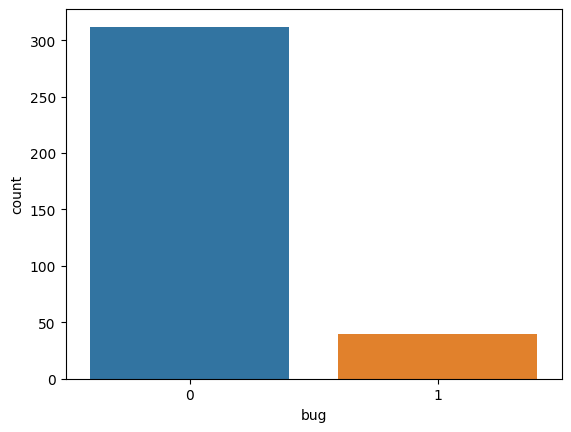

In [85]:
sns.countplot(x = 'bug', data=df)

In [86]:
df.columns

Index(['name', 'version', 'name.1', 'wmc', 'dit', 'noc', 'cbo', 'rfc', 'lcom',
       'ca', 'ce', 'npm', 'lcom3', 'loc', 'dam', 'moa', 'mfa', 'cam', 'ic',
       'cbm', 'amc', 'max_cc', 'avg_cc', 'bug'],
      dtype='object')

In [87]:
x = df.drop(columns=['bug', 'name', 'name.1'])

In [88]:
y = df['bug']

In [90]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state = 42)
x_train.shape, x_test.shape

((281, 21), (71, 21))

In [91]:
x_train_arr = np.array(x_train)
y_train_arr = np.array(y_train)

In [110]:
x_test_arr = np.array(x_test)
y_test_arr = np.array(y_test)

In [101]:
import smote_variants as sv
gsm = sv.E_SMOTE()

In [102]:
x_samp, y_samp = gsm.sample(x_train_arr, y_train_arr)

2023-07-10 10:44:35,609:INFO:E_SMOTE: Running sampling via ('E_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'min_features': 2, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state': None, 'class_name': 'E_SMOTE'}")
2023-07-10 10:44:35,613:INFO:E_SMOTE evaluting mask selection with features 2/21
2023-07-10 10:44:35,626:INFO:E_SMOTE evaluting mask selection with features 13/21
2023-07-10 10:44:35,662:INFO:E_SMOTE evaluting mask selection with features 2/21
2023-07-10 10:44:35,673:INFO:E_SMOTE evaluting mask selection with features 13/21
2023-07-10 10:44:35,709:INFO:E_SMOTE evaluting mask selection with features 2/21
2023-07-10 10:44:35,718:INFO:E_SMOTE evaluting mask selection with features 2/21
2023-07-10 10:44:35,728:INFO:E_SMOTE evaluting mask selection with features 13/21
2023-07-10 10:44:35,767:INFO:E_SMOTE evaluting mask selection with features 12/21
2023-07-10 10:44:3

2023-07-10 10:44:39,170:INFO:E_SMOTE evaluting mask selection with features 9/21
2023-07-10 10:44:39,210:INFO:E_SMOTE evaluting mask selection with features 13/21
2023-07-10 10:44:39,249:INFO:E_SMOTE evaluting mask selection with features 9/21
2023-07-10 10:44:39,290:INFO:E_SMOTE evaluting mask selection with features 14/21
2023-07-10 10:44:39,335:INFO:E_SMOTE evaluting mask selection with features 13/21
2023-07-10 10:44:39,376:INFO:E_SMOTE evaluting mask selection with features 9/21
2023-07-10 10:44:39,418:INFO:E_SMOTE evaluting mask selection with features 11/21
2023-07-10 10:44:39,461:INFO:E_SMOTE evaluting mask selection with features 9/21
2023-07-10 10:44:39,498:INFO:E_SMOTE evaluting mask selection with features 7/21
2023-07-10 10:44:39,535:INFO:E_SMOTE evaluting mask selection with features 10/21
2023-07-10 10:44:39,567:INFO:E_SMOTE evaluting mask selection with features 8/21
2023-07-10 10:44:39,612:INFO:E_SMOTE evaluting mask selection with features 7/21
2023-07-10 10:44:39,650

2023-07-10 10:44:43,105:INFO:E_SMOTE evaluting mask selection with features 4/21
2023-07-10 10:44:43,145:INFO:E_SMOTE evaluting mask selection with features 10/21
2023-07-10 10:44:43,180:INFO:E_SMOTE evaluting mask selection with features 10/21
2023-07-10 10:44:43,216:INFO:E_SMOTE evaluting mask selection with features 12/21
2023-07-10 10:44:43,246:INFO:E_SMOTE evaluting mask selection with features 10/21
2023-07-10 10:44:43,275:INFO:E_SMOTE evaluting mask selection with features 14/21
2023-07-10 10:44:43,303:INFO:E_SMOTE evaluting mask selection with features 10/21
2023-07-10 10:44:43,334:INFO:E_SMOTE evaluting mask selection with features 8/21
2023-07-10 10:44:43,378:INFO:E_SMOTE evaluting mask selection with features 13/21
2023-07-10 10:44:43,415:INFO:E_SMOTE evaluting mask selection with features 8/21
2023-07-10 10:44:43,445:INFO:E_SMOTE evaluting mask selection with features 8/21
2023-07-10 10:44:43,484:INFO:E_SMOTE evaluting mask selection with features 11/21
2023-07-10 10:44:43,

In [106]:
x_samp.shape

(502, 9)

In [111]:
x_t_samp, y_t_samp = gsm.sample(x_test_arr, y_test_arr)

2023-07-10 11:07:40,261:INFO:E_SMOTE: Running sampling via ('E_SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'min_features': 2, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state': None, 'class_name': 'E_SMOTE'}")
2023-07-10 11:07:40,264:INFO:E_SMOTE evaluting mask selection with features 12/21
2023-07-10 11:07:40,271:INFO:E_SMOTE evaluting mask selection with features 11/21
2023-07-10 11:07:40,278:INFO:E_SMOTE evaluting mask selection with features 2/21
2023-07-10 11:07:40,283:INFO:E_SMOTE evaluting mask selection with features 2/21
2023-07-10 11:07:40,288:INFO:E_SMOTE evaluting mask selection with features 9/21
2023-07-10 11:07:40,294:INFO:E_SMOTE evaluting mask selection with features 7/21
2023-07-10 11:07:40,299:INFO:E_SMOTE evaluting mask selection with features 11/21
2023-07-10 11:07:40,306:INFO:E_SMOTE evaluting mask selection with features 16/21
2023-07-10 11:07:4

2023-07-10 11:07:40,856:INFO:E_SMOTE evaluting mask selection with features 13/21
2023-07-10 11:07:40,864:INFO:E_SMOTE evaluting mask selection with features 10/21
2023-07-10 11:07:40,870:INFO:E_SMOTE evaluting mask selection with features 12/21
2023-07-10 11:07:40,876:INFO:E_SMOTE evaluting mask selection with features 11/21
2023-07-10 11:07:40,881:INFO:E_SMOTE evaluting mask selection with features 8/21
2023-07-10 11:07:40,886:INFO:E_SMOTE evaluting mask selection with features 11/21
2023-07-10 11:07:40,891:INFO:E_SMOTE evaluting mask selection with features 12/21
2023-07-10 11:07:40,897:INFO:E_SMOTE evaluting mask selection with features 11/21
2023-07-10 11:07:40,903:INFO:E_SMOTE evaluting mask selection with features 9/21
2023-07-10 11:07:40,911:INFO:E_SMOTE evaluting mask selection with features 10/21
2023-07-10 11:07:40,917:INFO:E_SMOTE evaluting mask selection with features 10/21
2023-07-10 11:07:40,924:INFO:E_SMOTE evaluting mask selection with features 12/21
2023-07-10 11:07:4

2023-07-10 11:07:41,519:INFO:E_SMOTE evaluting mask selection with features 12/21
2023-07-10 11:07:41,526:INFO:E_SMOTE evaluting mask selection with features 10/21
2023-07-10 11:07:41,532:INFO:E_SMOTE evaluting mask selection with features 9/21
2023-07-10 11:07:41,538:INFO:E_SMOTE evaluting mask selection with features 10/21
2023-07-10 11:07:41,545:INFO:E_SMOTE evaluting mask selection with features 13/21
2023-07-10 11:07:41,550:INFO:E_SMOTE evaluting mask selection with features 9/21
2023-07-10 11:07:41,558:INFO:E_SMOTE evaluting mask selection with features 6/21
2023-07-10 11:07:41,564:INFO:E_SMOTE evaluting mask selection with features 11/21
2023-07-10 11:07:41,570:INFO:E_SMOTE evaluting mask selection with features 12/21
2023-07-10 11:07:41,577:INFO:E_SMOTE evaluting mask selection with features 11/21
2023-07-10 11:07:41,583:INFO:E_SMOTE evaluting mask selection with features 11/21
2023-07-10 11:07:41,589:INFO:E_SMOTE evaluting mask selection with features 10/21
2023-07-10 11:07:41

In [114]:
x_t_samp.shape

(122, 12)

In [95]:
knn = KNeighborsClassifier(n_neighbors=15, metric='euclidean')
rf = RandomForestClassifier(n_estimators=50, max_depth=5)

In [103]:
knn.fit(x_samp, y_samp)

KNeighborsClassifier(metric='euclidean', n_neighbors=15)

In [113]:
y_pred = knn.predict(x_t_samp)
y_pred

ValueError: X has 12 features, but KNeighborsClassifier is expecting 9 features as input.

In [100]:
var_names

['NoSMOTE',
 'SMOTE_TomekLinks',
 'SMOTE_ENN',
 'Borderline_SMOTE1',
 'Borderline_SMOTE2',
 'ADASYN',
 'LLE_SMOTE',
 'AHC',
 'distance_SMOTE',
 'SMMO',
 ' polynom_fit_SMOTE_bus',
 ' polynom_fit_SMOTE_mesh',
 ' polynom_fit_SMOTE_star',
 ' polynom_fit_SMOTE_poly',
 ' Stefanowski',
 ' Safe_Level_SMOTE',
 ' MSMOTE',
 ' DE_oversampling',
 ' SMOBD',
 ' SUNDO',
 ' MSYN',
 ' SVM_balance',
 ' TRIM_SMOTE',
 ' SMOTE_RSB',
 ' ProWSyn',
 ' SL_graph_SMOTE',
 ' NRSBoundary_SMOTE',
 ' LVQ_SMOTE',
 ' SOI_CJ',
 ' ROSE',
 ' SMOTE_OUT',
 ' SMOTE_Cosine',
 ' Selected_SMOTE',
 ' LN_SMOTE',
 ' MWMOTE',
 ' PDFOS',
 ' IPADE_ID',
 ' RWO_sampling',
 ' NEATER',
 ' DEAGO',
 ' Gazzah',
 ' MCT',
 ' ADG',
 ' SMOTE_IPF',
 ' KernelADASYN',
 ' MOT2LD',
 ' V_SYNTH',
 ' OUPS',
 ' SMOTE_D',
 ' SMOTE_PSO',
 ' CURE_SMOTE',
 ' SOMO',
 ' CE_SMOTE',
 ' Edge_Det_SMOTE',
 ' CBSO',
 ' DBSMOTE',
 ' ASMOBD',
 ' Assembled_SMOTE',
 ' SDSMOTE',
 ' DSMOTE',
 ' G_SMOTE',
 ' NT_SMOTE',
 ' Lee',
 ' SPY',
 ' SMOTE_PSOBAT',
 ' MDO',
 ' Rando

Top 10 variants ( 50% ile) : polynom_fit_SMOTE_bus, SVM_balance, SMOTE_D, SMOTE_Cosine, Assembled_SMOTE, NDO_sampling, Gaussian_SMOTE, cluster_SMOTE, supervised_SMOTE

In [250]:
cam_knn.columns

Index(['Unnamed: 0', 'variants', 'TN', 'TP', 'FP', 'FN', 'Accuracy',
       'Precision', 'Recall', 'F1', 'AUC', 'FNR'],
      dtype='object')

In [252]:
well_list = ['polynom_fit_SMOTE_bus', 'SVM_balance', 'SMOTE_D', 'SMOTE_Cosine', 'Assembled_SMOTE', 'NDO_sampling', 'Gaussian_SMOTE', 'cluster_SMOTE', 'supervised_SMOTE']

In [251]:
cam_knn['FNR'][0]

1.0

In [283]:
cam_knn_10_precision=[]
cam_knn_10_FNR=[]
cam_knn_10_variants=[]

In [271]:
cam_knn_10_variants

[]

In [264]:
s = cam_knn['variants'][5]

In [284]:
well_list

['polynom_fit_SMOTE_bus',
 'SVM_balance',
 'SMOTE_D',
 'SMOTE_Cosine',
 'Assembled_SMOTE',
 'NDO_sampling',
 'Gaussian_SMOTE',
 'cluster_SMOTE',
 'supervised_SMOTE']

In [282]:
cam_knn

,Unnamed: 0,variants,TN,TP,FP,FN,Accuracy,Precision,Recall,F1,AUC,FNR
0,0,NoSMOTE,65,0,0,3,0.955882,0.000000,0.000000,0.000000,0.500000,1.000000
1,1,SMOTE_TomekLinks,48,1,17,2,0.720588,0.055556,0.333333,0.095238,0.535897,0.666667
2,2,SMOTE_ENN,65,0,0,3,0.955882,0.000000,0.000000,0.000000,0.500000,1.000000
3,3,Borderline_SMOTE1,63,0,2,3,0.926471,0.000000,0.000000,0.000000,0.484615,1.000000
4,4,Borderline_SMOTE2,63,0,2,3,0.926471,0.000000,0.000000,0.000000,0.484615,1.000000
5,5,ADASYN,47,1,18,2,0.705882,0.052632,0.333333,0.090909,0.528205,0.666667
6,6,LLE_SMOTE,56,0,9,3,0.823529,0.000000,0.000000,0.000000,0.430769,1.000000
7,7,AHC,65,0,0,3,0.955882,0.000000,0.000000,0.000000,0.500000,1.000000
8,8,distance_SMOTE,49,1,16,2,0.735294,0.058824,0.333333,0.100000,0.543590,0.666667
9,9,SMMO,56,0,9,3,0.823529,0.000000,0.000000,0.000000,0.430769,1.000000


In [10]:
cam_knn_10_FNR = [0.67, 0.33, 0.67, 0.67, 0.67, 0.33, 0.67, 0.67, 0.67]

In [33]:
pd.set_option('display.max_rows', None)

In [286]:
cam_rf

,Unnamed: 0,variants,TN,TP,FP,FN,ACcuracy,Precision,Recall,F1,AUC,FNR
0,0,NoSMOTE,64,0,1,3,0.941176,0.000000,0.000000,0.000000,0.492308,1.000000
1,1,SMOTE_TomekLinks,60,2,5,1,0.911765,0.285714,0.666667,0.400000,0.794872,0.333333
2,2,SMOTE_ENN,64,0,1,3,0.941176,0.000000,0.000000,0.000000,0.492308,1.000000
3,3,Borderline_SMOTE1,63,0,2,3,0.926471,0.000000,0.000000,0.000000,0.484615,1.000000
4,4,Borderline_SMOTE2,64,0,1,3,0.941176,0.000000,0.000000,0.000000,0.492308,1.000000
5,5,ADASYN,58,2,7,1,0.882353,0.222222,0.666667,0.333333,0.779487,0.333333
6,6,LLE_SMOTE,64,1,1,2,0.955882,0.500000,0.333333,0.400000,0.658974,0.666667
7,7,AHC,64,0,1,3,0.941176,0.000000,0.000000,0.000000,0.492308,1.000000
8,8,distance_SMOTE,63,0,2,3,0.926471,0.000000,0.000000,0.000000,0.484615,1.000000
9,9,SMMO,64,0,1,3,0.941176,0.000000,0.000000,0.000000,0.492308,1.000000


In [287]:
cam_rf_10_FNR=[0.33, 0.33, 0.33, 0.33, 0.33, 0.33, 0.67, 0.67, 0.67]

In [288]:
ivy_knn

,Unnamed: 0,Variants,TP,TN,FP,FN,Precision,Recall,F1,AUC,FNR
0,0,NoSMOTE,0,61,0,10,0.000000,0.0,0.000000,0.500000,1.0
1,1,SMOTE_TomekLinks,9,48,13,1,0.409091,0.9,0.562500,0.843443,0.1
2,2,SMOTE_ENN,0,61,0,10,0.000000,0.0,0.000000,0.500000,1.0
3,3,Borderline_SMOTE1,9,50,11,1,0.450000,0.9,0.600000,0.859836,0.1
4,4,Borderline_SMOTE2,9,51,10,1,0.473684,0.9,0.620690,0.868033,0.1
5,5,ADASYN,10,40,21,0,0.322581,1.0,0.487805,0.827869,0.0
6,6,LLE_SMOTE,9,48,13,1,0.409091,0.9,0.562500,0.843443,0.1
7,7,AHC,4,58,3,6,0.571429,0.4,0.470588,0.675410,0.6
8,8,distance_SMOTE,9,45,16,1,0.360000,0.9,0.514286,0.818852,0.1
9,9,SMMO,3,46,15,7,0.166667,0.3,0.214286,0.527049,0.7


In [289]:
ivy_knn_10_FNR=[0.1, 0.0, 0.2, 0.1, 0.1, 0.1, 0.4, 0.1, 0.1]

In [290]:
ivy_rf

,Unnamed: 0,Variants,TP,TN,FP,FN,Precision,Recall,F1,AUC,FNR
0,0,NoSMOTE,2,61,0,8,1.000000,0.2,0.333333,0.600000,0.8
1,1,SMOTE_TomekLinks,7,56,5,3,0.583333,0.7,0.636364,0.809016,0.3
2,2,SMOTE_ENN,1,61,0,9,1.000000,0.1,0.181818,0.550000,0.9
3,3,Borderline_SMOTE1,6,56,5,4,0.545455,0.6,0.571429,0.759016,0.4
4,4,Borderline_SMOTE2,9,57,4,1,0.692308,0.9,0.782609,0.917213,0.1
5,5,ADASYN,8,56,5,2,0.615385,0.8,0.695652,0.859016,0.2
6,6,LLE_SMOTE,4,60,1,6,0.800000,0.4,0.533333,0.691803,0.6
7,7,AHC,3,61,0,7,1.000000,0.3,0.461538,0.650000,0.7
8,8,distance_SMOTE,3,60,1,7,0.750000,0.3,0.428571,0.641803,0.7
9,9,SMMO,2,61,0,8,1.000000,0.2,0.333333,0.600000,0.8


In [291]:
ivy_rf_10_FNR=[0.2, 0.3, 0.4, 0.1, 0.2, 0.5, 0.5, 0.5, 0.4]

In [3]:
dff= pd.read_csv('arcilook.csv')

In [4]:
dff.shape

(234, 24)

In [5]:
dff['bug'].unique()

array([0, 1, 2], dtype=int64)

In [7]:
len(dff.loc[dff['bug']==0])

207

In [8]:
len(dff.loc[dff['bug']==1])

21

In [9]:
len(dff.loc[dff['bug']==2])

6

In [84]:
top_25_var = ['SMOTE_D', 'SMOTE_Cosine', 'NDO_sampling', 'polynom_fit_SMOTE_bus', 'G_SMOTE']
df_list_knn = [sorted_cam_knn,  sorted_ivy_knn, sorted_tom_knn, sorted_red_knn, sorted_jd_knn, sorted_arc_knn]

In [86]:
df_list_names_knn = ['sorted_cam_knn',' sorted_ivy_knn',' sorted_tom_knn',' sorted_red_knn',' sorted_jd_knn',' sorted_arc_knn']

In [115]:
df_list_names_rf = ['sorted_cam_rf',' sorted_ivy_rf',' sorted_tom_rf',' sorted_red_rf',' sorted_jd_rf',' sorted_arc_rf']
df_list_rf = [sorted_cam_rf,  sorted_ivy_rf, sorted_tom_rf, sorted_red_rf, sorted_jd_rf, sorted_arc_rf]

In [92]:
sorted_cam_knn[sorted_cam_knn.columns[1]][1]

'SMOTE_TomekLinks'

In [108]:
df_list_knn[5]['F1'][48]

0.2

In [101]:
for i in range(len(df_list_knn)):
    for j in range(87):
        if (df_list_knn[i][df_list_knn[i].columns[1]][j] == ' SMOTE_D'):
            print(df_list_names_knn[i], ':', df_list_knn[i]['F1'][j])

sorted_cam_knn : 0.166666667
 sorted_ivy_knn : 0.5925925925925927
 sorted_tom_knn : 0.2631578947368421
 sorted_red_knn : 0.25
 sorted_jd_knn : 0.1666666666666666
 sorted_arc_knn : 0.2


In [109]:
for i in range(len(df_list_knn)):
    for j in range(87):
        if (df_list_knn[i][df_list_knn[i].columns[1]][j] == ' SMOTE_Cosine'):
            print(df_list_names_knn[i], ':', df_list_knn[i]['F1'][j])

sorted_cam_knn : 0.125
 sorted_ivy_knn : 0.5454545454545454
 sorted_tom_knn : 0.2641509433962264
 sorted_red_knn : 0.3199999999999999
 sorted_jd_knn : 0.2105263157894736
 sorted_arc_knn : 0.3157894736842105


In [110]:
for i in range(len(df_list_knn)):
    for j in range(87):
        if (df_list_knn[i][df_list_knn[i].columns[1]][j] == ' NDO_sampling'):
            print(df_list_names_knn[i], ':', df_list_knn[i]['F1'][j])

sorted_cam_knn : 0.210526316
 sorted_ivy_knn : 0.5142857142857143
 sorted_tom_knn : 0.2264150943396226
 sorted_red_knn : 0.3333333333333333
 sorted_jd_knn : 0.1481481481481481
 sorted_arc_knn : 0.2666666666666666


In [111]:
for i in range(len(df_list_knn)):
    for j in range(87):
        if (df_list_knn[i][df_list_knn[i].columns[1]][j] == ' polynom_fit_SMOTE_bus'):
            print(df_list_names_knn[i], ':', df_list_knn[i]['F1'][j])

sorted_cam_knn : 0.142857143
 sorted_ivy_knn : 0.5454545454545454
 sorted_tom_knn : 0.24
 sorted_red_knn : 0.3333333333333333
 sorted_jd_knn : 0.2
 sorted_arc_knn : 0.2857142857142857


In [112]:
for i in range(len(df_list_knn)):
    for j in range(87):
        if (df_list_knn[i][df_list_knn[i].columns[1]][j] == ' G_SMOTE'):
            print(df_list_names_knn[i], ':', df_list_knn[i]['F1'][j])

sorted_cam_knn : 0.117647059
 sorted_ivy_knn : 0.6
 sorted_tom_knn : 0.2258064516129032
 sorted_red_knn : 0.2727272727272727
 sorted_jd_knn : 0.074074074074074
 sorted_arc_knn : 0.1666666666666666


In [116]:
for i in range(len(df_list_rf)):
    for j in range(87):
        if (df_list_rf[i][df_list_rf[i].columns[1]][j] == ' G_SMOTE'):
            print(df_list_names_rf[i], ':', df_list_rf[i]['F1'][j])

sorted_cam_rf : 0.4
 sorted_ivy_rf : 0.7
 sorted_tom_rf : 0.2857142857142857
 sorted_red_rf : 0.3636363636363636
 sorted_jd_rf : 0.3076923076923076
 sorted_arc_rf : 0.5454545454545454


In [117]:
for i in range(len(df_list_rf)):
    for j in range(87):
        if (df_list_rf[i][df_list_rf[i].columns[1]][j] == ' SMOTE_D'):
            print(df_list_names_rf[i], ':', df_list_rf[i]['F1'][j])

sorted_cam_rf : 0.444444444
 sorted_ivy_rf : 0.631578947
 sorted_tom_rf : 0.4166666666666666
 sorted_red_rf : 0.3636363636363636
 sorted_jd_rf : 0.25
 sorted_arc_rf : 0.5


In [118]:
for i in range(len(df_list_rf)):
    for j in range(87):
        if (df_list_rf[i][df_list_rf[i].columns[1]][j] == ' SMOTE_Cosine'):
            print(df_list_names_rf[i], ':', df_list_rf[i]['F1'][j])

sorted_cam_rf : 0.4
 sorted_ivy_rf : 0.692307692
 sorted_tom_rf : 0.368421052631579
 sorted_red_rf : 0.3333333333333333
 sorted_jd_rf : 0.2
 sorted_arc_rf : 0.5


In [119]:
for i in range(len(df_list_rf)):
    for j in range(87):
        if (df_list_rf[i][df_list_rf[i].columns[1]][j] == ' NDO_sampling'):
            print(df_list_names_rf[i], ':', df_list_rf[i]['F1'][j])

sorted_cam_rf : 0.444444444
 sorted_ivy_rf : 0.5
 sorted_tom_rf : 0.3783783783783783
 sorted_red_rf : 0.5
 sorted_jd_rf : 0.1666666666666666
 sorted_arc_rf : 0.5714285714285714


In [120]:
for i in range(len(df_list_rf)):
    for j in range(87):
        if (df_list_rf[i][df_list_rf[i].columns[1]][j] == ' polynom_fit_SMOTE_bus'):
            print(df_list_names_rf[i], ':', df_list_rf[i]['F1'][j])

sorted_cam_rf : 0.444444444
 sorted_ivy_rf : 0.761904762
 sorted_tom_rf : 0.3333333333333333
 sorted_red_rf : 0.5
 sorted_jd_rf : 0.2
 sorted_arc_rf : 0.5


In [121]:
for i in range(len(df_list_rf)):
    for j in range(87):
        if (df_list_rf[i][df_list_rf[i].columns[1]][j] == ' G_SMOTE'):
            print(df_list_names_rf[i], ':', df_list_rf[i]['F1'][j])

sorted_cam_rf : 0.4
 sorted_ivy_rf : 0.7
 sorted_tom_rf : 0.2857142857142857
 sorted_red_rf : 0.3636363636363636
 sorted_jd_rf : 0.3076923076923076
 sorted_arc_rf : 0.5454545454545454


In [124]:
sorted_ivy_rf

,Unnamed: 0,Variants,TP,TN,FP,FN,Precision,Recall,F1,AUC,FNR
26,26,NRSBoundary_SMOTE,9,58,3,1,0.750000,0.9,0.818182,0.925410,0.1
4,4,Borderline_SMOTE2,9,57,4,1,0.692308,0.9,0.782609,0.917213,0.1
10,10,polynom_fit_SMOTE_bus,8,58,3,2,0.727273,0.8,0.761905,0.875410,0.2
64,64,SMOTE_PSOBAT,9,56,5,1,0.642857,0.9,0.750000,0.909016,0.1
11,11,polynom_fit_SMOTE_mesh,9,56,5,1,0.642857,0.9,0.750000,0.909016,0.1
41,41,MCT,8,57,4,2,0.666667,0.8,0.727273,0.867213,0.2
32,32,Selected_SMOTE,8,57,4,2,0.666667,0.8,0.727273,0.867213,0.2
43,43,SMOTE_IPF,9,55,6,1,0.600000,0.9,0.720000,0.900820,0.1
69,69,GASMOTE,6,60,1,4,0.857143,0.6,0.705882,0.791803,0.4
37,37,RWO_sampling,6,60,1,4,0.857143,0.6,0.705882,0.791803,0.4


In [140]:
sorted_ivy_knn

,Unnamed: 0,Variants,TP,TN,FP,FN,Precision,Recall,F1,AUC,FNR
52,52,CE_SMOTE,9,52,9,1,0.500000,0.9,0.642857,0.876230,0.1
25,25,SL_graph_SMOTE,9,52,9,1,0.500000,0.9,0.642857,0.876230,0.1
80,80,Supervised_SMOTE,9,52,9,1,0.500000,0.9,0.642857,0.876230,0.1
4,4,Borderline_SMOTE2,9,51,10,1,0.473684,0.9,0.620690,0.868033,0.1
27,27,LVQ_SMOTE,8,53,8,2,0.500000,0.8,0.615385,0.834426,0.2
62,62,Lee,8,53,8,2,0.500000,0.8,0.615385,0.834426,0.2
86,86,SYMPROD,6,57,4,4,0.600000,0.6,0.600000,0.767213,0.4
3,3,Borderline_SMOTE1,9,50,11,1,0.450000,0.9,0.600000,0.859836,0.1
72,72,AND_SMOTE,9,50,11,1,0.450000,0.9,0.600000,0.859836,0.1
20,20,MSYN,9,50,11,1,0.450000,0.9,0.600000,0.859836,0.1


In [139]:
var_names

['NoSMOTE',
 'SMOTE_TomekLinks',
 'SMOTE_ENN',
 'Borderline_SMOTE1',
 'Borderline_SMOTE2',
 'ADASYN',
 'LLE_SMOTE',
 'AHC',
 'distance_SMOTE',
 'SMMO',
 ' polynom_fit_SMOTE_bus',
 ' polynom_fit_SMOTE_mesh',
 ' polynom_fit_SMOTE_star',
 ' polynom_fit_SMOTE_poly',
 ' Stefanowski',
 ' Safe_Level_SMOTE',
 ' MSMOTE',
 ' DE_oversampling',
 ' SMOBD',
 ' SUNDO',
 ' MSYN',
 ' SVM_balance',
 ' TRIM_SMOTE',
 ' SMOTE_RSB',
 ' ProWSyn',
 ' SL_graph_SMOTE',
 ' NRSBoundary_SMOTE',
 ' LVQ_SMOTE',
 ' SOI_CJ',
 ' ROSE',
 ' SMOTE_OUT',
 ' SMOTE_Cosine',
 ' Selected_SMOTE',
 ' LN_SMOTE',
 ' MWMOTE',
 ' PDFOS',
 ' IPADE_ID',
 ' RWO_sampling',
 ' NEATER',
 ' DEAGO',
 ' Gazzah',
 ' MCT',
 ' ADG',
 ' SMOTE_IPF',
 ' KernelADASYN',
 ' MOT2LD',
 ' V_SYNTH',
 ' OUPS',
 ' SMOTE_D',
 ' SMOTE_PSO',
 ' CURE_SMOTE',
 ' SOMO',
 ' CE_SMOTE',
 ' Edge_Det_SMOTE',
 ' CBSO',
 ' DBSMOTE',
 ' ASMOBD',
 ' Assembled_SMOTE',
 ' SDSMOTE',
 ' DSMOTE',
 ' G_SMOTE',
 ' NT_SMOTE',
 ' Lee',
 ' SPY',
 ' SMOTE_PSOBAT',
 ' MDO',
 ' Rando

In [141]:
ivy_f1 = []
for i in range(len(ivy_knn)):
    ivy_f1.append(ivy_knn['F1'][i])

In [151]:
ivy_f2=[]
for i in range(len(ivy_rf)):
    ivy_f2.append(ivy_rf['F1'][i])

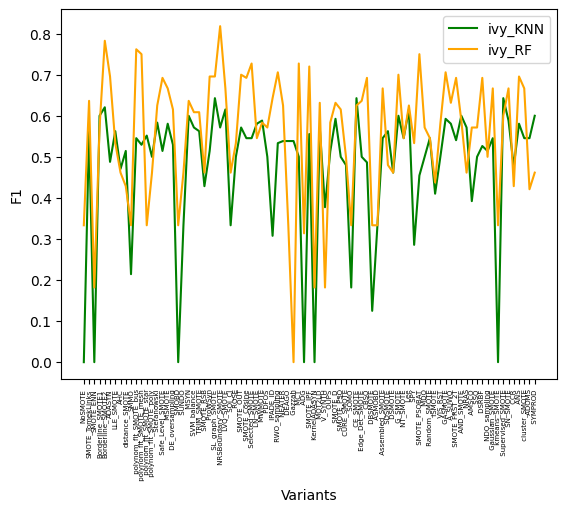

In [153]:
mp.plot(var_names, ivy_f1, color='green', label='ivy_KNN')
mp.plot(var_names, ivy_f2, color='orange', label='ivy_RF')
mp.xticks(rotation=90, fontsize=5)
mp.xlabel('Variants')
mp.ylabel('F1')
mp.legend()
mp.show()

In [40]:
smote_d = []
list_conts = [cam_knn, cam_rf, ivy_knn, ivy_rf, tom_knn, tom_rf, red_knn, red_rf, jd_knn, jd_rf, arc_knn, arc_rf]
list_names = ['cam_knn', 'cam_rf', 'ivy_knn', 'ivy_rf', 'tom_knn', 'tom_rf', 'red_knn', 'red_rf', 'jd_knn', 'jd_rf', 'arc_knn', 'arc_rf']

In [163]:
smote_cosine=[]
ndo_samp=[]
poly_bus=[]
g_smote=[]
for i in range(len(list_conts)):
    smote_cosine.append(list_conts[i]['F1'][31])
    ndo_samp.append(list_conts[i]['F1'][77])
    poly_bus.append(list_conts[i]['F1'][10])
    g_smote.append(list_conts[i]['F1'][60])

In [165]:
ndo_samp

[0.210526316,
 0.444444444,
 0.5142857142857143,
 0.5,
 0.2264150943396226,
 0.3783783783783783,
 0.3333333333333333,
 0.5,
 0.1481481481481481,
 0.1666666666666666,
 0.2666666666666666,
 0.5714285714285714]

SMOTE_Cosine - 31
G_SMOTE - 60
NDO_sampling - 77
poly_bus- 10

In [157]:
for i in range(len(list_conts)):
    smote_d.append(list_conts[i]['F1'][48])

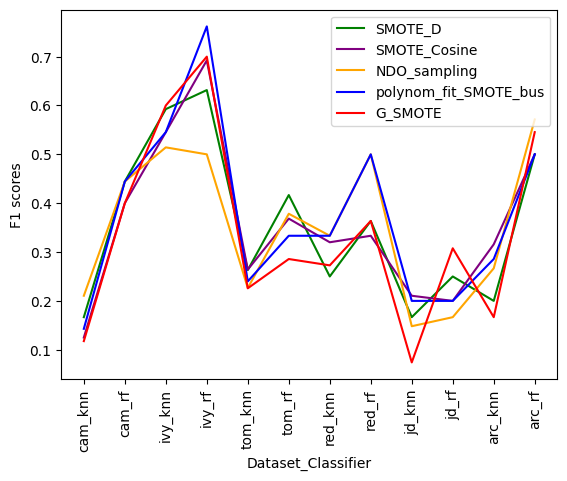

In [175]:
mp.plot(list_names, smote_d, color='green', label='SMOTE_D')
mp.plot(list_names, smote_cosine, color='purple', label='SMOTE_Cosine')
mp.plot(list_names, ndo_samp, color='orange', label='NDO_sampling')
mp.plot(list_names, poly_bus, color='blue', label='polynom_fit_SMOTE_bus')
mp.plot(list_names, g_smote, color='red', label='G_SMOTE')
mp.xlabel('Dataset_Classifier')
mp.ylabel('F1 scores')
mp.xticks(rotation=90)
mp.legend()
mp.show()

In [21]:
top_var=['SMOTE_D', 'SMOTE_Cosine', 'NDO_sampling', 'polynom_fot_SMOTE_bus', 'G_SMOTE']

In [22]:
df_list = [cam_knn, cam_rf, ivy_knn, ivy_rf, tom_knn, tom_rf, red_knn, red_rf, jd_knn, jd_rf, arc_knn, arc_rf]

In [23]:
df_list_name = ['cam_knn', 'cam_rf', 'ivy_knn', 'ivy_rf', 'tom_knn', 'tom_rf', 'red_knn', 'red_rf', 'jd_knn', 'jd_rf', 'arc_knn', 'arc_rf']

In [33]:
smd_fnr=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' SMOTE_D'):
            print(df_list_name[i],':',df_list[i]['FNR'][j])
            smd_fnr.append(df_list[i]['FNR'][j])

cam_knn : 0.6666666666666666
cam_rf : 0.3333333333333333
ivy_knn : 0.2
ivy_rf : 0.4
tom_knn : 0.5454545454545454
tom_rf : 0.5454545454545454
red_knn : 0.75
red_rf : 0.75
jd_knn : 0.6666666666666666
jd_rf : 0.6666666666666666
arc_knn : 0.8
arc_rf : 0.4


In [35]:
import statistics 
smd_mean = statistics.mean(smd_fnr)

In [36]:
smd_mean

0.5603535353535354

In [37]:
smc_fnr = []
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' SMOTE_Cosine'):
            print(df_list_name[i],':',df_list[i]['FNR'][j])
            smc_fnr.append(df_list[i]['FNR'][j])

cam_knn : 0.6666666666666666
cam_rf : 0.3333333333333333
ivy_knn : 0.1
ivy_rf : 0.1
tom_knn : 0.36363636363636365
tom_rf : 0.36363636363636365
red_knn : 0.5
red_rf : 0.75
jd_knn : 0.3333333333333333
jd_rf : 0.6666666666666666
arc_knn : 0.4
arc_rf : 0.4


In [38]:
smc_mean = statistics.mean(smc_fnr)
smc_mean

0.4147727272727273

In [39]:
nd_fnr = []
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' NDO_sampling'):
            print(df_list_name[i],':',df_list[i]['FNR'][j])
            nd_fnr.append(df_list[i]['FNR'][j])

cam_knn : 0.3333333333333333
cam_rf : 0.3333333333333333
ivy_knn : 0.1
ivy_rf : 0.5
tom_knn : 0.45454545454545453
tom_rf : 0.36363636363636365
red_knn : 0.5
red_rf : 0.625
jd_knn : 0.3333333333333333
jd_rf : 0.6666666666666666
arc_knn : 0.6
arc_rf : 0.2


In [40]:
nd_mean=statistics.mean(nd_fnr)
nd_mean

0.4174873737373737

In [41]:
polybus_fnr =[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' polynom_fit_SMOTE_bus'):
            print(df_list_name[i],':',df_list[i]['FNR'][j])
            polybus_fnr.append(df_list[i]['FNR'][j])

cam_knn : 0.6666666666666666
cam_rf : 0.3333333333333333
ivy_knn : 0.1
ivy_rf : 0.2
tom_knn : 0.45454545454545453
tom_rf : 0.36363636363636365
red_knn : 0.5
red_rf : 0.625
jd_knn : 0.3333333333333333
jd_rf : 0.6666666666666666
arc_knn : 0.4
arc_rf : 0.4


In [42]:
polybus_mean = statistics.mean(polybus_fnr)
polybus_mean

0.42026515151515154

In [43]:
gsmote_fnr = []
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' G_SMOTE'):
            print(df_list_name[i],':',df_list[i]['FNR'][j])
            gsmote_fnr.append(df_list[i]['FNR'][j])

cam_knn : 0.6666666666666666
cam_rf : 0.3333333333333333
ivy_knn : 0.1
ivy_rf : 0.3
tom_knn : 0.36363636363636365
tom_rf : 0.5454545454545454
red_knn : 0.625
red_rf : 0.75
jd_knn : 0.6666666666666666
jd_rf : 0.3333333333333333
arc_knn : 0.6
arc_rf : 0.4


In [44]:
gsmote_mean = statistics.mean(gsmote_fnr)
gsmote_mean

0.4736742424242424

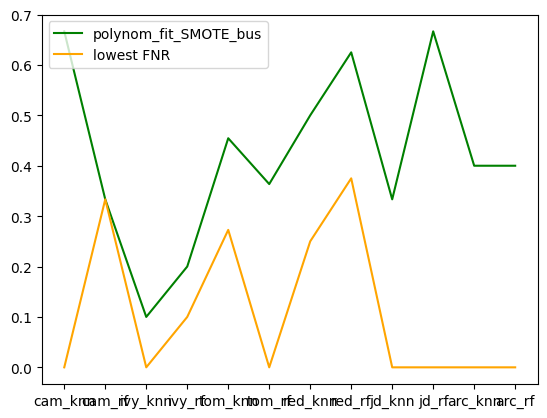

In [48]:
mp.plot(df_list_name, polybus_fnr, color='green', label='polynom_fit_SMOTE_bus')
mp.plot(df_list_name, top_fnr, color='orange', label='lowest FNR')
mp.legend()

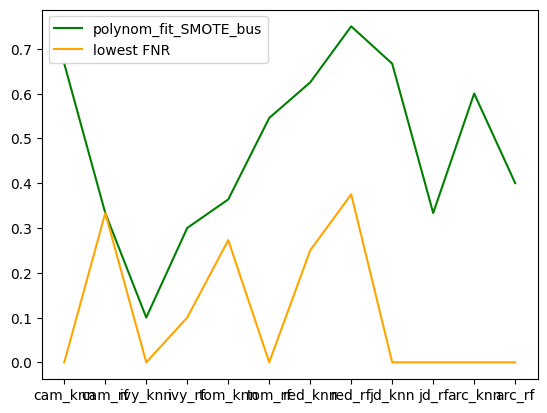

In [49]:
mp.plot(df_list_name, gsmote_fnr, color='green', label='polynom_fit_SMOTE_bus')
mp.plot(df_list_name, top_fnr, color='orange', label='lowest FNR')
mp.legend()

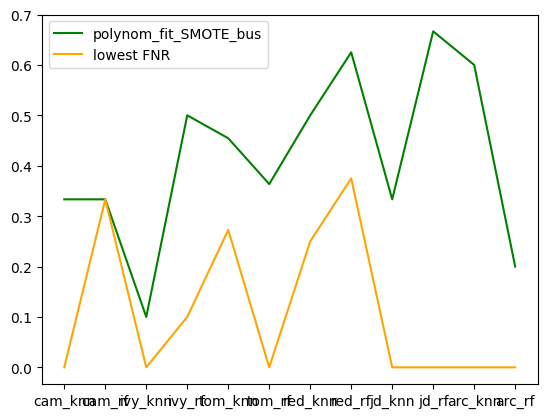

In [50]:
mp.plot(df_list_name, nd_fnr, color='green', label='polynom_fit_SMOTE_bus')
mp.plot(df_list_name, top_fnr, color='orange', label='lowest FNR')
mp.legend()

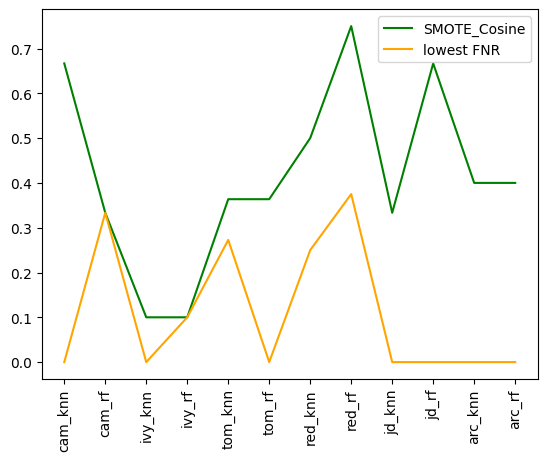

In [74]:
mp.plot(df_list_name, smc_fnr, color='green', label='SMOTE_Cosine')
mp.plot(df_list_name, top_fnr, color='orange', label='lowest FNR')
mp.xticks(rotation=90)
mp.legend()

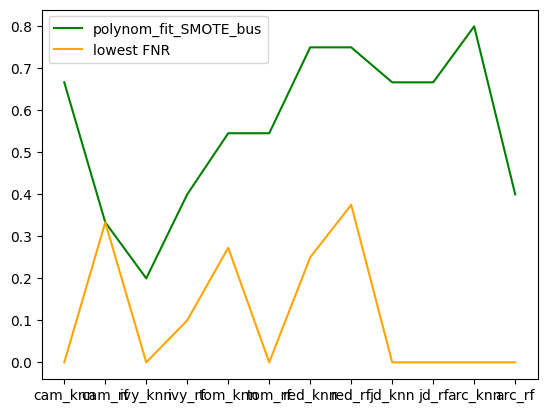

In [52]:
mp.plot(df_list_name, smd_fnr, color='green', label='polynom_fit_SMOTE_bus')
mp.plot(df_list_name, top_fnr, color='orange', label='lowest FNR')
mp.legend()

In [46]:
top_fnr=[]
for i in range(len(df_list)):
    top_fnr.append(min(df_list[i]['FNR']))

In [47]:
top_fnr

[0.0,
 0.3333333333333333,
 0.0,
 0.1,
 0.2727272727272727,
 0.0,
 0.25,
 0.375,
 0.0,
 0.0,
 0.0,
 0.0]

In [38]:
smd_auc=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' SMOTE_D'):
            print(df_list_name[i],':',df_list[i]['AUC'][j])
            smd_auc.append(df_list[i]['AUC'][j])

cam_knn : 0.605128205
cam_rf : 0.802564103
ivy_knn : 0.8262295081967215
ivy_rf : 0.775409836
tom_knn : 0.6589497459062675
tom_rf : 0.7024280067758328
red_knn : 0.5178571428571428
red_rf : 0.6071428571428571
jd_knn : 0.6249999999999999
jd_rf : 0.6458333333333333
arc_knn : 0.5523809523809523
arc_rf : 0.7523809523809525


In [55]:
smc_auc=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' SMOTE_Cosine'):
            print(df_list_name[i],':',df_list[i]['AUC'][j])
            smc_auc.append(df_list[i]['AUC'][j])

cam_knn : 0.574358974
cam_rf : 0.794871795
ivy_knn : 0.8352459016393442
ivy_rf : 0.892622951
tom_knn : 0.7094861660079052
tom_rf : 0.7560700169395821
red_knn : 0.5178571428571429
red_rf : 0.5892857142857143
jd_knn : 0.7604166666666666
jd_rf : 0.6354166666666666
arc_knn : 0.6690476190476191
arc_rf : 0.7523809523809525


In [56]:
ndo_auc=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' NDO_sampling'):
            print(df_list_name[i],':',df_list[i]['AUC'][j])
            ndo_auc.append(df_list[i]['AUC'][j])

cam_knn : 0.725641026
cam_rf : 0.802564103
ivy_knn : 0.8188524590163934
ivy_rf : 0.709016393
tom_knn : 0.6609260304912479
tom_rf : 0.759175607001694
red_knn : 0.5357142857142857
red_rf : 0.6696428571428572
jd_knn : 0.7187499999999999
jd_rf : 0.6249999999999999
arc_knn : 0.6047619047619047
arc_rf : 0.8404761904761904


In [57]:
poly_auc=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' polynom_fit_SMOTE_bus'):
            print(df_list_name[i],':',df_list[i]['AUC'][j])
            poly_auc.append(df_list[i]['AUC'][j])

cam_knn : 0.58974359
cam_rf : 0.802564103
ivy_knn : 0.8352459016393442
ivy_rf : 0.875409836
tom_knn : 0.6702428006775832
tom_rf : 0.7436476566911348
red_knn : 0.5357142857142857
red_rf : 0.6696428571428572
jd_knn : 0.7552083333333333
jd_rf : 0.6354166666666666
arc_knn : 0.6452380952380953
arc_rf : 0.7523809523809525


In [58]:
gsm_auc=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' G_SMOTE'):
            print(df_list_name[i],':',df_list[i]['AUC'][j])
            gsm_auc.append(df_list[i]['AUC'][j])

cam_knn : 0.566666667
cam_rf : 0.794871795
ivy_knn : 0.8598360655737705
ivy_rf : 0.825409836
tom_knn : 0.6815358554488988
tom_rf : 0.6682665160926031
red_knn : 0.4910714285714286
red_rf : 0.6071428571428571
jd_knn : 0.546875
jd_rf : 0.7916666666666666
arc_knn : 0.4976190476190475
arc_rf : 0.7642857142857143


In [76]:
import statistics as st

In [63]:
print('SMOTE_D: ', st.median(smd_auc))
print('SMOTE_Cosine', st.median(smc_auc))
print('NDO_sampling:', st.median(ndo_auc))
print('polynom_fit_SMOTE_bus:', st.median(poly_auc))
print('G_SMOTE:', st.median(gsm_auc))

SMOTE_D:  0.6523915396198003
SMOTE_Cosine 0.7309335591944288
NDO_sampling: 0.7138831964999999
polynom_fit_SMOTE_bus: 0.7069452286843589
G_SMOTE: 0.674901185770751


In [65]:
top_5 =['SMOTE_D', 'SMOTE_Cosine', 'NDO_sampling', 'polynom_fit_SMOTE_bus', 'G_SMOTE']

In [73]:
top_auc=[]

In [74]:
for i in range(len(df_list)):
    top_auc.append(max(df_list[i]['AUC']))

In [75]:
top_auc

[0.830769231,
 0.817948718,
 0.8852459016393442,
 0.925409836,
 0.7343308865047995,
 0.779785431959345,
 0.6160714285714286,
 0.7232142857142857,
 0.8958333333333333,
 0.8645833333333334,
 0.8690476190476191,
 0.9166666666666669]

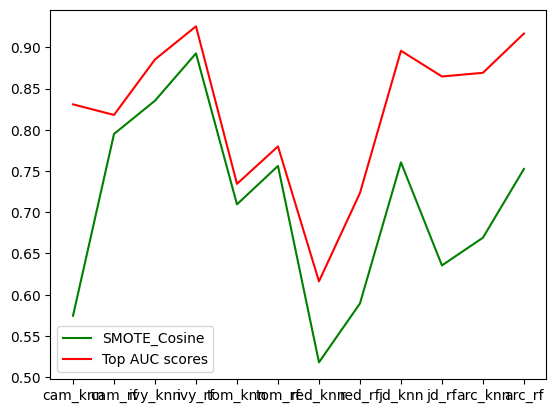

In [76]:
mp.plot(df_list_name, smc_auc, color='green', label='SMOTE_Cosine')
mp.plot(df_list_name, top_auc, color='red', label='Top AUC scores')
mp.legend()

In [28]:
smd_pr=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' SMOTE_D'):
            print(df_list_name[i],':',df_list[i]['Precision'][j])
            smd_pr.append(df_list[i]['Precision'][j])

cam_knn : 0.111111111
cam_rf : 0.333333333
ivy_knn : 0.4705882352941176
ivy_rf : 0.666666667
tom_knn : 0.1851851851851851
tom_rf : 0.3846153846153846
red_knn : 0.25
red_rf : 0.6666666666666666
jd_knn : 0.1111111111111111
jd_rf : 0.2
arc_knn : 0.2
arc_rf : 0.4285714285714285


In [29]:
smc_pr=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' SMOTE_Cosine'):
            print(df_list_name[i],':',df_list[i]['Precision'][j])
            smc_pr.append(df_list[i]['Precision'][j])

cam_knn : 0.076923077
cam_rf : 0.285714286
ivy_knn : 0.391304347826087
ivy_rf : 0.5625
tom_knn : 0.1666666666666666
tom_rf : 0.2592592592592592
red_knn : 0.2352941176470588
red_rf : 0.5
jd_knn : 0.125
jd_rf : 0.1428571428571428
arc_knn : 0.2142857142857142
arc_rf : 0.4285714285714285


In [31]:
ndo_pr=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' NDO_sampling'):
            print(df_list_name[i],':',df_list[i]['Precision'][j])
            ndo_pr.append(df_list[i]['Precision'][j])

cam_knn : 0.125
cam_rf : 0.333333333
ivy_knn : 0.36
ivy_rf : 0.5
tom_knn : 0.1428571428571428
tom_rf : 0.2692307692307692
red_knn : 0.25
red_rf : 0.75
jd_knn : 0.0833333333333333
jd_rf : 0.1111111111111111
arc_knn : 0.2
arc_rf : 0.4444444444444444


In [24]:
poly_pr=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' polynom_fit_SMOTE_bus'):
            print(df_list_name[i],':',df_list[i]['Precision'][j])
            poly_pr.append(df_list[i]['Precision'][j])

cam_knn : 0.090909091
cam_rf : 0.333333333
ivy_knn : 0.391304347826087
ivy_rf : 0.727272727
tom_knn : 0.1538461538461538
tom_rf : 0.2258064516129032
red_knn : 0.25
red_rf : 0.75
jd_knn : 0.1176470588235294
jd_rf : 0.1428571428571428
arc_knn : 0.1875
arc_rf : 0.4285714285714285


In [25]:
gsm_pr=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' G_SMOTE'):
            print(df_list_name[i],':',df_list[i]['Precision'][j])
            gsm_pr.append(df_list[i]['Precision'][j])

cam_knn : 0.071428571
cam_rf : 0.285714286
ivy_knn : 0.45
ivy_rf : 0.7
tom_knn : 0.1372549019607843
tom_rf : 0.2083333333333333
red_knn : 0.2142857142857142
red_rf : 0.6666666666666666
jd_knn : 0.0416666666666666
jd_rf : 0.2
arc_knn : 0.1052631578947368
arc_rf : 0.5


In [26]:
import statistics as st

In [32]:
print("SMOTE_D:", st.median(smd_pr))
print("SMOTE_Cosine:", st.median(smc_pr))
print("NDO_sampling:", st.median(ndo_pr))
print("polynom_fit_SMOTE_bus:", st.median(poly_pr))
print("G_SMOTE:", st.median(gsm_pr))

SMOTE_D: 0.2916666665
SMOTE_Cosine: 0.24727668845315898
NDO_sampling: 0.2596153846153846
polynom_fit_SMOTE_bus: 0.2379032258064516
G_SMOTE: 0.21130952380952372


In [54]:
smd_tpr=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' SMOTE_D'):
            print(df_list_name[i],':',df_list[i]['Recall'][j])
            smd_tpr.append(df_list[i]['Recall'][j])

cam_knn : 0.333333333
cam_rf : 0.666666667
ivy_knn : 0.8
ivy_rf : 0.6
tom_knn : 0.4545454545454545
tom_rf : 0.4545454545454545
red_knn : 0.25
red_rf : 0.25
jd_knn : 0.3333333333333333
jd_rf : 0.3333333333333333
arc_knn : 0.2
arc_rf : 0.6


In [55]:
smc_tpr=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' SMOTE_Cosine'):
            print(df_list_name[i],':',df_list[i]['Recall'][j])
            smc_tpr.append(df_list[i]['Recall'][j])

cam_knn : 0.333333333
cam_rf : 0.666666667
ivy_knn : 0.9
ivy_rf : 0.9
tom_knn : 0.6363636363636364
tom_rf : 0.6363636363636364
red_knn : 0.5
red_rf : 0.25
jd_knn : 0.6666666666666666
jd_rf : 0.3333333333333333
arc_knn : 0.6
arc_rf : 0.6


In [56]:
ndo_tpr=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' NDO_sampling'):
            print(df_list_name[i],':',df_list[i]['Recall'][j])
            ndo_tpr.append(df_list[i]['Recall'][j])

cam_knn : 0.666666667
cam_rf : 0.666666667
ivy_knn : 0.9
ivy_rf : 0.5
tom_knn : 0.5454545454545454
tom_rf : 0.6363636363636364
red_knn : 0.5
red_rf : 0.375
jd_knn : 0.6666666666666666
jd_rf : 0.3333333333333333
arc_knn : 0.4
arc_rf : 0.8


In [61]:
poly_tpr=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' polynom_fit_SMOTE_bus'):
            print(df_list_name[i],':',df_list[i]['Recall'][j])
            poly_tpr.append(df_list[i]['Recall'][j])

cam_knn : 0.333333333
cam_rf : 0.666666667
ivy_knn : 0.9
ivy_rf : 0.8
tom_knn : 0.5454545454545454
tom_rf : 0.6363636363636364
red_knn : 0.5
red_rf : 0.375
jd_knn : 0.6666666666666666
jd_rf : 0.3333333333333333
arc_knn : 0.6
arc_rf : 0.6


In [59]:
gsm_tpr = []
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' G_SMOTE'):
            print(df_list_name[i],':',df_list[i]['Recall'][j])
            gsm_tpr.append(df_list[i]['Recall'][j])

cam_knn : 0.333333333
cam_rf : 0.666666667
ivy_knn : 0.9
ivy_rf : 0.7
tom_knn : 0.6363636363636364
tom_rf : 0.4545454545454545
red_knn : 0.375
red_rf : 0.25
jd_knn : 0.3333333333333333
jd_rf : 0.6666666666666666
arc_knn : 0.4
arc_rf : 0.6


In [62]:
top_tpr =[]
for i in range(len(df_list)):
    top_tpr.append(max(df_list[i]['Recall']))
top_tpr

[1.0,
 0.666666667,
 1.0,
 0.9,
 0.7272727272727273,
 1.0,
 0.75,
 0.625,
 1.0,
 1.0,
 1.0,
 1.0]

In [63]:
print("SMOTE_D :", st.median(smd_tpr))
print("SMOTE_Cosine :", st.median(smc_tpr))
print("NDO_sampling :", st.median(ndo_tpr))
print("polynom_fit_SMOTE_bus :", st.median(poly_tpr))
print("G_SMOTE :", st.median(gsm_tpr))

SMOTE_D : 0.3939393939393939
SMOTE_Cosine : 0.6181818181818182
NDO_sampling : 0.5909090909090908
polynom_fit_SMOTE_bus : 0.6
G_SMOTE : 0.5272727272727272


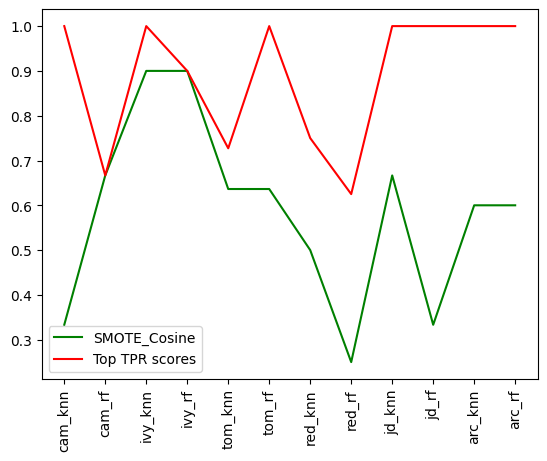

In [75]:
mp.plot(df_list_name, smc_tpr, color='green', label='SMOTE_Cosine')
mp.plot(df_list_name, top_tpr, color='red', label='Top TPR scores')
mp.xticks(rotation=90)
mp.legend()

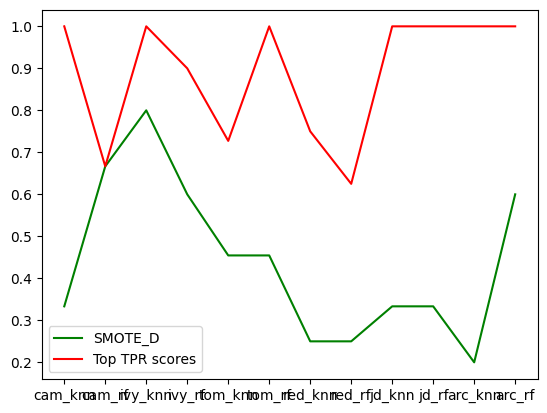

In [65]:
mp.plot(df_list_name, smd_tpr, color='green', label='SMOTE_D')
mp.plot(df_list_name, top_tpr, color='red', label='Top TPR scores')
mp.legend()

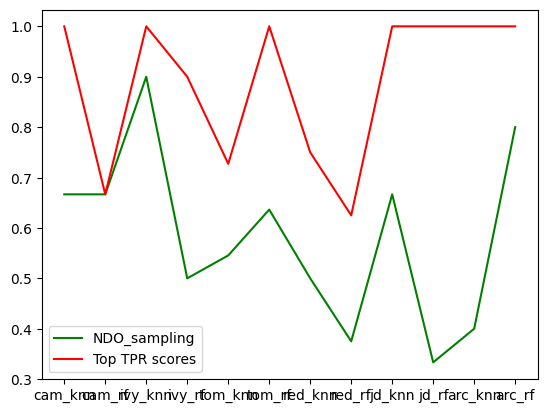

In [66]:
mp.plot(df_list_name, ndo_tpr, color='green', label='NDO_sampling')
mp.plot(df_list_name, top_tpr, color='red', label='Top TPR scores')
mp.legend()

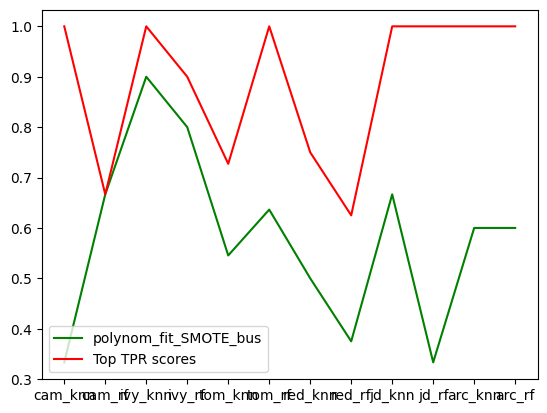

In [67]:
mp.plot(df_list_name, poly_tpr, color='green', label='polynom_fit_SMOTE_bus')
mp.plot(df_list_name, top_tpr, color='red', label='Top TPR scores')
mp.legend()

In [69]:
df_rf =  [cam_rf, ivy_rf, tom_rf, red_rf, jd_rf, arc_rf]
df_rf_names = ['cam_rf', 'ivy_rf', 'tom_rf', 'red_rf', 'jd_rf', 'arc_rf']
rf_fnr = []
for i in range(len(df_rf)):
    rf_fnr.append(min(df_rf[i]['FNR']))

for i in range(len(df_rf_names)):
    print(df_rf_names[i],":",rf_fnr[i])

cam_rf : 0.3333333333333333
ivy_rf : 0.1
tom_rf : 0.0
red_rf : 0.375
jd_rf : 0.0
arc_rf : 0.0


In [76]:
smc_fnr_rf=[]
for i in range(len(smc_fnr)):
    if i%2!=0:
        smc_fnr_rf.append(smc_fnr[i])

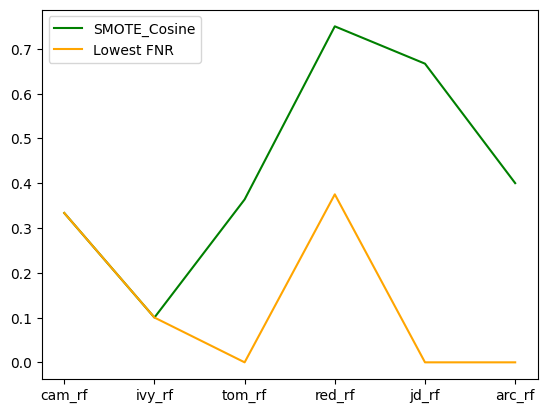

In [77]:
mp.plot(df_rf_names, smc_fnr_rf, color='Green', label='SMOTE_Cosine')
mp.plot(df_rf_names, rf_fnr, color='Orange', label='Lowest FNR')
mp.legend()

In [73]:
smc_fnr_rf

[0.6666666666666666, 0.1, 0.36363636363636365, 0.5, 0.3333333333333333, 0.4]

['cam_knn',
 'cam_rf',
 'ivy_knn',
 'ivy_rf',
 'tom_knn',
 'tom_rf',
 'red_knn',
 'red_rf',
 'jd_knn',
 'jd_rf',
 'arc_knn',
 'arc_rf']

### Second elimination: Recall

In [107]:
df_list_name

['cam_knn',
 'cam_rf',
 'ivy_knn',
 'ivy_rf',
 'tom_knn',
 'tom_rf',
 'red_knn',
 'red_rf',
 'jd_knn',
 'jd_rf',
 'arc_knn',
 'arc_rf']

In [149]:
smd_rec=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' SMOTE_D'):
            smd_rec.append(df_list[i]['Recall'][j])

In [150]:
df_list_name

['cam_knn',
 'cam_rf',
 'ivy_knn',
 'ivy_rf',
 'tom_knn',
 'tom_rf',
 'red_knn',
 'red_rf',
 'jd_knn',
 'jd_rf',
 'arc_knn',
 'arc_rf']

In [151]:
for i in range(len(df_list_name)):
    print(df_list_name[i],":",smd_rec[i])

cam_knn : 0.333333333
cam_rf : 0.666666667
ivy_knn : 0.8
ivy_rf : 0.6
tom_knn : 0.4545454545454545
tom_rf : 0.4545454545454545
red_knn : 0.25
red_rf : 0.25
jd_knn : 0.3333333333333333
jd_rf : 0.3333333333333333
arc_knn : 0.2
arc_rf : 0.6


In [152]:
smd_rec_med = statistics.median(smd_rec)

In [153]:
smd_rec_med

0.3939393939393939

In [154]:
smc_rec=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' SMOTE_Cosine'):
            smc_rec.append(df_list[i]['Recall'][j])

In [155]:
smc_rec_med = statistics.median(smc_rec)
smc_rec_med

0.6181818181818182

In [156]:
ndo_rec=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' NDO_sampling'):
            ndo_rec.append(df_list[i]['Recall'][j])

In [157]:
ndo_rec_med = statistics.median(ndo_rec)
ndo_rec_med

0.5909090909090908

In [158]:
poly_rec=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        
        if (df_list[i][df_list[i].columns[1]][j]==' polynom_fit_SMOTE_bus'):
            poly_rec.append(df_list[i]['Recall'][j])

In [159]:
poly_rec_med = statistics.median(poly_rec)
poly_rec_med

0.6

In [160]:
gsm_rec=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if (df_list[i][df_list[i].columns[1]][j]==' G_SMOTE'):
            gsm_rec.append(df_list[i]['Recall'][j])

In [161]:
gsm_rec_med = statistics.median(gsm_rec)
gsm_rec_med

0.5272727272727272

In [162]:
hi_rec=[]
for i in range(len(df_list)):
    hi_rec.append(statistics.median(df_list[i]['Recall']))
hi_rec

[0.333333333,
 0.333333333,
 0.9,
 0.6,
 0.4545454545454545,
 0.4545454545454545,
 0.25,
 0.25,
 0.3333333333333333,
 0.0,
 0.4,
 0.6]

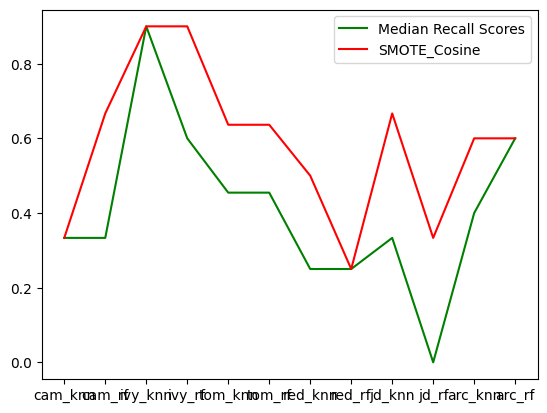

In [163]:
mp.plot(df_list_name, hi_rec, color='Green', label='Median Recall Scores')
mp.plot(df_list_name, smc_rec, color='Red', label='SMOTE_Cosine')
mp.legend()

In [164]:
median_fnr = []
for i in range(len(df_list)):
    median_fnr.append(statistics.median(df_list[i]['FNR']))
median_fnr

[0.6666666666666666,
 0.6666666666666666,
 0.1,
 0.4,
 0.5454545454545454,
 0.5454545454545454,
 0.75,
 0.75,
 0.6666666666666666,
 1.0,
 0.6,
 0.4]

In [167]:
smc_fnr

[0.6666666666666666,
 0.3333333333333333,
 0.1,
 0.1,
 0.36363636363636365,
 0.36363636363636365,
 0.5,
 0.75,
 0.3333333333333333,
 0.6666666666666666,
 0.4,
 0.4]

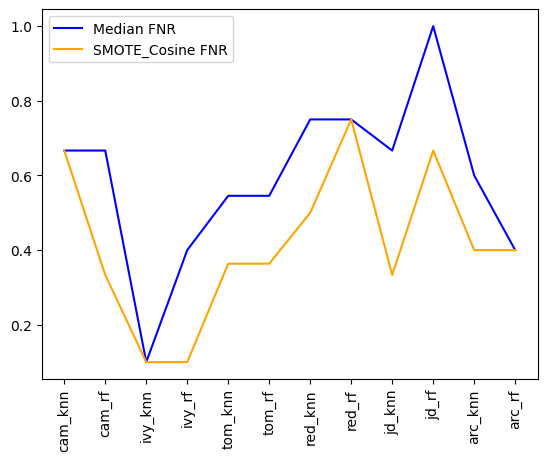

In [169]:
mp.plot(df_list_name, median_fnr, color='Blue', label='Median FNR')
mp.plot(df_list_name, smc_fnr, color='Orange', label='SMOTE_Cosine FNR')
mp.xticks(rotation=90)
mp.legend()

In [172]:
smc_f1_rf=[]
smc_f1_knn=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if(df_list[i][df_list[i].columns[1]][j]==' SMOTE_Cosine'):
            if(i%2==1):
                smc_f1_rf.append(df_list[i]['F1'][j])
            else:
                smc_f1_knn.append(df_list[i]['F1'][j])

In [173]:
smc_f1_rf

[0.4, 0.692307692, 0.368421052631579, 0.3333333333333333, 0.2, 0.5]

In [174]:
smc_f1_knn

[0.125,
 0.5454545454545454,
 0.2641509433962264,
 0.3199999999999999,
 0.2105263157894736,
 0.3157894736842105]

In [175]:
smd_f1_rf=[]
smd_f1_knn=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if(df_list[i][df_list[i].columns[1]][j]==' SMOTE_D'):
            if(i%2==1):
                smd_f1_rf.append(df_list[i]['F1'][j])
            else:
                smd_f1_knn.append(df_list[i]['F1'][j])

In [176]:
smd_f1_rf, smd_f1_knn

([0.444444444, 0.631578947, 0.4166666666666666, 0.3636363636363636, 0.25, 0.5],
 [0.166666667,
  0.5925925925925927,
  0.2631578947368421,
  0.25,
  0.1666666666666666,
  0.2])

In [177]:
poly_f1_rf=[]
poly_f1_knn=[]
for i in range(len(df_list)):
    for j in range(len(df_list[i])):
        if(df_list[i][df_list[i].columns[1]][j]==' polynom_fit_SMOTE_bus'):
            if(i%2==1):
                poly_f1_rf.append(df_list[i]['F1'][j])
            else:
                poly_f1_knn.append(df_list[i]['F1'][j])

In [178]:
poly_f1_rf, poly_f1_knn

([0.444444444, 0.761904762, 0.3333333333333333, 0.5, 0.2, 0.5],
 [0.142857143,
  0.5454545454545454,
  0.24,
  0.3333333333333333,
  0.2,
  0.2857142857142857])

### AUC PR score

In [97]:
cam = pd.read_csv("camel.csv")
ivy = pd.read_csv("ivy.csv")
tom = pd.read_csv("tomcat.csv")
red = pd.read_csv("redaktor.csv")
jd = pd.read_csv("jedit.csv")
arc = pd.read_csv("arcilook.csv")

In [98]:
knn = KNeighborsClassifier(n_neighbors = 15, metric='euclidean')
rf = RandomForestClassifier(n_estimators=50, max_depth=5)

In [99]:
cam_cat=[]
for i in cam.columns:
    if(cam[i].dtypes=='O'):
        cam_cat.append(i)

In [100]:
cam_cat.append('bug')

In [101]:
x = cam.drop(columns=cam_cat)
y = cam['bug']

In [102]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
print(x_train.shape, y_train.shape)
x_train_arr = np.array(x_train)
y_train_arr = np.array(y_train)

(271, 21) (271,)


In [103]:
cam_knn_apr=[]
for i in variants:
    x_samp, y_samp = i.sample(x_train_arr, y_train_arr)
    knn.fit(x_samp, y_samp)
    y_pred = knn.predict(x_test)
    apr = average_precision_score(y_test, y_pred)
    cam_knn_apr.append(apr)

2023-08-13 07:56:11,810:INFO:NoSMOTE: Running sampling via ('NoSMOTE', "{'raise_value_error': False, 'raise_runtime_error': False, 'random_state': None, 'class_name': 'NoSMOTE'}")
C:\Users\KIIT\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
2023-08-13 07:56:11,889:INFO:SMOTE_TomekLinks: Running sampling via ('SMOTE_TomekLinks', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {}, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': None}, 'n_jobs': 1, 'random_state': None, 'class_name': 'SMOTE_TomekLinks'}")
2023-08-13 07:56:11,893:INFO:SMOTE: Running sampling via ('SMOTE', "{'proportion': 1.0, 'n_neighbors': 5, 'nn_params': {'metric_tensor': None}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'ra

ValueError: y has only 1 sample in class 2, covariance is ill defined.

In [104]:
smmo = sv.SMMO()
x_samp, y_samp = smmo.sample(x_train, y_train)

2023-08-13 07:56:38,333:INFO:SMMO: Running sampling via ('SMMO', "{'proportion': 1.0, 'n_neighbors': 5, 'ensemble': [('sklearn.discriminant_analysis', 'QuadraticDiscriminantAnalysis', {}), ('sklearn.tree', 'DecisionTreeClassifier', {'random_state': 2}), ('sklearn.naive_bayes', 'GaussianNB', {})], 'nn_params': {}, 'n_jobs': 1, 'ss_params': {'n_dim': 2, 'simplex_sampling': 'random', 'within_simplex_sampling': 'random', 'gaussian_component': {}}, 'random_state': None, 'class_name': 'SMMO'}")


ValueError: y has only 1 sample in class 2, covariance is ill defined.

In [182]:
import tensorflow as tf
import keras
from keras import layers

In [ ]:
import plotly
import plotly.graph_objs as go

#Make Plotly figure
fig1 = go.Scatter(x=data['curb-weight'],
                  y=data['price'],
                  mode='markers')

#Make Plot.ly Layout
mylayout = go.Layout(xaxis=dict(title="curb-weight"),
                     yaxis=dict( title="price"))

#Plot and save html
plotly.offline.plot({"data": [fig1],
                     "layout": mylayout},
                     auto_open=True)